# Attack attempt, using a cGAN to train D and FGSM to refine D

## Imports

In [1]:
import tensorflow as tf
# tf.enable_eager_execution() # default for TF 2.0

tf.keras.backend.clear_session()  # For easy reset of notebook state.
from tensorflow import keras  # Import the tf version of keras.
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization, \
                                    LeakyReLU, Conv2DTranspose, Reshape
# import keras.backend as K
from tensorflow.keras.datasets import mnist

print('TF', tf.__version__)
print('Keras', keras.__version__)

TF 2.1.0
Keras 2.2.4-tf


In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook, tqdm
import pickle
from glob import glob
from pprint import pprint

import os.path
import shutil
import math
import random
from copy import copy, deepcopy

In [3]:
# Setting seeds for reproducibility 
# np.random.seed(0)
# tf.random.set_seed(0)

# Enlargen plots
plt.rcParams['figure.figsize'] = [10, 5]

## Parameters

In [4]:
# EASY_MODE: if True, Split Learning NN is used as the Discriminator in the GAN. This is good for testing, but
# bypasses the black-box paradigm! Use with caution
EASY_MODE = True

# Black-box params (optimized for MNIST)
depth = 9
filters = 33
dense = 110
num_classes = 10

# Input image dimensions
img_rows, img_cols = 28, 28
target_rows, target_cols = 28, 28    # governed by the chosen model
input_shape = (target_rows, target_cols, 1)

# Attack params:
attack_params = {
    'our_class': 0,                             # the label indices that we want to preserve (and the data we own)
    'attacker_clients': 5,                      # attacker controls X number of clients and their data
    'attack_classes': [1],                      # the label(s) we want to poison
    'flip_to': [7],                             # must be len(attack_classes) - flips the target label ('1') to new class ('7')
    'prime_trigger': 0.00, #0.11                # the D test accuracy that, after which, we will move on from priming
    'prime_first_iteration': True,              # whether to always prime on the first iteration
    'prime_by_ckpt': True,                      # whether to prime manually (False) or by loading a checkpoint file (True)
    'prime_cgan_by_ckpt': False,                # whether to load a pretrained cGAN from default/ or start from scratch (False)
    'attack_trigger': 0.8,                      # the D accuracy (wrt Black-box) that, after which, we will commence an attack
    'd_refinement_batch_num': 5,                # number of batches to refine D with: G -> BB <-> D
    'd_refinement_batch_size': 100,             # number of attack images in each refinement batch: G -> BB <-> D
    'train_dataset': None,                      # attack dataset - fixed in the beginning by choosing the attacking clients
                                                # - this is the only data we have access to throughout the training process
    'attacks_per_epoch': 10,                    # how many times to attack per epoch
    'prime_exit_trigger': 1.0,                  # how good D has to be on the current blackbox model to exit priming
    'refine_exit_trigger': 1.0,                 # how good D has to be after refinement*
    'train_bb_every_n_its': 7,                  # only train the BB model while querying if (it % train_bb_every_n_its == 0)
    'cgan_query_every_n_its': 1,                # only query BB with cGAN every N iterations
    'refine_using_fgsm': True,                  # use the uGAN to generate images to refine D with via uG -> BB -> D
    'accumulate_g_queries': True,               # whether to keep uGAN imgs every iteration, or to just use most recent (False)
    'flush_g_queries_every_bb_train': True,     # whether to keep uGAN imgs after new BB is trained, or preserved them (False)
}

# Split Learning training params:
split_training_params = {
    'minibatch_size': None,                     # number of samples to operate on at one time
                                                #  - can vary to optimize computing requirements
                                                #  - if None, will evaluate the client's whole batch regardless of its size
    'apply_gradients_after': 20,                # after averaging the gradients from X clients, we will apply them to the model
    'epochs': 1,                                # number of epochs to train for
    'shuffle_clients': True,                    # whether to shuffle the clients during training
    'eval_batch_size': 256,                     # batch size when evaluating test set (not split by clients),
    'train_dataset': None,                      # training set - indexed by client
    'test_dataset': None,                       # testing set - not batched
    'batch_limit': None,                        # how many batches to train on, maximum, per epoch
    'ckpt_folder': "blackbox_checkpoint",       # folder where to store the checkpoints
    'start_id': 'split_start_model',            # start piece
    'middle_id': 'split_middle_model',          # middle piece
    'end_id': 'split_end_model',                # end piece
    'full_id': 'split_model',                   # full model name
}

# cGAN training params:
cgan_training_params = {
    'minibatch_size': split_training_params['minibatch_size'],
    'start_id': 'd_start_model',                # start piece
    'middle_id': 'd_middle_model',              # middle piece
    'end_id': 'd_end_model',                    # end piece
    'full_id': 'd_model',                       # full model name
    'use_bb_ends': True,                        # whether to share the weights of the start and end piece from the BB model
    'batch_size': 256,                          # number of images to generate from cG at once
    'noise_dim': 100,                           # noise vector for cG
    'epochs': 25,                               # number of epochs to train cGAN
    'use_blackbox': False,                      # if True, copies the Blackbox model into D (easy check)
    'd_ckpt_folder': "discriminator_checkpoint",# folder where to store the d checkpoints
    'bb_ckpt_folder': "blackbox_checkpoint",    # folder where the blackbox default ckpt is kept
    'g_ckpt_folder': "generator_checkpoint",    # folder where to store the g checkpoints
    'batches_per_epoch': 100,                   # number of batches to train on per epoch
    'd_trigger': 0.98,                          # train D if g_accuracy is >= X
    'g_trigger': 1.01,                          # train G if g_accuracy is < X
    'loop_times': 0,                            # number of times to apply softmax -> onehot encoding
    'uncertain_loop_times': 1,                  # number to use in the uncertain_loss used by D
    'softmax_power': 2,                         # number used in softmax -> onehot encoding operation
    'd_reset_percentage': 1.0,                  # reset D if the test d_accuracy dips below X% of the original accuracy
    'early_stop_trigger': 4,                    # stop training early, if g_accuracy has not improved for X epochs
    'stop_sensitivity': 0.05,                   # "no improvement" is when the g_accuracy has not moved more than X% from prev
    'g_nudge_trigger': 3,                       # if "no improvement" for X epochs, turn on D for one turn
    'g_nudge_probability': 0.20,                # probability of nudging this sample, if enabled
    'd_priming_epoch_limit': 1000,              # number of epochs to stop at for priming
    'd_refine_epoch_limit': 300,                # number of epochs to stop at for refining D
    'save_best_g': False,                       # whether to save the best G during training, or to just use the last one
    'd_restore_after_nudge': True,              # whether to restore D back to normal at the end of the epoch if it was nudged
    'reset_g_every_it': False,                  # whether to restore cG back to init at the end of Step 5 if not -> Step 6
}

# FGSM training params:
fgsm_training_params = {
    'epsilon': 0.5,
    'norm': 'L1',                                 # can be L1, Inf
}

# # cGAN training params:
# ugan_training_params = {
#     'minibatch_size': split_training_params['minibatch_size'],
#     'start_id': 'x_start_model',                # start piece
#     'middle_id': 'x_middle_model',              # middle piece
#     'end_id': 'x_end_model',                    # end piece
#     'full_id': 'x_model',                       # full model name
#     'use_bb_ends': True,                        # whether to share the weights of the start and end piece from the BB model
#     'is_conditional': True,                     # whether to use the cGAN or uGAN architecture
#     'batch_size': 256,                          # number of images to generate from uG at once
#     'noise_dim': 100,                           # noise vector for uG
#     'epochs': 15,                               # number of epochs to train uGAN
#     'd_ckpt_folder': "discriminator_checkpoint",# folder where to store the d checkpoints
#     'bb_ckpt_folder': "blackbox_checkpoint",    # folder where the blackbox default ckpt is kept
#     'g_ckpt_folder': "generator_checkpoint",    # folder where to store the g checkpoints
#     'batches_per_epoch': 100,                   # number of batches to train on per epoch
#     'loop_times': 0,                            # number of times to apply softmax -> onehot encoding
#     'uncertain_loop_times': 1,                  # number to use in the uncertain_loss used by D
#     'softmax_power': 2,                         # number used in softmax -> onehot encoding operation
#     'early_stop_trigger': 4,                    # stop training early, if g_accuracy has not improved for X epochs
#     'stop_sensitivity': 0.05,                   # "no improvement" is when the g_accuracy has not moved more than X% from prev
#     'save_best_g': False,                       # whether to save the best G during training, or to just use the last one
#     'reset_g_every_it': True,                   # whether to restore uG back to init at the end of Step 5 if not -> Step 6
# }

# Data parsing params
clients_per_class = 100                         # number of clients per label. Each client only has access to one label
                                                # - each unique class is divided into X number of subsets

# Dataset params
separated_folder = "./separated_dataset"
os.makedirs(separated_folder, exist_ok=True)
separated_train_path = os.path.join(separated_folder, "train_separated.pkl")
separated_test_path = os.path.join(separated_folder, "test_separated.pkl")

## Load Data

In [5]:
# The data, split between train and test sets
(x_train, y_train), (x_test, y_test) = mnist.load_data()

if keras.backend.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255    # range is [0, 1]
x_test /= 255     # range is [0, 1]

if target_rows != img_rows or target_cols != img_cols:
    # resize x_train
    x_train_resized = []
    for x_ in x_train:
        # scale image to be the same WxH as we need:
        x_ = cv2.resize(x_, dsize=(target_rows, target_cols), interpolation=cv2.INTER_CUBIC)
        x_train_resized.append(x_)
    x_train = np.asarray(x_train_resized)

    # resize x_test
    x_test_resized = []
    for x_ in x_test:
        # scale image to be the same WxH as we need:
        x_ = cv2.resize(x_, dsize=(target_rows, target_cols), interpolation=cv2.INTER_CUBIC)
        x_test_resized.append(x_)
    x_test = np.asarray(x_test_resized)

# convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

In [6]:
# summary of data shapes:
print('X:', x_train.shape, x_test.shape)
print('y:', y_train.shape, y_test.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

BUFFER_SIZE = x_train.shape[0]

X: (60000, 28, 28, 1) (10000, 28, 28, 1)
y: (60000, 10) (10000, 10)
60000 train samples
10000 test samples


#### Separate the data by class

In [7]:
# Separating the data by class
if os.path.isfile(separated_train_path):
    with open(separated_train_path, 'rb') as f:
        x_train_dict, y_train_dict = pickle.load(f)
        print('loaded training seperation')
else:
    x_train_dict = {}
    y_train_dict = {}
    for target_label in tqdm_notebook(range(10)):
        x_train_dict[target_label] = []
        y_train_dict[target_label] = []
        for i, label in enumerate(y_train):
            if list(label).index(1) == target_label:
                x_train_dict[target_label].append(x_train[i])
                y_train_dict[target_label].append(y_train[i])
    
    with open(separated_train_path, 'wb') as f:
        pickle.dump([x_train_dict, y_train_dict], f)
        print('saved training seperation')

if os.path.isfile(separated_test_path):
    with open(separated_test_path, 'rb') as f:
        x_test_dict, y_test_dict = pickle.load(f)
        print('loaded testing seperation')
else:
    x_test_dict = {}
    y_test_dict = {}
    for target_label in tqdm_notebook(range(10)):
        x_test_dict[target_label] = []
        y_test_dict[target_label] = []
        for i, label in enumerate(y_test):
            if list(label).index(1) == target_label:
                x_test_dict[target_label].append(x_test[i])
                y_test_dict[target_label].append(y_test[i])

    with open(separated_test_path, 'wb') as f:
        pickle.dump([x_test_dict, y_test_dict], f)
        print('saved testing seperation')
    
# convert dicts to lists
x_train_seperated = [np.array(x_train_dict[i]) for i in range(10)]
y_train_seperated = [np.array(y_train_dict[i]) for i in range(10)]

x_test_seperated = [np.array(x_test_dict[i]) for i in range(10)]
y_test_seperated = [np.array(y_test_dict[i]) for i in range(10)]

loaded training seperation
loaded testing seperation


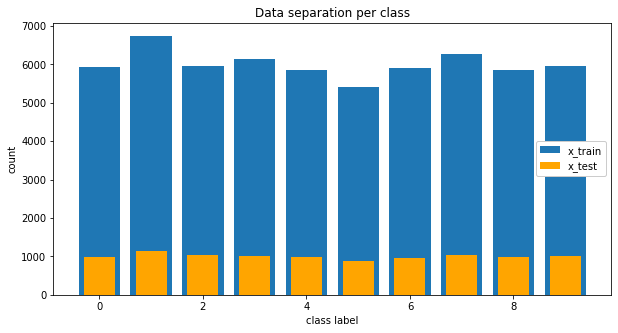

In [8]:
# summary of data shapes:
plt.figure()
plt.title('Data separation per class')
plt.bar(x_train_dict.keys(), [len(v) for v in x_train_dict.values()], color='tab:blue')
plt.bar(x_test_dict.keys(), [len(v) for v in x_test_dict.values()], color='orange', width=0.6)
plt.legend(['x_train', 'x_test'], loc='center right', framealpha=1.0)
plt.xlabel('class label')
plt.ylabel('count')
plt.show()

#### Separate the data into batches for clients to use

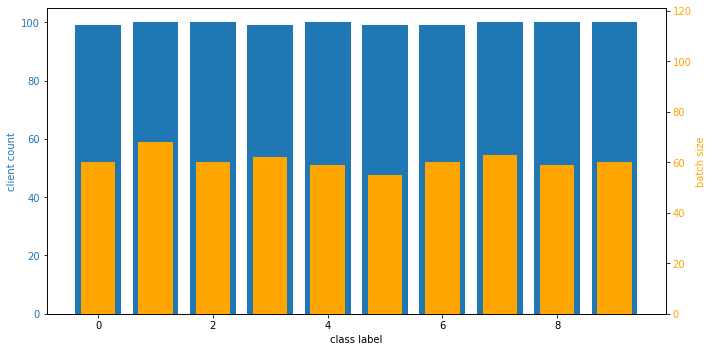

Clients per class:  99.6 ~= 100
Total number of clients: 996
Average batch size: 60.6


In [9]:
# Separate the data into a long list of batches, each batch representing a client training with that batch of images.
# After each batch, a new client will have the opportunity to train their batch of images.
# Batches are shuffled to simulate many clients training the model at once.

client_counts = {}
batch_sizes = {}
x_batches = []
y_batches = []

def ceil(a,b):
    return -(-a//b)

for class_idx in range(len(x_train_seperated)):
    # Get batches from class data:
    n_samples_per_class = len(x_train_seperated[class_idx])
    samples_per_client = n_samples_per_class / clients_per_class
    better_batch_size = int(math.ceil(samples_per_client))

    count = 0
    for i in range(ceil(n_samples_per_class, better_batch_size)):
        x_batches.append((class_idx, x_train_seperated[class_idx][i * better_batch_size: (i+1) * better_batch_size]))
        y_batches.append((class_idx, y_train_seperated[class_idx][i * better_batch_size: (i+1) * better_batch_size]))
        count += 1
    client_counts[class_idx] = count
    batch_sizes[class_idx] = better_batch_size
        
# double check that the clients_per_class is upheld per class
# (blue bars should be uniform, orange should change according to class):
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('class label')
ax1.set_ylabel('client count', color=color)
plt.bar(client_counts.keys(), [v for v in client_counts.values()], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'orange'
ax2.set_ylabel('batch size', color=color)  # we already handled the x-label with ax1
plt.bar(batch_sizes.keys(), [v for v in batch_sizes.values()], color=color, width=0.6)
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(0, np.mean([v for v in batch_sizes.values()])*2)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

print('Clients per class:  {} ~= {}'.format(np.mean([v for v in client_counts.values()]), clients_per_class))
print('Total number of clients: {}'.format(np.sum([v for v in client_counts.values()])))
print('Average batch size: {}'.format(np.mean([v for v in batch_sizes.values()])))

split_batch_size = np.floor(np.mean([v for v in batch_sizes.values()]))

#### Define the attacker's dataset

In [10]:
x_batches_filtered_i = [i for i, batch in enumerate(x_batches) if batch[0] == attack_params['our_class']]
y_batches_filtered_i = [i for i, batch in enumerate(y_batches) if batch[0] == attack_params['our_class']]
assert x_batches_filtered_i == y_batches_filtered_i

x_batches_filtered = list(map(x_batches.__getitem__, x_batches_filtered_i))
y_batches_filtered = list(map(y_batches.__getitem__, y_batches_filtered_i))

print('{} clients to choose from:'.format(len(x_batches_filtered)))
print('Classes of attack clients:', [f[0] for f in x_batches_filtered])
print()

attack_clients = np.random.choice(len(x_batches_filtered), attack_params['attacker_clients'], replace=False)
print('Choosing the following clients as the attackers:\n{}'.format(attack_clients))
x_attack_batches = list(map(x_batches_filtered.__getitem__, attack_clients))
y_attack_batches = list(map(y_batches_filtered.__getitem__, attack_clients))

99 clients to choose from:
Classes of attack clients: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Choosing the following clients as the attackers:
[61 20 39 78 42]


In [11]:
# remove the attackers from the original training dataset
# BREAKS THE ORIGINAL X_BATCHES AND Y_BATCHES!
print('Original dataset length:', len(x_batches), len(y_batches))

x_attackers_i = list(map(x_batches_filtered_i.__getitem__, attack_clients))
y_attackers_i = list(map(y_batches_filtered_i.__getitem__, attack_clients))

x_batches = [batch for i, batch in enumerate(x_batches) if i not in x_attackers_i]
y_batches = [batch for i, batch in enumerate(y_batches) if i not in y_attackers_i]

print('New dataset length:     ', len(x_batches), len(y_batches))

Original dataset length: 996 996
New dataset length:      991 991


#### Define our datasets

In [12]:
# Batch and shuffle the data for Split Learning
split_train_dataset = (x_batches, y_batches)
split_test_dataset = (x_test, y_test)

# place into train params:
split_training_params['train_dataset'] = split_train_dataset
split_training_params['test_dataset'] = split_test_dataset

# Build attack dataset
attack_train_dataset = (x_attack_batches, y_attack_batches)
attack_params['train_dataset'] = attack_train_dataset

In [13]:
# Show min and max of the dataset (ensure you are using the right normalization)
min_ = np.inf
max_ = -np.inf
for batch in x_batches:
    min__ = np.min(batch[1])
    max__ = np.max(batch[1])
    min_ = min(min_, min__)
    max_ = max(max_, max__)
print('Min: {}; Max: {}'.format(min_, max_))

Min: 0.0; Max: 1.0


## Build Model

In [14]:
# FUNCTIONAL versions of the graphs. When calling them, you will need to specify input_layer= and training=

def start_piece(identifier, input_shape, filters=4):
    assert filters >= 1
    
    input_1 = keras.layers.Input(input_shape)
    conv1 = Conv2D(filters, kernel_size=(3, 3), activation='relu', padding='same')(input_1)
    model = keras.models.Model(inputs=[input_1], outputs=conv1)
    model._name = identifier
    
    return model

def blackbox_piece(identifier, input_shape, depth=1, filters=4):
    assert depth >= 1
    assert filters >= 1
    
    input_2 = keras.layers.Input(input_shape)
    
    # for now, we will just give the black-box all the CNN layers
    for i in range(depth-1):
        if i == 0:
            convs = Conv2D(filters, kernel_size=(3, 3), activation='relu', padding='same')(input_2)
        else:
            convs = Conv2D(filters, kernel_size=(3, 3), activation='relu', padding='same')(convs)
            
    model = keras.models.Model(inputs=[input_2], outputs=convs)
    model._name = identifier
    
    return model

def approximator_piece(identifier, input_shape, depth=1, filters=4):
    assert depth >= 1
    assert filters >= 1
    
    input_2 = keras.layers.Input(input_shape)
    
    # for now, we will just give the black-box all the CNN layers
    for i in range(depth-1):
        if i == 0:
            convs = Conv2D(filters, kernel_size=(3, 3), activation='relu', padding='same')(input_2)
        else:
            convs = Conv2D(filters, kernel_size=(3, 3), activation='relu', padding='same')(convs)
            
    model = keras.models.Model(inputs=[input_2], outputs=convs)
    model._name = identifier
    
    return model

def end_piece(identifier, input_shape, dense_breadth=128, num_classes=10):
    assert dense_breadth >= num_classes
    
    input_3 = keras.layers.Input(input_shape)
    
    pool1 = MaxPooling2D(pool_size=(2, 2))(input_3)
    drop1 = Dropout(0.25)(pool1)
    flat1 = Flatten()(drop1)
    dense1 = Dense(dense_breadth, activation='relu')(flat1)
    drop2 = Dropout(0.5)(dense1)
    dense2 = Dense(num_classes, activation='softmax')(drop2)
    
    model = keras.models.Model(inputs=[input_3], outputs=dense2)
    model._name = identifier
    
    return model

## Graph Creation

In [15]:
# Ensure the params are acceptable:
assert depth >= 1
assert filters >= 1
assert dense >= num_classes

In [16]:
class SplitLearning:
    
    def __init__(self, split_training_params):
        self.minibatch_size = split_training_params['minibatch_size']
        self.batches_per_train_step = split_training_params['apply_gradients_after']
        self.eval_batch_size = split_training_params['eval_batch_size']
        self.shuffle_clients = split_training_params['shuffle_clients']
        
        self.ckpt_folder = split_training_params['ckpt_folder']
        self.start_id = split_training_params['start_id']
        self.middle_id = split_training_params['middle_id']
        self.end_id = split_training_params['end_id']
        self.full_id = split_training_params['full_id']
        
        # define the NN model
        self.start_piece = None
        self.middle_piece = None
        self.end_piece = None
        self.model = self.blackbox_model()
        
        # define loss function
        self.cross_entropy = keras.losses.CategoricalCrossentropy(from_logits=True)
        
        # define optimizers
        self.optimizer = tf.keras.optimizers.Adam(1e-4)
        
        # define metrics
        self.acc_train_avg = None
        self.loss_train_avg = None
        
        # setup checkpointing
        self.init_ckpt()
        
        # setup ops
        self.setup_ops()
        
    ###########################################################################################
    # Black-box model
        
    def blackbox_model(self):
        # create all three models
        
        #   start piece...
        self.start_piece = start_piece(self.start_id, input_shape, filters)
        output_shape = self.start_piece.layers[-1].output_shape[1:]
        
        #   middle...
        self.middle_piece = blackbox_piece(self.middle_id, output_shape, depth, filters)
        output_shape = self.middle_piece.layers[-1].output_shape[1:]
        
        #   end piece...
        self.end_piece = end_piece(self.end_id, output_shape, dense, num_classes)
        
        # glue the three models together
        input_ = keras.layers.Input(input_shape)
        hidden1 = self.start_piece(input_)
        hidden2 = self.middle_piece(hidden1)
        output_ = self.end_piece(hidden2)
        
        # create the full model
        model = keras.models.Model(inputs=[input_], outputs=output_)
        model._name = self.full_id
        model.summary()
        
        return model
    
    def model_loss(self, y_true, y_pred):
        return self.cross_entropy(y_true, y_pred)
        
    ###########################################################################################
    # Train
    
    def setup_ops(self):
        # INSPIRED BY: https://stackoverflow.com/questions/42156957/how-to-update-model-parameters-with-accumulated-gradients
        # https://www.tensorflow.org/tutorials/customization/custom_training_walkthrough
        
        self.tvs = self.model.trainable_variables
        self.accum_vars = [tf.Variable(tf.zeros_like(tv.initialized_value()), trainable=False) for tv in self.tvs]
        self.accum_counter = tf.Variable(0.0, trainable=False)
    
    def train(self, datasets, iteration, g_dataset=None, batch_limit=None):
        # setup checkpointing
        self.setup_ckpt(iteration)
        
        # setup bb_dataset (stores labels if g_dataset is passed in)
        bb_dataset = []
        
        g_dataset_acc = tf.keras.metrics.Accuracy()
        
        # initialize the metrics each new epoch
        if self.acc_train_avg is not None:
            del self.acc_train_avg
        if self.loss_train_avg is not None:
            del self.loss_train_avg
        self.acc_train_avg = tf.keras.metrics.Accuracy()
        self.loss_train_avg = tf.keras.metrics.Mean()
        
        # append all datasets together for training:
        x_batches = []
        y_batches = []
        for dataset in datasets:
            x_batches_, y_batches_ = dataset
            x_batches = x_batches + x_batches_
            y_batches = y_batches + y_batches_
        # if g_dataset is not None, add those batches to the end:
        if g_dataset is not None:
            g_x_batches, g_y_batches = g_dataset
            g_batch_idxs = list(range(len(x_batches), len(x_batches)+len(g_x_batches)))
            x_batches = x_batches + g_x_batches
            y_batches = y_batches + g_y_batches
        else:
            g_batch_idxs = []
            
        # setup progress bar
        total_batches = batch_limit if batch_limit is not None and batch_limit < len(x_batches) else len(x_batches)
        pbar = tqdm_notebook(total=total_batches)
        
        batch_idxs = list(range(len(x_batches)))
        if self.shuffle_clients:
            # shuffle the batches each time
            random.shuffle(batch_idxs)
            
        for i, batch_idx in enumerate(batch_idxs):
            x_batch = x_batches[batch_idx][1]
            y_batch = y_batches[batch_idx][1]
            
            if batch_idx in g_batch_idxs:
                # this is a g_x_batch! don't apply gradients, but store the prediction
                logit_batch = self.pred_step(x_batch)
                g_dataset_acc(tf.argmax(y_batch, 1), tf.argmax(logit_batch, 1))
                bb_dataset.append((x_batch, y_batch, logit_batch))
            else:
                self.train_step(i, x_batch, y_batch, len(batch_idxs) - 1)
            pbar.update(1)
            pbar.set_description('train_acc={:.2f}%'.format(self.acc_train_avg.result()*100))
            
            if batch_limit is not None and i-1 >= batch_limit:
                break
        pbar.close()
        print('train_acc={:.4f}%'.format(self.acc_train_avg.result()*100))
        print('accuracy of blackbox on G dataset: {:.4f}%'.format(g_dataset_acc.result()*100))
        
        # save checkpoints
        self.checkpoint()
        
        return bb_dataset
        
    def pred_step(self, x_batch):
        logit_batch = []
        # Iterate over the client's batch in minibatches:
        j = 0
        while(j < len(x_batch)):
            if self.minibatch_size is None:
                # use whole batch (no minibatch)
                x_minibatch = x_batch
            else:
                x_minibatch = x_batch[j:(j+self.minibatch_size)]

            logits = self.model(x_minibatch, training=True) # TODO: should this be False?
            logit_batch = logit_batch + list(logits.numpy())

            if self.minibatch_size is None:
                break
            else:
                j += self.minibatch_size
                
        return logit_batch
        
    def train_step(self, i, x_batch, y_batch, limit):
        # Iterate over the client's batch in minibatches:
        j = 0
        while(j < len(x_batch)):
            if self.minibatch_size is None:
                # use whole batch (no minibatch)
                x_minibatch = x_batch
                y_minibatch = y_batch
            else:
                x_minibatch = x_batch[j:(j+self.minibatch_size)]
                y_minibatch = y_batch[j:(j+self.minibatch_size)]

            # run the gradients
            loss_value, grads = self.grad(x_minibatch, y_minibatch)

            # accumulate them
            self.accumulate_grads(grads)

            if self.minibatch_size is None:
                break
            else:
                j += self.minibatch_size

        # perform a train step every batches_per_train_step number of batches:
        if (i > 0 and i % self.batches_per_train_step == 0) or i == limit:
            # Run the train_step ops to update the weights based on our accumulated gradients
            self.optimize()
            self.zero_out()
    
    def grad(self, inputs, targets):
        with tf.GradientTape() as tape:
            logits = self.model(inputs, training=True)
            loss_value = self.model_loss(targets, logits)
            
        # evaluate accuracy and append acc and loss to arrays
        self.acc_train_avg(tf.argmax(targets, 1), tf.argmax(logits, 1))
        self.loss_train_avg(loss_value)
        
        return loss_value, tape.gradient(loss_value, self.model.trainable_variables)
    
    def accumulate_grads(self, grads):
        # add to accum_vars the new gradients
        for i, grad in enumerate(grads):
            self.accum_vars[i].assign_add(grad)
        # increment the counter by 1
        self.accum_counter.assign_add(1.0)
        
    def optimize(self):
        # apply the gradients in accum_vars, dividing by the number in accum_counter
        self.optimizer.apply_gradients(
            [(accum_var / self.accum_counter, tv) \
                for (accum_var, tv) in zip(self.accum_vars, self.model.trainable_variables)]
        )
    
    def zero_out(self):
        # reset accum_vars and accum_counter back to 0
        for i, tv in enumerate(self.accum_vars):
            self.accum_vars[i].assign(tf.zeros_like(tv))
        self.accum_counter = tf.Variable(0.0, trainable=False)
        
    ###########################################################################################
    # Checkpoint
    
    def init_ckpt(self):
        self.ckpt = tf.train.Checkpoint(optimizer=self.optimizer, model=self.model)
        self.manager = None
        self.internal_iteration = None
        self.iteration_offset = 0
        
    def setup_ckpt(self, iteration):
        # setup fresh checkpointer every new iteration
        if self.internal_iteration is None or iteration != self.internal_iteration - self.iteration_offset:
            ckpt_save_folder = os.path.join('checkpoints', 'it_{}'.format(iteration + self.iteration_offset), self.ckpt_folder)
            os.makedirs(ckpt_save_folder, exist_ok=True)
        
            if self.ckpt is not None:
                del self.ckpt
            if self.manager is not None:
                del self.manager

            self.ckpt = tf.train.Checkpoint(optimizer=self.optimizer, model=self.model)
            self.manager = tf.train.CheckpointManager(self.ckpt, ckpt_save_folder, max_to_keep=1)
            self.internal_iteration = iteration + self.iteration_offset
    
    def checkpoint(self):
        save_path = self.manager.save()
        print("Saved checkpoint: {}".format(save_path))
        self.save_all_models(save_path)
        
    def save_all_models(self, save_path):
        # in addition to checkpointing, save all of the models into their own ckpt files
        it_folder = ""
        for folder in self.splitall(save_path):
            if "it" not in folder:
                it_folder = os.path.join(it_folder, folder)
            else:
                it_folder = os.path.join(it_folder, folder)
                break
        
        # save all three models
        start_piece_folder = os.path.join(it_folder, self.start_id + "_checkpoint")
        os.makedirs(start_piece_folder, exist_ok=True)
        self.start_piece.save_weights(os.path.join(start_piece_folder, 'checkpoint'))
        print("Saved checkpoint: {}".format(os.path.join(start_piece_folder, 'checkpoint')))
        
        middle_piece_folder = os.path.join(it_folder, self.middle_id + "_checkpoint")
        os.makedirs(middle_piece_folder, exist_ok=True)
        self.middle_piece.save_weights(os.path.join(middle_piece_folder, 'checkpoint'))
        print("Saved checkpoint: {}".format(os.path.join(middle_piece_folder, 'checkpoint')))
        
        end_piece_folder = os.path.join(it_folder, self.end_id + "_checkpoint")
        os.makedirs(end_piece_folder, exist_ok=True)
        self.end_piece.save_weights(os.path.join(end_piece_folder, 'checkpoint'))
        print("Saved checkpoint: {}".format(os.path.join(end_piece_folder, 'checkpoint')))
        
    @staticmethod
    def splitall(path):
        allparts = []
        while 1:
            parts = os.path.split(path)
            if parts[0] == path:  # sentinel for absolute paths
                allparts.insert(0, parts[0])
                break
            elif parts[1] == path: # sentinel for relative paths
                allparts.insert(0, parts[1])
                break
            else:
                path = parts[0]
                allparts.insert(0, parts[1])
        return allparts
        
    def restore(self, it_restore=None, load_default=False):
        parent_folder = os.path.join('checkpoints')
        if it_restore is None and not load_default:
            # find the most recent iteration and checkpoint
            largest_it = None
            for d in glob(os.path.join(parent_folder, '*')):
                if os.path.isfile(os.path.join(d, self.ckpt_folder, 'checkpoint')):
                    # passed, valid checkpoint
                    if '_' in d:
                        # passed, valid iteration folder
                        it = int(d.split('_')[1])
                        if largest_it is None or it > largest_it:
                            largest_it = it
            if largest_it is not None:
                checkpoint_directory = os.path.join(parent_folder, 'it_{}'.format(largest_it), self.ckpt_folder)
                self.ckpt.restore(tf.train.latest_checkpoint(checkpoint_directory))
                self.iteration_offset = largest_it
                print('Restored latest checkpoint from {}'.format(checkpoint_directory))
            else:
                print('No weights found, starting with a fresh network')
        else:
            if load_default:
                checkpoint_directory = os.path.join(parent_folder, 'default', self.ckpt_folder)
            else:
                checkpoint_directory = os.path.join(parent_folder, 'it_{}'.format(it_restore), self.ckpt_folder)
            if os.path.isfile(os.path.join(checkpoint_directory, 'checkpoint')):
                self.ckpt.restore(tf.train.latest_checkpoint(checkpoint_directory))
                if it_restore is not None:
                    self.iteration_offset = it_restore
                print('Restored latest checkpoint from {}'.format(checkpoint_directory))
            else:
                print('No weights found at: {}'.format(checkpoint_directory))
        
    ###########################################################################################
    # Evaluate
        
    def evaluate(self, dataset):
        '''
        NOTE: dataset here is tailored for standard 'test' dataset provided by Keras
        '''
        
        x, y = dataset
        
        acc_test_avg = tf.keras.metrics.Accuracy()
        loss_test_avg = tf.keras.metrics.Mean()
        for i in range(0, len(x), self.eval_batch_size):
            # get batch
            x_batch = x[i:i+self.eval_batch_size]
            y_batch = y[i:i+self.eval_batch_size]
            
            # evaluate
            logits = self.model(x_batch, training=False)
            acc_test_avg(tf.argmax(y_batch, 1), tf.argmax(logits, 1))
            loss_test_avg(self.model_loss(y_batch, logits))
        
        if self.acc_train_avg is not None and self.loss_train_avg is not None:
            print('Train Accuracy: {:.3f} | Loss: {:.3f}'.format(self.acc_train_avg.result(), self.loss_train_avg.result()))
        print('Test Accuracy: {:.3f} | Loss: {:.3f}'.format(acc_test_avg.result(), loss_test_avg.result()))
        print()
        
    def predict(self, dataset, return_tensors=True):
        '''
        Returns a list of label batches of each client that was in the dataset
        '''
        
        x, _ = dataset
        labels = []
        
        for i, client_x in enumerate(x):
            x_batch = client_x[1]
            label_batch = []
            
            # run through every minibatch:
            j = 0
            while(j < len(x_batch)):
                if self.minibatch_size is None:
                    # use whole batch (no minibatch)
                    x_minibatch = x_batch
                else:
                    x_minibatch = x_batch[j:(j+self.minibatch_size)]
                    
                # evaluate
                preds = self.model(x_batch, training=False)
                if not return_tensors:
                    preds = tf.nn.softmax(preds)
                    preds = tf.argmax(preds, axis=1)
                    
                label_batch = label_batch + list(preds.numpy())
                
                if self.minibatch_size is None:
                    break
                else:
                    j += self.minibatch_size
            
            # add to list
            labels.append(label_batch)
            
        return labels

In [17]:
class D:
    '''
    The Discriminator portion of the GAN. Accepts a network, otherwise creates a new model.
    '''
    
    def __init__(self, gan_training_params, start_piece=None, middle_piece=None, end_piece=None, d_model=None):
        
        self.ckpt_folder = gan_training_params['d_ckpt_folder']
        self.bb_ckpt_folder = gan_training_params['bb_ckpt_folder']
        self.loop_times = gan_training_params['loop_times']
        self.softmax_power = gan_training_params['softmax_power']
        self.minibatch_size = gan_training_params['minibatch_size']
        
        self.use_bb_ends = gan_training_params['use_bb_ends']
        self.start_id = gan_training_params['start_id']
        self.middle_id = gan_training_params['middle_id']
        self.end_id = gan_training_params['end_id']
        self.full_id = gan_training_params['full_id']
        
        # make FUNCTIONAL versions of the graphs. When calling them, you will need to specify input_layer= and training=
        
        # define the NN model
        if d_model is not None:
            assert start_piece is None and middle_piece is None and end_piece is None
            self.model = d_model
        else:
            self.start_piece = start_piece
            self.middle_piece = middle_piece
            self.end_piece = end_piece
            self.model = self.discriminator_model()
            
        # define optimizers
        self.optimizer = tf.keras.optimizers.Adam(1e-4)
        
        # define entropies
        self.cat_cross_entropy = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
        self.bin_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
            
        # setup checkpointing
        self.ckpt = None
        self.manager = None
        
        # save the initial weights
        if middle_piece is None:
            self.save_initial_weights()
        
    ###########################################################################################
    # Discriminator model
    
    def discriminator_model(self):
        # create all three models
        
        #   start piece...
        if self.use_bb_ends:
            assert self.start_piece is not None
        else:
            self.start_piece = start_piece(self.start_id, input_shape, filters)
        output_shape = self.start_piece.layers[-1].output_shape[1:]
        
        #   middle...
        if self.middle_piece is None:
            self.middle_piece = approximator_piece(self.middle_id, output_shape, depth, filters)
        else:
            print('WARNING: using the middle piece in D')
        output_shape = self.middle_piece.layers[-1].output_shape[1:]
        
        #   end piece...
        if self.use_bb_ends:
            assert self.end_piece is not None
        else:
            self.end_piece = end_piece(self.end_id, output_shape, dense, num_classes)
        
        # glue the three models together
        input_ = keras.layers.Input(input_shape)
        hidden1 = self.start_piece(input_)
        hidden2 = self.middle_piece(hidden1)
        output_ = self.end_piece(hidden2)
        
        # create the full model
        model = keras.models.Model(inputs=[input_], outputs=output_)
        model._name = self.full_id
        model.summary()
        
        return model
        
    ###########################################################################################
    # Loss
    
    def loss(self, fake_discrimination, labels):
        matches = self.matches_labels(fake_discrimination, labels, loop_times=self.loop_times)
        # we want the discriminator to NOT be fooled by these fake images
        cross_entropy = self.bin_cross_entropy(tf.zeros_like(matches), matches)
        return cross_entropy
    
    def entropy(self, y_true, y_pred):
        return self.cat_cross_entropy(y_true, y_pred)
        
    def matches_labels(self, fake_output, labels, loop_times=0):
        '''
        Only works if the Discriminator is already trained on real images!!
        1. Performs a softmax -> onehot conversion (differentiable approx.)
        2. Multiplies this by the onehot version of the onehot attack label
        3. Sums to reduce dimension
        
        - if the sum is close to 1, the nn thinks that the image is a part of the attack class
        - if the sum is close to 0, the nn thinks that the image is not of the attack class
        - the sum should not be in between, due to the onehot conversion we perform in step 1
        '''
        # 1.
        my_power = self.softmax_power
        for i in range(loop_times):
            fake_output = self.soft_onehot(fake_output)
        
        # 2.
        matches = tf.math.multiply(fake_output, labels)
        
        # 3.
        reduced = tf.math.reduce_sum(matches, axis=-1)
        
        return reduced
        
    def soft_onehot(self, softmax, my_power=8):
        '''
        Shown to not really work... vanishing gradients problem
        '''
        soft_extreme = softmax ** my_power
        norm = tf.reduce_sum(soft_extreme, axis=-1)
        almost_onehot = tf.math.divide(soft_extreme, tf.reshape(norm, (-1, 1)))
        return almost_onehot
    
    ###########################################################################################
    # Checkpoint
    
    def init_ckpt(self):
        self.ckpt = tf.train.Checkpoint(optimizer=self.optimizer, model=self.model)
        
    def setup_ckpt(self, iteration):
        ckpt_save_folder = os.path.join('checkpoints', 'it_{}'.format(iteration), self.ckpt_folder)
        os.makedirs(ckpt_save_folder, exist_ok=True)

        if self.ckpt is not None:
            del self.ckpt
        if self.manager is not None:
            del self.manager

        self.ckpt = tf.train.Checkpoint(optimizer=self.optimizer, model=self.model)
        self.manager = tf.train.CheckpointManager(self.ckpt, ckpt_save_folder, max_to_keep=1)
        
    def checkpoint(self):
        save_path = self.manager.save()
        print("Saved D checkpoint: {}".format(save_path))
        self.save_all_models(save_path)
        
    def save_all_models(self, save_path):
        # in addition to checkpointing, save all of the models into their own ckpt files
        it_folder = ""
        for folder in self.splitall(save_path):
            if "it" not in folder:
                it_folder = os.path.join(it_folder, folder)
            else:
                it_folder = os.path.join(it_folder, folder)
                break
        
        # save all three models
        start_piece_folder = os.path.join(it_folder, self.start_id + "_checkpoint")
        os.makedirs(start_piece_folder, exist_ok=True)
        self.start_piece.save_weights(os.path.join(start_piece_folder, 'checkpoint'))
        print("Saved D checkpoint: {}".format(os.path.join(start_piece_folder, 'checkpoint')))
        
        middle_piece_folder = os.path.join(it_folder, self.middle_id + "_checkpoint")
        os.makedirs(middle_piece_folder, exist_ok=True)
        self.middle_piece.save_weights(os.path.join(middle_piece_folder, 'checkpoint'))
        print("Saved D checkpoint: {}".format(os.path.join(middle_piece_folder, 'checkpoint')))
        
        end_piece_folder = os.path.join(it_folder, self.end_id + "_checkpoint")
        os.makedirs(end_piece_folder, exist_ok=True)
        self.end_piece.save_weights(os.path.join(end_piece_folder, 'checkpoint'))
        print("Saved D checkpoint: {}".format(os.path.join(end_piece_folder, 'checkpoint')))
        
    @staticmethod
    def splitall(path):
        allparts = []
        while 1:
            parts = os.path.split(path)
            if parts[0] == path:  # sentinel for absolute paths
                allparts.insert(0, parts[0])
                break
            elif parts[1] == path: # sentinel for relative paths
                allparts.insert(0, parts[1])
                break
            else:
                path = parts[0]
                allparts.insert(0, parts[1])
        return allparts
    
    def freeze_ends(self, yes):
        self.start_piece.is_training = not yes
        self.end_piece.is_training = not yes
    
    ###########################################################################################
    # Load/save weights
    
    def save_initial_weights(self):
        print('saving initial weights for D')
        init_folder = os.path.join('checkpoints', 'init', self.ckpt_folder)
        os.makedirs(init_folder, exist_ok=True)
        self.model.save_weights(os.path.join(init_folder, 'checkpoint'))
        
    def load_initial_weights(self):
        print('loading initial weights for D')
        init_folder = os.path.join('checkpoints', 'init', self.ckpt_folder)
        self.model.load_weights(os.path.join(init_folder, 'checkpoint'))
        
    def restore(self, it_restore=None, load_default=False, use_blackbox=False):
        iteration_offset = 0
        parent_folder = os.path.join('checkpoints')
        if it_restore is None and not load_default:
            # find the most recent iteration and checkpoint
            largest_it = None
            for d in glob(os.path.join(parent_folder, '*')):
                if os.path.isfile(os.path.join(d, self.ckpt_folder, 'checkpoint')):
                    # passed, valid checkpoint
                    if '_' in d:
                        # passed, valid iteration folder
                        it = int(d.split('_')[1])
                        if largest_it is None or it > largest_it:
                            largest_it = it
            if largest_it is not None:
                checkpoint_directory = os.path.join(parent_folder, 'it_{}'.format(largest_it), self.ckpt_folder)
                self.ckpt.restore(tf.train.latest_checkpoint(checkpoint_directory))
                iteration_offset = largest_it
                print('Restored D to latest checkpoint from {}'.format(checkpoint_directory))
            else:
                print('No weights found for D, starting with a fresh network')
        else:
            if load_default:
                if use_blackbox:
                    checkpoint_directory = os.path.join(parent_folder, 'default', self.bb_ckpt_folder)
                else:
                    checkpoint_directory = os.path.join(parent_folder, 'default', self.ckpt_folder)
            else:
                checkpoint_directory = os.path.join(parent_folder, 'it_{}'.format(it_restore), self.ckpt_folder)
            if os.path.isfile(os.path.join(checkpoint_directory, 'checkpoint')):
                self.ckpt.restore(tf.train.latest_checkpoint(checkpoint_directory))
                if it_restore is not None:
                    iteration_offset = it_restore
                print('Restored D to checkpoint from {}'.format(checkpoint_directory))
            else:
                print('No weights found at: {}'.format(checkpoint_directory))
        return iteration_offset
    
    def restore_pieces(self, it_restore_ends, it_restore_middle, start_id, middle_id, end_id):
        parent_folder = os.path.join('checkpoints')
        it_folder_ends = os.path.join(parent_folder, 'it_{}'.format(it_restore_ends))
        it_folder_middle = os.path.join(parent_folder, 'it_{}'.format(it_restore_middle))
        
        start_piece_folder = os.path.join(it_folder_ends, start_id + "_checkpoint")
        print('Restoring D piece: {}'.format(start_piece_folder))
        middle_piece_folder = os.path.join(it_folder_middle, middle_id + "_checkpoint")
        print('Restoring D piece: {}'.format(middle_piece_folder))
        end_piece_folder = os.path.join(it_folder_ends, end_id + "_checkpoint")
        print('Restoring D piece: {}'.format(end_piece_folder))
        
        assert os.path.isfile(os.path.join(start_piece_folder, 'checkpoint'))
        assert os.path.isfile(os.path.join(middle_piece_folder, 'checkpoint'))
        assert os.path.isfile(os.path.join(end_piece_folder, 'checkpoint'))
        
        self.start_piece.load_weights(os.path.join(start_piece_folder, 'checkpoint'))
        self.middle_piece.load_weights(os.path.join(middle_piece_folder, 'checkpoint'))
        self.end_piece.load_weights(os.path.join(end_piece_folder, 'checkpoint'))
        
    ###########################################################################################
    # Evaluation

    def discriminate(self, generated_images, training=True):
        return self.model(generated_images, training=training)

In [18]:
class G:
    '''
    The Generator portion of the GAN. Generates images given a conditional label.
    '''
    
    def __init__(self, gan_training_params, is_conditional=True, identifier=None):
        self.is_conditional = is_conditional
        self.identifier = identifier
        
        self.ckpt_folder = self.g_identifier() + gan_training_params['g_ckpt_folder']
        self.noise_dim = gan_training_params['noise_dim']
        self.uncertain_loop_times = gan_training_params['uncertain_loop_times']
        self.softmax_power = gan_training_params['softmax_power']
        
        # make FUNCTIONAL versions of the graphs. When calling them, you will need to specify input_layer= and training=
        self.input_shapes = []
        if is_conditional:
            self.model = self.c_generator_model()
        else:
            self.model = self.u_generator_model()
            
        # define optimizers
        self.optimizer = tf.keras.optimizers.Adam(1e-4)
        
        # define entropies
        self.cat_cross_entropy = tf.keras.losses.CategoricalCrossentropy(from_logits=True)
        self.bin_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
            
        # setup checkpointing
        self.ckpt = None
        self.manager = None
        
        # save initial weights
        self.save_initial_weights()
        
    ###########################################################################################
    # Generator model
    
    def g_identifier(self):
        return self.identifier if self.identifier is not None else ''
    
    def c_generator_model(self):
        '''
        CONDITIONAL version of G
        '''
        ACTIVATION = keras.layers.Activation("tanh")
        
        # Prepare noise input
        self.input_shapes.append((self.noise_dim,))
        input_z = keras.layers.Input((self.noise_dim,))
        dense_z_1 = keras.layers.Dense(1024)(input_z)
        act_z_1 = ACTIVATION(dense_z_1)
        dense_z_2 = keras.layers.Dense(128 * 7 * 7)(act_z_1)
        bn_z_1 = keras.layers.BatchNormalization()(dense_z_2)
        reshape_z = keras.layers.Reshape((7, 7, 128), input_shape=(128 * 7 * 7,))(bn_z_1)

        # Prepare Conditional (label) input
        self.input_shapes.append((num_classes,))
        input_c = keras.layers.Input((num_classes,))
        dense_c_1 = keras.layers.Dense(1024)(input_c)
        act_c_1 = ACTIVATION(dense_c_1)
        dense_c_2 = keras.layers.Dense(128 * 7 * 7)(act_c_1)
        bn_c_1 = keras.layers.BatchNormalization()(dense_c_2)
        reshape_c = keras.layers.Reshape((7, 7, 128), input_shape=(128 * 7 * 7,))(bn_c_1)

        # Combine input source
        concat_z_c = keras.layers.Concatenate()([reshape_z, reshape_c])

        # Image generation with the concatenated inputs
        up_1 = keras.layers.UpSampling2D(size=(2, 2))(concat_z_c)
        conv_1 = keras.layers.Conv2D(64, (5, 5), padding='same')(up_1)
        act_1 = ACTIVATION(conv_1)
        up_2 = keras.layers.UpSampling2D(size=(2, 2))(act_1)
        #
        drop_1 = keras.layers.Dropout(0.1)(up_2)
        #
        conv_2 = keras.layers.Conv2D(1, (5, 5), padding='same')(drop_1)
        act_2 = keras.layers.Activation("tanh")(conv_2)
        model = keras.models.Model(inputs=[input_z, input_c], outputs=act_2)
        model._name = "{}g_model".format(self.g_identifier())
        return model
    
    def u_generator_model(self):
        '''
        NORMAL version of G
        '''
        model = tf.keras.Sequential()
        
        self.input_shapes.append((self.noise_dim,))
        model.add(Dense(7*7*256, use_bias=False, input_shape=(self.noise_dim,)))
        model.add(BatchNormalization())
        model.add(LeakyReLU())
        model.add(Reshape((7, 7, 256)))

        model.add(Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
        model.add(BatchNormalization())
        model.add(LeakyReLU())

        model.add(Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
        model.add(BatchNormalization())
        model.add(LeakyReLU())

        model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
        model._name = "{}g_model".format(self.g_identifier())

        return model
        
    ###########################################################################################
    # Loss
    
    def loss(self, fake_discrimination, labels):
        # we want the discriminator to be fooled by these fake images
        cross_entropy = self.cat_cross_entropy(fake_discrimination, labels)
        return cross_entropy
    
    def u_loss(self, fake_discrimination):
        '''
        Loss that measures how close the output is to having a single peak.
        In other words we are measuring how certain the model thinks it is
        correct, regardless of the answer
        1. Performs a softmax -> onehot conversion (differentiable approx.)
        2. Compare to the original output -- return this cat crossentropy
        '''
        fake_output = tf.identity(fake_discrimination)
        
        # 1.
        my_power = self.softmax_power
        for i in range(self.uncertain_loop_times):
            fake_output = self.soft_onehot(fake_output)
            
        # 2.
        return self.cat_cross_entropy(fake_output, fake_discrimination)
        
    def soft_onehot(self, softmax, my_power=8):
        '''
        Shown to not really work... vanishing gradients problem
        '''
        soft_extreme = softmax ** my_power
        norm = tf.reduce_sum(soft_extreme, axis=-1)
        almost_onehot = tf.math.divide(soft_extreme, tf.reshape(norm, (-1, 1)))
        return almost_onehot
    
    ###########################################################################################
    # Checkpoint
    
    def init_ckpt(self):
        self.ckpt = tf.train.Checkpoint(optimizer=self.optimizer, model=self.model)
        
    def setup_ckpt(self, iteration):
        ckpt_save_folder = os.path.join('checkpoints', 'it_{}'.format(iteration), self.ckpt_folder)
        os.makedirs(ckpt_save_folder, exist_ok=True)

        if self.ckpt is not None:
            del self.ckpt
        if self.manager is not None:
            del self.manager

        self.ckpt = tf.train.Checkpoint(optimizer=self.optimizer, model=self.model)
        self.manager = tf.train.CheckpointManager(self.ckpt, ckpt_save_folder, max_to_keep=1)
        
    def checkpoint(self):
        save_path = self.manager.save()
        print("Saved {}G checkpoint: {}".format(self.g_identifier(), save_path))
    
    ###########################################################################################
    # Load/save weights
    
    def save_initial_weights(self):
        print('saving initial weights for {}G'.format(self.g_identifier()))
        init_folder = os.path.join('checkpoints', 'init', self.ckpt_folder)
        os.makedirs(init_folder, exist_ok=True)
        self.model.save_weights(os.path.join(init_folder, 'checkpoint'))
        
    def load_initial_weights(self):
        print('loading initial weights for {}G'.format(self.g_identifier()))
        init_folder = os.path.join('checkpoints', 'init', self.ckpt_folder)
        self.model.load_weights(os.path.join(init_folder, 'checkpoint'))
        
    def restore(self, it_restore=None, load_default=False):
        iteration_offset = 0
        parent_folder = os.path.join('checkpoints')
        if it_restore is None and not load_default:
            # find the most recent iteration and checkpoint
            largest_it = None
            for d in glob(os.path.join(parent_folder, '*')):
                if os.path.isfile(os.path.join(d, self.ckpt_folder, 'checkpoint')):
                    # passed, valid checkpoint
                    if '_' in d:
                        # passed, valid iteration folder
                        it = int(d.split('_')[1])
                        if largest_it is None or it > largest_it:
                            largest_it = it
            if largest_it is not None:
                checkpoint_directory = os.path.join(parent_folder, 'it_{}'.format(largest_it), self.ckpt_folder)
                self.ckpt.restore(tf.train.latest_checkpoint(checkpoint_directory))
                iteration_offset = largest_it
                print('Restored {}G to latest checkpoint from {}'.format(self.g_identifier(), checkpoint_directory))
            else:
                print('No weights found for {}G, starting with a fresh network'.format(self.g_identifier()))
        else:
            if load_default:
                checkpoint_directory = os.path.join(parent_folder, 'default', self.ckpt_folder)
            else:
                checkpoint_directory = os.path.join(parent_folder, 'it_{}'.format(it_restore), self.ckpt_folder)
            if os.path.isfile(os.path.join(checkpoint_directory, 'checkpoint')):
                self.ckpt.restore(tf.train.latest_checkpoint(checkpoint_directory))
                if it_restore is not None:
                    iteration_offset = it_restore
                print('Restored {}G to checkpoint from {}'.format(self.g_identifier(), checkpoint_directory))
            else:
                print('No weights found at: {}'.format(checkpoint_directory))
        return iteration_offset
        
    ###########################################################################################
    # Evaluation
        
    def generate(self, inputs, training=True):
        generated_images = self.model(inputs, training=training)
        return generated_images

In [19]:
class cGAN:
    '''
    The cGAN. Trains the G and D.
    '''
    
    def __init__(self, gan_training_params, start_piece=None, middle_piece=None, end_piece=None):
        self.is_conditional = True
        self.noise_dim = gan_training_params['noise_dim']
        self.batch_size = gan_training_params['batch_size']
        self.batches_per_epoch = gan_training_params['batches_per_epoch']
        self.d_trigger = gan_training_params['d_trigger']
        self.g_trigger = gan_training_params['g_trigger']
        self.early_stop_trigger = gan_training_params['early_stop_trigger']
        self.stop_sensitivity = gan_training_params['stop_sensitivity']
        self.g_nudge_trigger = gan_training_params['g_nudge_trigger']
        self.g_nudge_probability = gan_training_params['g_nudge_probability']
        self.minibatch_size = gan_training_params['minibatch_size']
        self.d_restore_after_nudge = gan_training_params['d_restore_after_nudge']

        # define the D and G models
        self.g = G(gan_training_params, is_conditional=self.is_conditional, identifier='c_')
        
        self.d = D(gan_training_params, start_piece, middle_piece, end_piece)
            
        # stack G on top of D
        self.gd = self.stack_models()
        print(self.gd.summary())
        
        # define losses
        self.mse = tf.keras.losses.MeanSquaredError()
        
        # define metrics
        self.gen_loss_train_avg = None
        self.gen_acc_train_avg = None
        self.disc_loss_train_avg = None
        self.disc_loss_refine_avg = None
        
        # define plotting metrics
        self.gen_loss_train_arr = []
        self.gen_acc_train_arr = []
        self.disc_loss_train_arr = []
        self.disc_acc_test_arr = []
        
        # seed for image generation
        num_examples_to_generate = 16
        self.seed = tf.random.normal([num_examples_to_generate, self.noise_dim])
        
        # labels for image generation
        label_pattern = [i % (num_classes) for i in range(num_examples_to_generate)]
        self.eval_labels = tf.one_hot(label_pattern, num_classes, dtype=tf.dtypes.float32)
        
        # setup checkpointing
        self.internal_iteration = None
        self.iteration_offset = 0
        self.save_ckpts = True
        
        # initialize d and g checkpoints
        self.d.init_ckpt()
        self.g.init_ckpt()
        
        # setup early stop metrics
        self.early_stop = False
        self.no_change_inc = 0
        self.prev_g_acc = None
        self.best_g_acc = None
        self.nudge_flag = False
        
    def stack_models(self):
        inputs = []
        for input_shape in self.g.input_shapes:
            inputs.append(keras.layers.Input(input_shape))
        
        outputG = self.g.model(inputs)
        
        # output of G needs to be converted from [-1, 1] to [0, 1] spectrum
        outputG_converted = 0.5 * outputG + 0.5
        
        outputD = self.d.model(outputG_converted)
        
        model = keras.models.Model(inputs=inputs, outputs=outputD)
        model._name = "cgan_model"
        
        return model
        
    ###########################################################################################
    # Trainer
        
    def train(self, iteration, save_best=False):
        # setup checkpointing
        self.setup_ckpts(iteration)
        
        # freeze the ends of D
        self.d.freeze_ends(True)
        
        # initialize the metrics each new epoch
        if self.gen_acc_train_avg is not None:
            del self.gen_acc_train_avg
        if self.gen_loss_train_avg is not None:
            del self.gen_loss_train_avg
        if self.disc_loss_train_avg is not None:
            del self.disc_loss_train_avg
        
        self.gen_loss_train_avg = tf.keras.metrics.Mean()
        self.gen_acc_train_avg = tf.keras.metrics.Accuracy()
        self.disc_loss_train_avg = tf.keras.metrics.Mean()
        
        pbar = tqdm_notebook(total=self.batches_per_epoch)
        
        for i in range(self.batches_per_epoch):
            # nudge generator if nothing is happening:
            if self.nudge():
                if not self.nudge_flag:
                    self.nudge_flag = True
                train_discriminator = True
            else:
                train_discriminator = (self.gen_acc_train_avg.result() >= self.d_trigger)
            
            # logic for training the generator
            train_generator = (self.gen_acc_train_avg.result() < self.g_trigger)
            
            self.c_train_step(train_discriminator=train_discriminator, train_generator=train_generator)
            pbar.update(1)
            pbar.set_description('g_acc={:.2f}, g_loss={:.2f}, d_loss={:.2f}'.format(self.gen_acc_train_avg.result(),
                                                                                     self.gen_loss_train_avg.result(),
                                                                                     self.disc_loss_train_avg.result()))
        
        print('g_acc={:.2f}, g_loss={:.2f}, d_loss={:.2f}'.format(self.gen_acc_train_avg.result(),
                                                                  self.gen_loss_train_avg.result(),
                                                                  self.disc_loss_train_avg.result()))
        
        # reload from pre-nudge state
        if self.nudge_flag:
            if self.d_restore_after_nudge:
                self.d.restore(it_restore=iteration)
            self.nudge_flag = False
        
        # save checkpoints
        # only checkpoint d if we are the cGAN
        self.checkpoint_d()
        if save_best:
            if self.best_g_acc is None or self.gen_acc_train_avg.result() >= self.best_g_acc:
                self.best_g_acc = self.gen_acc_train_avg.result()
                self.checkpoint_g()
        else:
            self.checkpoint_g()
            
        # unfreeze the ends of D
        self.d.freeze_ends(False)
        
        # check for early stop
        self.early_stop_check()
    
    def c_train_step(self, train_discriminator, train_generator):
        noise = tf.random.normal([self.batch_size, self.noise_dim])
        random_classes = tf.random.uniform(shape=(self.batch_size, ), maxval=num_classes, dtype=tf.dtypes.int32)
        labels = tf.one_hot(random_classes, num_classes, dtype=tf.dtypes.float32)

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            fake_discrimination = self.gd([noise, labels], training=train_generator)

            gen_loss = self.g.loss(fake_discrimination, labels)
            disc_loss = self.d.loss(fake_discrimination, labels)
            
            # evaluate accuracy and append acc and loss to arrays
            self.gen_loss_train_avg(gen_loss)
            self.gen_acc_train_avg(tf.argmax(labels, 1), tf.argmax(fake_discrimination, 1))
            self.disc_loss_train_avg(disc_loss)

        gradients_of_generator = gen_tape.gradient(gen_loss, self.g.model.trainable_variables)
#         graidents_of_discriminator = disc_tape.gradient(disc_loss, self.d.middle_piece.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(disc_loss, self.d.model.trainable_variables)

        if train_generator:
            self.g.optimizer.apply_gradients(zip(gradients_of_generator, self.g.model.trainable_variables))
        if train_discriminator:
#             self.d.optimizer.apply_gradients(zip(gradients_of_discriminator, self.d.middle_piece.trainable_variables))
            self.d.optimizer.apply_gradients(zip(gradients_of_discriminator, self.d.model.trainable_variables))
            
    def nudge(self):
        nudge = False
        if self.no_change_inc >= self.g_nudge_trigger:
            nudge = random.random() < self.g_nudge_probability
        return nudge
    
    def refine_discriminator(self, input_datasets, blackbox_labelss, iteration):
        assert len(input_datasets) == len(blackbox_labelss)
        self.setup_ckpts(iteration)
        
        # freeze the ends of D
        self.d.freeze_ends(True)
        
        disc_loss_refine_avg = tf.keras.metrics.Mean()
        disc_acc_refine_avg = tf.keras.metrics.Accuracy()
        optimizer = tf.keras.optimizers.Adam(1e-4)
        
        for k in range(len(input_datasets)):
            # perform for every pair of data:
            
            input_dataset = input_datasets[k]        # (x, y) --> x: [[ client ... [(id, data) ...]]
            blackbox_labels = blackbox_labelss[k]    #               [[ client ... [label_batch ...]]
            
            x, _ = input_dataset

            # compare the two using MSE
            for i, client_x in enumerate(x):
                x_batch = client_x[1]

                # run through every minibatch:
                j = 0
                while(j < len(x_batch)):
                    if self.minibatch_size is None:
                        # use whole batch (no minibatch)
                        x_minibatch = x_batch
                        y_minibatch = blackbox_labels[i]
                    else:
                        x_minibatch = x_batch[j:(j+self.minibatch_size)]
                        y_minibatch = blackbox_labels[i][j:(j+self.minibatch_size)]
                        
                    with tf.GradientTape() as refine_tape:
                        # predict each minibatch of the input_dataset and match it with its counterpart from the blackbox
                        label_batch = self.d.discriminate(x_minibatch)
                        refine_loss = self.mse(y_minibatch, label_batch)
                        disc_loss_refine_avg(refine_loss)
                        disc_acc_refine_avg(tf.argmax(y_minibatch, 1), tf.argmax(label_batch, 1))

                    # train the discriminator, one client batch at a time
                    gradients_of_discriminator = refine_tape.gradient(refine_loss, self.d.model.trainable_variables)
                    optimizer.apply_gradients(zip(gradients_of_discriminator, self.d.model.trainable_variables))

                    if self.minibatch_size is None:
                        break
                    else:
                        j += self.minibatch_size
                        
        # unfreeze the ends of D
        self.d.freeze_ends(False)
                    
        return disc_loss_refine_avg.result(), disc_acc_refine_avg.result()
        
    ###########################################################################################
    # Checkpoint
    
    def setup_ckpts(self, iteration):
        if self.save_ckpts:
            # setup fresh checkpointer every new iteration
            if self.internal_iteration is None or (self.internal_iteration != (iteration + self.iteration_offset)):
                self.internal_iteration = iteration + self.iteration_offset
                self.d.setup_ckpt(self.internal_iteration)
                self.g.setup_ckpt(self.internal_iteration)
    
    def checkpoint_d(self):
        if self.save_ckpts:
            self.d.checkpoint()
    
    def checkpoint_g(self):
        if self.save_ckpts:
            self.g.checkpoint()
        
    def restore(self, it_restore=None, load_default=False):
        tmp_offset = self.d.restore(it_restore, load_default, use_blackbox=False)
        self.iteration_offset = self.g.restore(it_restore, load_default)
        assert tmp_offset == self.iteration_offset
        
    ###########################################################################################
    # Early stop
        
    def early_stop_check(self):
        if self.prev_g_acc is not None:
            perc_diff = abs(self.gen_acc_train_avg.result() - self.prev_g_acc) / self.prev_g_acc
            #print(perc_diff, self.stop_sensitivity)
            if perc_diff <= self.stop_sensitivity:
                self.no_change_inc += 1
                print('> no change inc: {}/{}'.format(self.no_change_inc, self.early_stop_trigger))
                if self.no_change_inc >= self.early_stop_trigger:
                    self.early_stop = True
                    self.no_change_inc = 0
            else:
                self.no_change_inc = 0

        self.prev_g_acc = self.gen_acc_train_avg.result()
        
    def reset_early_stop(self):
        self.no_change_inc = 0
        self.prev_g_acc = None
        self.best_g_acc = None
        self.nudge_flag = False
        
    ###########################################################################################
    # Evaluate
            
    def generate_images(self, images=None, labels=None):
        # Notice `training` is set to False.
        # This is so all layers run in inference mode (batchnorm).
        
        if images is None:
            images = self.g.generate([self.seed, self.eval_labels], training=False)
            images = 0.5 * images + 0.5
            labels = self.eval_labels
        assert images.shape[0] >= 16
        assert labels is not None
        assert len(labels) == len(images)

        categories = [self.g.g_identifier()+str(x) for x in list(range(10))]
        fig = plt.figure(figsize=(4,4))
        for i in range(16):
            ax = plt.subplot(4, 4, i+1)
            if self.is_conditional:
                ax.title.set_text(categories[np.argmax(labels[i])])
            plt.imshow(images[i, :, :, 0] * 255.0, cmap='gray')
            plt.axis('off')

        plt.tight_layout()
        plt.show()
        
    def generate_dataset(self, batch_num, batch_size, verbose=False):
        '''
        Generates a list of batches (x_batch, y_batch) to pass into the black-box model
        '''
        x_batches = []
        y_batches = []
        for b in range(batch_num):
            
            # create a list of random ints
            seed = tf.random.normal([batch_size, self.noise_dim])
            gen_labels = np.random.randint(num_classes, size=batch_size)
            y_batch = self.onehot_vals(gen_labels)
            
            predictions = self.g.generate([seed, y_batch], training=False)
            x_batch = 0.5 * predictions + 0.5
            
            x_batches.append((None, x_batch)) # making into a tuple to match previous dataset scheme
            y_batches.append((None, y_batch))
            
        if verbose:
            self.generate_images(x_batches[0][1], y_batches[0][1])
        return [x_batches, y_batches]
    
    def onehot_vals(self, a):
        b = np.zeros((a.size, num_classes), dtype=np.float32)
        b[np.arange(a.size), a] = 1
        return b
        
    def evaluate_gan(self, dataset):
        
        if self.gen_acc_train_avg is not None:
            print('G Train Acc:     {:.3f} | Loss: {:.3f}'.format(self.gen_acc_train_avg.result(),
                                                                self.gen_loss_train_avg.result()))
            print('D Train Acc:     NaN   | Loss: {:.3f}'.format(self.disc_loss_train_avg.result()))
        disc_acc_test = self.evaluate_discriminator(dataset)
        
        # define plotting metrics
        self.gen_loss_train_arr.append(self.gen_loss_train_avg.result())
        self.gen_acc_train_arr.append(self.gen_acc_train_avg.result())
        self.disc_loss_train_arr.append(self.disc_loss_train_avg.result())
        self.disc_acc_test_arr.append(disc_acc_test)
        
        return disc_acc_test
        
    def evaluate_discriminator(self, dataset, verbose=True):
        
        x, y = dataset
        
        acc_test_avg = tf.keras.metrics.Accuracy()
        loss_test_avg = tf.keras.metrics.Mean()
        for i in range(0, len(x), self.batch_size):
            # get batch
            x_batch = x[i:i+self.batch_size]
            y_batch = y[i:i+self.batch_size]
            
            # evaluate
            logits = self.d.discriminate(x_batch, training=False)
            acc_test_avg(tf.argmax(y_batch, 1), tf.argmax(logits, 1))
            loss_test_avg(self.d.entropy(y_batch, logits))
            
        if verbose:
            print('D Test Accuracy: {:.3f} | Loss: {:.3f}'.format(acc_test_avg.result(), loss_test_avg.result()))
            print()
        
        return acc_test_avg.result()

In [20]:
class FGSM:
    '''
    The FGSM trainer. Generates better images to be used in the cGAN
    '''
    
    def __init__(self, fgsm_training_params, d):
        
        self.epsilon = fgsm_training_params['epsilon']
        self.norm = fgsm_training_params['norm']
        
        # D must be the one we are using in the cGAN (because that's the D we are refining)
        assert d is not None and type(d) is D
        self.d = d
        # self.d = D(fgsm_training_params, start_piece=d.start_piece, middle_piece=d.middle_piece, end_piece=d.end_piece)
        
        # define losses
        self.cross_entropy = keras.losses.CategoricalCrossentropy(from_logits=True)
        
    ###########################################################################################
    # Trainer
    
    def augment_dataset(self, input_datasets, blackbox_labelss, iteration):
        assert len(input_datasets) == len(blackbox_labelss)
        
        # freeze the ends of D
        self.d.freeze_ends(True)
        
        disc_loss_refine_avg = tf.keras.metrics.Mean()
        disc_acc_refine_avg = tf.keras.metrics.Accuracy()
        optimizer = tf.keras.optimizers.Adam(1e-4)
        
        # Set the parameter epsilon = 0.5 for FGSM (Only alter the first 5 terms , X0~X4)
        print ("Fast Gradient Sign Method based on {} norm".format(self.norm))
        g_x_batches = []
        g_y_batches = []
        for k in tqdm_notebook(range(len(input_datasets))):
            # perform for every pair of data:
            
            input_dataset = input_datasets[k]        # (x, y) --> x: [[ client ... [(id, data) ...]]
            blackbox_labels = blackbox_labelss[k]    #               [[ client ... [label_batch ...]]
            
            x, y = input_dataset

            # compare the two using MSE
            for i, client_x in enumerate(x):
                x_batch = x[i][1]
                
                g_x_batch = []
                # print(g_x_batch.shape, y[i][1].shape)
                
                for j in range(x_batch.shape[0]):
                    
                    x_ = tf.convert_to_tensor(np.expand_dims(x_batch[j], axis=0), np.float32)
                    y_ = np.expand_dims(blackbox_labels[i][j], axis=0)
                    
                    with tf.GradientTape() as tape:
                        tape.watch(x_)
                        prediction = self.d.discriminate(x_)
                        loss = self.cross_entropy(y_, prediction)
                        
                        disc_loss_refine_avg(loss)
                        disc_acc_refine_avg(tf.argmax(y_, 1), tf.argmax(prediction, 1))
                        
                    # Get the gradients of the loss w.r.t to the input image.
                    grad = tape.gradient(loss, x_)
                    
                    if self.norm == 'L1':
                        grad = grad/(sum(abs(grad)))
                    elif self.norm == 'Inf':
                        grad = tf.sign(grad)
                    else:
                        raise Exception('L-norm not recognized')
                        
                    # Append the augmented image to the list
                    g_x_batch.append((np.expand_dims(x_batch[j], axis=0) + self.epsilon * grad.numpy())[0])
                    
                g_x_batches.append((None, np.array(g_x_batch)))
                g_y_batches.append(y[i])
            
        # unfreeze the ends of D
        self.d.freeze_ends(False)
            
        return (g_x_batches, g_y_batches)
        
    ###########################################################################################
    # Checkpoint
        
    def restore(self, it_restore=None, load_default=False):
        self.iteration_offset = self.d.restore(it_restore, load_default, use_blackbox=False)

In [21]:
class SystemTrainer:
    
    def __init__(self, split_training_params, cgan_training_params, fgsm_training_params, attack_params):
        # Datasets:
        self.split_train_dataset = split_training_params['train_dataset']
        assert self.split_train_dataset is not None
        self.split_test_dataset = split_training_params['test_dataset']
        assert self.split_test_dataset is not None
        self.attack_train_dataset = attack_params['train_dataset']
        assert self.attack_train_dataset is not None
        
        # Split Learning params:
        self.split_epochs = split_training_params['epochs']
        self.split_batch_limit = split_training_params['batch_limit']
        
        # GAN params:
        self.cgan_training_params = cgan_training_params
        self.fgsm_training_params = fgsm_training_params
        
        self.cgan_epochs = cgan_training_params['epochs']
        self.use_blackbox= cgan_training_params['use_blackbox']
        self.d_reset_percentage = cgan_training_params['d_reset_percentage']
        self.d_priming_epoch_limit = cgan_training_params['d_priming_epoch_limit']
        self.d_refine_epoch_limit = cgan_training_params['d_refine_epoch_limit']
        self.save_best_cg = cgan_training_params['save_best_g']
        self.reset_c_g_every_it = cgan_training_params['reset_g_every_it']
        
        # Attack params:
        self.prime_first_iteration = attack_params['prime_first_iteration']
        self.prime_exit_trigger = attack_params['prime_exit_trigger']
        self.prime_cgan_by_ckpt = attack_params['prime_cgan_by_ckpt']
        self.refine_exit_trigger = attack_params['refine_exit_trigger']
        self.prime_trigger = attack_params['prime_trigger']
        self.prime_by_ckpt = attack_params['prime_by_ckpt']
        self.attack_trigger = attack_params['attack_trigger']
        self.attack_classes = attack_params['attack_classes']
        self.d_refinement_batch_num = attack_params['d_refinement_batch_num']
        self.d_refinement_batch_size = attack_params['d_refinement_batch_size']
        self.train_bb_every_n_its = attack_params['train_bb_every_n_its']
        self.cgan_query_every_n_its = attack_params['cgan_query_every_n_its']
        self.accumulate_g_queries = attack_params['accumulate_g_queries']
        self.flush_g_queries_every_bb_train = attack_params['flush_g_queries_every_bb_train']
        self.refine_using_fgsm = attack_params['refine_using_fgsm']
        
        # create the Split Learning Trainer
        self.split = SplitLearning(split_training_params)
        
        # create the cGAN Trainer
        if not self.use_blackbox:
            # treat the Split Learning NN as a Black-box
            self.cgan = cGAN(cgan_training_params, start_piece=self.split.start_piece, end_piece=self.split.end_piece)
        else:
            # use the Split Learning NN as the GAN's Discriminator as an easy check:
            self.cgan = cGAN(cgan_training_params, start_piece=self.split.start_piece, middle_piece=self.split.middle_piece,
                             end_piece=self.split.end_piece)
            
        if self.refine_using_fgsm:
            self.fgsm = FGSM(fgsm_training_params, self.cgan.d)
        
    ###########################################################################################
    # Training
        
    def train_system(self):
        '''
        Train the entire system, updating D while performing Split Learning, and train GAN until ready for attack
        '''
        
        iteration = 0
        all_g_queries = [] # [(g_dataset, queried_labels) ...] 
        while(True):
            
            # Increment the iteration count:
            iteration += 1
            print('*'*40)
            print('Iteration {}'.format(iteration))
            print()
        
            # Prime the Black-box and D models (normal client, normal training):
            d_acc = self.cgan.evaluate_discriminator(self.split_test_dataset, verbose=True)
            if d_acc < self.prime_trigger or (self.prime_first_iteration and iteration == 1):
                if self.prime_by_ckpt:
                    # prime BB and D by loading in their default checkpoints
                    self.split.restore(load_default=True)
                    self.cgan.d.restore(load_default=True)
                    
                    print('o'*40)
                    print('SKIPPED STEPS 1 & 2: Primed by checkpoint')
                    print('o'*40)
                    print()
                else:
                    ########################################################################
                    # Step 1: "Prime" the Split Learning model if the model is not trained enough:
                    print('~'*40)
                    print('Step 1: Priming Split Learning')
                    for e in tqdm_notebook(range(self.split_epochs)):
                        print('-'*20)
                        print('Epoch {}/{}'.format(e+1, self.split_epochs))
                        # the attacker is pretending to be a normal client:
                        self.split.train([self.split_train_dataset, self.attack_train_dataset], iteration, 
                                         batch_limit=self.split_batch_limit)
                        self.split.evaluate(self.split_test_dataset)

                    ########################################################################
                    # Step 2: "Prime" D:
                    print('~'*40)
                    print('Step 2: Priming D')

                    blackbox_labels = self.split.predict(self.attack_train_dataset)

                    pbar = tqdm_notebook(total=self.d_priming_epoch_limit)
                    d_prime_acc = None
                    prime_inc = 0
                    while (d_prime_acc is None or d_prime_acc < self.prime_exit_trigger) and prime_inc < self.d_priming_epoch_limit:
                        d_refine_loss, d_prime_acc = self.cgan.refine_discriminator([self.attack_train_dataset], 
                                                                                    [blackbox_labels],
                                                                                    iteration)
                        pbar.set_description('d_prime_acc: {:.3f}'.format(d_prime_acc))
                        pbar.update(1)
                        prime_inc += 1
                    pbar.close()
                    
                    # save checkpoints
                    self.cgan.checkpoint_d()
                    print('d_prime_acc: {:.3f}'.format(d_prime_acc))

                # do not proceed if D is not close enough to the Split Learning model:
                d_acc = self.cgan.evaluate_discriminator(self.split_test_dataset, verbose=True)
                if d_acc < self.prime_trigger:
                    # D is not trained enough, we will train the Black-box model more and then prime D again
                    self.cgan.d.load_initial_weights()
                    continue
            else:
                print('x'*40)
                print('SKIPPED STEPS 1 & 2')
                print('x'*40)
                print()

            ################################################################################
#             # Step 3.1: Train uGAN on D:
#             print('~'*40)
#             print('Step 3.1: Training uG')
#             print(' - performed until uG converges with the current D')
#             self.ugan.reset_early_stop()
#             for e in tqdm_notebook(range(self.ugan_epochs)):
#                 print('-'*20)
#                 print('Epoch {}/{}'.format(e+1, self.ugan_epochs))
#                 self.ugan.train(iteration, save_best=False)
#                 self.ugan.generate_images()

#                 if self.get_early_stop_check(self.ugan):
#                     print('** Early stop! **')
#                     print()
#                     break
                
            # Step 3.2: Train cGAN on D:
            if (iteration-1) % self.cgan_query_every_n_its == 0:
                if (iteration-1 == 0) and self.prime_cgan_by_ckpt:
                    self.cgan.restore(load_default=True)
                    print('o'*40)
                    print('SKIPPED STEP 3.2: Primed by checkpoint')
                    print('o'*40)
                    print()
                else:
                    print('~'*40)
                    print('Step 3.2: Training cG')
                    print(' - performed until cG converges with the current D')
                    self.cgan.reset_early_stop()
                    for e in tqdm_notebook(range(self.cgan_epochs)):
                        print('-'*20)
                        print('Epoch {}/{}'.format(e+1, self.cgan_epochs))
                        self.cgan.train(iteration, save_best=self.save_best_cg)
                        self.cgan.generate_images()

                        if self.get_early_stop_check(self.cgan):
                            print('** Early stop! **')
                            print()
                            break

                    # reload G with the best weights we found during training:
                    if self.save_best_cg:
                        self.cgan.g.restore(it_restore=iteration)
                        self.cgan.generate_images()
            else:
                print('x'*40)
                print('SKIPPED STEP 3.2')
                print('x'*40)
                print()
                    
            ################################################################################
            # Step 4: Train Split Learning, but now add images from G
            print('~'*40)
            print('Step 4: Training Split Learning (and gathering Black-box labels)')
            # the attacker weaves their images into the Black-box training step:
            if (iteration-1) % self.cgan_query_every_n_its == 0:
                g_dataset = self.cgan.generate_dataset(batch_num=self.d_refinement_batch_num,
                                                       batch_size=self.d_refinement_batch_size, verbose=True)
            else:
                g_dataset = None
            
            if iteration % self.train_bb_every_n_its == 0:
                queried_dataset = self.split.train([self.split_train_dataset, self.attack_train_dataset], iteration, 
                                                   g_dataset=g_dataset)
                if self.flush_g_queries_every_bb_train:
                    all_g_queries = []
            else:
                # do not train bb - only get the queried labels
                print('only querying this iteration')
                queried_dataset = self.split.train(datasets=[], iteration=iteration, g_dataset=g_dataset)
            
            # do not proceed if D is not close enough to the Split Learning model:
            d_acc = self.cgan.evaluate_discriminator(self.split_test_dataset, verbose=False)
            if d_acc < self.attack_trigger:
                ###########################################################################
                # Step 5: Refine D using the blackbox_labels we gathered and the dataset that we have available to us
                print('~'*40)
                print('Step 5: Refining D')
                
                # previous refinement, using cGAN images
                blackbox_labels = self.split.predict(self.attack_train_dataset)
                
                # REDO g_dataset IN THE ORDER of what was queried
                g_dataset = ([(None, x[0]) for x in queried_dataset], [(None, x[1]) for x in queried_dataset])
                queried_labels = [x[2] for x in queried_dataset]

                if self.accumulate_g_queries:
                    # gather previous queries
                    all_g_queries.append((g_dataset, queried_labels))
                else:
                    # only use the queries from this iteration
                    all_g_queries = [(g_dataset, queried_labels)]
                datasets = [self.attack_train_dataset] + [x[0] for x in all_g_queries]
                labels = [blackbox_labels] + [x[1] for x in all_g_queries]
                
                ###########################
                # FGSM
                print('~'*40)
                print('Step 5.1: FGSM')
                
                if self.fgsm is not None:
                    augmented_dataset = self.fgsm.augment_dataset(datasets, labels, iteration)
                else:
                    assert self.refine_using_fgsm is False
                    
                # query using the augmented set:
                print('~'*40)
                print('Step 5.2: Gathering Blackbox labels for the augmented images')
                aug_sample_x = augmented_dataset[0][-1][1][0:16]
                aug_sample_y = augmented_dataset[1][-1][1][0:16]
                self.cgan.generate_images(aug_sample_x, aug_sample_y)
                
                queried_augmented_datasets = self.split.train(datasets=[], iteration=iteration, g_dataset=augmented_dataset)
                # REDO g_dataset IN THE ORDER of what was queried
                augmented_dataset = ([(None, x[0]) for x in queried_augmented_datasets], 
                                     [(None, x[1]) for x in queried_augmented_datasets])
                augmented_labels = [x[2] for x in queried_augmented_datasets]
                
                ###########################
                
                pbar = tqdm_notebook(total=self.d_refine_epoch_limit)
                d_refine_acc = None
                refine_inc = 0
                while (d_refine_acc is None or d_refine_acc < self.refine_exit_trigger) and refine_inc < self.d_refine_epoch_limit:
                    d_refine_loss, d_refine_acc = self.cgan.refine_discriminator([augmented_dataset], [augmented_labels], iteration)
                    pbar.set_description('d_refine_acc: {:.3f}'.format(d_refine_acc))
                    pbar.update(1)
                    refine_inc += 1
                pbar.close()
                print('d_refine_acc: {:.3f}'.format(d_refine_acc))
            
                # do not proceed if D is not close enough to the Split Learning model:
                d_acc = self.cgan.evaluate_discriminator(self.split_test_dataset, verbose=True)
                if d_acc < self.attack_trigger:
                    # D is not trained enough, we will train the Black-box model more and continue refining D
                    if self.reset_c_g_every_it:
                        self.cgan.g.load_initial_weights()
                    continue
            else:
                print('x'*40)
                print('SKIPPED STEP 5')
                print('x'*40)
                print()
                
            print('All done!')
            break
    
    def get_early_stop_check(self, gan):
        '''
        Check if any models have triggered an early stop in their training
        '''
        early_stop = copy(gan.early_stop)
        gan.early_stop = False
        return early_stop
        
    ###########################################################################################
    # Evaluate
                
    def plot_gan_training(self):
        gen_loss_train_arr = self.cgan.gen_loss_train_arr
        gen_acc_train_arr = self.cgan.gen_acc_train_arr
        disc_loss_train_arr = self.cgan.disc_loss_train_arr
        disc_acc_test_arr = self.cgan.disc_acc_test_arr
        
        epochs = list(range(max([len(gen_loss_train_arr), len(gen_acc_train_arr), 
                                 len(disc_loss_train_arr), len(disc_acc_test_arr)])))
        epochs = [e + 1 for e in epochs]
        
        plt.figure()
        plt.title('Generator Loss during Training')
        plt.plot(epochs, gen_loss_train_arr)
        plt.show()
        
        plt.figure()
        plt.title('Generator Accuracy during Training')
        plt.plot(epochs, gen_acc_train_arr)
        plt.show()
        
        plt.figure()
        plt.title('Discriminator Loss during Training')
        plt.plot(epochs, disc_loss_train_arr)
        plt.show()
        
        plt.figure()
        plt.title('Discriminator Accuracy (Test) during Training')
        plt.plot(epochs, disc_acc_test_arr)
        plt.show()

In [22]:
print('split_training_params:')
pprint({i:split_training_params[i] for i in split_training_params if 'dataset' not in i})
print()
print('cgan_training_params:')
pprint(cgan_training_params)
print()
print('fgsm_training_params:')
pprint(fgsm_training_params)
print()
print('attack_params:')
pprint({i:attack_params[i] for i in attack_params if 'dataset' not in i})

split_training_params:
{'apply_gradients_after': 20,
 'batch_limit': None,
 'ckpt_folder': 'blackbox_checkpoint',
 'end_id': 'split_end_model',
 'epochs': 1,
 'eval_batch_size': 256,
 'full_id': 'split_model',
 'middle_id': 'split_middle_model',
 'minibatch_size': None,
 'shuffle_clients': True,
 'start_id': 'split_start_model'}

cgan_training_params:
{'batch_size': 256,
 'batches_per_epoch': 100,
 'bb_ckpt_folder': 'blackbox_checkpoint',
 'd_ckpt_folder': 'discriminator_checkpoint',
 'd_priming_epoch_limit': 1000,
 'd_refine_epoch_limit': 300,
 'd_reset_percentage': 1.0,
 'd_restore_after_nudge': True,
 'd_trigger': 0.98,
 'early_stop_trigger': 4,
 'end_id': 'd_end_model',
 'epochs': 25,
 'full_id': 'd_model',
 'g_ckpt_folder': 'generator_checkpoint',
 'g_nudge_probability': 0.2,
 'g_nudge_trigger': 3,
 'g_trigger': 1.01,
 'loop_times': 0,
 'middle_id': 'd_middle_model',
 'minibatch_size': None,
 'noise_dim': 100,
 'reset_g_every_it': False,
 'save_best_g': False,
 'softmax_power': 2,

Model: "split_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 28, 28, 1)]       0         
_________________________________________________________________
split_start_model (Model)    (None, 28, 28, 33)        330       
_________________________________________________________________
split_middle_model (Model)   (None, 28, 28, 33)        78672     
_________________________________________________________________
split_end_model (Model)      (None, 10)                712700    
Total params: 791,702
Trainable params: 791,702
Non-trainable params: 0
_________________________________________________________________
Instructions for updating:
Use Variable.read_value. Variables in 2.X are initialized automatically both in eager and graph (inside tf.defun) contexts.
saving initial weights for c_G
Model: "d_model"
________________________________________________

--------------------
Epoch 1/25


g_acc=0.70, g_loss=1.84, d_loss=1.07
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-1


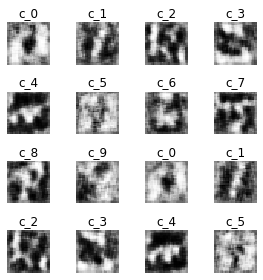

--------------------
Epoch 2/25


g_acc=0.78, g_loss=1.76, d_loss=1.12
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-2


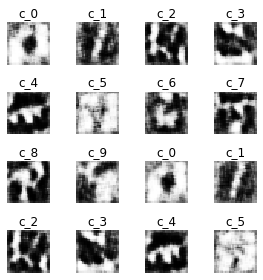

--------------------
Epoch 3/25


g_acc=0.78, g_loss=1.76, d_loss=1.12
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-3
> no change inc: 1/4


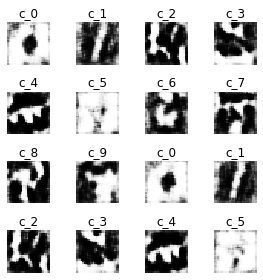

--------------------
Epoch 4/25


g_acc=0.78, g_loss=1.75, d_loss=1.12
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-4
> no change inc: 2/4


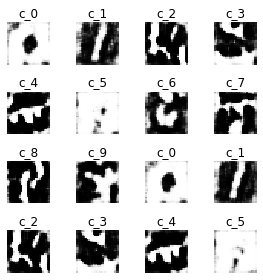

--------------------
Epoch 5/25


g_acc=0.79, g_loss=1.75, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-5
> no change inc: 3/4


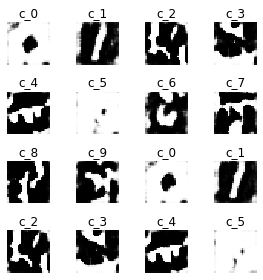

--------------------
Epoch 6/25


g_acc=0.62, g_loss=1.95, d_loss=1.00
Restored D to checkpoint from checkpoints\it_1\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-6


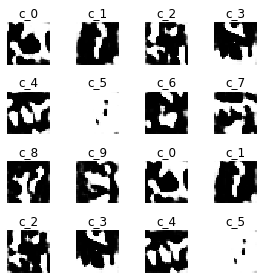

--------------------
Epoch 7/25


g_acc=0.78, g_loss=1.76, d_loss=1.12
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-7


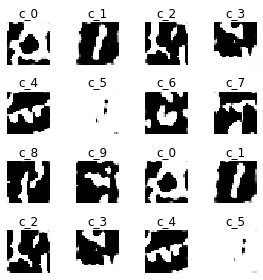

--------------------
Epoch 8/25


g_acc=0.79, g_loss=1.75, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-8
> no change inc: 1/4


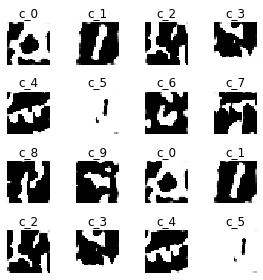

--------------------
Epoch 9/25


g_acc=0.79, g_loss=1.74, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-9
> no change inc: 2/4


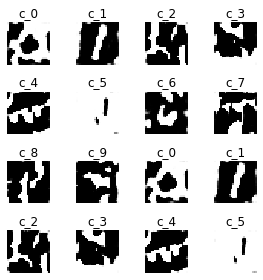

--------------------
Epoch 10/25


g_acc=0.79, g_loss=1.74, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-10
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-10
> no change inc: 3/4


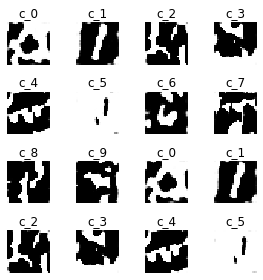

--------------------
Epoch 11/25


g_acc=0.37, g_loss=2.16, d_loss=0.87
Restored D to checkpoint from checkpoints\it_1\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-11
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-11


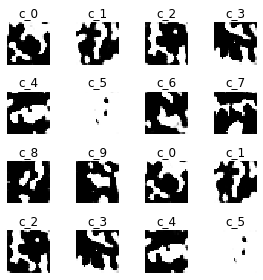

--------------------
Epoch 12/25


g_acc=0.78, g_loss=1.76, d_loss=1.12
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-12
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-12


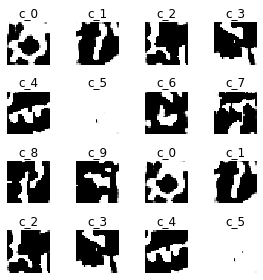

--------------------
Epoch 13/25


g_acc=0.79, g_loss=1.74, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-13
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-13
> no change inc: 1/4


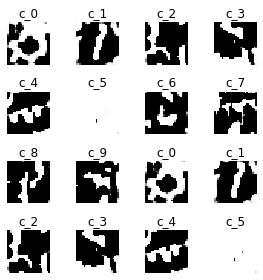

--------------------
Epoch 14/25


g_acc=0.79, g_loss=1.74, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-14
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-14
> no change inc: 2/4


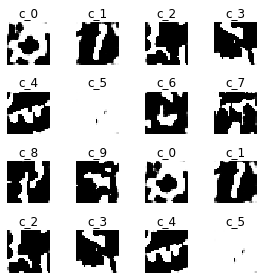

--------------------
Epoch 15/25


g_acc=0.79, g_loss=1.75, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-15
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-15
> no change inc: 3/4


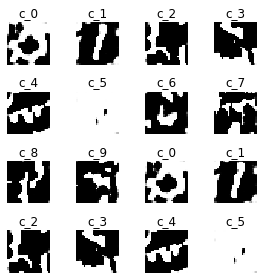

--------------------
Epoch 16/25


g_acc=0.63, g_loss=1.94, d_loss=1.00
Restored D to checkpoint from checkpoints\it_1\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-16
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-16


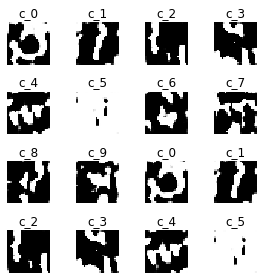

--------------------
Epoch 17/25


g_acc=0.79, g_loss=1.75, d_loss=1.12
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-17
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-17


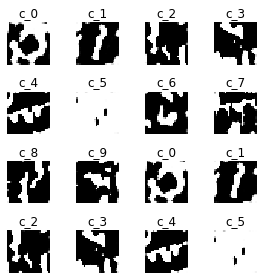

--------------------
Epoch 18/25


g_acc=0.79, g_loss=1.75, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-18
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-18
> no change inc: 1/4


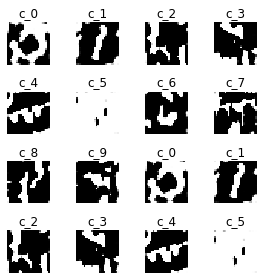

--------------------
Epoch 19/25


g_acc=0.80, g_loss=1.74, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-19
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-19
> no change inc: 2/4


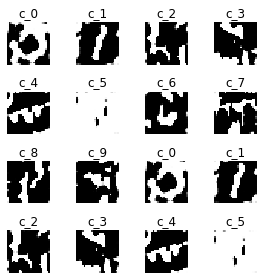

--------------------
Epoch 20/25


g_acc=0.79, g_loss=1.75, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-20
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-20
> no change inc: 3/4


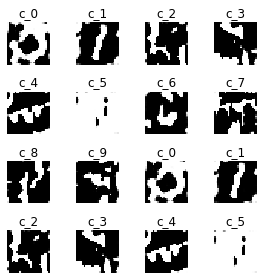

--------------------
Epoch 21/25


g_acc=0.47, g_loss=2.08, d_loss=0.92
Restored D to checkpoint from checkpoints\it_1\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-21
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-21


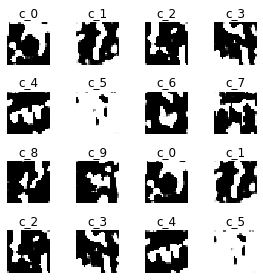

--------------------
Epoch 22/25


g_acc=0.79, g_loss=1.75, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-22
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-22


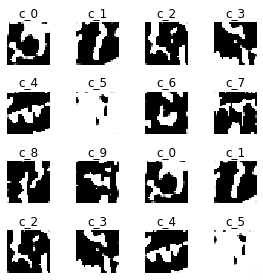

--------------------
Epoch 23/25


g_acc=0.80, g_loss=1.74, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-23
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-23
> no change inc: 1/4


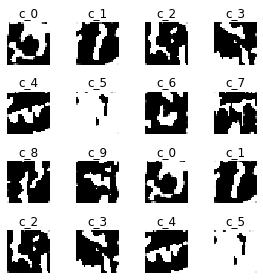

--------------------
Epoch 24/25


g_acc=0.80, g_loss=1.74, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-24
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-24
> no change inc: 2/4


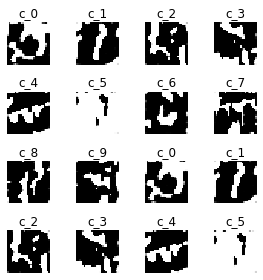

--------------------
Epoch 25/25


g_acc=0.79, g_loss=1.74, d_loss=1.13
Saved D checkpoint: checkpoints\it_1\discriminator_checkpoint\ckpt-25
Saved D checkpoint: checkpoints\it_1\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_1\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_1\c_generator_checkpoint\ckpt-25
> no change inc: 3/4


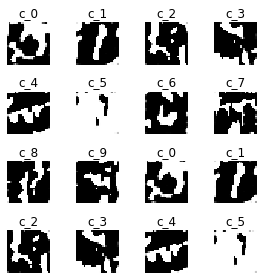

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


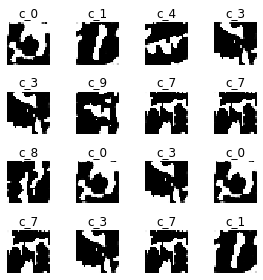

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 74.4000%
Saved checkpoint: checkpoints\it_1\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_1\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_1\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_1\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


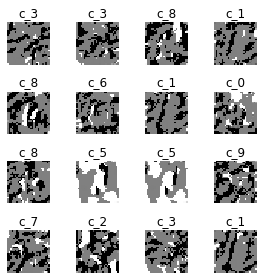

train_acc=0.0000%
accuracy of blackbox on G dataset: 22.3750%
Saved checkpoint: checkpoints\it_1\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_1\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_1\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_1\split_end_model_checkpoint\checkpoint


d_refine_acc: 0.915
D Test Accuracy: 0.332 | Loss: 2.125

****************************************
Iteration 2

D Test Accuracy: 0.332 | Loss: 2.125

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.72, g_loss=1.80, d_loss=1.10
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-1


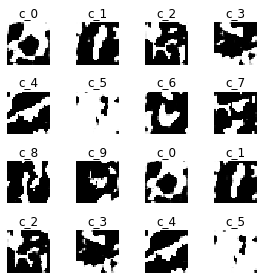

--------------------
Epoch 2/25


g_acc=0.78, g_loss=1.76, d_loss=1.12
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-2


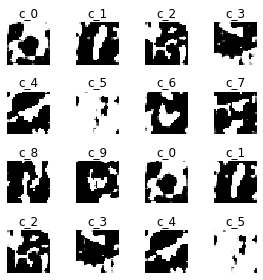

--------------------
Epoch 3/25


g_acc=0.79, g_loss=1.75, d_loss=1.13
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-3
> no change inc: 1/4


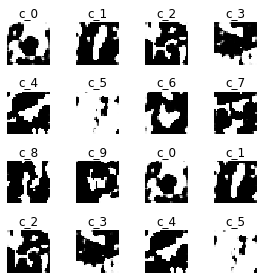

--------------------
Epoch 4/25


g_acc=0.79, g_loss=1.75, d_loss=1.13
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-4
> no change inc: 2/4


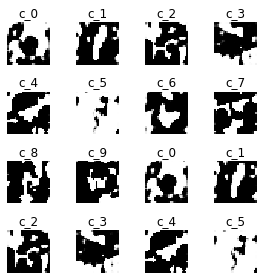

--------------------
Epoch 5/25


g_acc=0.79, g_loss=1.74, d_loss=1.13
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-5
> no change inc: 3/4


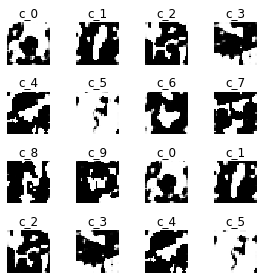

--------------------
Epoch 6/25


g_acc=0.49, g_loss=2.02, d_loss=0.96
Restored D to checkpoint from checkpoints\it_2\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-6


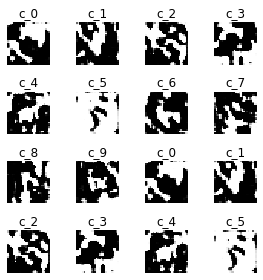

--------------------
Epoch 7/25


g_acc=0.78, g_loss=1.75, d_loss=1.13
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-7


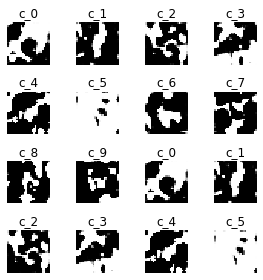

--------------------
Epoch 8/25


g_acc=0.80, g_loss=1.74, d_loss=1.14
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-8
> no change inc: 1/4


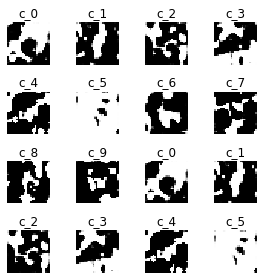

--------------------
Epoch 9/25


g_acc=0.80, g_loss=1.74, d_loss=1.13
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-9
> no change inc: 2/4


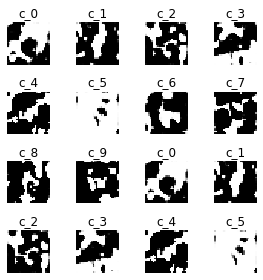

--------------------
Epoch 10/25


g_acc=0.80, g_loss=1.73, d_loss=1.14
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-10
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-10
> no change inc: 3/4


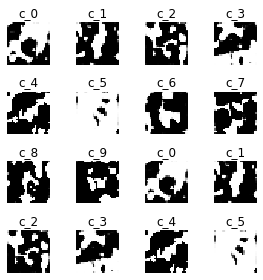

--------------------
Epoch 11/25


g_acc=0.60, g_loss=1.91, d_loss=1.02
Restored D to checkpoint from checkpoints\it_2\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-11
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-11


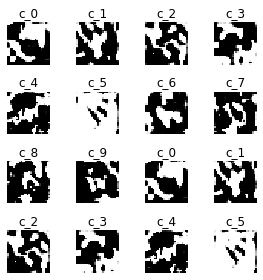

--------------------
Epoch 12/25


g_acc=0.80, g_loss=1.74, d_loss=1.14
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-12
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-12


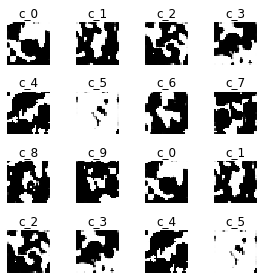

--------------------
Epoch 13/25


g_acc=0.81, g_loss=1.73, d_loss=1.14
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-13
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-13
> no change inc: 1/4


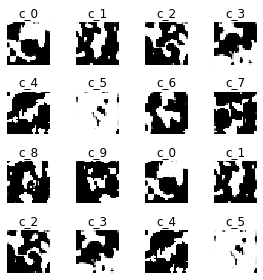

--------------------
Epoch 14/25


g_acc=0.81, g_loss=1.72, d_loss=1.14
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-14
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-14
> no change inc: 2/4


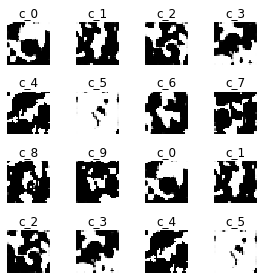

--------------------
Epoch 15/25


g_acc=0.81, g_loss=1.73, d_loss=1.14
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-15
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-15
> no change inc: 3/4


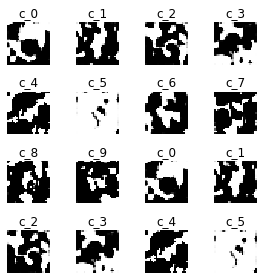

--------------------
Epoch 16/25


g_acc=0.58, g_loss=1.94, d_loss=1.01
Restored D to checkpoint from checkpoints\it_2\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-16
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-16


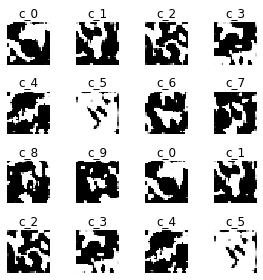

--------------------
Epoch 17/25


g_acc=0.80, g_loss=1.73, d_loss=1.14
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-17
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-17


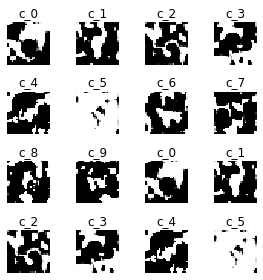

--------------------
Epoch 18/25


g_acc=0.82, g_loss=1.72, d_loss=1.14
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-18
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-18
> no change inc: 1/4


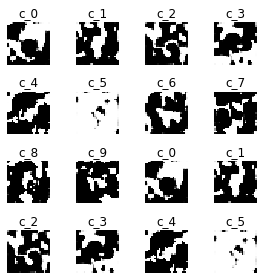

--------------------
Epoch 19/25


g_acc=0.82, g_loss=1.72, d_loss=1.14
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-19
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-19
> no change inc: 2/4


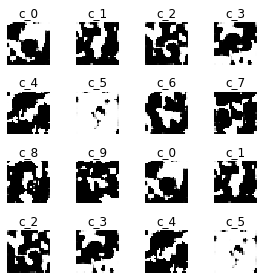

--------------------
Epoch 20/25


g_acc=0.82, g_loss=1.72, d_loss=1.15
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-20
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-20
> no change inc: 3/4


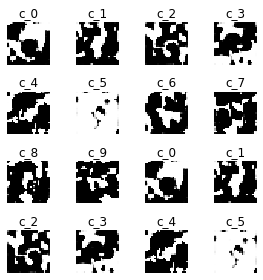

--------------------
Epoch 21/25


g_acc=0.48, g_loss=2.04, d_loss=0.95
Restored D to checkpoint from checkpoints\it_2\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-21
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-21


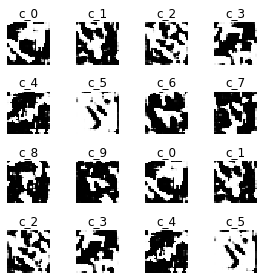

--------------------
Epoch 22/25


g_acc=0.82, g_loss=1.72, d_loss=1.14
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-22
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-22


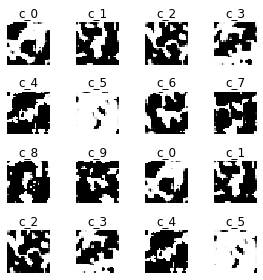

--------------------
Epoch 23/25


g_acc=0.83, g_loss=1.72, d_loss=1.15
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-23
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-23
> no change inc: 1/4


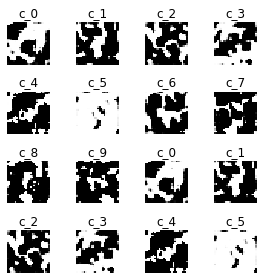

--------------------
Epoch 24/25


g_acc=0.83, g_loss=1.71, d_loss=1.15
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-24
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-24
> no change inc: 2/4


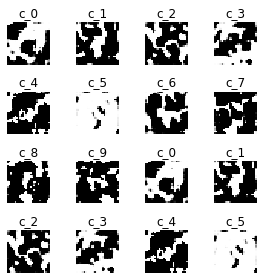

--------------------
Epoch 25/25


g_acc=0.83, g_loss=1.72, d_loss=1.15
Saved D checkpoint: checkpoints\it_2\discriminator_checkpoint\ckpt-25
Saved D checkpoint: checkpoints\it_2\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_2\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_2\c_generator_checkpoint\ckpt-25
> no change inc: 3/4


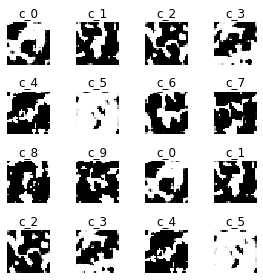

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


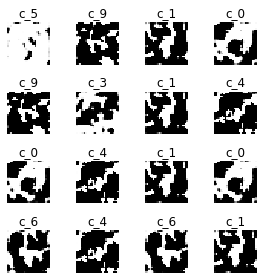

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 31.4000%
Saved checkpoint: checkpoints\it_2\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_2\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_2\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_2\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


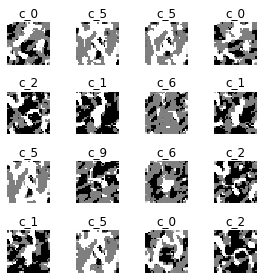

train_acc=0.0000%
accuracy of blackbox on G dataset: 23.0769%
Saved checkpoint: checkpoints\it_2\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_2\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_2\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_2\split_end_model_checkpoint\checkpoint


d_refine_acc: 0.983
D Test Accuracy: 0.185 | Loss: 2.252

****************************************
Iteration 3

D Test Accuracy: 0.185 | Loss: 2.252

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.50, g_loss=2.00, d_loss=0.97
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-1


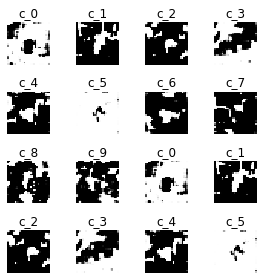

--------------------
Epoch 2/25


g_acc=0.63, g_loss=1.91, d_loss=1.03
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-2


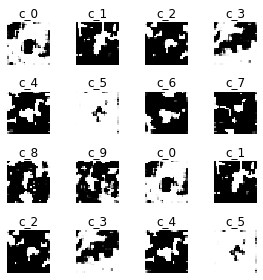

--------------------
Epoch 3/25


g_acc=0.65, g_loss=1.89, d_loss=1.04
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-3
> no change inc: 1/4


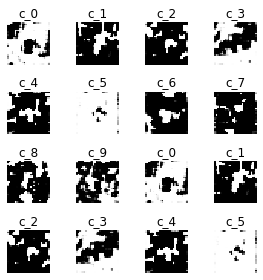

--------------------
Epoch 4/25


g_acc=0.66, g_loss=1.88, d_loss=1.04
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-4
> no change inc: 2/4


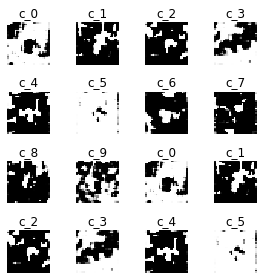

--------------------
Epoch 5/25


g_acc=0.68, g_loss=1.86, d_loss=1.06
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-5
> no change inc: 3/4


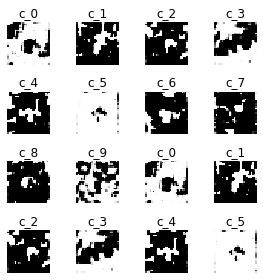

--------------------
Epoch 6/25


g_acc=0.31, g_loss=2.15, d_loss=0.88
Restored D to checkpoint from checkpoints\it_3\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-6


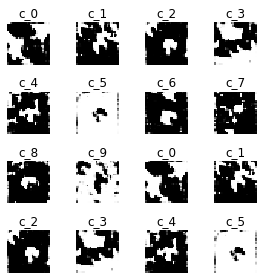

--------------------
Epoch 7/25


g_acc=0.69, g_loss=1.87, d_loss=1.05
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-7


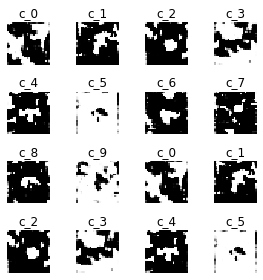

--------------------
Epoch 8/25


g_acc=0.72, g_loss=1.84, d_loss=1.07
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-8
> no change inc: 1/4


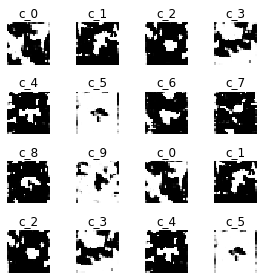

--------------------
Epoch 9/25


g_acc=0.72, g_loss=1.83, d_loss=1.07
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-9
> no change inc: 2/4


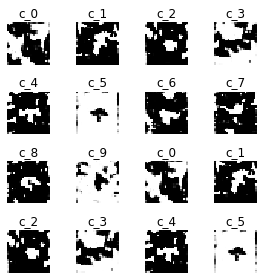

--------------------
Epoch 10/25


g_acc=0.73, g_loss=1.83, d_loss=1.08
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-10
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-10
> no change inc: 3/4


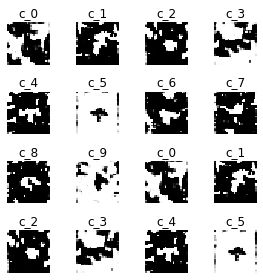

--------------------
Epoch 11/25


g_acc=0.56, g_loss=1.97, d_loss=0.99
Restored D to checkpoint from checkpoints\it_3\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-11
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-11


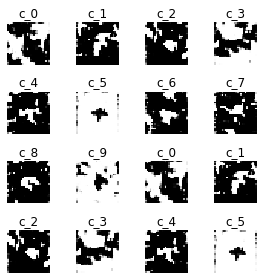

--------------------
Epoch 12/25


g_acc=0.72, g_loss=1.83, d_loss=1.07
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-12
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-12


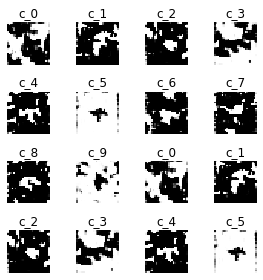

--------------------
Epoch 13/25


g_acc=0.73, g_loss=1.82, d_loss=1.08
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-13
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-13
> no change inc: 1/4


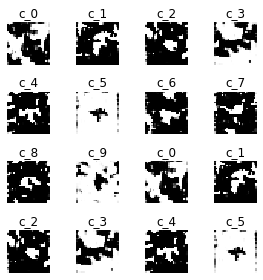

--------------------
Epoch 14/25


g_acc=0.73, g_loss=1.82, d_loss=1.08
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-14
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-14
> no change inc: 2/4


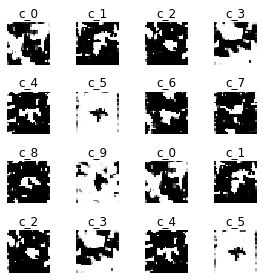

--------------------
Epoch 15/25


g_acc=0.73, g_loss=1.82, d_loss=1.08
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-15
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-15
> no change inc: 3/4


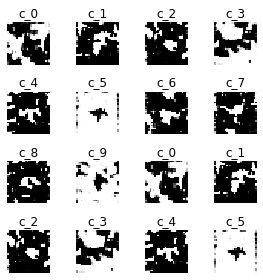

--------------------
Epoch 16/25


g_acc=0.42, g_loss=2.07, d_loss=0.93
Restored D to checkpoint from checkpoints\it_3\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-16
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-16


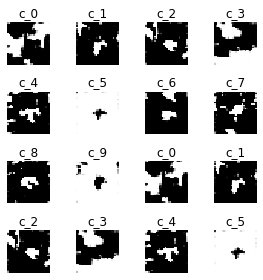

--------------------
Epoch 17/25


g_acc=0.71, g_loss=1.84, d_loss=1.07
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-17
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-17


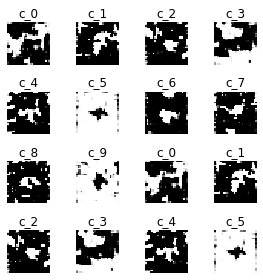

--------------------
Epoch 18/25


g_acc=0.73, g_loss=1.81, d_loss=1.09
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-18
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-18
> no change inc: 1/4


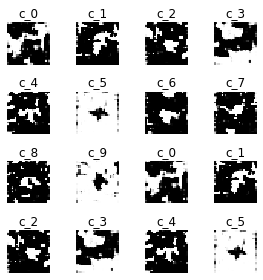

--------------------
Epoch 19/25


g_acc=0.73, g_loss=1.81, d_loss=1.09
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-19
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-19
> no change inc: 2/4


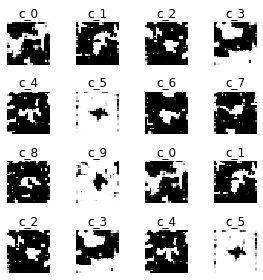

--------------------
Epoch 20/25


g_acc=0.73, g_loss=1.81, d_loss=1.09
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-20
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-20
> no change inc: 3/4


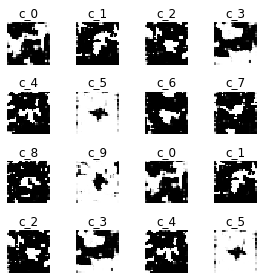

--------------------
Epoch 21/25


g_acc=0.42, g_loss=2.07, d_loss=0.93
Restored D to checkpoint from checkpoints\it_3\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-21
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-21


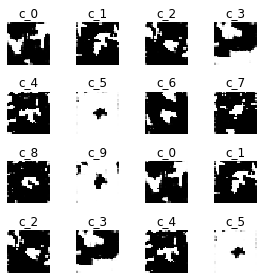

--------------------
Epoch 22/25


g_acc=0.73, g_loss=1.82, d_loss=1.08
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-22
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-22


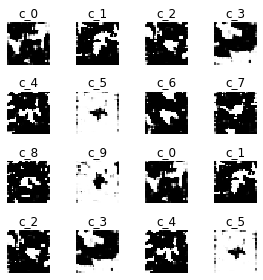

--------------------
Epoch 23/25


g_acc=0.73, g_loss=1.82, d_loss=1.08
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-23
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-23
> no change inc: 1/4


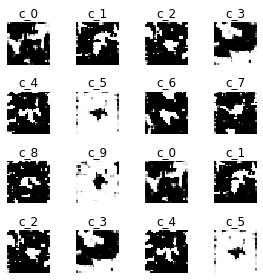

--------------------
Epoch 24/25


g_acc=0.73, g_loss=1.81, d_loss=1.09
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-24
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-24
> no change inc: 2/4


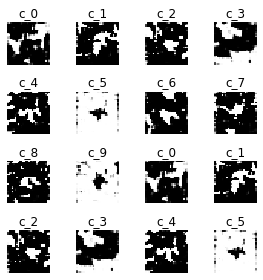

--------------------
Epoch 25/25


g_acc=0.73, g_loss=1.81, d_loss=1.09
Saved D checkpoint: checkpoints\it_3\discriminator_checkpoint\ckpt-25
Saved D checkpoint: checkpoints\it_3\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_3\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_3\c_generator_checkpoint\ckpt-25
> no change inc: 3/4


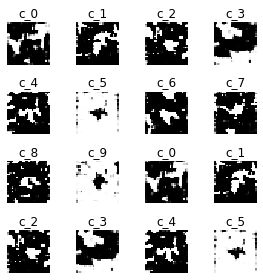

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


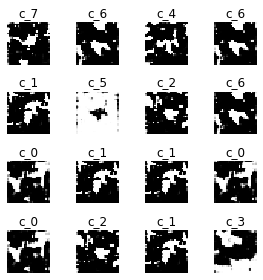

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 22.6000%
Saved checkpoint: checkpoints\it_3\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_3\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_3\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_3\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


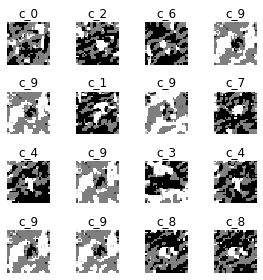

train_acc=0.0000%
accuracy of blackbox on G dataset: 23.7778%
Saved checkpoint: checkpoints\it_3\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_3\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_3\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_3\split_end_model_checkpoint\checkpoint


d_refine_acc: 0.989
D Test Accuracy: 0.171 | Loss: 2.289

****************************************
Iteration 4

D Test Accuracy: 0.171 | Loss: 2.289

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.24, g_loss=2.22, d_loss=0.84
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-1


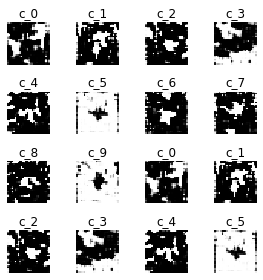

--------------------
Epoch 2/25


g_acc=0.34, g_loss=2.15, d_loss=0.88
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-2


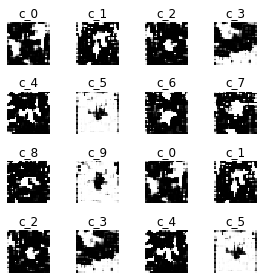

--------------------
Epoch 3/25


g_acc=0.37, g_loss=2.12, d_loss=0.90
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-3


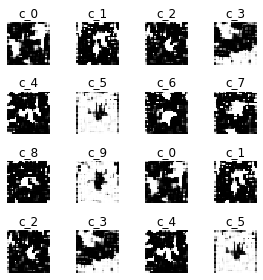

--------------------
Epoch 4/25


g_acc=0.40, g_loss=2.10, d_loss=0.91
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-4


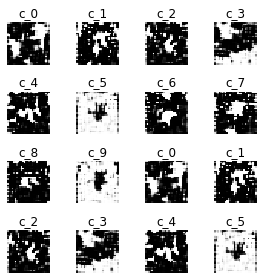

--------------------
Epoch 5/25


g_acc=0.43, g_loss=2.08, d_loss=0.92
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-5


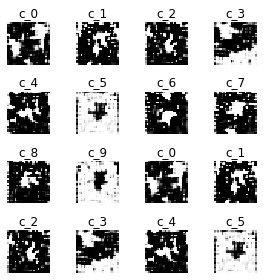

--------------------
Epoch 6/25


g_acc=0.45, g_loss=2.07, d_loss=0.92
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-6


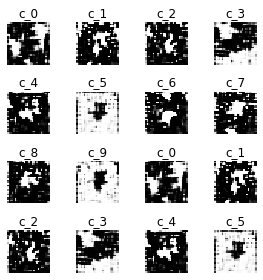

--------------------
Epoch 7/25


g_acc=0.49, g_loss=2.06, d_loss=0.93
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-7


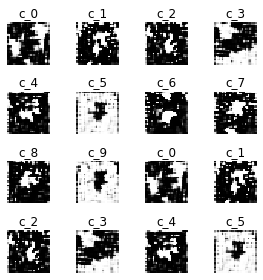

--------------------
Epoch 8/25


g_acc=0.53, g_loss=2.05, d_loss=0.94
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-8


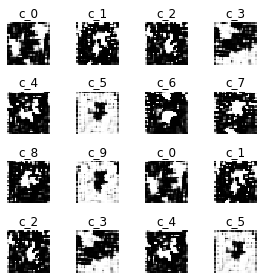

--------------------
Epoch 9/25


g_acc=0.54, g_loss=2.05, d_loss=0.94
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-9
> no change inc: 1/4


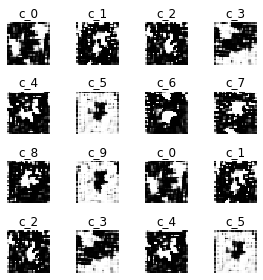

--------------------
Epoch 10/25


g_acc=0.56, g_loss=2.04, d_loss=0.94
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-10
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-10
> no change inc: 2/4


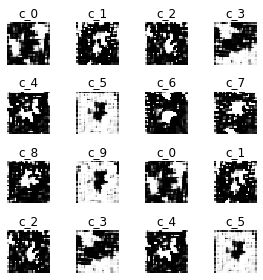

--------------------
Epoch 11/25


g_acc=0.56, g_loss=2.04, d_loss=0.94
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-11
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-11
> no change inc: 3/4


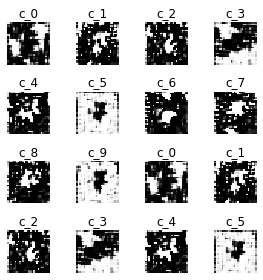

--------------------
Epoch 12/25


g_acc=0.28, g_loss=2.19, d_loss=0.86
Restored D to checkpoint from checkpoints\it_4\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-12
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-12


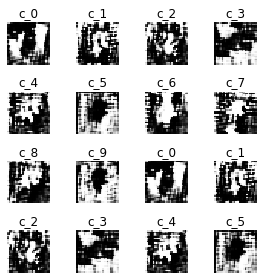

--------------------
Epoch 13/25


g_acc=0.48, g_loss=2.07, d_loss=0.92
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-13
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-13


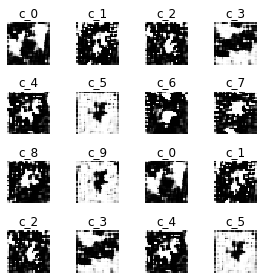

--------------------
Epoch 14/25


g_acc=0.57, g_loss=2.04, d_loss=0.94
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-14
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-14


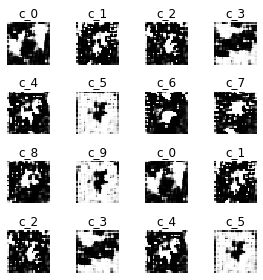

--------------------
Epoch 15/25


g_acc=0.58, g_loss=2.04, d_loss=0.94
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-15
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-15
> no change inc: 1/4


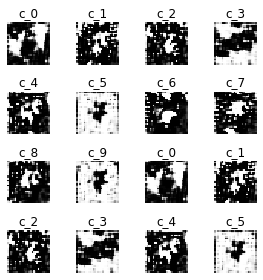

--------------------
Epoch 16/25


g_acc=0.59, g_loss=2.03, d_loss=0.95
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-16
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-16
> no change inc: 2/4


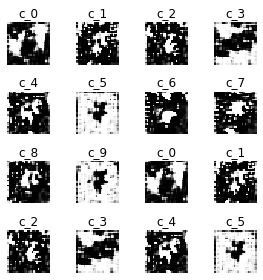

--------------------
Epoch 17/25


g_acc=0.59, g_loss=2.03, d_loss=0.95
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-17
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-17
> no change inc: 3/4


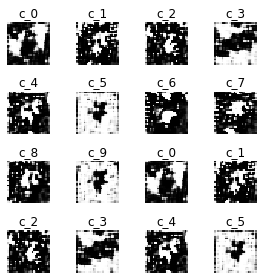

--------------------
Epoch 18/25


g_acc=0.39, g_loss=2.11, d_loss=0.90
Restored D to checkpoint from checkpoints\it_4\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-18
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-18


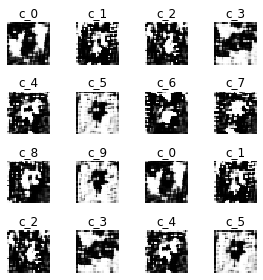

--------------------
Epoch 19/25


g_acc=0.56, g_loss=2.04, d_loss=0.94
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-19
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-19


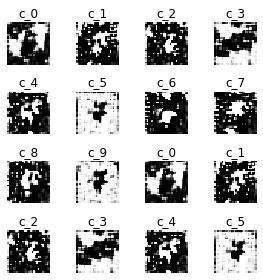

--------------------
Epoch 20/25


g_acc=0.59, g_loss=2.03, d_loss=0.95
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-20
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-20
> no change inc: 1/4


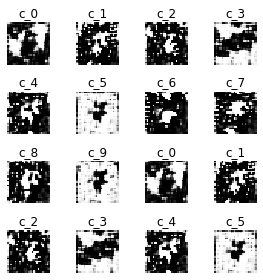

--------------------
Epoch 21/25


g_acc=0.59, g_loss=2.02, d_loss=0.95
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-21
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-21
> no change inc: 2/4


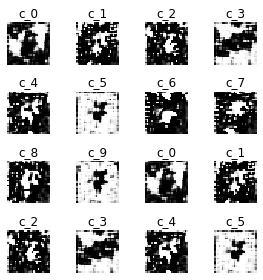

--------------------
Epoch 22/25


g_acc=0.59, g_loss=2.03, d_loss=0.95
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-22
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-22
> no change inc: 3/4


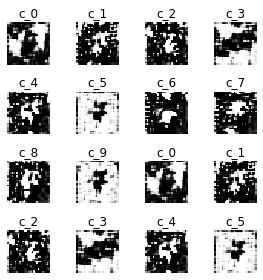

--------------------
Epoch 23/25


g_acc=0.25, g_loss=2.22, d_loss=0.84
Restored D to checkpoint from checkpoints\it_4\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-23
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-23


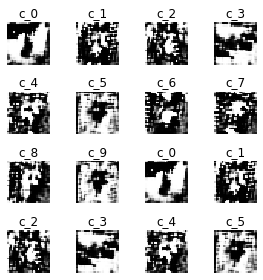

--------------------
Epoch 24/25


g_acc=0.57, g_loss=2.04, d_loss=0.94
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-24
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-24


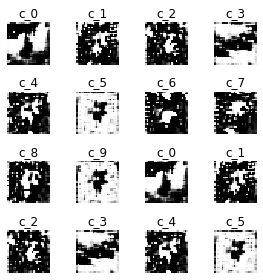

--------------------
Epoch 25/25


g_acc=0.60, g_loss=2.02, d_loss=0.95
Saved D checkpoint: checkpoints\it_4\discriminator_checkpoint\ckpt-25
Saved D checkpoint: checkpoints\it_4\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_4\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_4\c_generator_checkpoint\ckpt-25


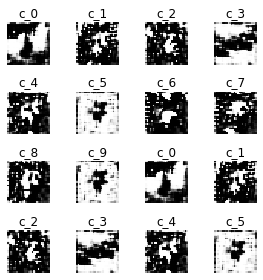

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


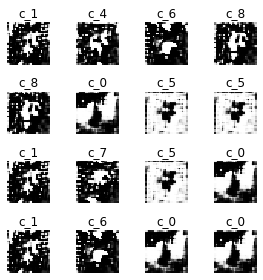

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 22.4000%
Saved checkpoint: checkpoints\it_4\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_4\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_4\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_4\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


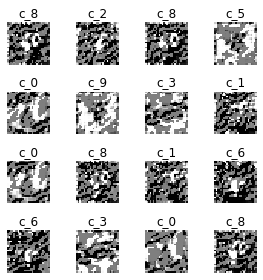

train_acc=0.0000%
accuracy of blackbox on G dataset: 13.5652%
Saved checkpoint: checkpoints\it_4\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_4\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_4\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_4\split_end_model_checkpoint\checkpoint


d_refine_acc: 0.972
D Test Accuracy: 0.101 | Loss: 2.316

****************************************
Iteration 5

D Test Accuracy: 0.101 | Loss: 2.316

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.37, g_loss=2.14, d_loss=0.88
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-1


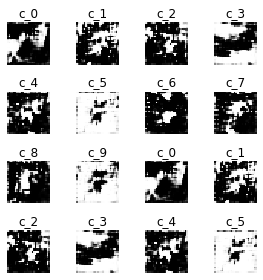

--------------------
Epoch 2/25


g_acc=0.51, g_loss=2.04, d_loss=0.94
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-2


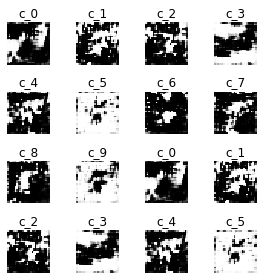

--------------------
Epoch 3/25


g_acc=0.56, g_loss=2.01, d_loss=0.96
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-3


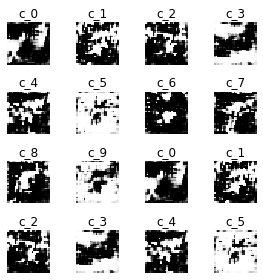

--------------------
Epoch 4/25


g_acc=0.59, g_loss=1.98, d_loss=0.98
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-4


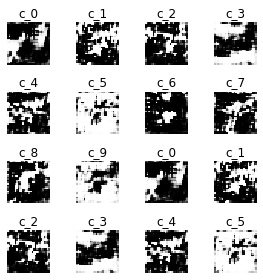

--------------------
Epoch 5/25


g_acc=0.60, g_loss=1.97, d_loss=0.98
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-5
> no change inc: 1/4


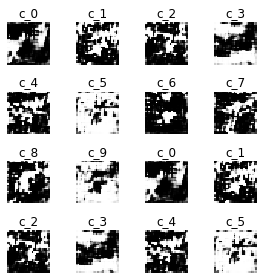

--------------------
Epoch 6/25


g_acc=0.60, g_loss=1.96, d_loss=0.99
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-6
> no change inc: 2/4


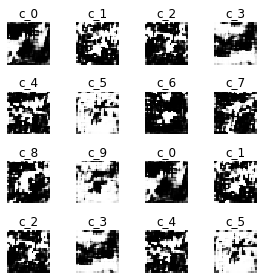

--------------------
Epoch 7/25


g_acc=0.60, g_loss=1.96, d_loss=0.99
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-7
> no change inc: 3/4


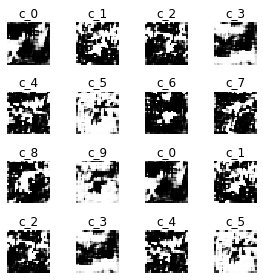

--------------------
Epoch 8/25


g_acc=0.25, g_loss=2.23, d_loss=0.83
Restored D to checkpoint from checkpoints\it_5\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-8


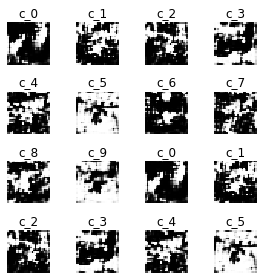

--------------------
Epoch 9/25


g_acc=0.59, g_loss=1.98, d_loss=0.98
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-9


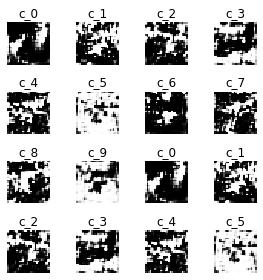

--------------------
Epoch 10/25


g_acc=0.61, g_loss=1.95, d_loss=1.00
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-10
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-10
> no change inc: 1/4


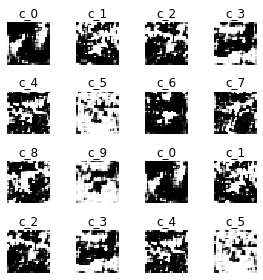

--------------------
Epoch 11/25


g_acc=0.61, g_loss=1.94, d_loss=1.00
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-11
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-11
> no change inc: 2/4


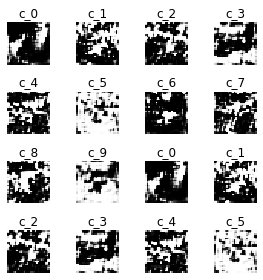

--------------------
Epoch 12/25


g_acc=0.62, g_loss=1.94, d_loss=1.00
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-12
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-12
> no change inc: 3/4


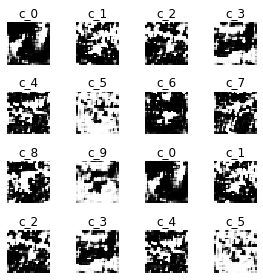

--------------------
Epoch 13/25


g_acc=0.37, g_loss=2.14, d_loss=0.88
Restored D to checkpoint from checkpoints\it_5\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-13
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-13


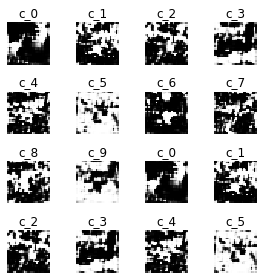

--------------------
Epoch 14/25


g_acc=0.62, g_loss=1.95, d_loss=0.99
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-14
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-14


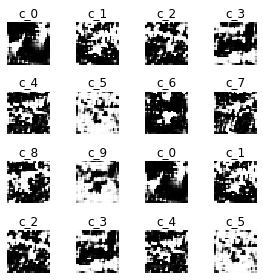

--------------------
Epoch 15/25


g_acc=0.62, g_loss=1.93, d_loss=1.01
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-15
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-15
> no change inc: 1/4


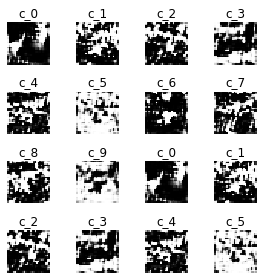

--------------------
Epoch 16/25


g_acc=0.62, g_loss=1.93, d_loss=1.01
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-16
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-16
> no change inc: 2/4


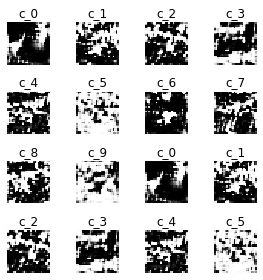

--------------------
Epoch 17/25


g_acc=0.62, g_loss=1.92, d_loss=1.01
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-17
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-17
> no change inc: 3/4


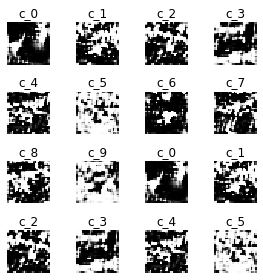

--------------------
Epoch 18/25


g_acc=0.37, g_loss=2.13, d_loss=0.89
Restored D to checkpoint from checkpoints\it_5\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-18
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-18


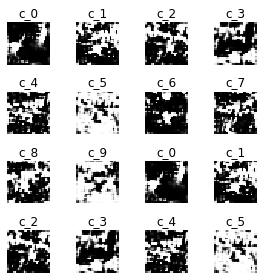

--------------------
Epoch 19/25


g_acc=0.62, g_loss=1.94, d_loss=1.00
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-19
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-19


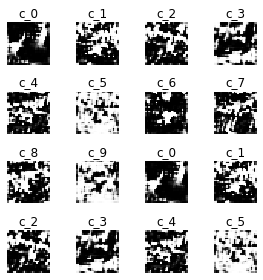

--------------------
Epoch 20/25


g_acc=0.62, g_loss=1.92, d_loss=1.01
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-20
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-20
> no change inc: 1/4


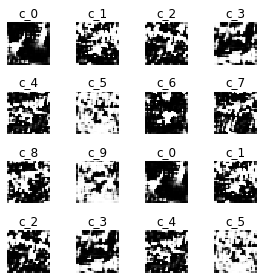

--------------------
Epoch 21/25


g_acc=0.62, g_loss=1.92, d_loss=1.01
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-21
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-21
> no change inc: 2/4


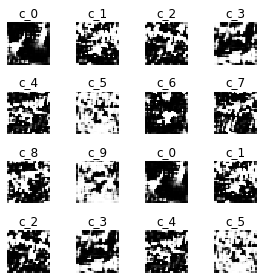

--------------------
Epoch 22/25


g_acc=0.63, g_loss=1.91, d_loss=1.02
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-22
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-22
> no change inc: 3/4


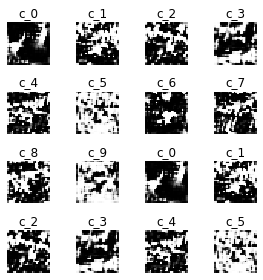

--------------------
Epoch 23/25


g_acc=0.24, g_loss=2.22, d_loss=0.84
Restored D to checkpoint from checkpoints\it_5\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-23
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-23


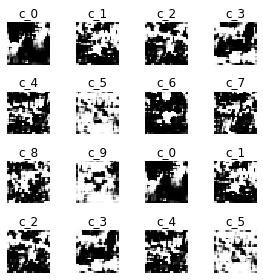

--------------------
Epoch 24/25


g_acc=0.61, g_loss=1.94, d_loss=1.00
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-24
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-24


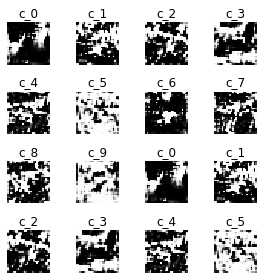

--------------------
Epoch 25/25


g_acc=0.63, g_loss=1.91, d_loss=1.02
Saved D checkpoint: checkpoints\it_5\discriminator_checkpoint\ckpt-25
Saved D checkpoint: checkpoints\it_5\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_5\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_5\c_generator_checkpoint\ckpt-25
> no change inc: 1/4


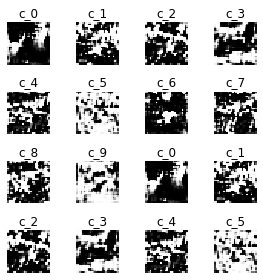

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


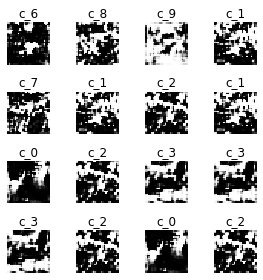

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8000%
Saved checkpoint: checkpoints\it_5\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_5\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_5\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_5\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


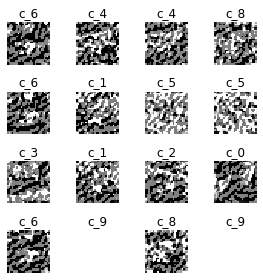

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.9643%
Saved checkpoint: checkpoints\it_5\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_5\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_5\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_5\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.334

****************************************
Iteration 6

D Test Accuracy: 0.101 | Loss: 2.334

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.75
Saved D checkpoint: checkpoints\it_6\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_6\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_6\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_6\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_6\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


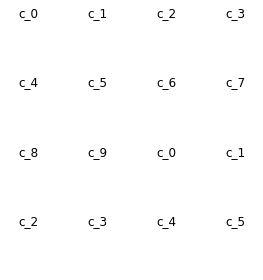

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.75
Saved D checkpoint: checkpoints\it_6\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_6\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_6\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_6\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_6\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


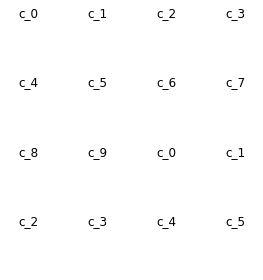

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.75
Saved D checkpoint: checkpoints\it_6\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_6\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_6\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_6\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_6\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


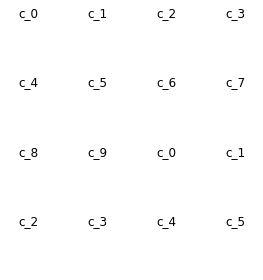

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.75
Saved D checkpoint: checkpoints\it_6\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_6\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_6\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_6\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_6\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


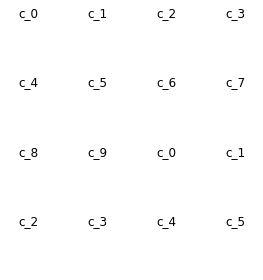

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.75
Restored D to checkpoint from checkpoints\it_6\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_6\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_6\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_6\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_6\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_6\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


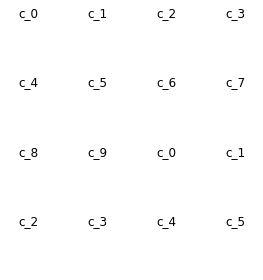

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


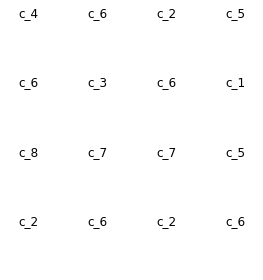

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 13.4000%
Saved checkpoint: checkpoints\it_6\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_6\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_6\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_6\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


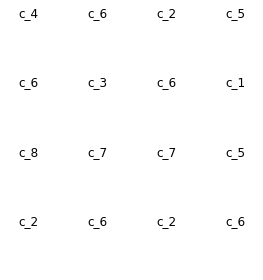

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6364%
Saved checkpoint: checkpoints\it_6\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_6\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_6\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_6\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.304

****************************************
Iteration 7

D Test Accuracy: 0.101 | Loss: 2.304

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_7\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_7\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_7\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_7\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_7\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


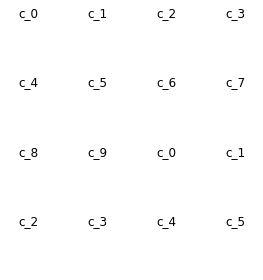

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_7\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_7\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_7\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_7\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_7\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


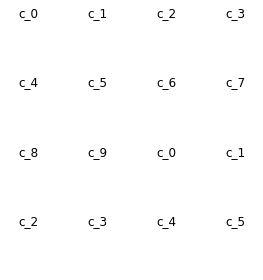

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.75
Saved D checkpoint: checkpoints\it_7\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_7\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_7\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_7\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_7\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


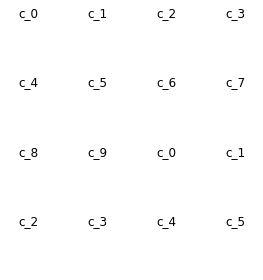

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_7\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_7\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_7\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_7\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_7\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


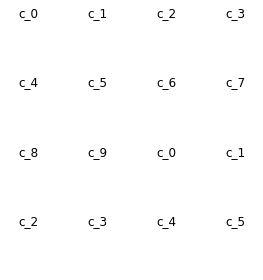

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.75
Restored D to checkpoint from checkpoints\it_7\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_7\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_7\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_7\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_7\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_7\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


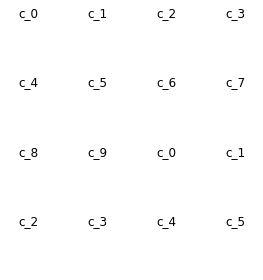

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


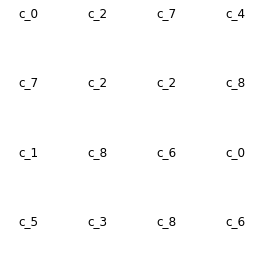

train_acc=10.2183%
accuracy of blackbox on G dataset: 9.8000%
Saved checkpoint: checkpoints\it_7\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_7\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_7\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_7\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


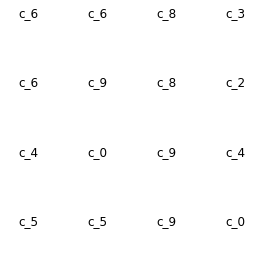

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.1250%
Saved checkpoint: checkpoints\it_7\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_7\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_7\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_7\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 8

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_8\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_8\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_8\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_8\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_8\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


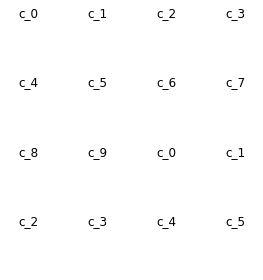

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_8\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_8\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_8\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_8\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_8\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


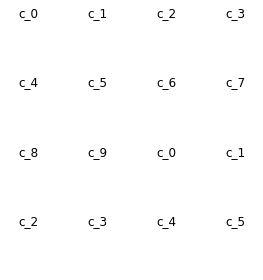

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_8\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_8\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_8\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_8\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_8\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


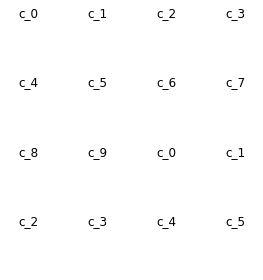

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_8\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_8\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_8\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_8\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_8\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


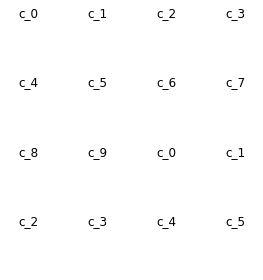

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_8\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_8\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_8\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_8\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_8\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_8\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


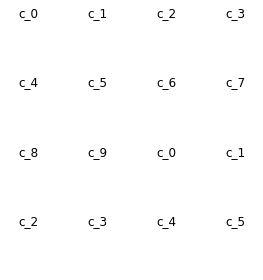

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


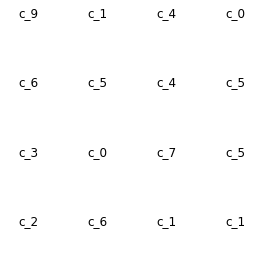

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.8000%
Saved checkpoint: checkpoints\it_8\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_8\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_8\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_8\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


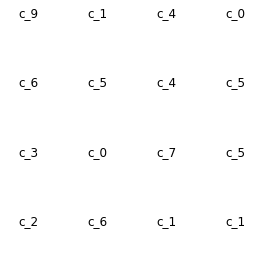

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.3077%
Saved checkpoint: checkpoints\it_8\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_8\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_8\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_8\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 9

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_9\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_9\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_9\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_9\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_9\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


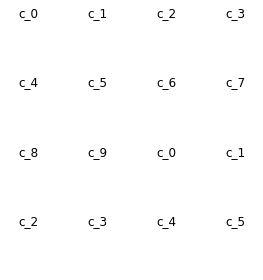

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_9\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_9\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_9\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_9\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_9\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


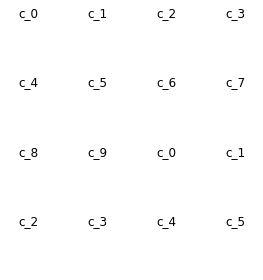

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_9\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_9\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_9\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_9\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_9\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


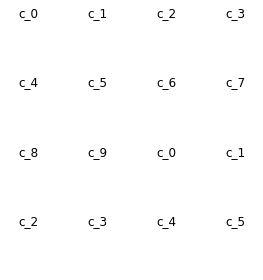

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_9\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_9\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_9\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_9\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_9\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


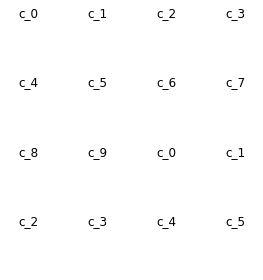

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_9\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_9\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_9\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_9\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_9\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_9\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


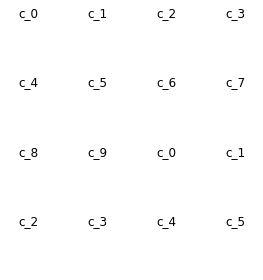

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


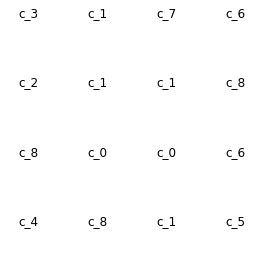

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.8000%
Saved checkpoint: checkpoints\it_9\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_9\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_9\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_9\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


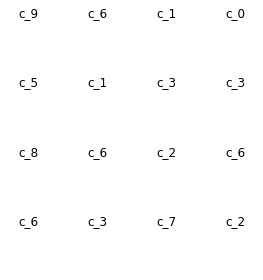

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.0000%
Saved checkpoint: checkpoints\it_9\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_9\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_9\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_9\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 10

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_10\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_10\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_10\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_10\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_10\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


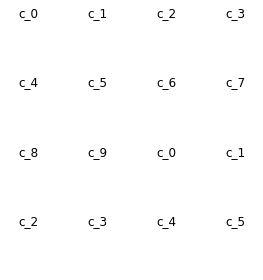

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_10\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_10\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_10\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_10\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_10\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


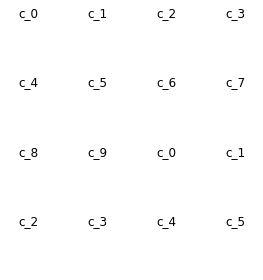

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_10\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_10\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_10\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_10\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_10\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


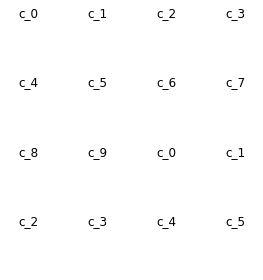

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_10\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_10\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_10\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_10\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_10\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


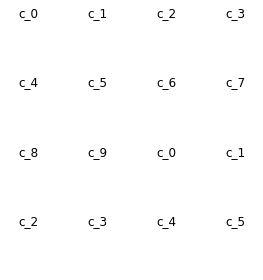

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_10\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_10\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_10\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_10\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_10\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_10\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


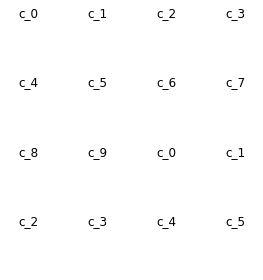

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


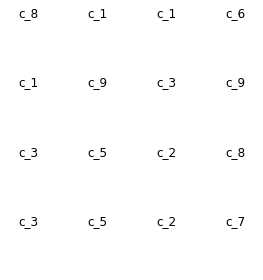

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.2000%
Saved checkpoint: checkpoints\it_10\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_10\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_10\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_10\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


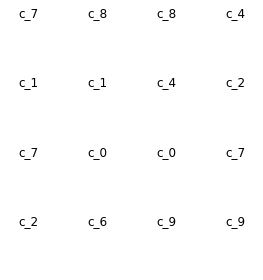

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2609%
Saved checkpoint: checkpoints\it_10\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_10\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_10\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_10\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 11

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_11\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_11\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_11\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_11\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_11\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


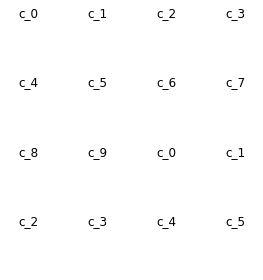

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_11\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_11\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_11\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_11\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_11\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


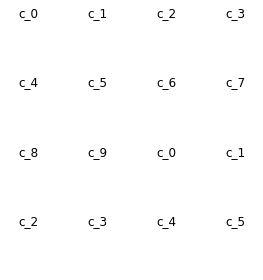

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_11\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_11\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_11\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_11\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_11\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


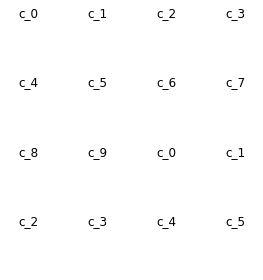

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_11\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_11\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_11\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_11\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_11\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


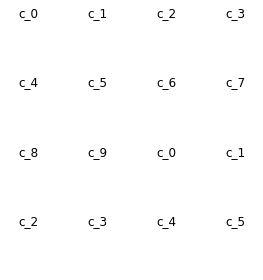

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_11\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_11\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_11\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_11\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_11\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_11\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


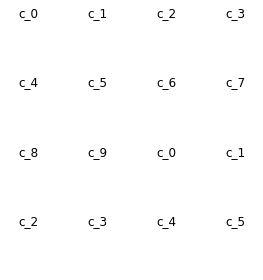

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


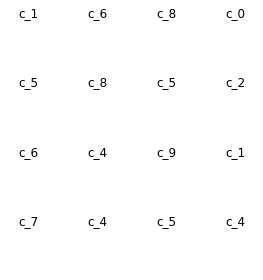

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.0000%
Saved checkpoint: checkpoints\it_11\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_11\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_11\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_11\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


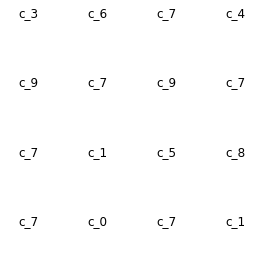

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.3929%
Saved checkpoint: checkpoints\it_11\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_11\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_11\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_11\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 12

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_12\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_12\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_12\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_12\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_12\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


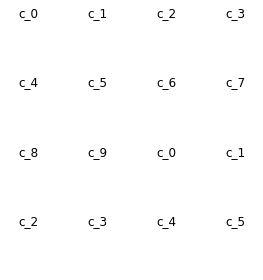

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_12\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_12\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_12\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_12\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_12\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


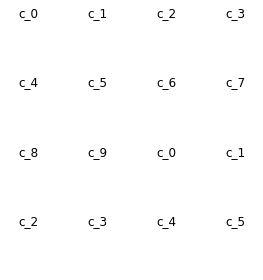

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_12\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_12\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_12\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_12\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_12\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


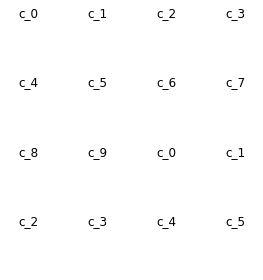

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_12\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_12\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_12\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_12\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_12\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


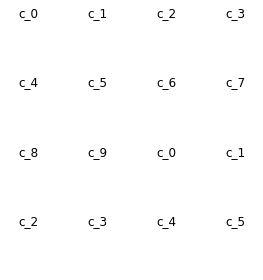

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_12\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_12\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_12\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_12\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_12\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_12\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


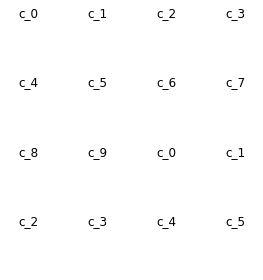

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


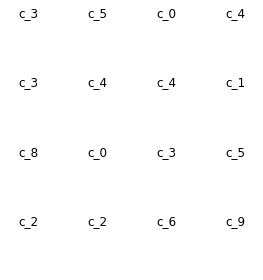

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.2000%
Saved checkpoint: checkpoints\it_12\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_12\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_12\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_12\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


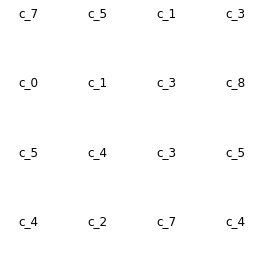

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6667%
Saved checkpoint: checkpoints\it_12\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_12\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_12\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_12\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 13

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_13\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_13\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_13\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_13\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_13\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


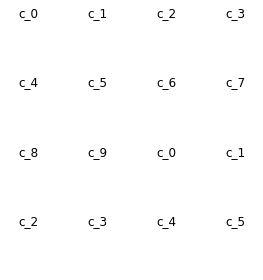

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_13\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_13\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_13\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_13\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_13\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


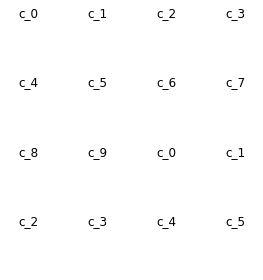

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_13\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_13\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_13\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_13\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_13\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


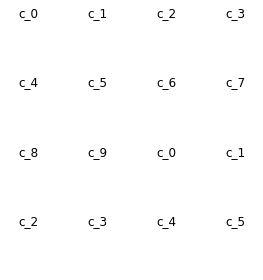

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_13\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_13\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_13\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_13\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_13\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


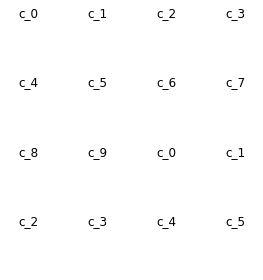

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_13\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_13\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_13\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_13\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_13\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_13\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


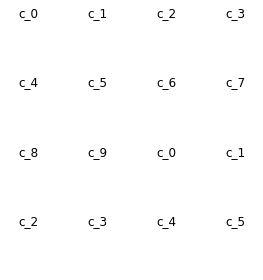

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


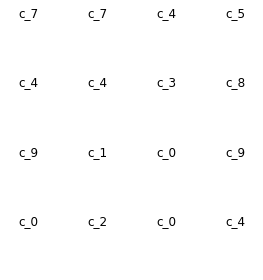

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.2000%
Saved checkpoint: checkpoints\it_13\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_13\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_13\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_13\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


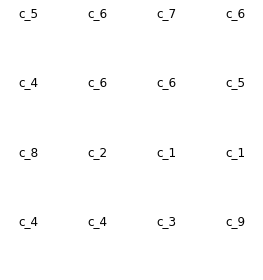

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.7368%
Saved checkpoint: checkpoints\it_13\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_13\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_13\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_13\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 14

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_14\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_14\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_14\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


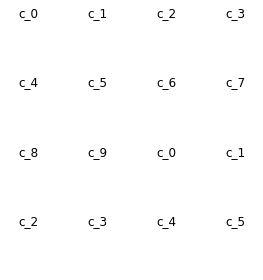

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_14\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_14\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_14\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


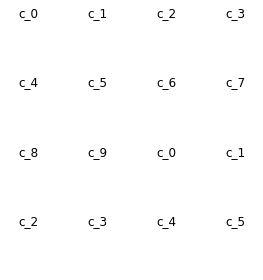

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_14\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_14\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_14\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


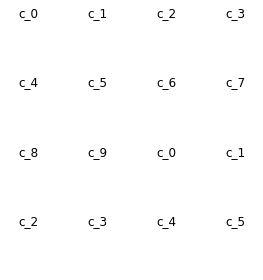

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_14\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_14\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_14\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


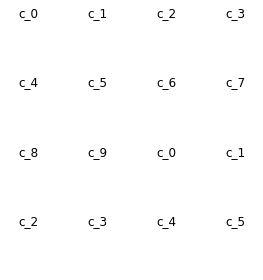

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_14\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_14\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_14\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_14\c_generator_checkpoint\ckpt-5


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


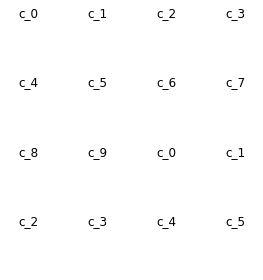

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_14\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_14\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_14\c_generator_checkpoint\ckpt-6
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


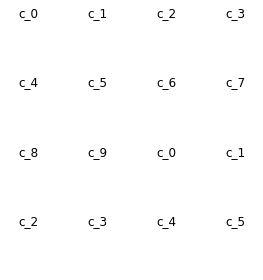

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_14\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_14\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_14\c_generator_checkpoint\ckpt-7
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


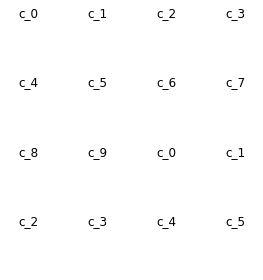

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_14\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_14\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_14\c_generator_checkpoint\ckpt-8
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


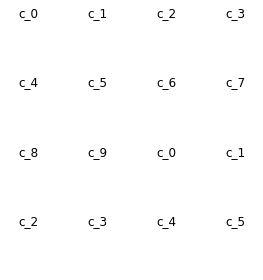

--------------------
Epoch 9/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_14\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_14\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_14\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_14\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_14\c_generator_checkpoint\ckpt-9
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


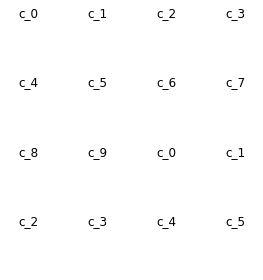

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


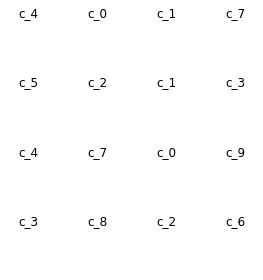

train_acc=10.2183%
accuracy of blackbox on G dataset: 10.6000%
Saved checkpoint: checkpoints\it_14\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_14\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_14\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_14\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


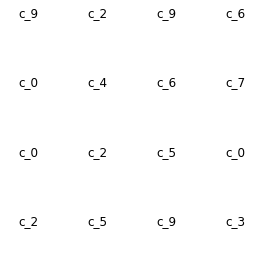

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.6250%
Saved checkpoint: checkpoints\it_14\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_14\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_14\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_14\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 15

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_15\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_15\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_15\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


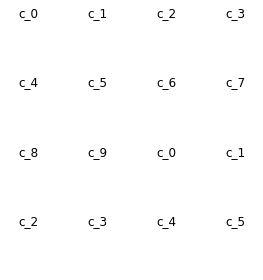

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_15\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_15\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_15\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


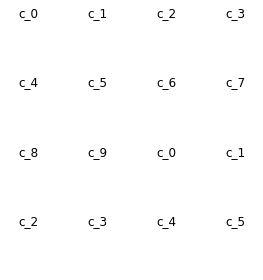

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_15\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_15\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_15\c_generator_checkpoint\ckpt-3


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


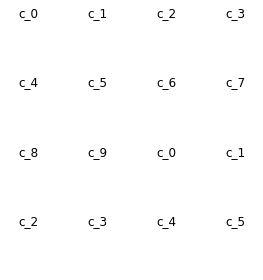

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_15\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_15\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_15\c_generator_checkpoint\ckpt-4
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


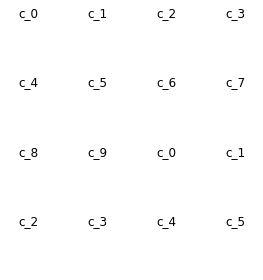

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_15\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_15\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_15\c_generator_checkpoint\ckpt-5
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


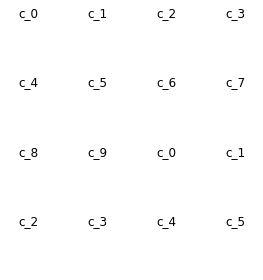

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_15\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_15\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_15\c_generator_checkpoint\ckpt-6
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


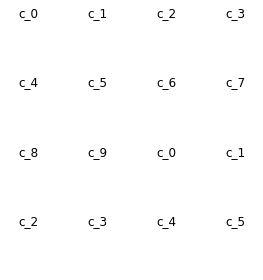

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_15\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_15\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_15\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_15\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_15\c_generator_checkpoint\ckpt-7
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


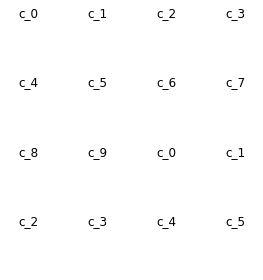

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


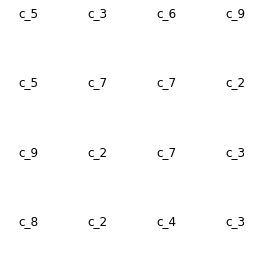

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2000%
Saved checkpoint: checkpoints\it_15\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_15\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_15\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_15\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


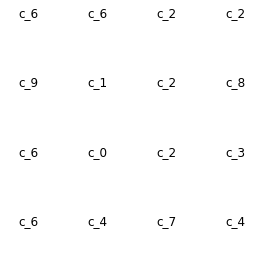

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.6154%
Saved checkpoint: checkpoints\it_15\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_15\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_15\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_15\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 16

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_16\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_16\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_16\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_16\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_16\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


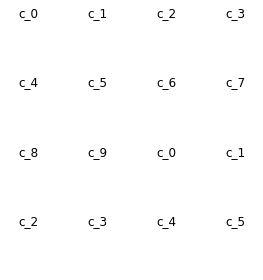

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_16\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_16\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_16\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_16\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_16\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


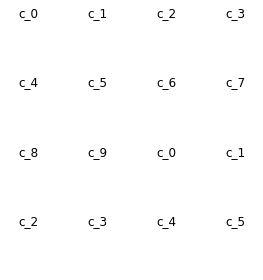

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_16\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_16\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_16\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_16\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_16\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


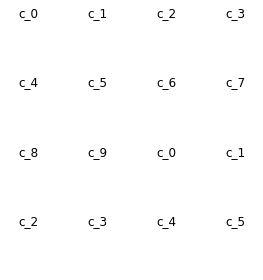

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_16\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_16\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_16\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_16\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_16\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


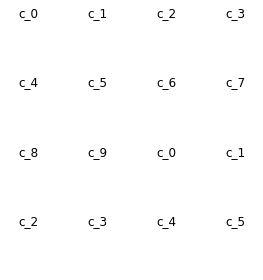

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_16\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_16\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_16\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_16\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_16\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_16\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


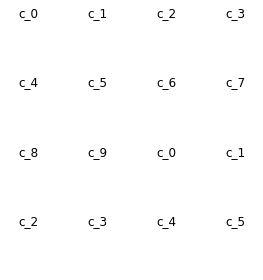

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


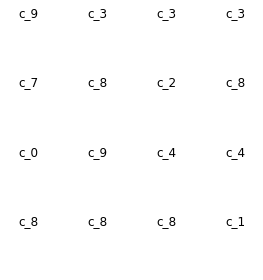

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.0000%
Saved checkpoint: checkpoints\it_16\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_16\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_16\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_16\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


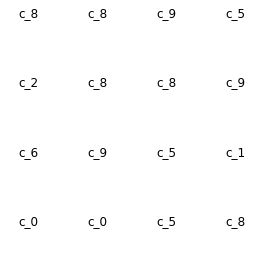

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0000%
Saved checkpoint: checkpoints\it_16\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_16\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_16\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_16\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 17

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_17\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_17\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_17\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_17\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_17\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


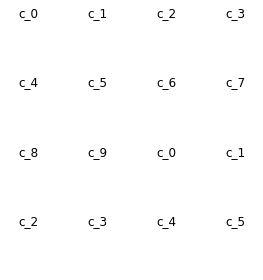

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_17\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_17\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_17\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_17\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_17\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


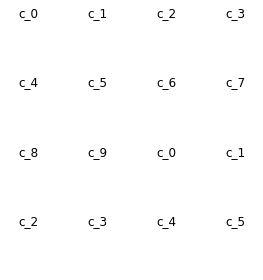

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_17\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_17\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_17\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_17\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_17\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


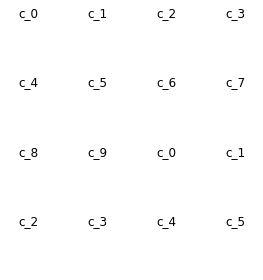

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_17\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_17\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_17\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_17\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_17\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


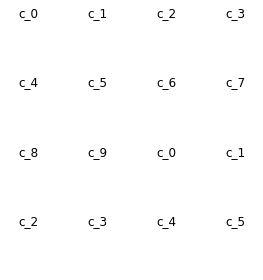

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_17\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_17\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_17\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_17\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_17\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_17\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


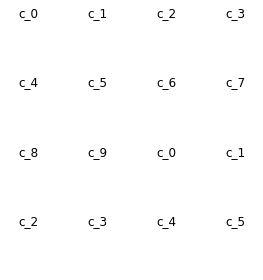

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


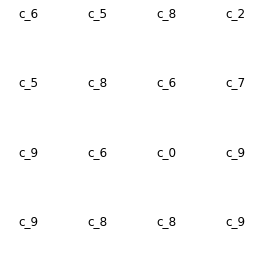

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.4000%
Saved checkpoint: checkpoints\it_17\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_17\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_17\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_17\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


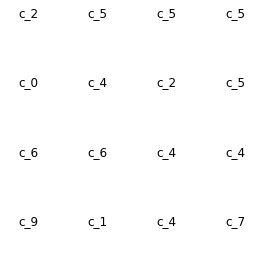

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.7391%
Saved checkpoint: checkpoints\it_17\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_17\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_17\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_17\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 18

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_18\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_18\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_18\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_18\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_18\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


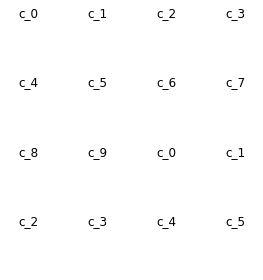

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_18\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_18\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_18\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_18\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_18\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


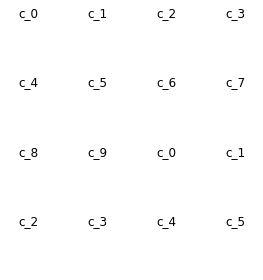

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_18\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_18\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_18\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_18\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_18\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


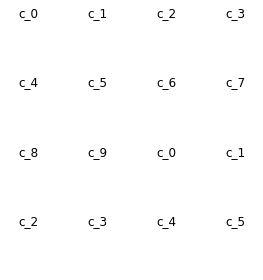

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_18\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_18\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_18\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_18\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_18\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


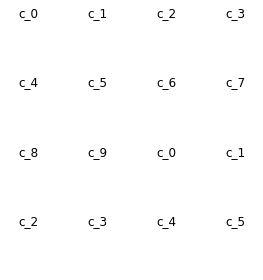

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_18\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_18\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_18\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_18\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_18\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_18\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


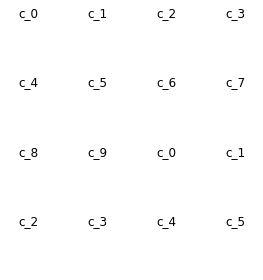

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


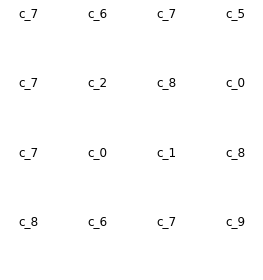

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.0000%
Saved checkpoint: checkpoints\it_18\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_18\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_18\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_18\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


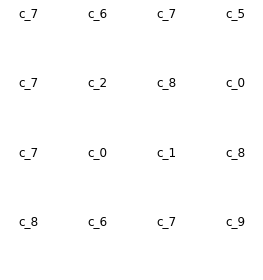

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.9643%
Saved checkpoint: checkpoints\it_18\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_18\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_18\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_18\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 19

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_19\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_19\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_19\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_19\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_19\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


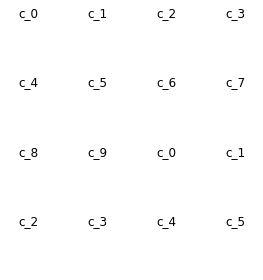

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_19\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_19\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_19\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_19\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_19\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


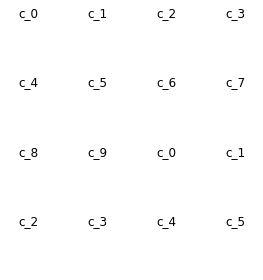

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_19\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_19\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_19\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_19\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_19\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


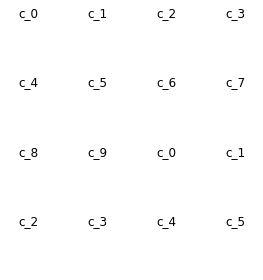

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_19\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_19\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_19\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_19\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_19\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


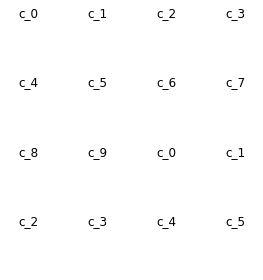

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_19\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_19\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_19\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_19\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_19\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_19\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


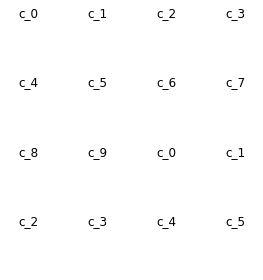

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


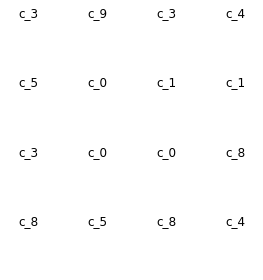

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.2000%
Saved checkpoint: checkpoints\it_19\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_19\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_19\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_19\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


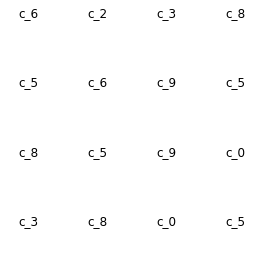

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.3030%
Saved checkpoint: checkpoints\it_19\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_19\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_19\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_19\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 20

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_20\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_20\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_20\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_20\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_20\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


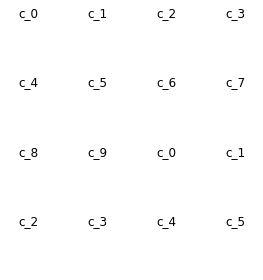

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_20\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_20\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_20\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_20\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_20\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


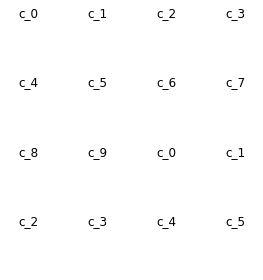

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_20\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_20\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_20\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_20\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_20\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


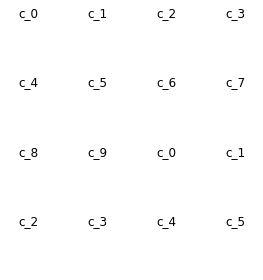

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_20\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_20\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_20\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_20\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_20\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


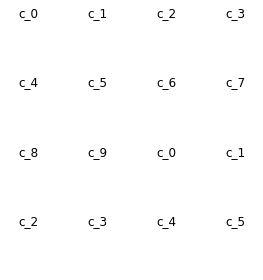

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_20\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_20\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_20\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_20\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_20\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_20\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


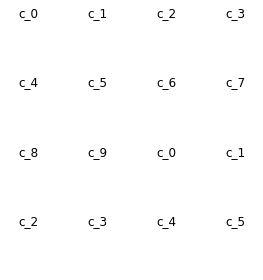

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


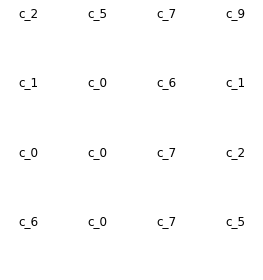

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6000%
Saved checkpoint: checkpoints\it_20\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_20\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_20\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_20\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


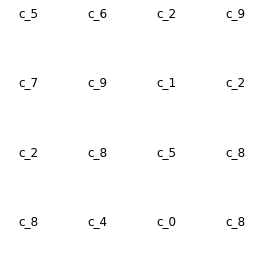

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.3421%
Saved checkpoint: checkpoints\it_20\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_20\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_20\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_20\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 21

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_21\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_21\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_21\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_21\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_21\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


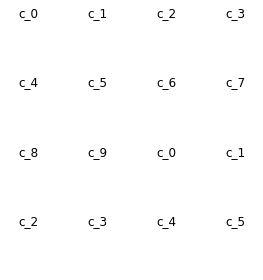

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_21\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_21\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_21\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_21\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_21\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


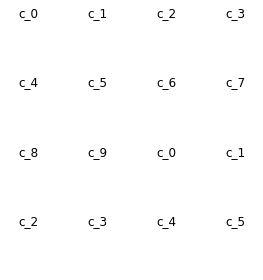

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_21\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_21\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_21\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_21\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_21\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


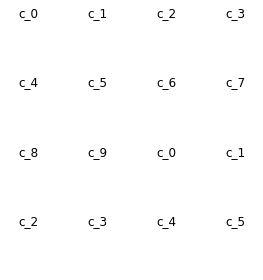

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_21\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_21\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_21\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_21\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_21\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


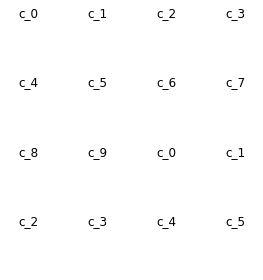

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_21\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_21\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_21\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_21\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_21\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_21\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


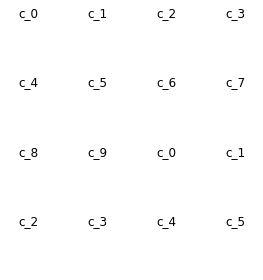

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


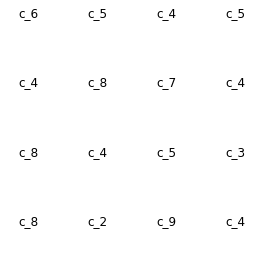

train_acc=10.2183%
accuracy of blackbox on G dataset: 8.2000%
Saved checkpoint: checkpoints\it_21\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_21\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_21\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_21\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


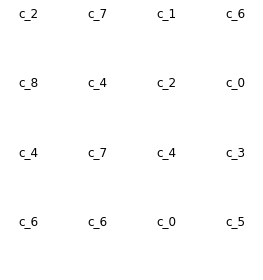

train_acc=0.0000%
accuracy of blackbox on G dataset: 5.1250%
Saved checkpoint: checkpoints\it_21\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_21\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_21\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_21\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 22

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_22\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_22\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_22\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_22\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_22\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


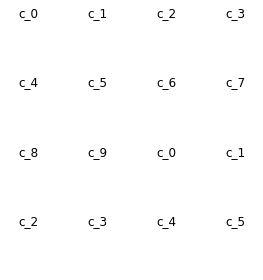

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_22\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_22\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_22\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_22\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_22\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


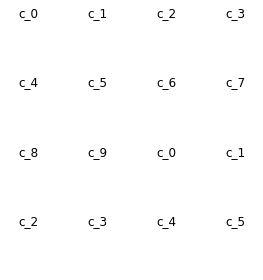

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_22\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_22\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_22\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_22\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_22\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


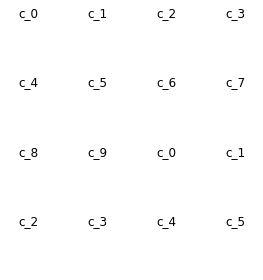

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_22\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_22\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_22\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_22\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_22\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


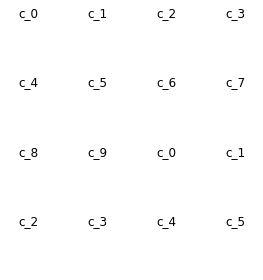

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_22\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_22\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_22\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_22\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_22\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_22\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


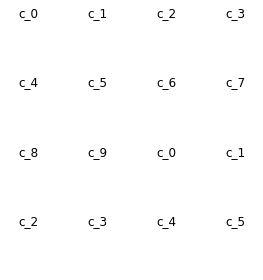

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


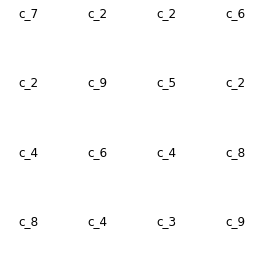

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.4000%
Saved checkpoint: checkpoints\it_22\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_22\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_22\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_22\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


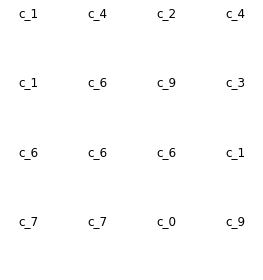

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.1538%
Saved checkpoint: checkpoints\it_22\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_22\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_22\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_22\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 23

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_23\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_23\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_23\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_23\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_23\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


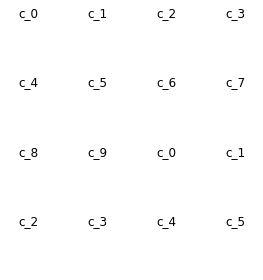

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_23\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_23\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_23\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_23\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_23\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


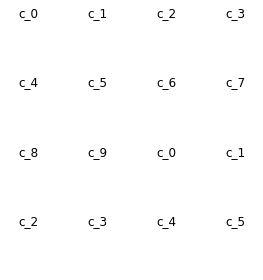

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_23\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_23\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_23\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_23\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_23\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


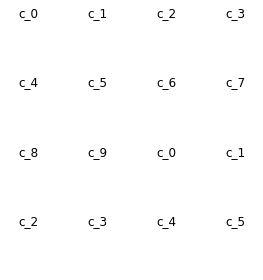

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_23\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_23\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_23\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_23\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_23\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


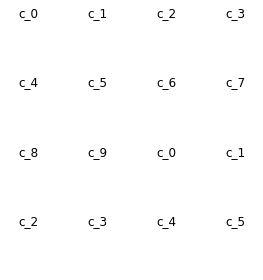

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_23\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_23\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_23\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_23\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_23\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_23\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


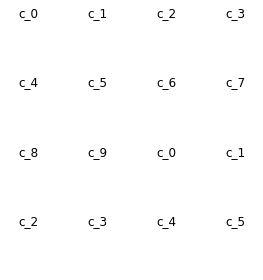

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


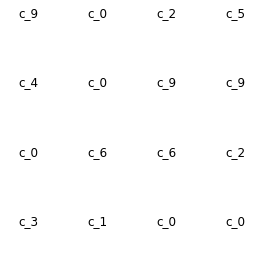

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.2000%
Saved checkpoint: checkpoints\it_23\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_23\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_23\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_23\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


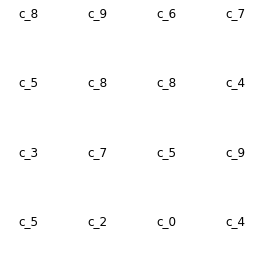

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.4444%
Saved checkpoint: checkpoints\it_23\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_23\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_23\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_23\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 24

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_24\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_24\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_24\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_24\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_24\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


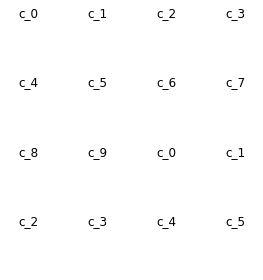

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_24\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_24\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_24\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_24\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_24\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


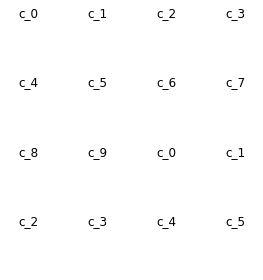

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_24\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_24\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_24\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_24\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_24\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


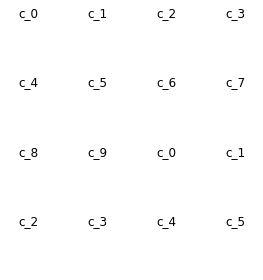

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_24\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_24\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_24\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_24\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_24\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


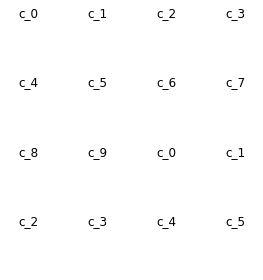

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_24\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_24\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_24\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_24\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_24\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_24\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


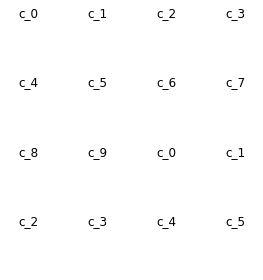

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


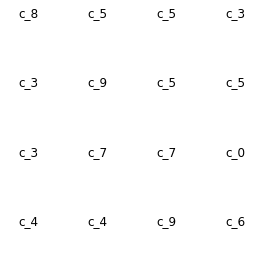

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 12.0000%
Saved checkpoint: checkpoints\it_24\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_24\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_24\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_24\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


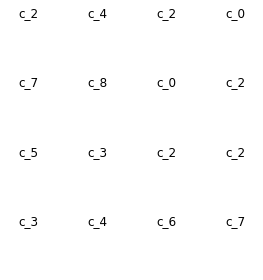

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.4348%
Saved checkpoint: checkpoints\it_24\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_24\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_24\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_24\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 25

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_25\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_25\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_25\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_25\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_25\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


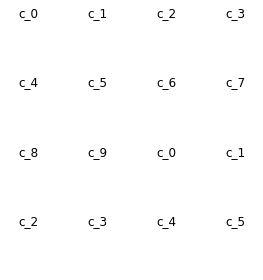

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_25\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_25\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_25\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_25\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_25\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


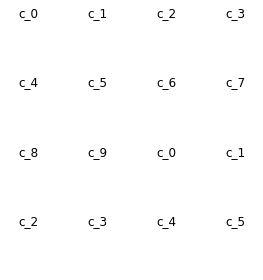

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_25\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_25\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_25\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_25\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_25\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


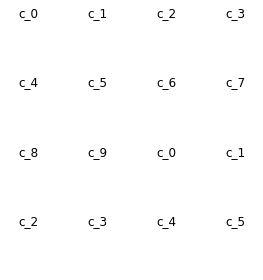

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_25\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_25\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_25\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_25\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_25\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


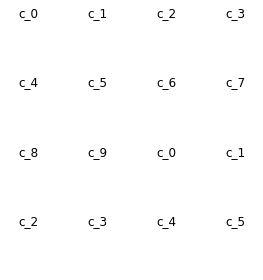

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_25\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_25\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_25\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_25\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_25\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_25\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


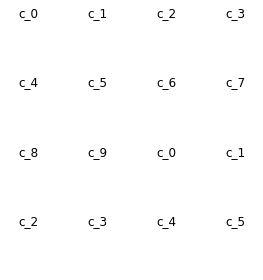

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


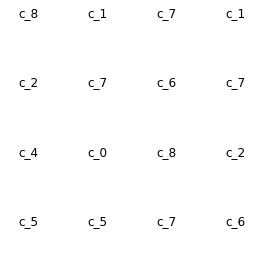

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0000%
Saved checkpoint: checkpoints\it_25\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_25\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_25\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_25\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


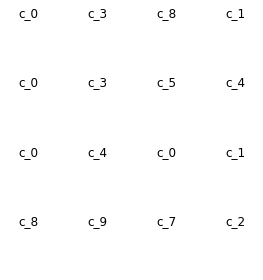

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.3571%
Saved checkpoint: checkpoints\it_25\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_25\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_25\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_25\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 26

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_26\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_26\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_26\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_26\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_26\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


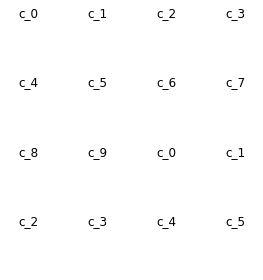

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_26\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_26\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_26\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_26\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_26\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


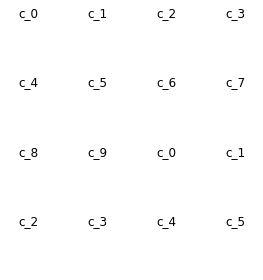

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_26\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_26\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_26\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_26\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_26\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


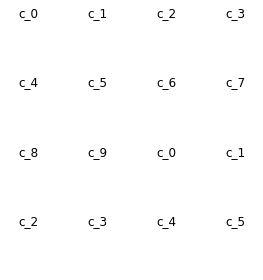

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_26\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_26\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_26\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_26\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_26\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


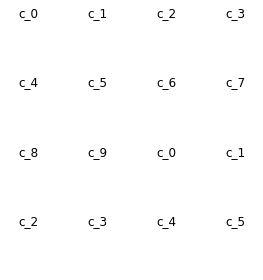

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_26\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_26\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_26\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_26\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_26\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_26\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


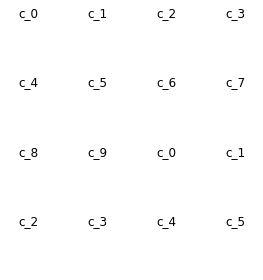

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


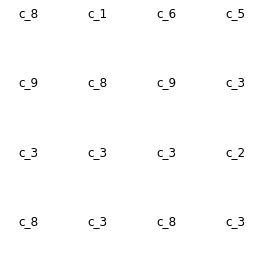

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.8000%
Saved checkpoint: checkpoints\it_26\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_26\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_26\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_26\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


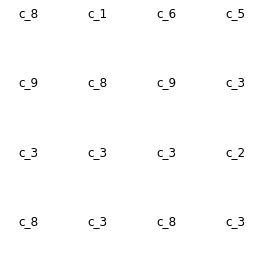

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.7273%
Saved checkpoint: checkpoints\it_26\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_26\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_26\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_26\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 27

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_27\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_27\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_27\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_27\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_27\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


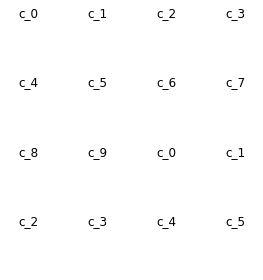

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_27\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_27\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_27\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_27\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_27\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


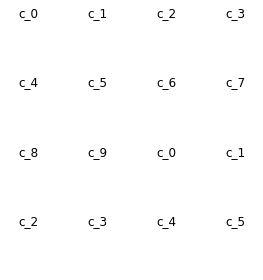

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_27\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_27\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_27\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_27\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_27\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


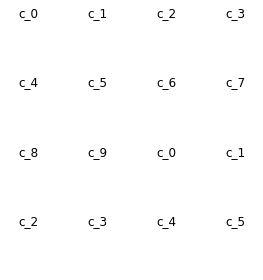

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_27\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_27\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_27\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_27\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_27\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


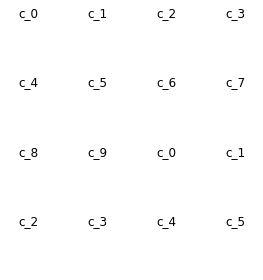

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_27\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_27\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_27\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_27\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_27\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_27\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


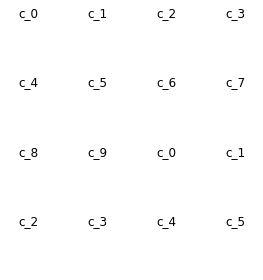

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


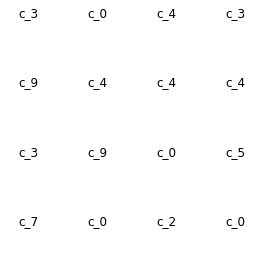

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 7.6000%
Saved checkpoint: checkpoints\it_27\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_27\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_27\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_27\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


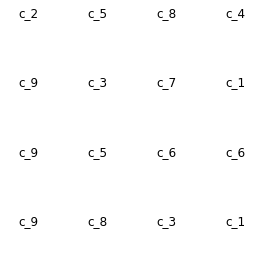

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.5789%
Saved checkpoint: checkpoints\it_27\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_27\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_27\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_27\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 28

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_28\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_28\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_28\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


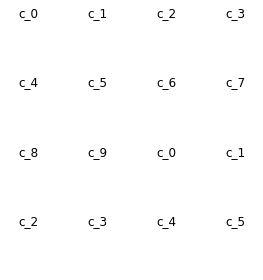

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_28\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_28\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_28\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


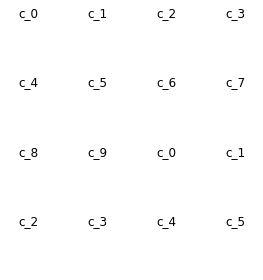

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_28\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_28\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_28\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


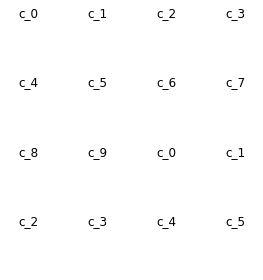

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_28\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_28\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_28\c_generator_checkpoint\ckpt-4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


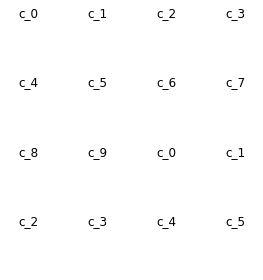

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_28\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_28\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_28\c_generator_checkpoint\ckpt-5
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


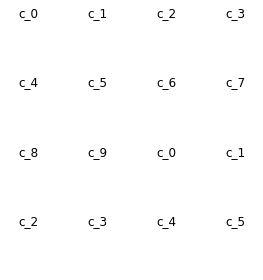

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_28\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_28\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_28\c_generator_checkpoint\ckpt-6
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


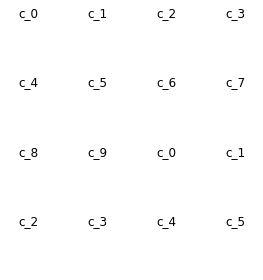

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_28\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_28\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_28\c_generator_checkpoint\ckpt-7
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


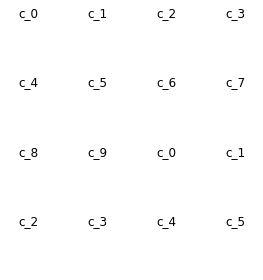

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_28\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_28\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_28\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_28\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_28\c_generator_checkpoint\ckpt-8
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


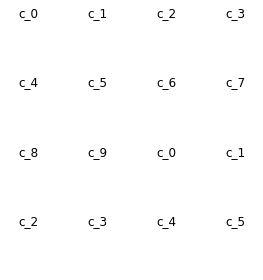

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


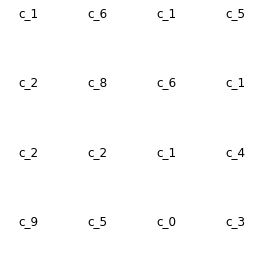

train_acc=10.2183%
accuracy of blackbox on G dataset: 9.2000%
Saved checkpoint: checkpoints\it_28\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_28\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_28\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_28\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


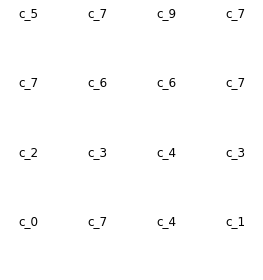

train_acc=0.0000%
accuracy of blackbox on G dataset: 5.7500%
Saved checkpoint: checkpoints\it_28\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_28\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_28\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_28\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 29

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_29\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_29\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_29\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_29\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_29\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


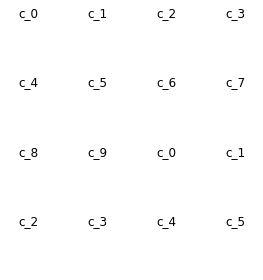

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_29\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_29\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_29\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_29\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_29\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


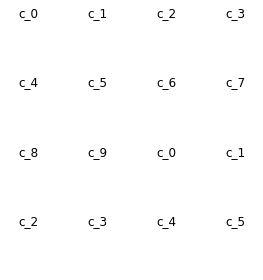

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_29\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_29\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_29\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_29\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_29\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


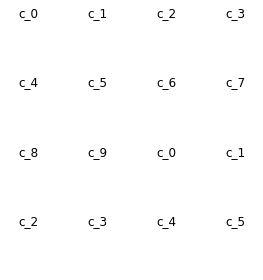

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_29\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_29\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_29\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_29\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_29\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


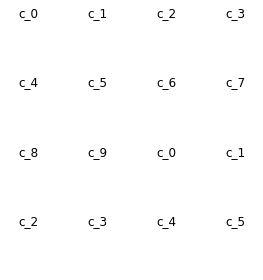

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_29\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_29\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_29\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_29\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_29\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_29\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


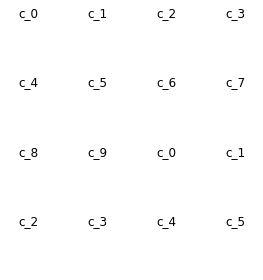

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


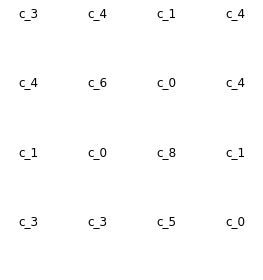

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.4000%
Saved checkpoint: checkpoints\it_29\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_29\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_29\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_29\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


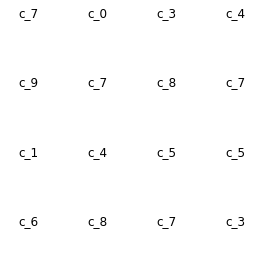

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.9231%
Saved checkpoint: checkpoints\it_29\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_29\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_29\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_29\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 30

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_30\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_30\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_30\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_30\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_30\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


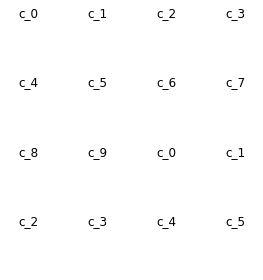

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_30\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_30\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_30\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_30\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_30\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


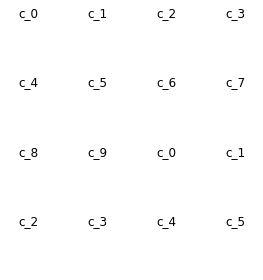

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_30\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_30\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_30\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_30\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_30\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


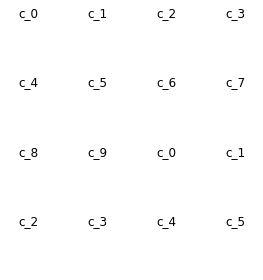

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_30\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_30\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_30\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_30\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_30\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


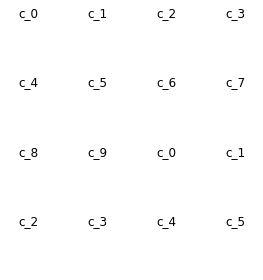

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_30\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_30\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_30\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_30\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_30\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_30\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


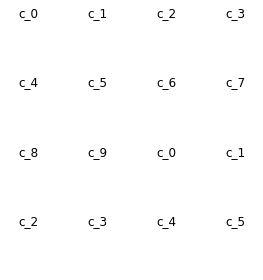

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


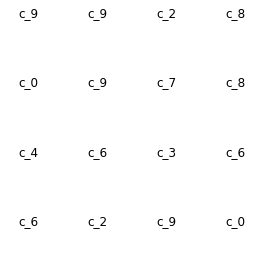

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.2000%
Saved checkpoint: checkpoints\it_30\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_30\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_30\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_30\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


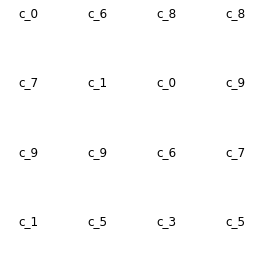

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.5556%
Saved checkpoint: checkpoints\it_30\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_30\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_30\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_30\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 31

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_31\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_31\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_31\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


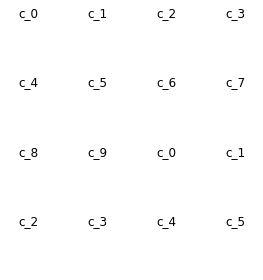

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_31\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_31\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_31\c_generator_checkpoint\ckpt-2


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


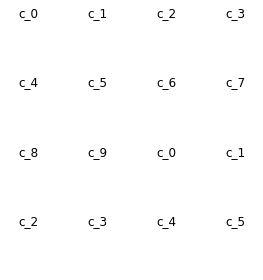

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_31\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_31\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_31\c_generator_checkpoint\ckpt-3


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


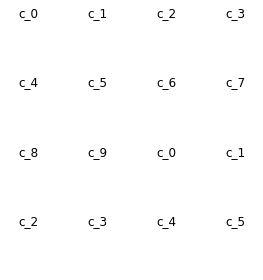

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_31\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_31\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_31\c_generator_checkpoint\ckpt-4
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


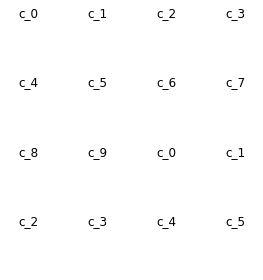

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_31\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_31\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_31\c_generator_checkpoint\ckpt-5
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


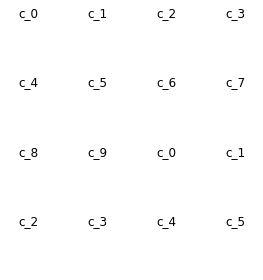

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_31\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_31\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_31\c_generator_checkpoint\ckpt-6
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


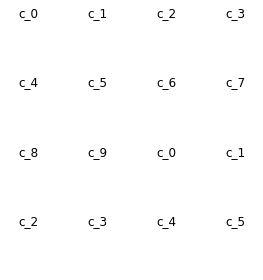

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_31\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_31\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_31\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_31\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_31\c_generator_checkpoint\ckpt-7
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


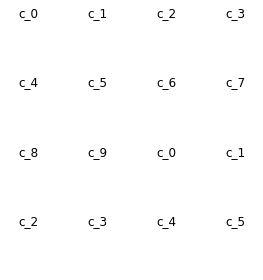

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


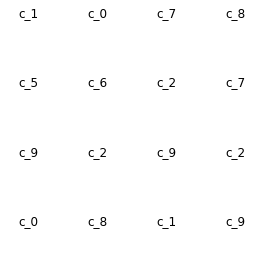

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6000%
Saved checkpoint: checkpoints\it_31\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_31\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_31\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_31\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


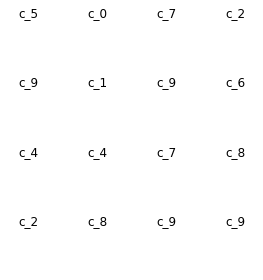

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.7826%
Saved checkpoint: checkpoints\it_31\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_31\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_31\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_31\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 32

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_32\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_32\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_32\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_32\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_32\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


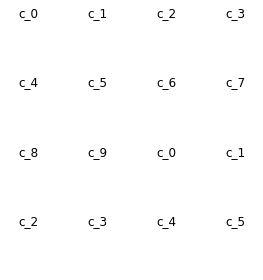

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_32\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_32\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_32\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_32\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_32\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


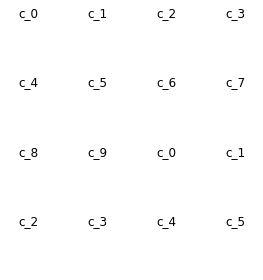

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_32\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_32\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_32\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_32\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_32\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


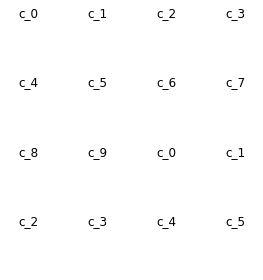

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_32\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_32\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_32\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_32\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_32\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


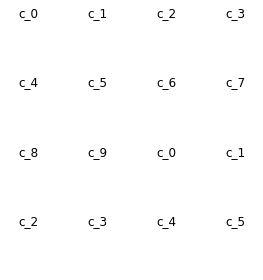

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_32\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_32\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_32\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_32\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_32\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_32\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


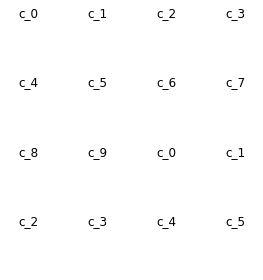

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


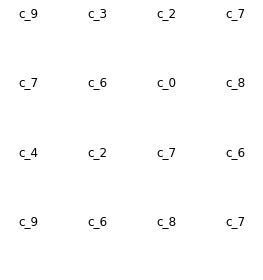

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.0000%
Saved checkpoint: checkpoints\it_32\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_32\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_32\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_32\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


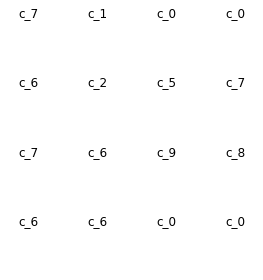

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.0000%
Saved checkpoint: checkpoints\it_32\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_32\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_32\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_32\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 33

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_33\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_33\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_33\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_33\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_33\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


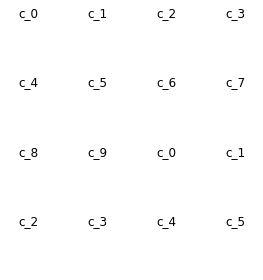

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_33\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_33\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_33\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_33\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_33\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


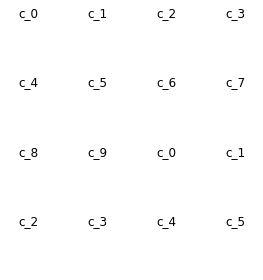

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_33\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_33\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_33\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_33\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_33\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


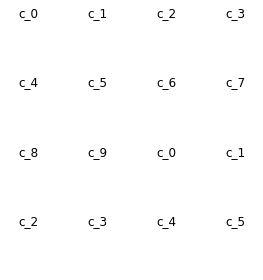

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_33\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_33\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_33\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_33\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_33\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


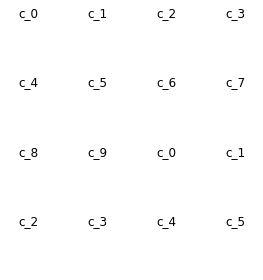

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_33\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_33\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_33\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_33\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_33\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_33\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


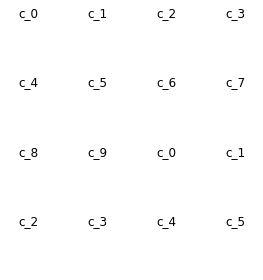

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


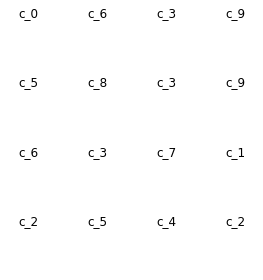

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.4000%
Saved checkpoint: checkpoints\it_33\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_33\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_33\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_33\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


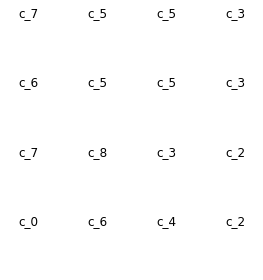

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.9091%
Saved checkpoint: checkpoints\it_33\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_33\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_33\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_33\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 34

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_34\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_34\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_34\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_34\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_34\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


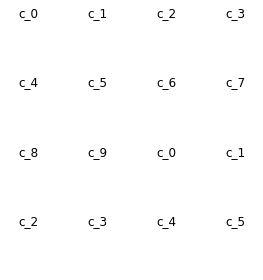

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_34\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_34\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_34\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_34\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_34\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


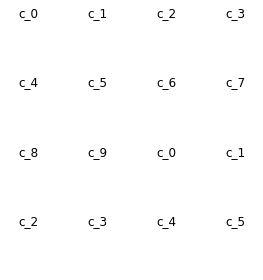

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_34\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_34\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_34\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_34\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_34\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


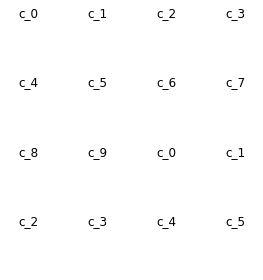

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_34\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_34\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_34\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_34\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_34\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


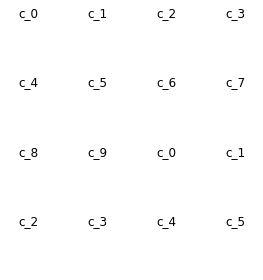

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_34\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_34\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_34\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_34\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_34\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_34\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


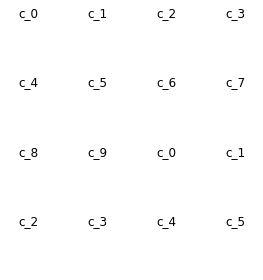

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


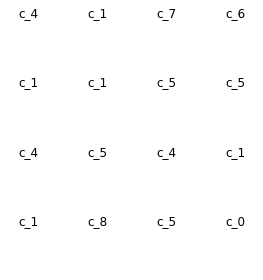

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.0000%
Saved checkpoint: checkpoints\it_34\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_34\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_34\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_34\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


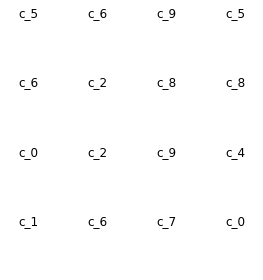

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.9211%
Saved checkpoint: checkpoints\it_34\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_34\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_34\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_34\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 35

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_35\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_35\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_35\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


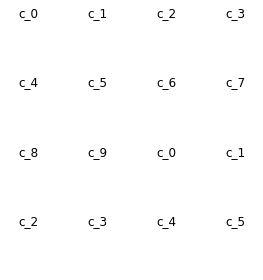

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_35\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_35\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_35\c_generator_checkpoint\ckpt-2


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


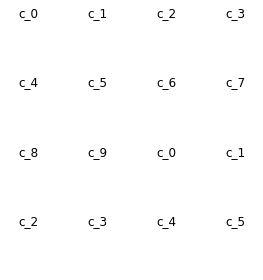

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_35\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_35\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_35\c_generator_checkpoint\ckpt-3
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


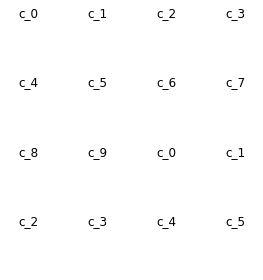

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_35\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_35\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_35\c_generator_checkpoint\ckpt-4
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


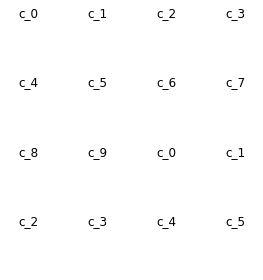

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_35\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_35\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_35\c_generator_checkpoint\ckpt-5
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


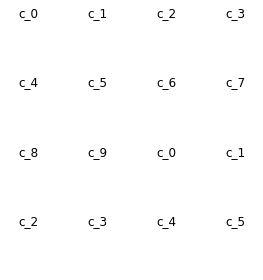

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_35\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_35\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_35\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_35\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_35\c_generator_checkpoint\ckpt-6
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


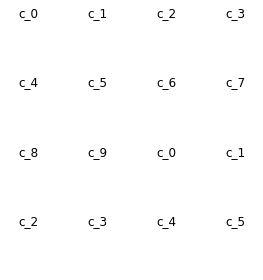

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


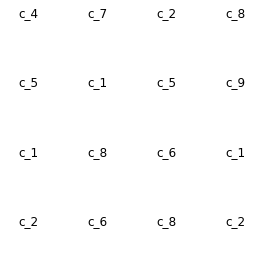

train_acc=10.2183%
accuracy of blackbox on G dataset: 10.8000%
Saved checkpoint: checkpoints\it_35\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_35\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_35\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_35\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


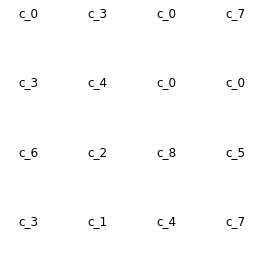

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.7500%
Saved checkpoint: checkpoints\it_35\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_35\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_35\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_35\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 36

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_36\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_36\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_36\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


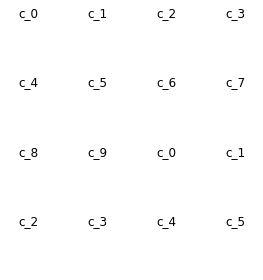

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_36\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_36\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_36\c_generator_checkpoint\ckpt-2


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


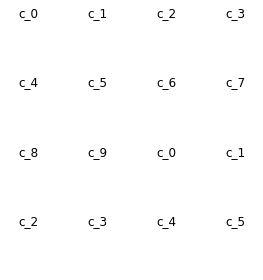

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_36\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_36\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_36\c_generator_checkpoint\ckpt-3
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


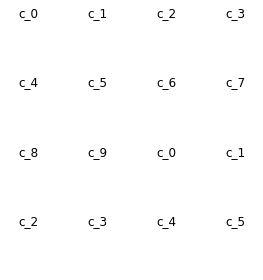

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_36\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_36\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_36\c_generator_checkpoint\ckpt-4
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


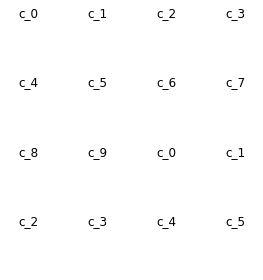

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_36\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_36\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_36\c_generator_checkpoint\ckpt-5
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


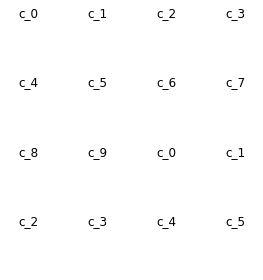

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_36\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_36\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_36\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_36\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_36\c_generator_checkpoint\ckpt-6
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


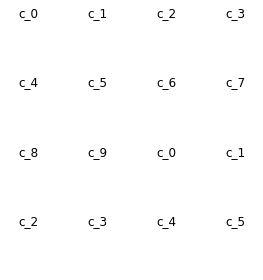

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


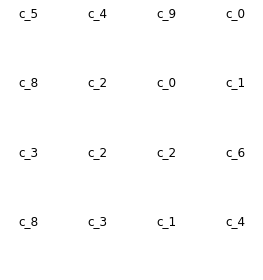

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.2000%
Saved checkpoint: checkpoints\it_36\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_36\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_36\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_36\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


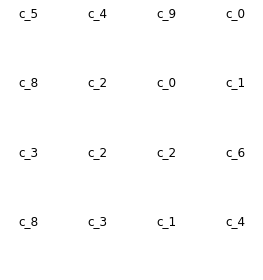

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.3077%
Saved checkpoint: checkpoints\it_36\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_36\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_36\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_36\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 37

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_37\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_37\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_37\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_37\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_37\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


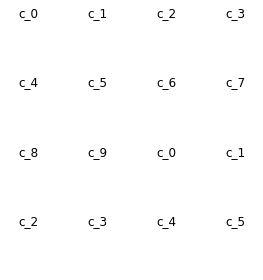

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_37\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_37\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_37\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_37\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_37\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


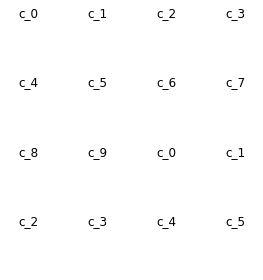

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_37\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_37\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_37\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_37\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_37\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


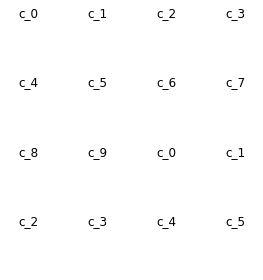

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_37\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_37\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_37\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_37\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_37\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


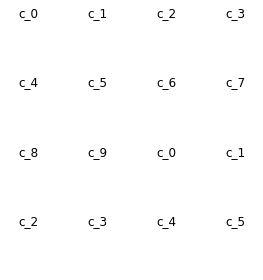

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_37\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_37\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_37\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_37\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_37\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_37\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


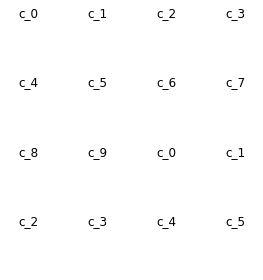

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


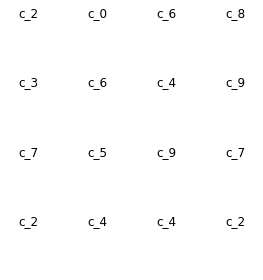

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.8000%
Saved checkpoint: checkpoints\it_37\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_37\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_37\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_37\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


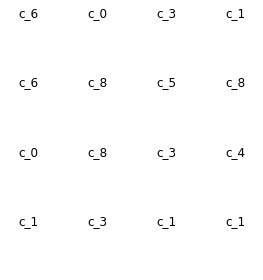

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0000%
Saved checkpoint: checkpoints\it_37\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_37\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_37\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_37\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 38

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_38\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_38\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_38\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_38\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_38\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


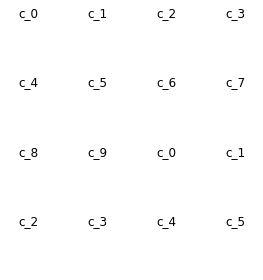

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_38\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_38\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_38\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_38\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_38\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


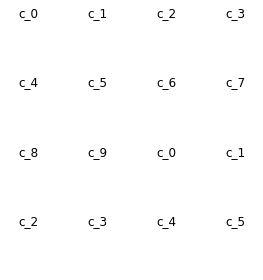

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_38\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_38\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_38\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_38\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_38\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


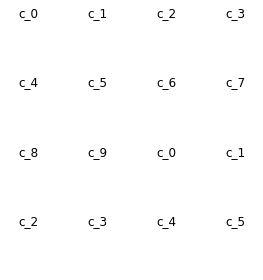

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_38\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_38\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_38\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_38\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_38\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


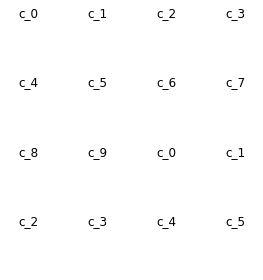

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_38\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_38\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_38\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_38\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_38\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_38\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


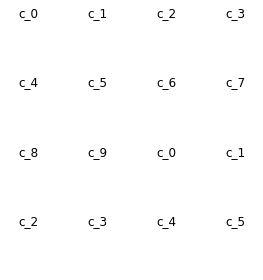

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


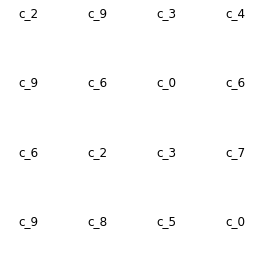

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.6000%
Saved checkpoint: checkpoints\it_38\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_38\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_38\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_38\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


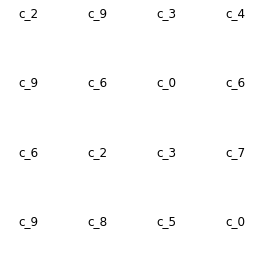

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.5652%
Saved checkpoint: checkpoints\it_38\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_38\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_38\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_38\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 39

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_39\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_39\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_39\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


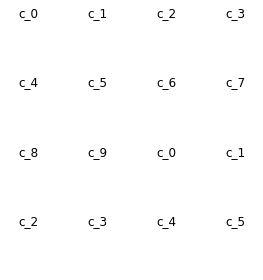

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_39\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_39\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_39\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


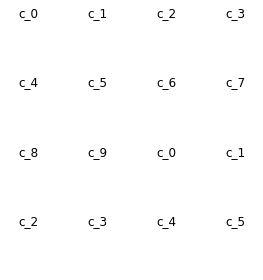

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_39\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_39\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_39\c_generator_checkpoint\ckpt-3


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


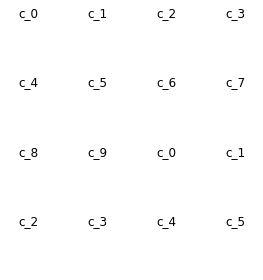

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_39\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_39\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_39\c_generator_checkpoint\ckpt-4
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


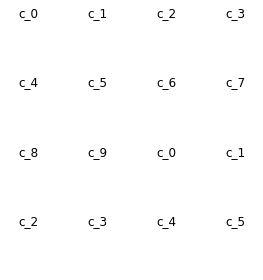

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_39\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_39\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_39\c_generator_checkpoint\ckpt-5
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


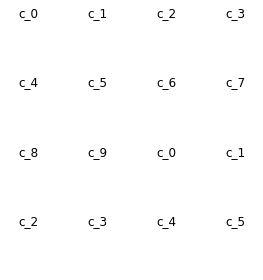

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_39\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_39\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_39\c_generator_checkpoint\ckpt-6
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


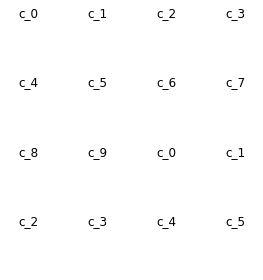

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_39\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_39\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_39\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_39\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_39\c_generator_checkpoint\ckpt-7
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


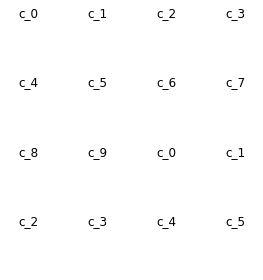

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


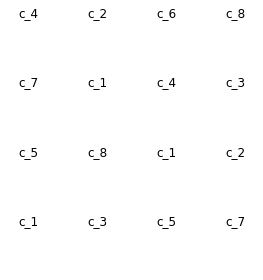

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.8000%
Saved checkpoint: checkpoints\it_39\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_39\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_39\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_39\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


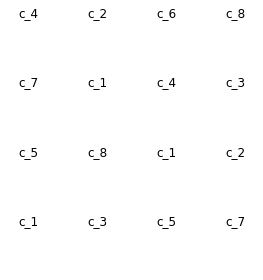

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.1429%
Saved checkpoint: checkpoints\it_39\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_39\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_39\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_39\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 40

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_40\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_40\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_40\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


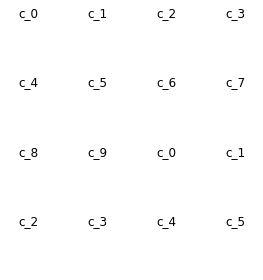

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_40\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_40\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_40\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


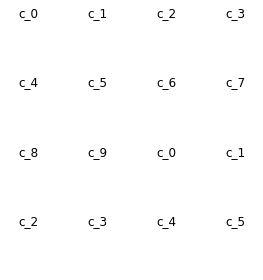

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_40\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_40\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_40\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


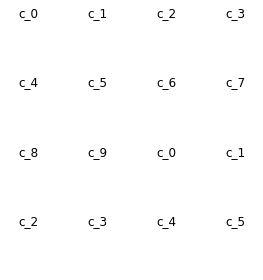

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_40\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_40\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_40\c_generator_checkpoint\ckpt-4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


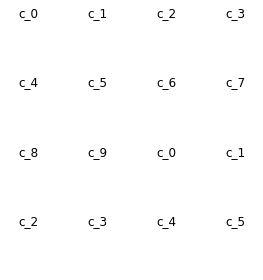

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_40\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_40\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_40\c_generator_checkpoint\ckpt-5
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


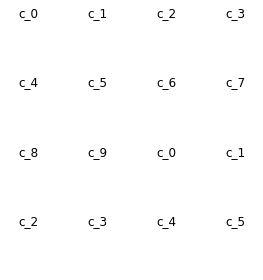

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_40\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_40\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_40\c_generator_checkpoint\ckpt-6
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


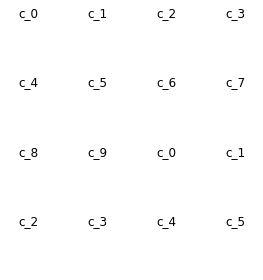

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_40\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_40\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_40\c_generator_checkpoint\ckpt-7
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


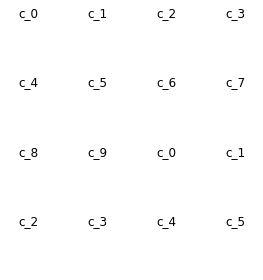

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_40\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_40\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_40\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_40\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_40\c_generator_checkpoint\ckpt-8
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


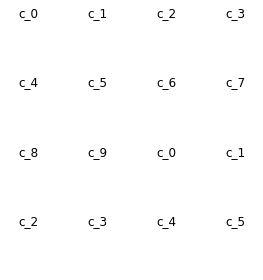

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


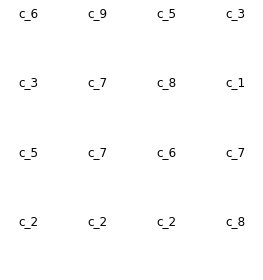

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.4000%
Saved checkpoint: checkpoints\it_40\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_40\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_40\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_40\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


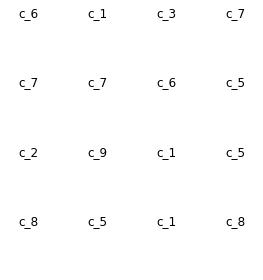

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.3333%
Saved checkpoint: checkpoints\it_40\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_40\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_40\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_40\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 41

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_41\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_41\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_41\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_41\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_41\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


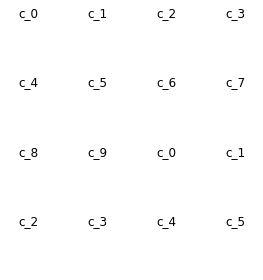

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_41\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_41\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_41\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_41\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_41\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


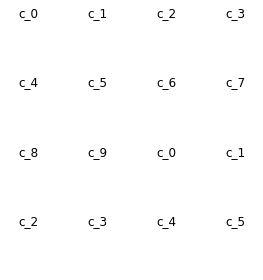

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_41\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_41\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_41\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_41\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_41\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


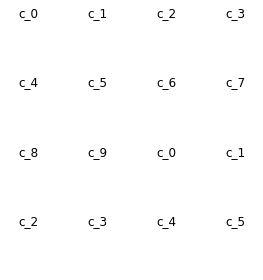

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_41\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_41\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_41\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_41\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_41\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


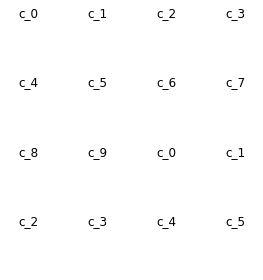

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_41\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_41\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_41\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_41\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_41\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_41\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


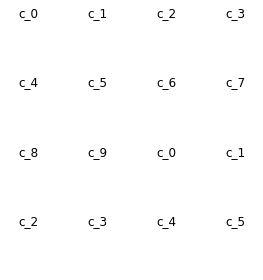

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


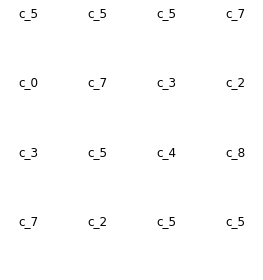

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8000%
Saved checkpoint: checkpoints\it_41\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_41\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_41\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_41\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


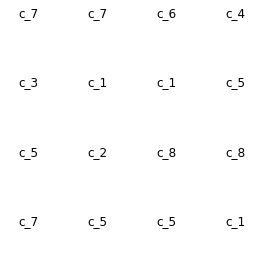

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2632%
Saved checkpoint: checkpoints\it_41\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_41\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_41\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_41\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 42

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_42\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_42\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_42\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_42\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_42\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


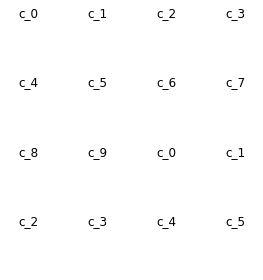

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_42\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_42\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_42\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_42\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_42\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


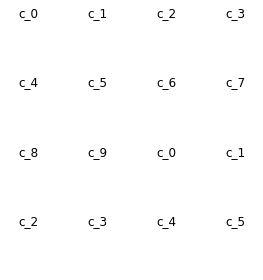

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_42\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_42\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_42\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_42\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_42\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


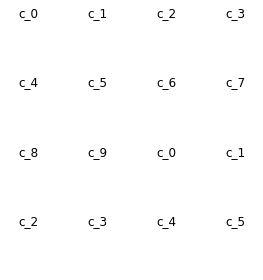

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_42\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_42\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_42\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_42\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_42\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


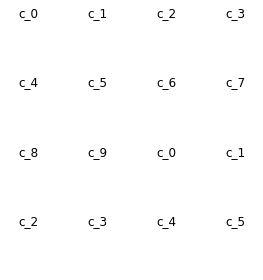

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_42\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_42\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_42\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_42\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_42\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_42\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


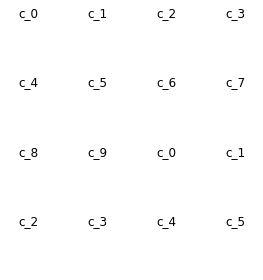

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


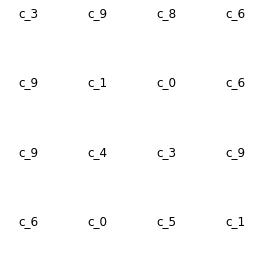

train_acc=10.2183%
accuracy of blackbox on G dataset: 10.0000%
Saved checkpoint: checkpoints\it_42\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_42\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_42\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_42\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


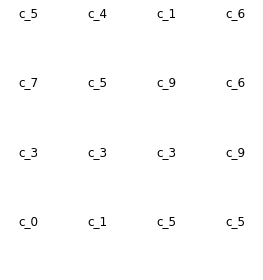

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.2500%
Saved checkpoint: checkpoints\it_42\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_42\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_42\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_42\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 43

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_43\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_43\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_43\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


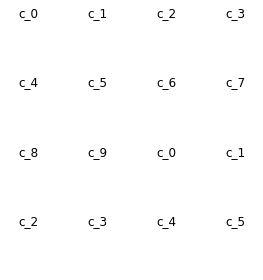

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_43\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_43\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_43\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


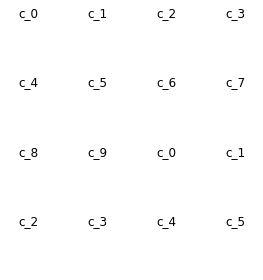

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_43\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_43\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_43\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


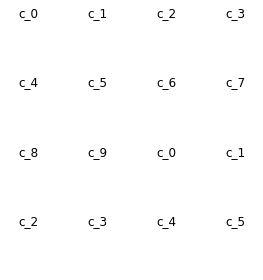

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_43\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_43\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_43\c_generator_checkpoint\ckpt-4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


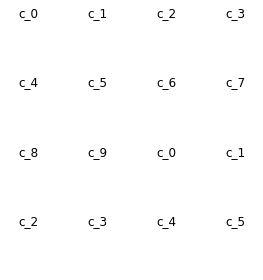

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_43\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_43\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_43\c_generator_checkpoint\ckpt-5
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


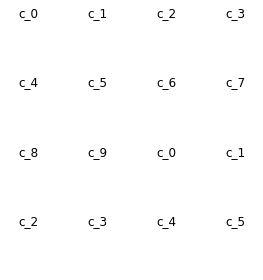

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_43\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_43\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_43\c_generator_checkpoint\ckpt-6
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


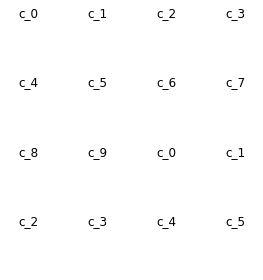

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_43\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_43\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_43\c_generator_checkpoint\ckpt-7
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


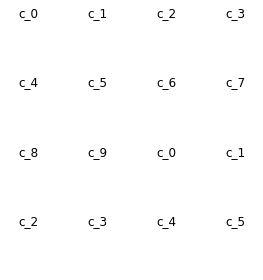

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_43\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_43\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_43\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_43\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_43\c_generator_checkpoint\ckpt-8
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


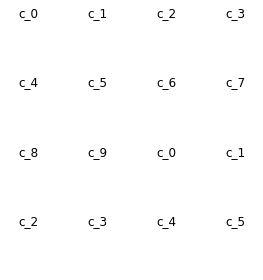

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


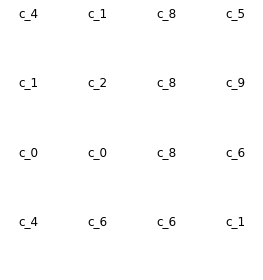

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.2000%
Saved checkpoint: checkpoints\it_43\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_43\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_43\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_43\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


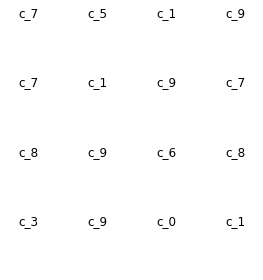

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.1538%
Saved checkpoint: checkpoints\it_43\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_43\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_43\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_43\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 44

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_44\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_44\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_44\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


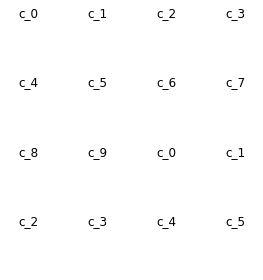

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_44\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_44\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_44\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


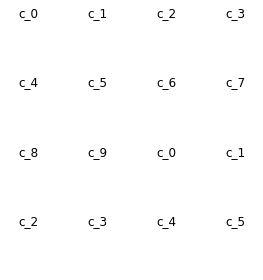

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_44\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_44\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_44\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


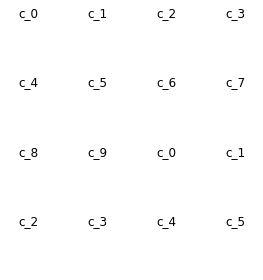

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_44\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_44\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_44\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


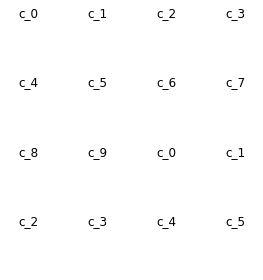

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_44\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_44\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_44\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_44\c_generator_checkpoint\ckpt-5


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


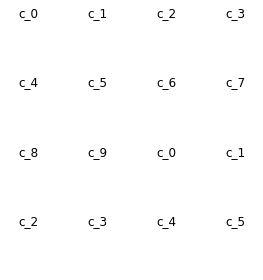

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_44\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_44\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_44\c_generator_checkpoint\ckpt-6
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


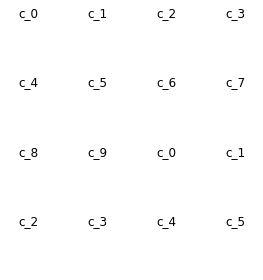

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_44\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_44\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_44\c_generator_checkpoint\ckpt-7
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


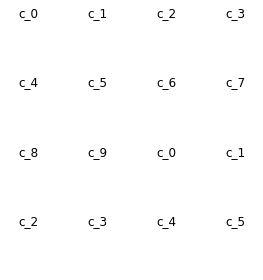

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_44\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_44\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_44\c_generator_checkpoint\ckpt-8
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


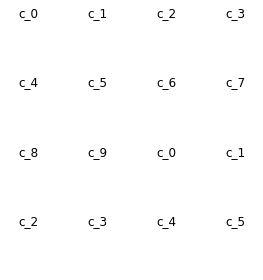

--------------------
Epoch 9/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_44\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_44\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_44\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_44\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_44\c_generator_checkpoint\ckpt-9
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


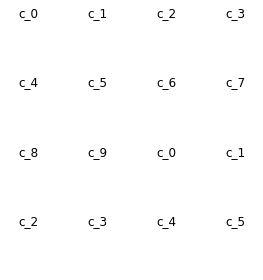

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


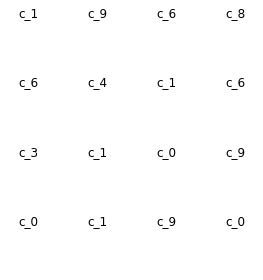

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.8000%
Saved checkpoint: checkpoints\it_44\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_44\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_44\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_44\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


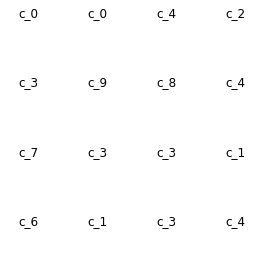

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8889%
Saved checkpoint: checkpoints\it_44\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_44\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_44\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_44\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 45

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_45\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_45\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_45\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_45\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_45\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


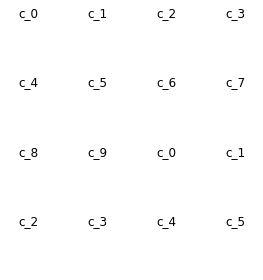

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_45\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_45\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_45\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_45\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_45\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


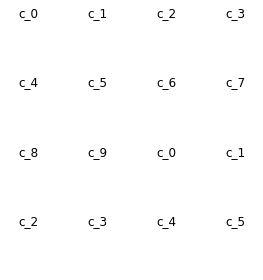

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_45\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_45\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_45\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_45\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_45\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


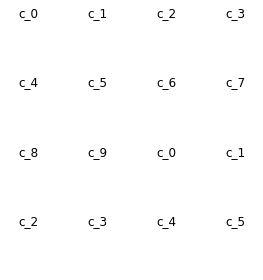

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_45\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_45\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_45\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_45\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_45\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


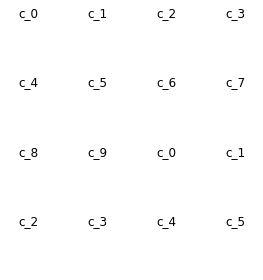

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_45\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_45\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_45\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_45\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_45\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_45\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


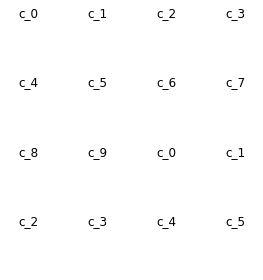

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


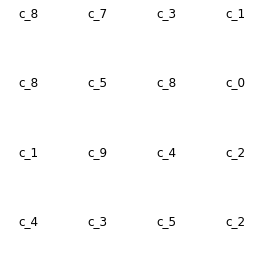

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.6000%
Saved checkpoint: checkpoints\it_45\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_45\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_45\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_45\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


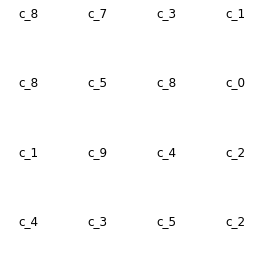

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4783%
Saved checkpoint: checkpoints\it_45\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_45\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_45\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_45\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 46

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_46\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_46\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_46\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


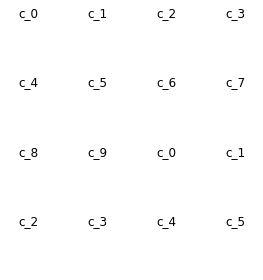

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_46\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_46\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_46\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


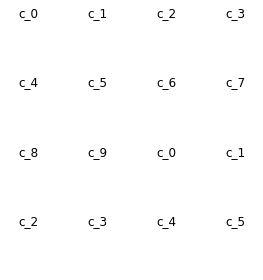

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_46\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_46\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_46\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


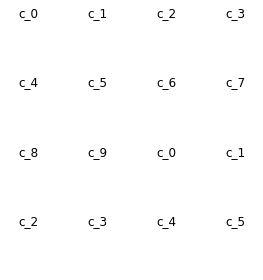

--------------------
Epoch 4/25


g_acc=0.09, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_46\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_46\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_46\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


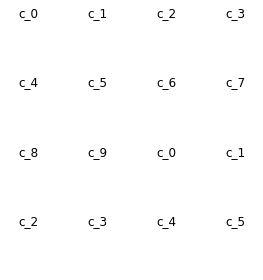

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_46\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_46\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_46\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_46\c_generator_checkpoint\ckpt-5


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


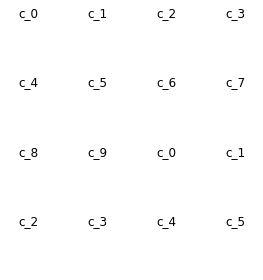

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_46\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_46\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_46\c_generator_checkpoint\ckpt-6
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


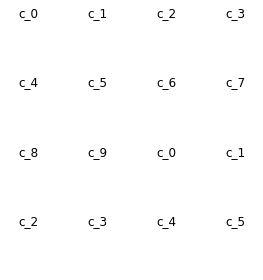

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_46\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_46\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_46\c_generator_checkpoint\ckpt-7


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


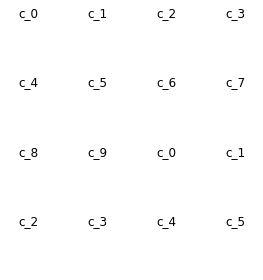

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_46\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_46\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_46\c_generator_checkpoint\ckpt-8
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


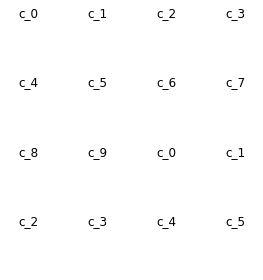

--------------------
Epoch 9/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_46\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_46\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_46\c_generator_checkpoint\ckpt-9
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


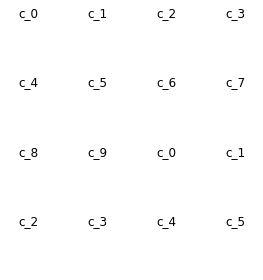

--------------------
Epoch 10/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_46\discriminator_checkpoint\ckpt-10
Saved D checkpoint: checkpoints\it_46\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_46\c_generator_checkpoint\ckpt-10
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


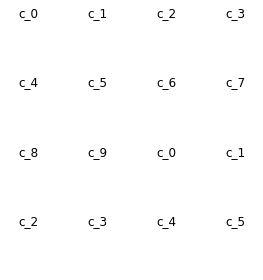

--------------------
Epoch 11/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_46\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_46\discriminator_checkpoint\ckpt-11
Saved D checkpoint: checkpoints\it_46\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_46\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_46\c_generator_checkpoint\ckpt-11
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


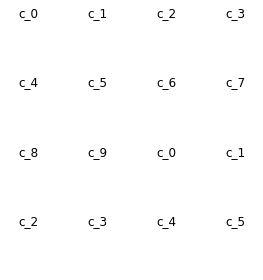

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


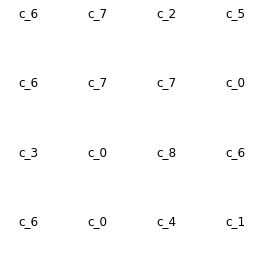

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.4000%
Saved checkpoint: checkpoints\it_46\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_46\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_46\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_46\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


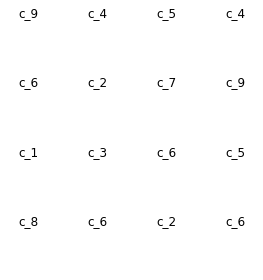

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2857%
Saved checkpoint: checkpoints\it_46\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_46\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_46\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_46\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 47

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_47\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_47\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_47\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_47\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_47\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


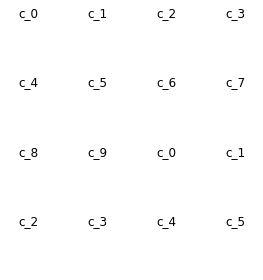

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_47\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_47\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_47\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_47\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_47\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


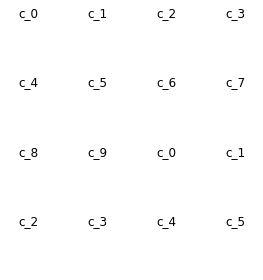

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_47\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_47\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_47\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_47\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_47\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


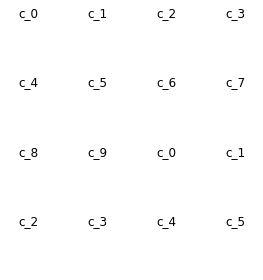

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_47\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_47\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_47\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_47\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_47\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


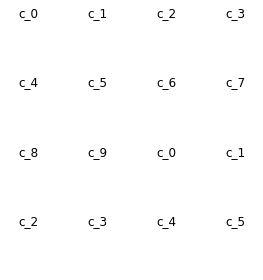

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_47\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_47\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_47\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_47\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_47\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_47\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


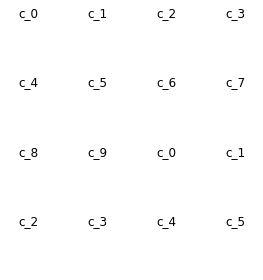

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


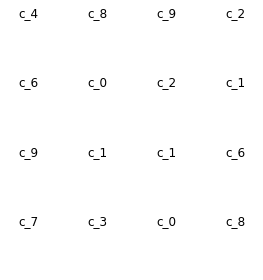

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8000%
Saved checkpoint: checkpoints\it_47\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_47\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_47\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_47\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


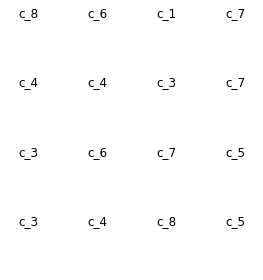

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2121%
Saved checkpoint: checkpoints\it_47\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_47\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_47\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_47\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 48

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_48\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_48\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_48\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_48\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_48\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


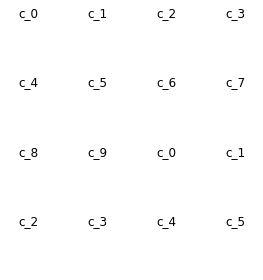

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_48\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_48\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_48\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_48\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_48\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


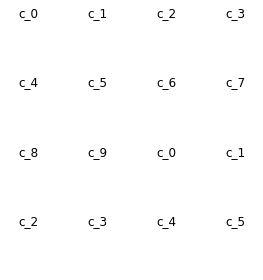

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_48\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_48\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_48\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_48\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_48\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


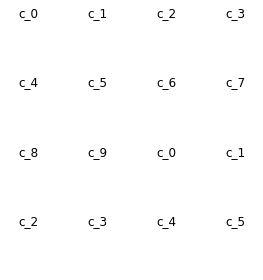

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_48\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_48\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_48\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_48\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_48\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


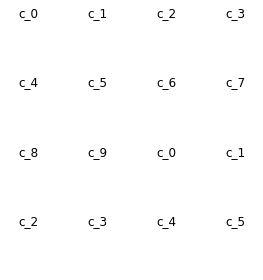

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_48\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_48\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_48\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_48\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_48\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_48\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


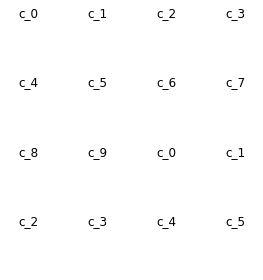

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


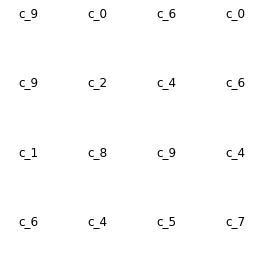

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_48\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_48\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_48\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_48\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


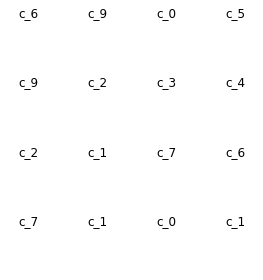

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2368%
Saved checkpoint: checkpoints\it_48\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_48\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_48\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_48\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 49

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_49\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_49\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_49\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_49\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_49\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


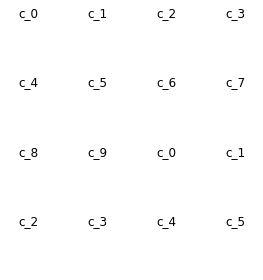

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_49\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_49\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_49\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_49\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_49\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


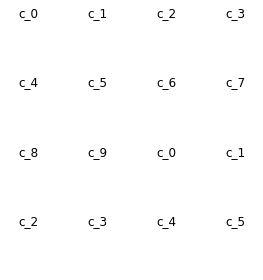

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_49\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_49\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_49\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_49\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_49\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


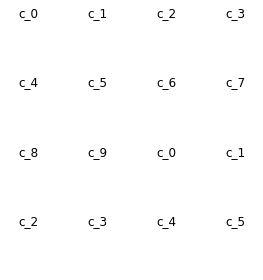

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_49\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_49\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_49\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_49\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_49\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


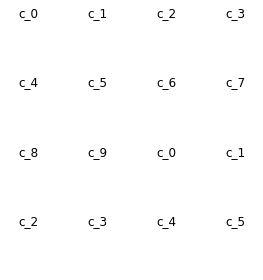

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_49\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_49\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_49\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_49\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_49\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_49\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


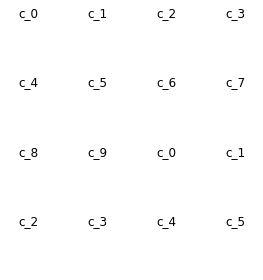

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


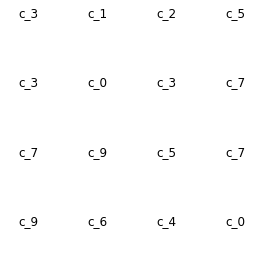

train_acc=10.2183%
accuracy of blackbox on G dataset: 11.0000%
Saved checkpoint: checkpoints\it_49\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_49\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_49\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_49\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


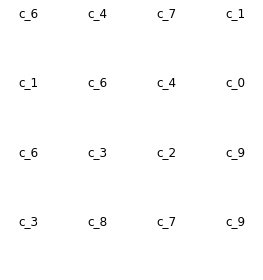

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.8750%
Saved checkpoint: checkpoints\it_49\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_49\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_49\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_49\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 50

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_50\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_50\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_50\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_50\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_50\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


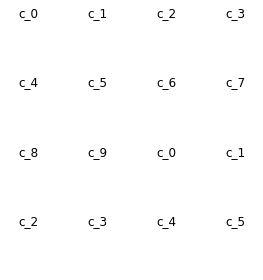

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_50\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_50\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_50\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_50\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_50\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


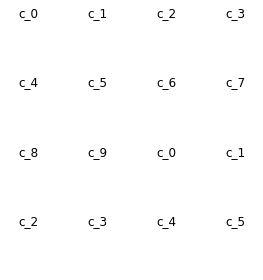

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_50\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_50\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_50\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_50\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_50\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


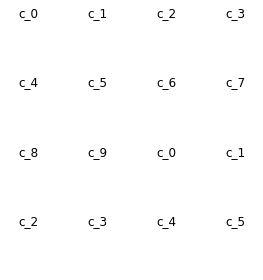

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_50\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_50\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_50\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_50\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_50\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


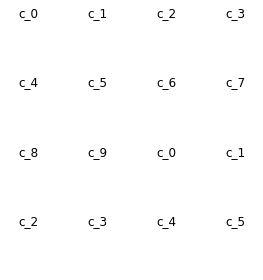

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_50\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_50\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_50\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_50\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_50\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_50\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


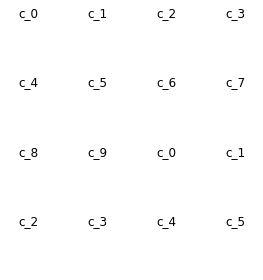

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


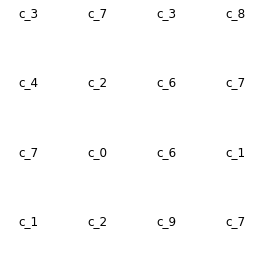

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2000%
Saved checkpoint: checkpoints\it_50\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_50\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_50\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_50\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


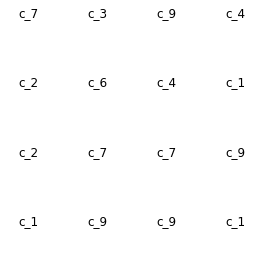

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.7692%
Saved checkpoint: checkpoints\it_50\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_50\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_50\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_50\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 51

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_51\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_51\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_51\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_51\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_51\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


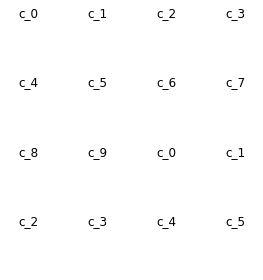

--------------------
Epoch 2/25


g_acc=0.09, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_51\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_51\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_51\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_51\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_51\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


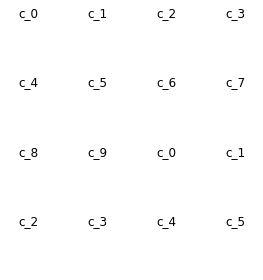

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_51\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_51\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_51\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_51\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_51\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


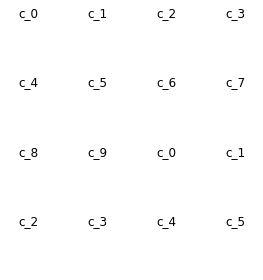

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_51\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_51\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_51\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_51\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_51\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


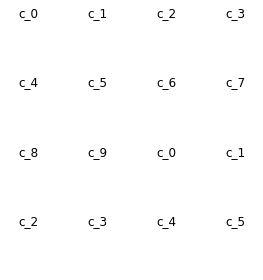

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_51\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_51\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_51\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_51\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_51\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_51\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


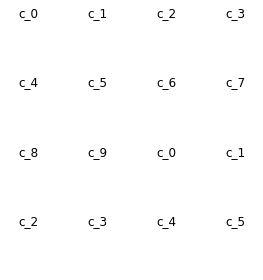

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


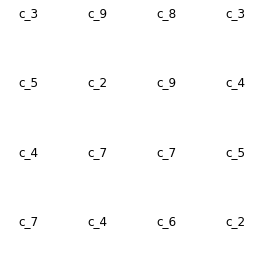

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6000%
Saved checkpoint: checkpoints\it_51\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_51\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_51\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_51\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


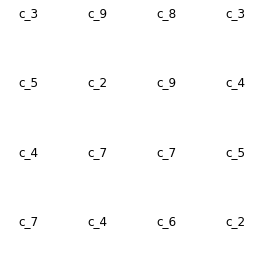

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.2778%
Saved checkpoint: checkpoints\it_51\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_51\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_51\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_51\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 52

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_52\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_52\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_52\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_52\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_52\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


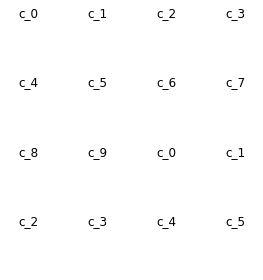

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_52\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_52\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_52\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_52\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_52\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


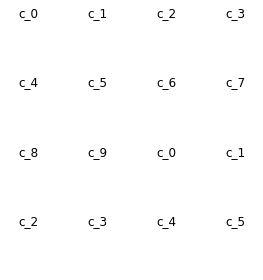

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_52\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_52\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_52\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_52\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_52\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


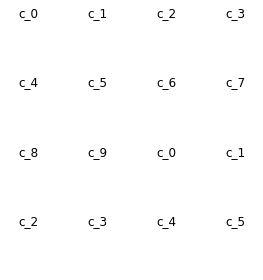

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_52\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_52\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_52\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_52\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_52\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


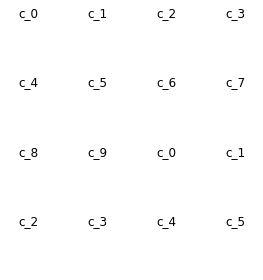

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_52\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_52\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_52\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_52\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_52\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_52\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


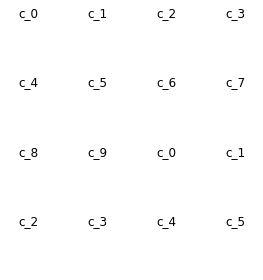

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


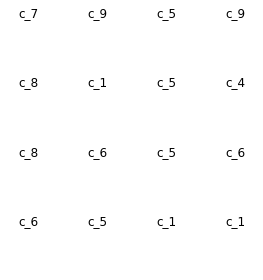

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.0000%
Saved checkpoint: checkpoints\it_52\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_52\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_52\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_52\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


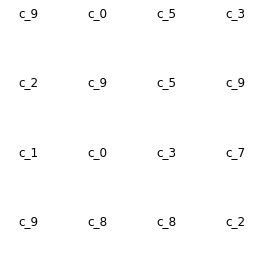

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6522%
Saved checkpoint: checkpoints\it_52\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_52\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_52\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_52\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 53

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_53\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_53\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_53\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


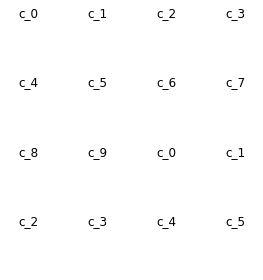

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_53\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_53\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_53\c_generator_checkpoint\ckpt-2


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


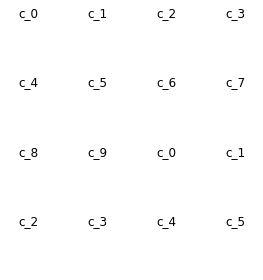

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_53\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_53\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_53\c_generator_checkpoint\ckpt-3


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


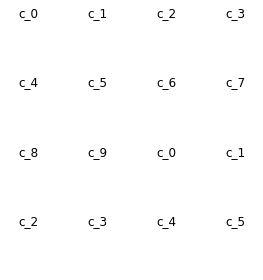

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_53\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_53\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_53\c_generator_checkpoint\ckpt-4
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


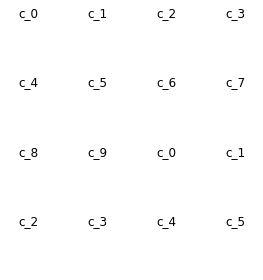

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_53\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_53\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_53\c_generator_checkpoint\ckpt-5


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


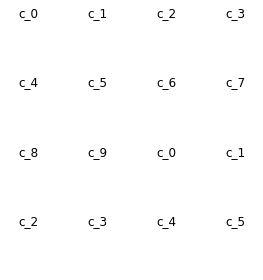

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_53\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_53\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_53\c_generator_checkpoint\ckpt-6
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


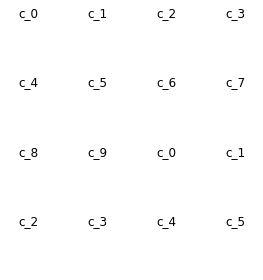

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_53\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_53\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_53\c_generator_checkpoint\ckpt-7
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


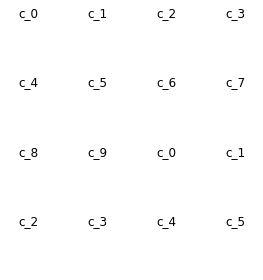

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_53\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_53\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_53\c_generator_checkpoint\ckpt-8
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


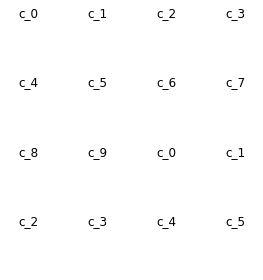

--------------------
Epoch 9/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_53\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_53\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_53\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_53\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_53\c_generator_checkpoint\ckpt-9
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


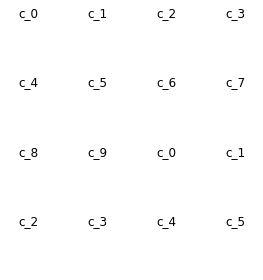

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


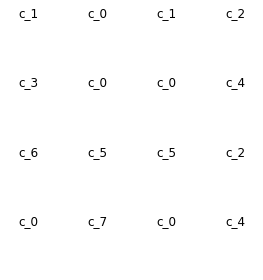

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2000%
Saved checkpoint: checkpoints\it_53\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_53\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_53\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_53\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


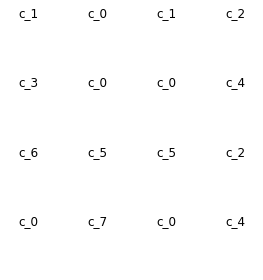

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.7500%
Saved checkpoint: checkpoints\it_53\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_53\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_53\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_53\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 54

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_54\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_54\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_54\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


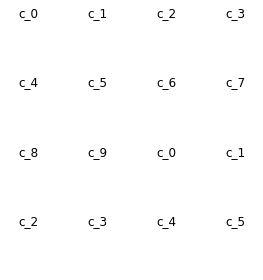

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_54\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_54\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_54\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


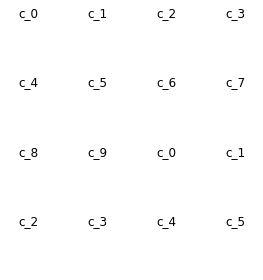

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_54\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_54\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_54\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


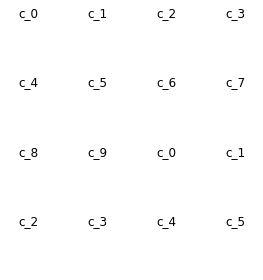

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_54\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_54\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_54\c_generator_checkpoint\ckpt-4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


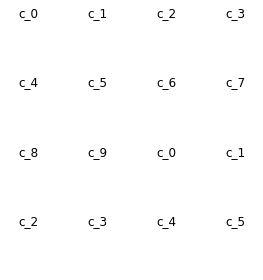

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_54\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_54\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_54\c_generator_checkpoint\ckpt-5
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


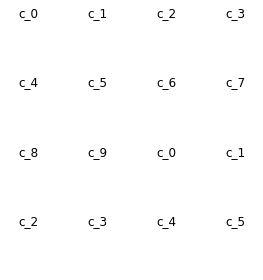

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_54\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_54\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_54\c_generator_checkpoint\ckpt-6
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


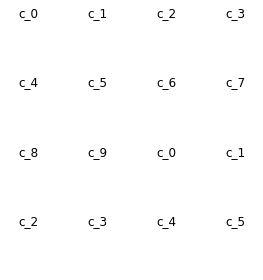

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_54\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_54\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_54\c_generator_checkpoint\ckpt-7
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


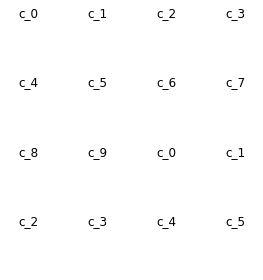

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_54\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_54\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_54\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_54\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_54\c_generator_checkpoint\ckpt-8
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


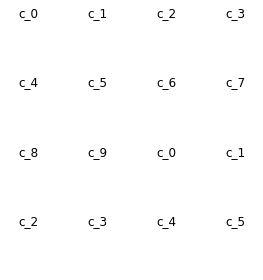

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


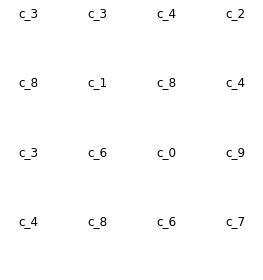

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8000%
Saved checkpoint: checkpoints\it_54\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_54\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_54\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_54\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


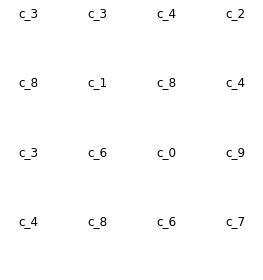

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.7576%
Saved checkpoint: checkpoints\it_54\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_54\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_54\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_54\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 55

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_55\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_55\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_55\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_55\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_55\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


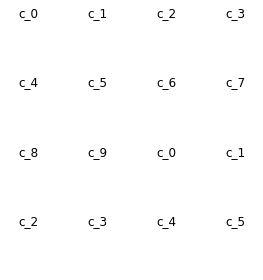

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_55\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_55\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_55\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_55\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_55\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


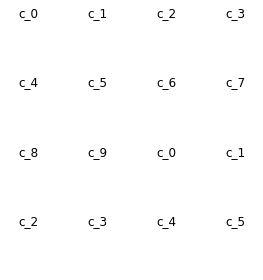

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_55\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_55\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_55\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_55\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_55\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


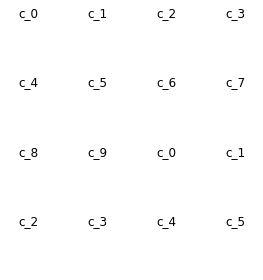

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_55\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_55\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_55\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_55\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_55\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


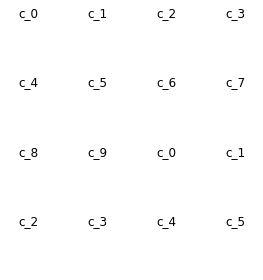

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_55\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_55\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_55\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_55\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_55\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_55\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


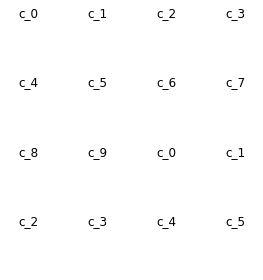

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


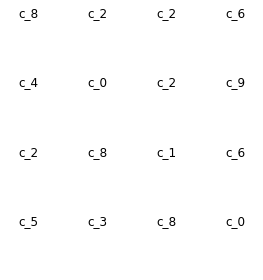

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.8000%
Saved checkpoint: checkpoints\it_55\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_55\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_55\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_55\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


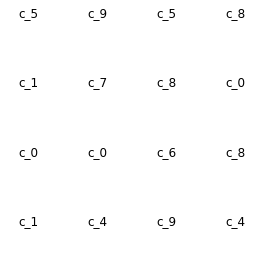

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8947%
Saved checkpoint: checkpoints\it_55\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_55\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_55\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_55\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 56

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_56\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_56\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_56\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_56\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_56\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


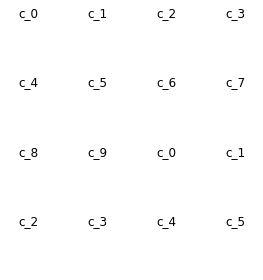

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_56\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_56\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_56\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_56\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_56\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


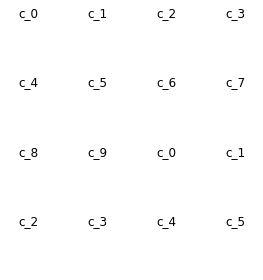

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_56\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_56\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_56\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_56\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_56\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


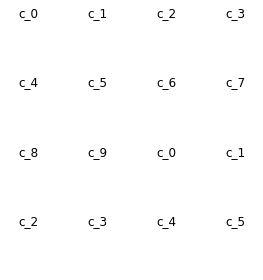

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_56\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_56\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_56\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_56\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_56\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


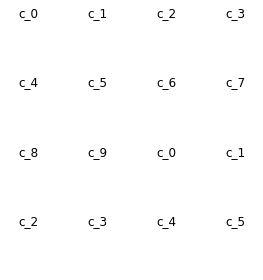

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_56\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_56\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_56\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_56\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_56\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_56\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


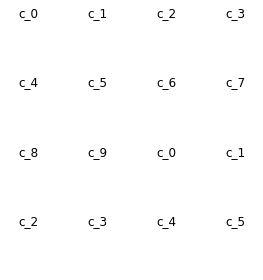

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


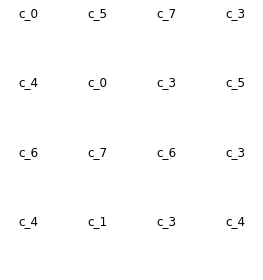

train_acc=10.2183%
accuracy of blackbox on G dataset: 8.4000%
Saved checkpoint: checkpoints\it_56\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_56\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_56\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_56\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


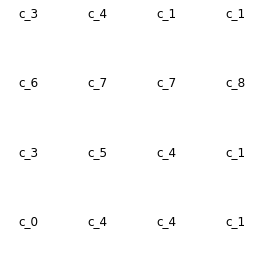

train_acc=0.0000%
accuracy of blackbox on G dataset: 5.2500%
Saved checkpoint: checkpoints\it_56\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_56\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_56\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_56\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 57

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_57\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_57\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_57\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_57\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_57\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


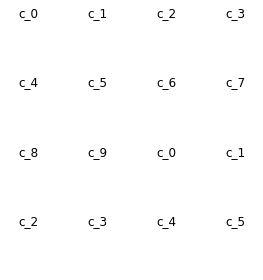

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_57\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_57\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_57\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_57\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_57\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


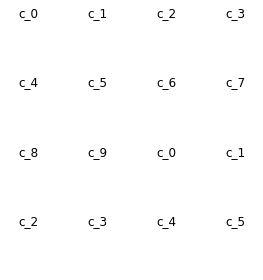

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_57\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_57\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_57\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_57\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_57\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


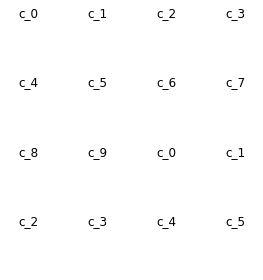

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_57\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_57\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_57\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_57\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_57\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


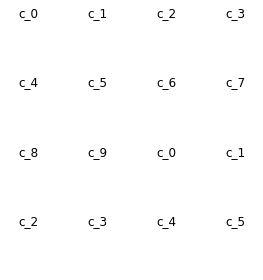

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_57\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_57\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_57\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_57\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_57\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_57\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


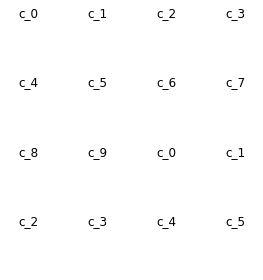

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


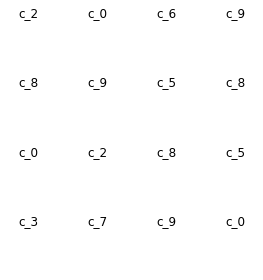

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_57\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_57\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_57\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_57\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


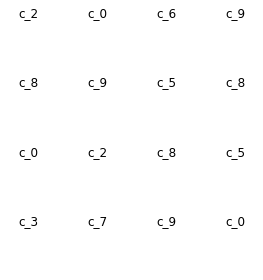

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.8462%
Saved checkpoint: checkpoints\it_57\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_57\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_57\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_57\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 58

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_58\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_58\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_58\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_58\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_58\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


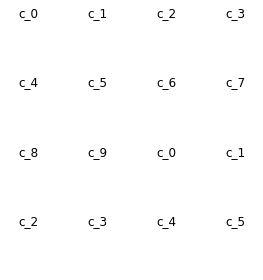

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_58\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_58\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_58\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_58\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_58\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


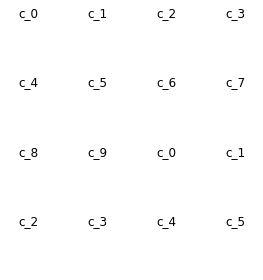

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_58\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_58\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_58\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_58\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_58\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


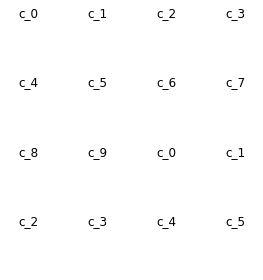

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_58\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_58\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_58\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_58\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_58\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


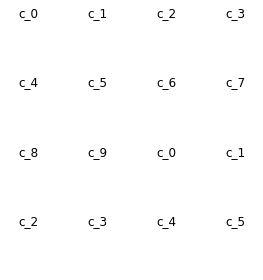

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_58\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_58\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_58\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_58\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_58\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_58\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


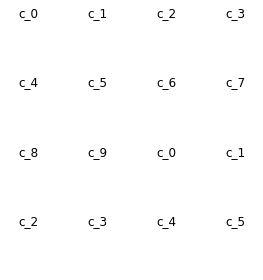

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


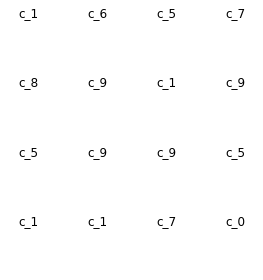

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.0000%
Saved checkpoint: checkpoints\it_58\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_58\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_58\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_58\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


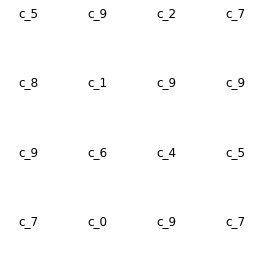

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.7222%
Saved checkpoint: checkpoints\it_58\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_58\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_58\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_58\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 59

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_59\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_59\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_59\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_59\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_59\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


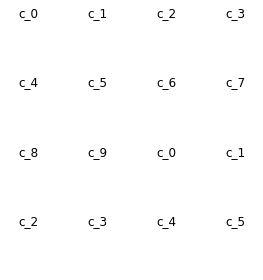

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_59\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_59\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_59\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_59\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_59\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


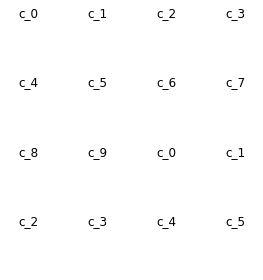

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_59\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_59\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_59\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_59\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_59\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


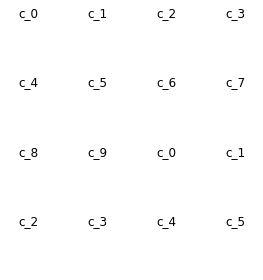

--------------------
Epoch 4/25


g_acc=0.09, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_59\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_59\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_59\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_59\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_59\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


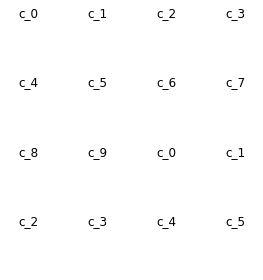

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_59\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_59\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_59\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_59\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_59\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_59\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


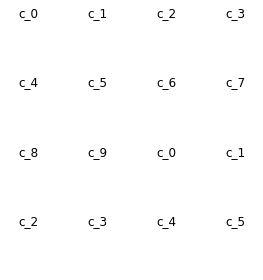

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


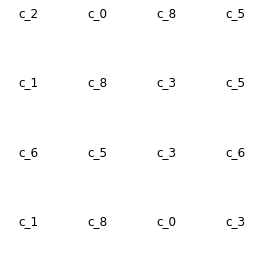

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6000%
Saved checkpoint: checkpoints\it_59\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_59\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_59\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_59\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


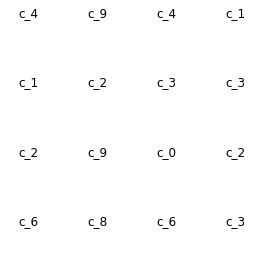

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.1304%
Saved checkpoint: checkpoints\it_59\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_59\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_59\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_59\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 60

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_60\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_60\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_60\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


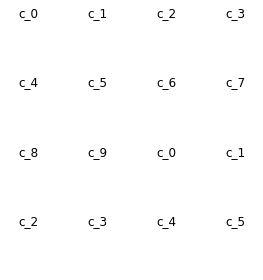

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_60\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_60\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_60\c_generator_checkpoint\ckpt-2


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


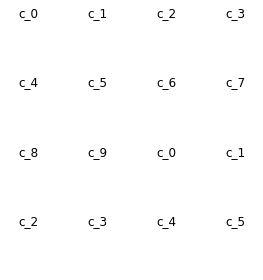

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_60\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_60\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_60\c_generator_checkpoint\ckpt-3
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


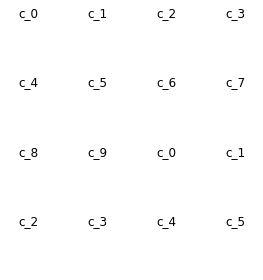

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_60\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_60\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_60\c_generator_checkpoint\ckpt-4
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


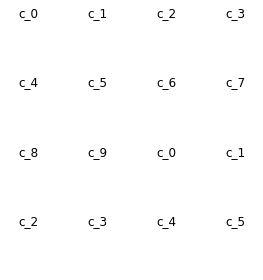

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_60\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_60\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_60\c_generator_checkpoint\ckpt-5
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


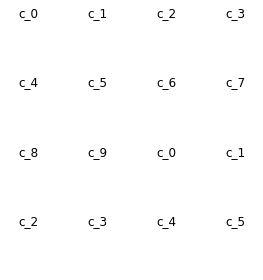

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_60\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_60\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_60\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_60\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_60\c_generator_checkpoint\ckpt-6
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


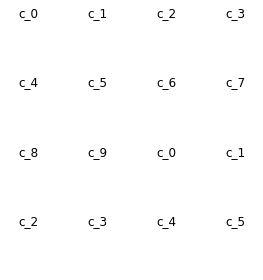

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


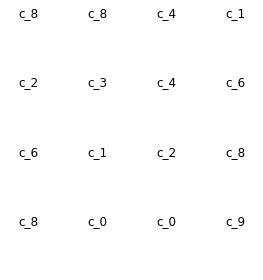

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 12.4000%
Saved checkpoint: checkpoints\it_60\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_60\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_60\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_60\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


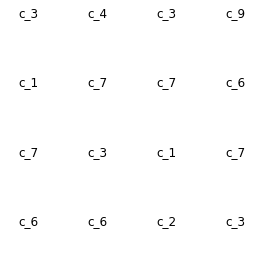

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8929%
Saved checkpoint: checkpoints\it_60\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_60\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_60\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_60\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 61

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_61\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_61\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_61\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_61\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_61\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


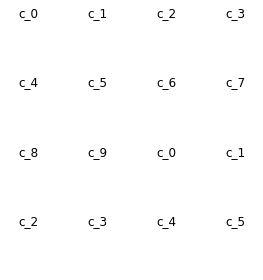

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_61\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_61\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_61\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_61\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_61\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


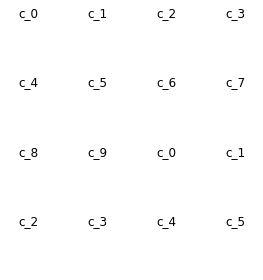

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_61\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_61\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_61\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_61\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_61\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


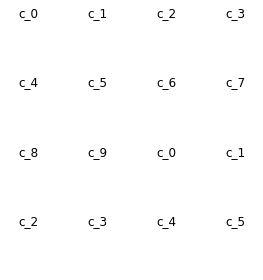

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_61\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_61\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_61\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_61\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_61\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


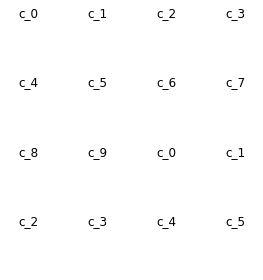

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_61\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_61\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_61\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_61\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_61\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_61\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


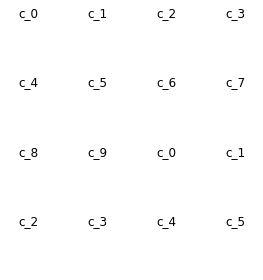

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


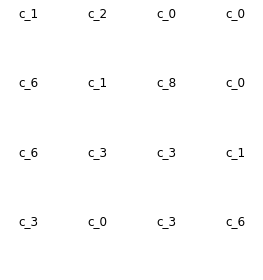

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.8000%
Saved checkpoint: checkpoints\it_61\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_61\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_61\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_61\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


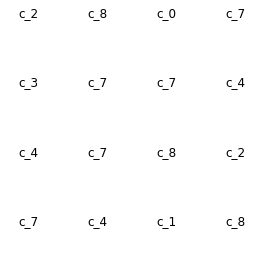

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.0303%
Saved checkpoint: checkpoints\it_61\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_61\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_61\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_61\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 62

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_62\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_62\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_62\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


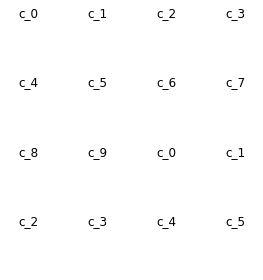

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_62\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_62\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_62\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


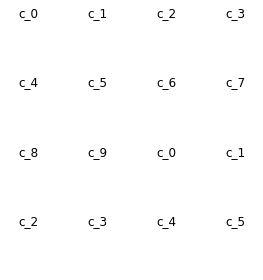

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_62\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_62\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_62\c_generator_checkpoint\ckpt-3


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


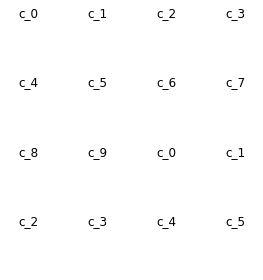

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_62\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_62\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_62\c_generator_checkpoint\ckpt-4
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


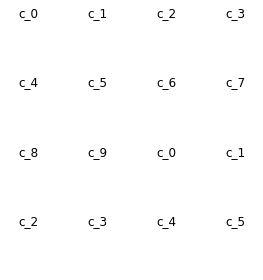

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_62\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_62\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_62\c_generator_checkpoint\ckpt-5
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


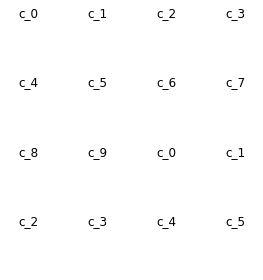

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_62\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_62\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_62\c_generator_checkpoint\ckpt-6
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


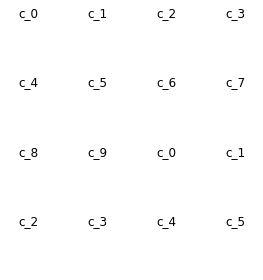

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_62\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_62\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_62\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_62\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_62\c_generator_checkpoint\ckpt-7
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


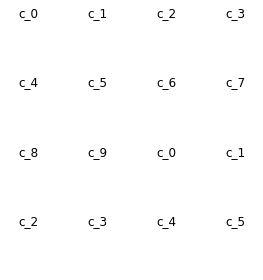

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


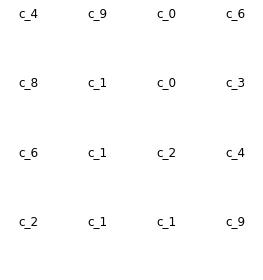

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.0000%
Saved checkpoint: checkpoints\it_62\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_62\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_62\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_62\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


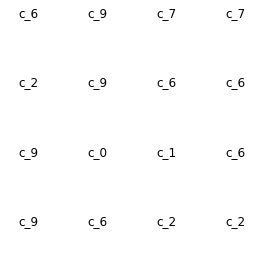

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.0263%
Saved checkpoint: checkpoints\it_62\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_62\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_62\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_62\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 63

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_63\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_63\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_63\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_63\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_63\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


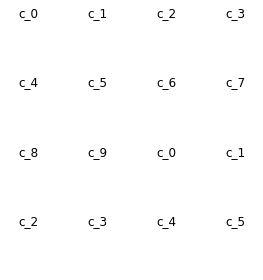

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_63\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_63\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_63\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_63\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_63\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


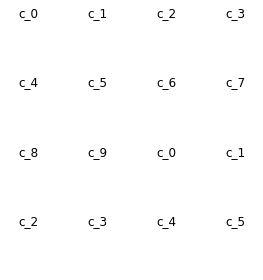

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_63\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_63\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_63\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_63\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_63\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


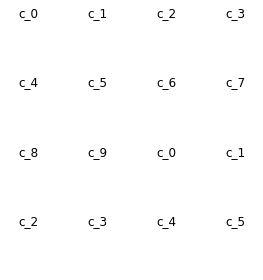

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_63\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_63\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_63\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_63\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_63\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


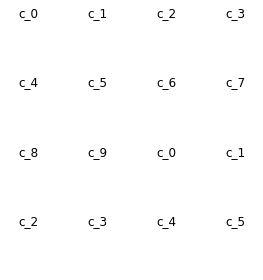

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_63\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_63\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_63\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_63\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_63\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_63\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


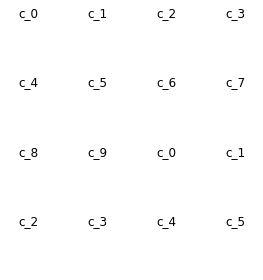

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


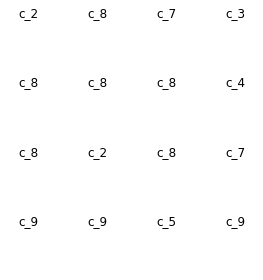

train_acc=10.2183%
accuracy of blackbox on G dataset: 12.0000%
Saved checkpoint: checkpoints\it_63\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_63\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_63\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_63\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


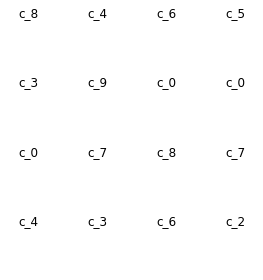

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.5000%
Saved checkpoint: checkpoints\it_63\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_63\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_63\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_63\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 64

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_64\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_64\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_64\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


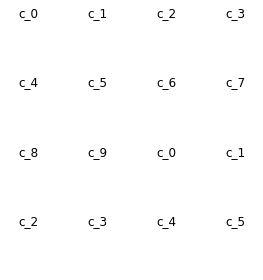

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_64\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_64\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_64\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


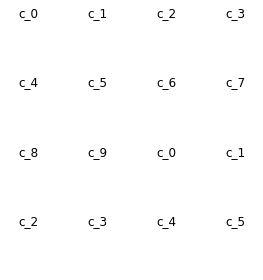

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_64\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_64\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_64\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


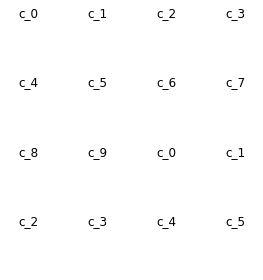

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_64\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_64\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_64\c_generator_checkpoint\ckpt-4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


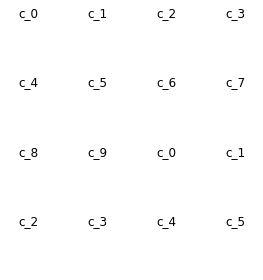

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_64\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_64\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_64\c_generator_checkpoint\ckpt-5
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


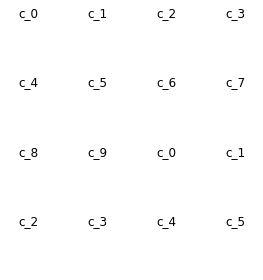

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_64\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_64\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_64\c_generator_checkpoint\ckpt-6
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


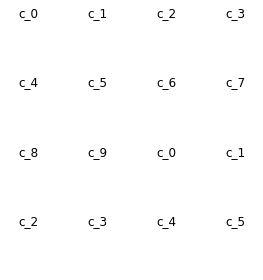

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_64\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_64\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_64\c_generator_checkpoint\ckpt-7
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


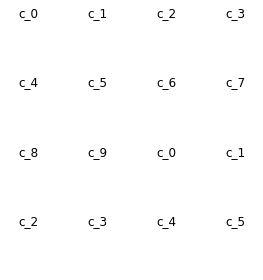

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_64\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_64\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_64\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_64\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_64\c_generator_checkpoint\ckpt-8
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


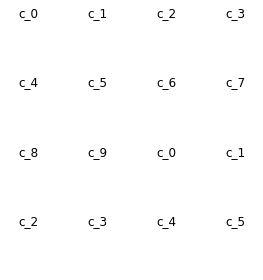

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


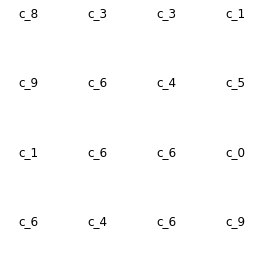

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.0000%
Saved checkpoint: checkpoints\it_64\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_64\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_64\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_64\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


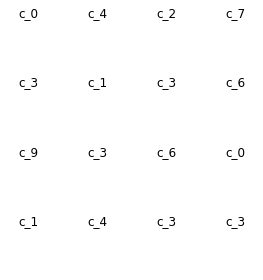

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.4615%
Saved checkpoint: checkpoints\it_64\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_64\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_64\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_64\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 65

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_65\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_65\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_65\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_65\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_65\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


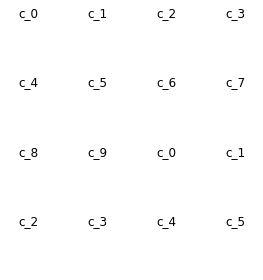

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_65\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_65\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_65\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_65\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_65\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


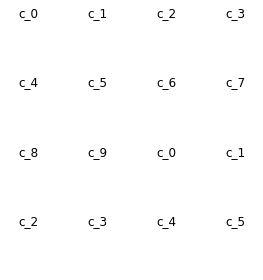

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_65\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_65\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_65\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_65\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_65\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


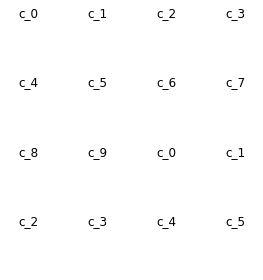

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_65\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_65\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_65\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_65\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_65\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


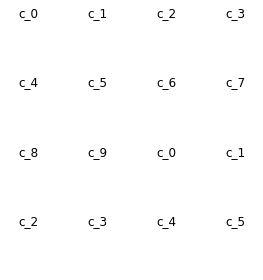

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_65\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_65\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_65\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_65\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_65\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_65\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


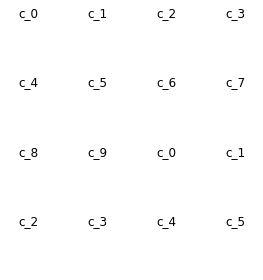

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


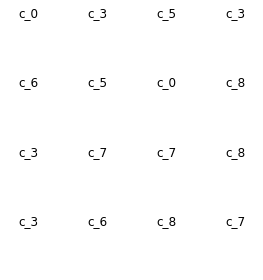

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 12.2000%
Saved checkpoint: checkpoints\it_65\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_65\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_65\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_65\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


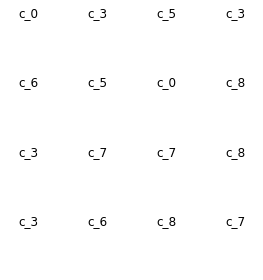

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.5000%
Saved checkpoint: checkpoints\it_65\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_65\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_65\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_65\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 66

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_66\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_66\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_66\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_66\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_66\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


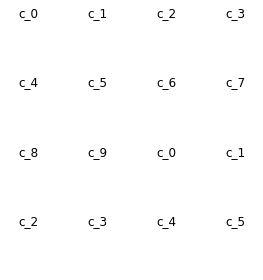

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_66\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_66\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_66\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_66\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_66\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


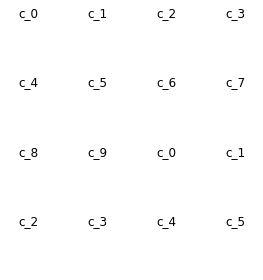

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_66\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_66\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_66\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_66\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_66\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


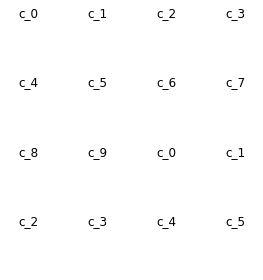

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_66\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_66\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_66\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_66\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_66\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


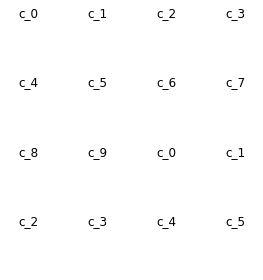

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_66\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_66\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_66\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_66\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_66\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_66\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


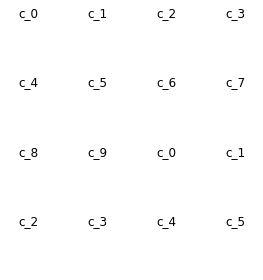

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


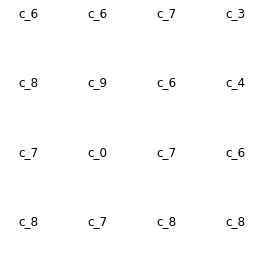

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.4000%
Saved checkpoint: checkpoints\it_66\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_66\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_66\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_66\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


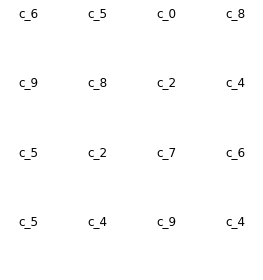

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2609%
Saved checkpoint: checkpoints\it_66\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_66\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_66\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_66\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 67

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_67\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_67\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_67\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_67\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_67\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


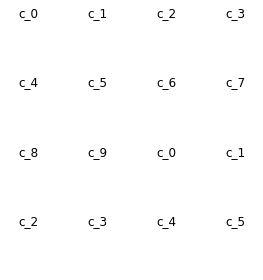

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_67\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_67\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_67\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_67\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_67\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


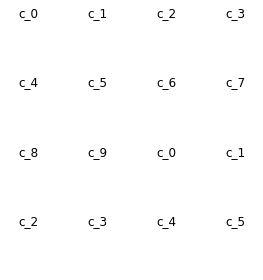

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_67\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_67\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_67\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_67\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_67\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


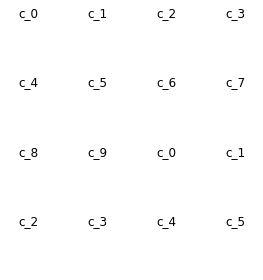

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_67\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_67\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_67\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_67\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_67\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


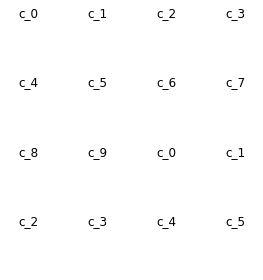

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_67\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_67\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_67\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_67\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_67\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_67\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


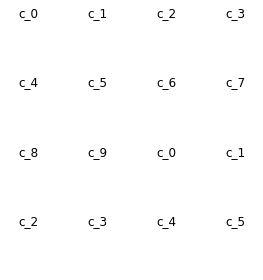

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


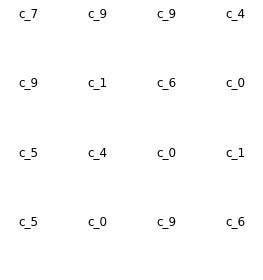

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6000%
Saved checkpoint: checkpoints\it_67\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_67\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_67\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_67\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


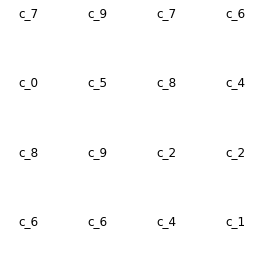

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.1429%
Saved checkpoint: checkpoints\it_67\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_67\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_67\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_67\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 68

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_68\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_68\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_68\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_68\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_68\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


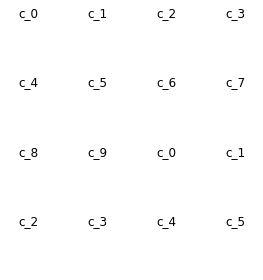

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_68\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_68\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_68\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_68\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_68\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


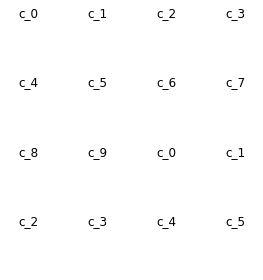

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_68\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_68\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_68\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_68\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_68\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


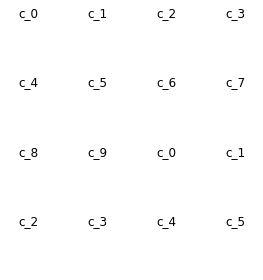

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_68\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_68\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_68\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_68\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_68\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


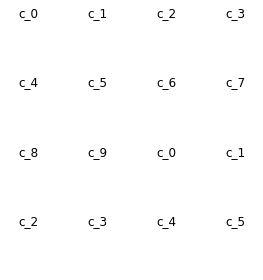

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_68\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_68\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_68\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_68\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_68\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_68\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


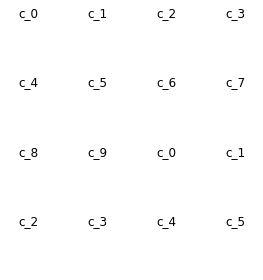

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


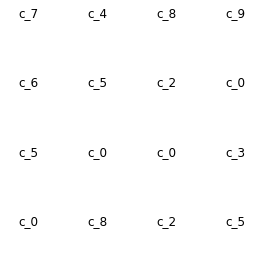

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.8000%
Saved checkpoint: checkpoints\it_68\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_68\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_68\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_68\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


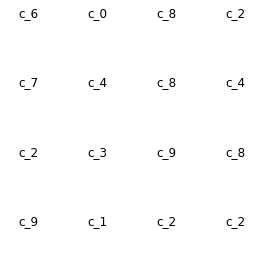

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2424%
Saved checkpoint: checkpoints\it_68\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_68\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_68\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_68\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 69

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_69\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_69\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_69\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_69\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_69\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


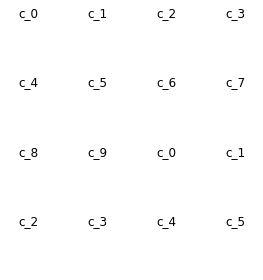

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_69\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_69\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_69\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_69\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_69\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


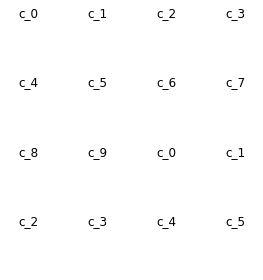

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_69\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_69\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_69\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_69\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_69\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


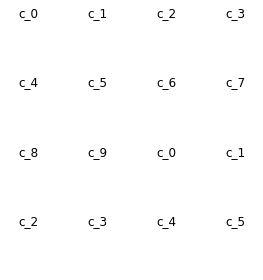

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_69\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_69\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_69\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_69\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_69\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


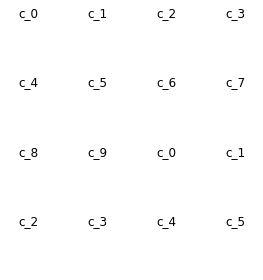

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_69\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_69\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_69\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_69\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_69\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_69\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


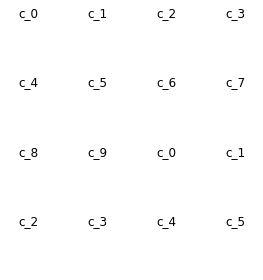

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


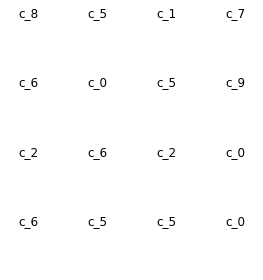

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.4000%
Saved checkpoint: checkpoints\it_69\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_69\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_69\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_69\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


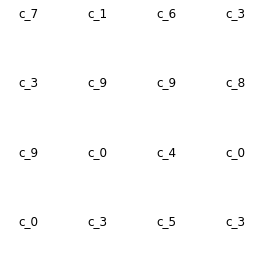

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.5263%
Saved checkpoint: checkpoints\it_69\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_69\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_69\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_69\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 70

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_70\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_70\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_70\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_70\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_70\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


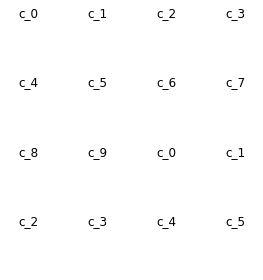

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_70\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_70\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_70\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_70\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_70\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


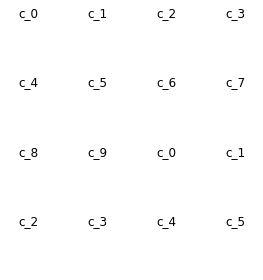

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_70\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_70\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_70\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_70\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_70\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


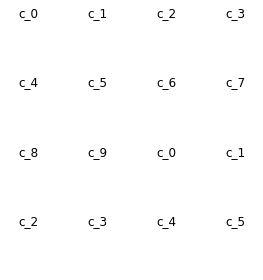

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_70\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_70\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_70\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_70\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_70\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


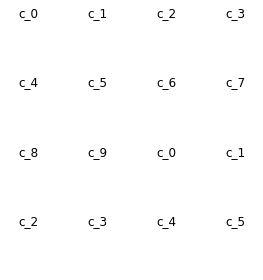

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_70\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_70\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_70\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_70\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_70\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_70\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


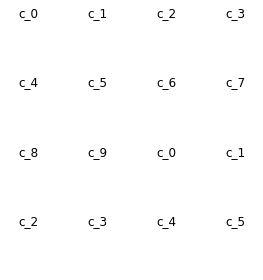

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


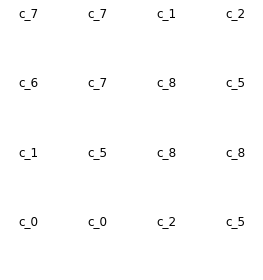

train_acc=10.2183%
accuracy of blackbox on G dataset: 9.8000%
Saved checkpoint: checkpoints\it_70\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_70\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_70\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_70\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


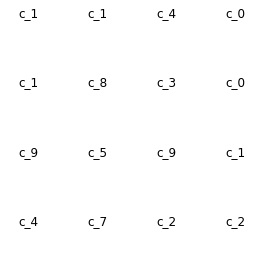

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.1250%
Saved checkpoint: checkpoints\it_70\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_70\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_70\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_70\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 71

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_71\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_71\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_71\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_71\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_71\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


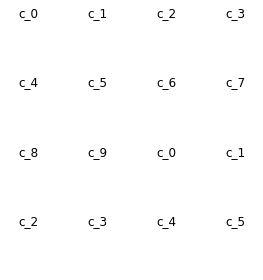

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_71\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_71\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_71\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_71\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_71\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


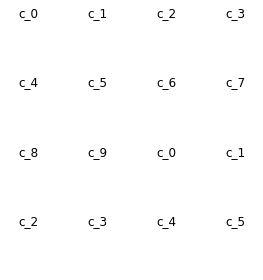

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_71\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_71\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_71\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_71\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_71\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


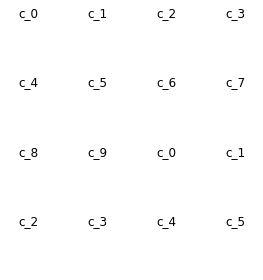

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_71\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_71\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_71\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_71\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_71\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


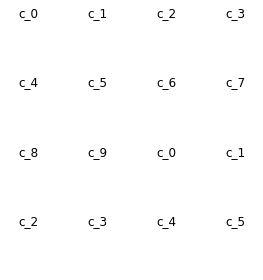

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_71\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_71\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_71\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_71\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_71\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_71\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


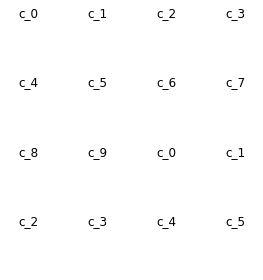

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


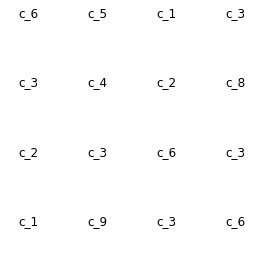

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.4000%
Saved checkpoint: checkpoints\it_71\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_71\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_71\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_71\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


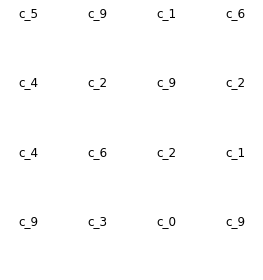

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.1538%
Saved checkpoint: checkpoints\it_71\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_71\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_71\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_71\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 72

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_72\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_72\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_72\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_72\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_72\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


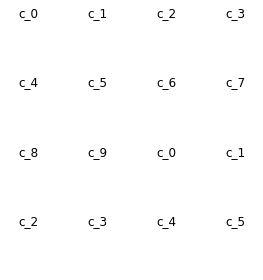

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_72\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_72\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_72\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_72\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_72\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


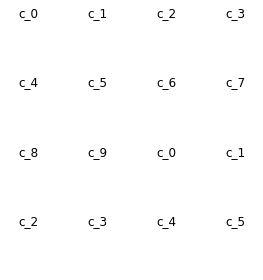

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_72\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_72\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_72\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_72\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_72\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


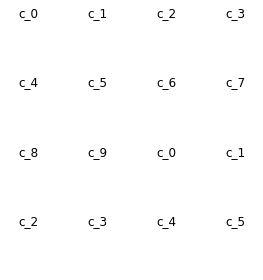

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_72\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_72\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_72\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_72\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_72\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


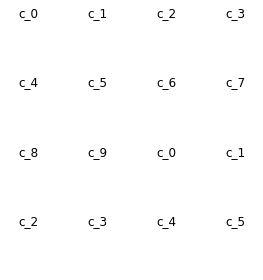

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_72\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_72\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_72\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_72\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_72\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_72\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


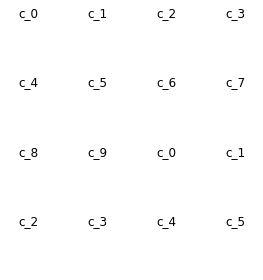

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


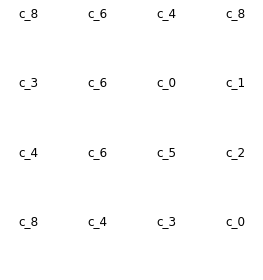

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.4000%
Saved checkpoint: checkpoints\it_72\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_72\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_72\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_72\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


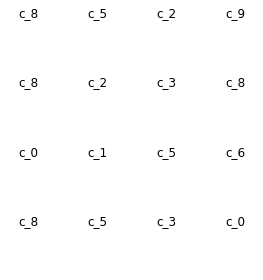

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.7778%
Saved checkpoint: checkpoints\it_72\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_72\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_72\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_72\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 73

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_73\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_73\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_73\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_73\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_73\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


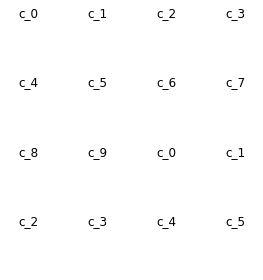

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_73\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_73\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_73\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_73\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_73\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


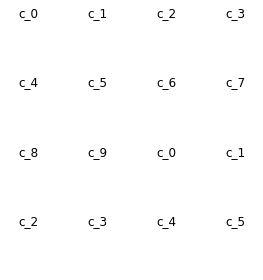

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_73\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_73\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_73\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_73\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_73\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


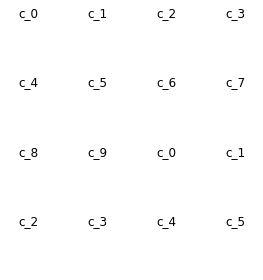

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_73\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_73\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_73\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_73\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_73\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


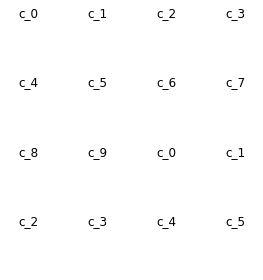

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_73\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_73\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_73\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_73\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_73\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_73\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


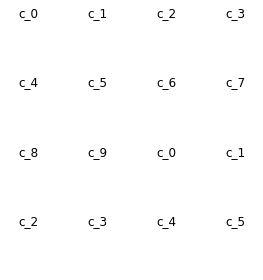

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


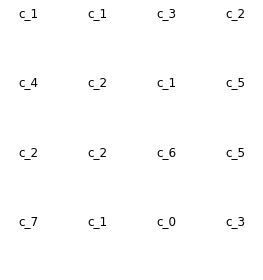

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.0000%
Saved checkpoint: checkpoints\it_73\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_73\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_73\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_73\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


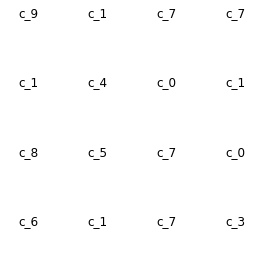

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.0435%
Saved checkpoint: checkpoints\it_73\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_73\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_73\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_73\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 74

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_74\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_74\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_74\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


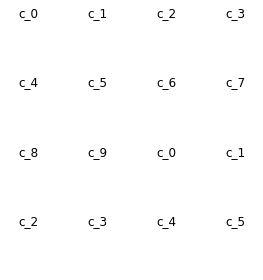

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_74\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_74\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_74\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


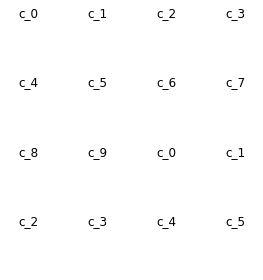

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_74\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_74\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_74\c_generator_checkpoint\ckpt-3


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


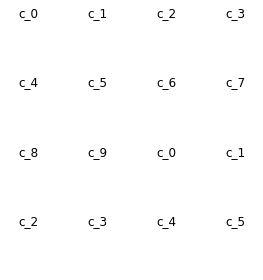

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_74\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_74\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_74\c_generator_checkpoint\ckpt-4
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


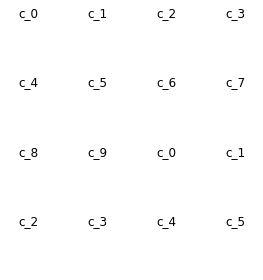

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_74\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_74\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_74\c_generator_checkpoint\ckpt-5
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


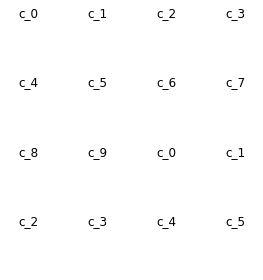

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_74\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_74\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_74\c_generator_checkpoint\ckpt-6
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


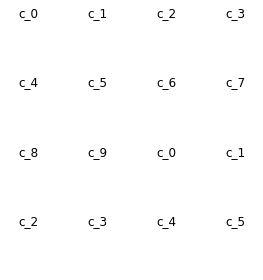

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_74\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_74\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_74\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_74\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_74\c_generator_checkpoint\ckpt-7
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


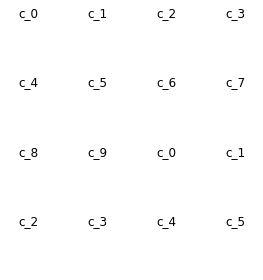

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


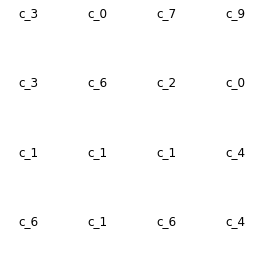

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.0000%
Saved checkpoint: checkpoints\it_74\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_74\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_74\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_74\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


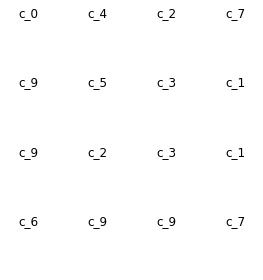

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.3929%
Saved checkpoint: checkpoints\it_74\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_74\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_74\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_74\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 75

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_75\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_75\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_75\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_75\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_75\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


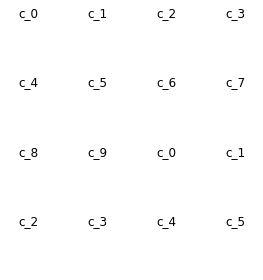

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_75\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_75\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_75\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_75\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_75\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


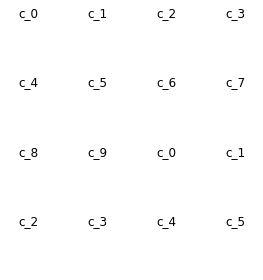

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_75\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_75\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_75\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_75\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_75\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


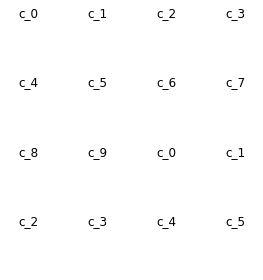

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_75\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_75\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_75\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_75\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_75\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


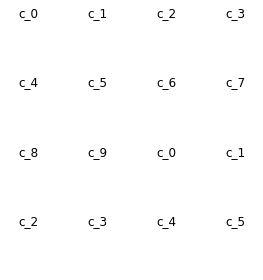

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_75\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_75\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_75\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_75\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_75\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_75\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


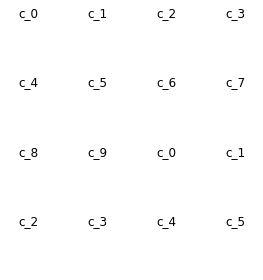

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


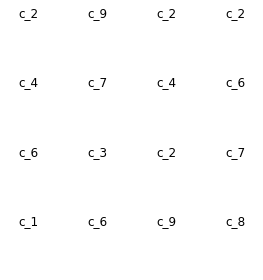

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6000%
Saved checkpoint: checkpoints\it_75\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_75\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_75\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_75\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


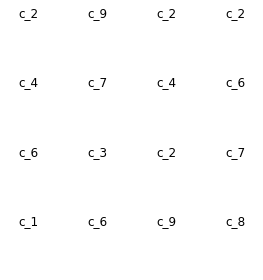

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4242%
Saved checkpoint: checkpoints\it_75\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_75\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_75\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_75\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 76

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_76\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_76\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_76\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_76\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_76\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


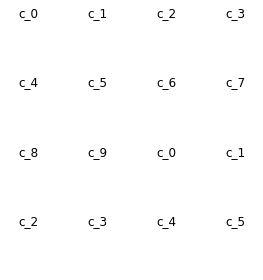

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_76\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_76\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_76\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_76\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_76\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


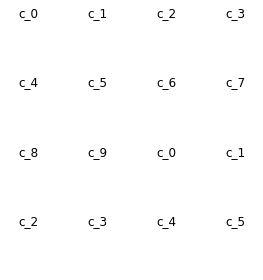

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_76\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_76\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_76\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_76\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_76\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


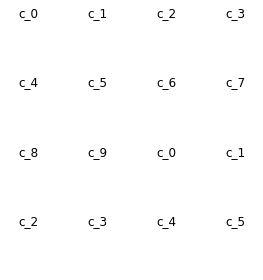

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_76\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_76\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_76\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_76\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_76\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


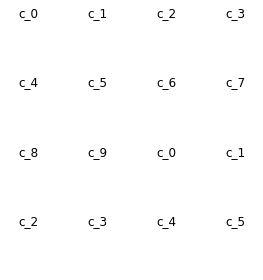

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_76\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_76\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_76\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_76\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_76\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_76\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


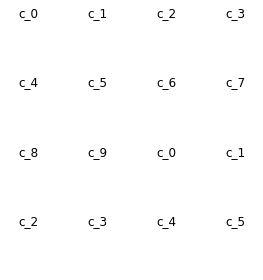

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


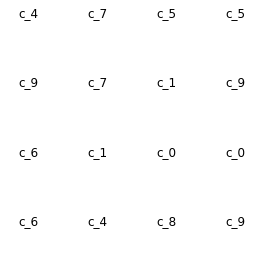

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_76\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_76\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_76\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_76\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


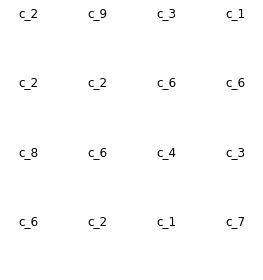

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4211%
Saved checkpoint: checkpoints\it_76\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_76\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_76\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_76\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 77

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_77\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_77\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_77\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_77\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_77\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


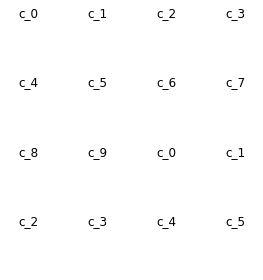

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_77\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_77\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_77\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_77\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_77\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


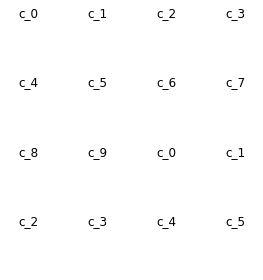

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_77\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_77\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_77\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_77\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_77\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


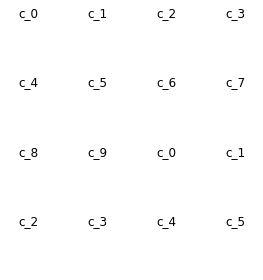

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_77\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_77\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_77\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_77\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_77\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


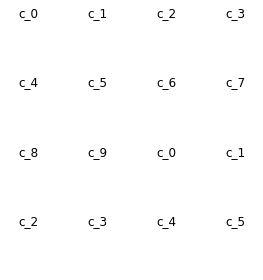

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_77\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_77\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_77\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_77\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_77\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_77\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


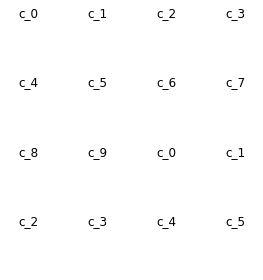

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


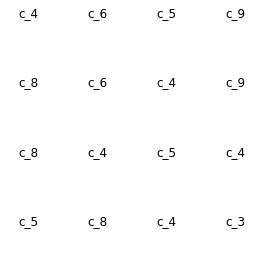

train_acc=10.2183%
accuracy of blackbox on G dataset: 12.0000%
Saved checkpoint: checkpoints\it_77\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_77\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_77\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_77\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


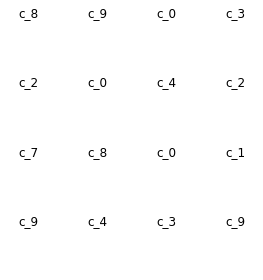

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.5000%
Saved checkpoint: checkpoints\it_77\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_77\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_77\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_77\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 78

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_78\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_78\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_78\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_78\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_78\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


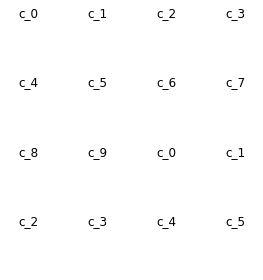

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_78\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_78\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_78\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_78\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_78\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


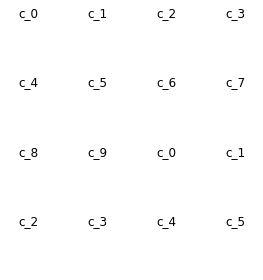

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_78\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_78\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_78\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_78\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_78\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


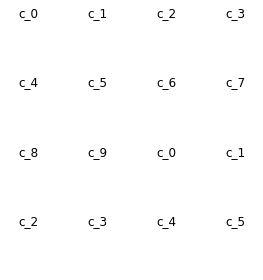

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_78\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_78\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_78\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_78\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_78\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


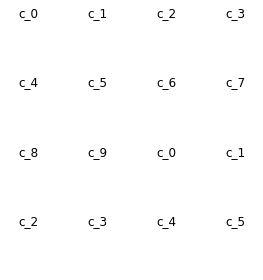

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_78\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_78\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_78\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_78\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_78\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_78\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


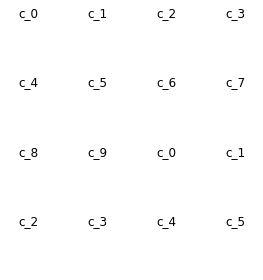

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


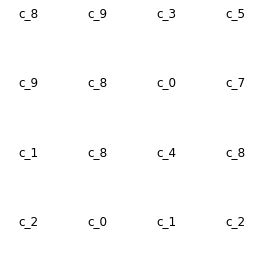

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6000%
Saved checkpoint: checkpoints\it_78\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_78\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_78\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_78\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


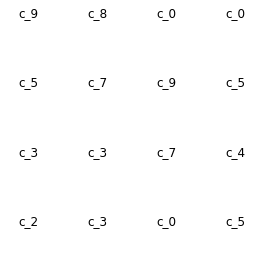

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.9231%
Saved checkpoint: checkpoints\it_78\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_78\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_78\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_78\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 79

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_79\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_79\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_79\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_79\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_79\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


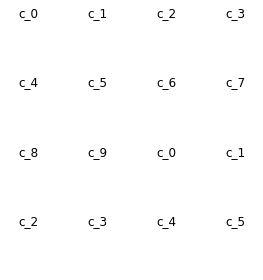

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_79\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_79\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_79\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_79\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_79\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


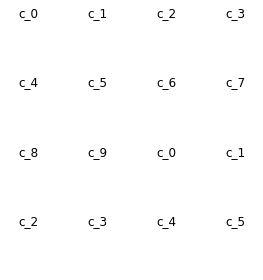

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_79\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_79\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_79\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_79\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_79\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


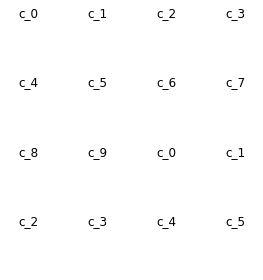

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_79\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_79\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_79\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_79\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_79\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


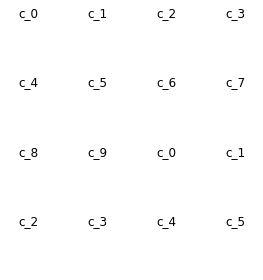

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_79\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_79\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_79\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_79\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_79\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_79\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


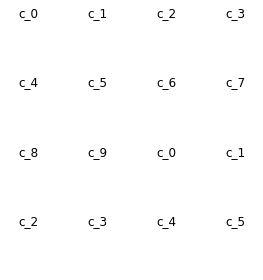

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


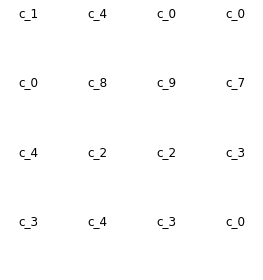

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.0000%
Saved checkpoint: checkpoints\it_79\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_79\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_79\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_79\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


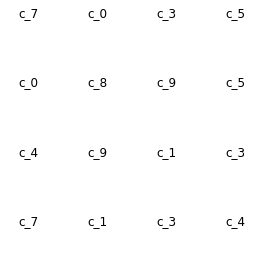

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.7778%
Saved checkpoint: checkpoints\it_79\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_79\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_79\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_79\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 80

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_80\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_80\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_80\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_80\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_80\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


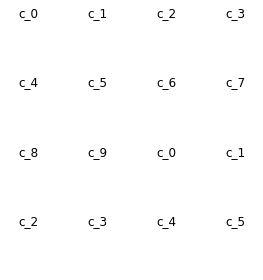

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_80\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_80\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_80\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_80\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_80\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


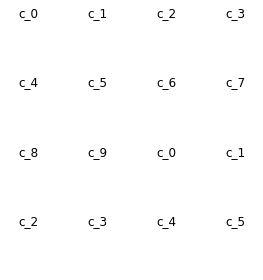

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_80\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_80\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_80\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_80\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_80\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


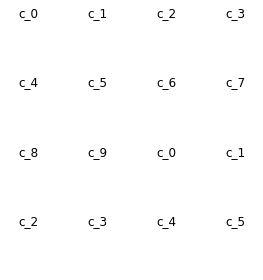

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_80\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_80\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_80\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_80\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_80\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


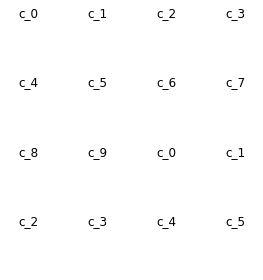

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_80\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_80\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_80\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_80\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_80\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_80\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


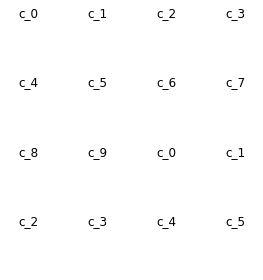

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


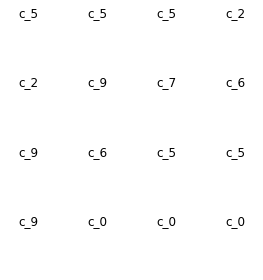

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 12.6000%
Saved checkpoint: checkpoints\it_80\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_80\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_80\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_80\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


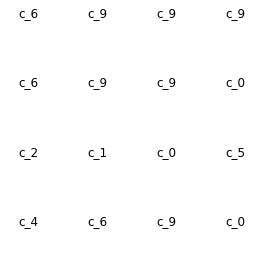

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6087%
Saved checkpoint: checkpoints\it_80\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_80\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_80\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_80\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 81

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_81\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_81\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_81\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_81\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_81\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


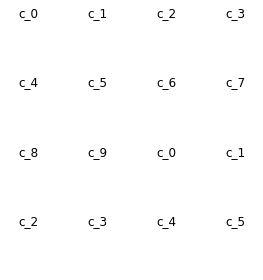

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_81\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_81\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_81\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_81\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_81\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


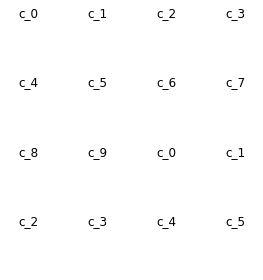

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_81\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_81\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_81\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_81\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_81\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


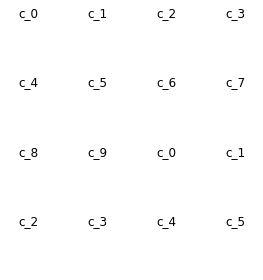

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_81\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_81\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_81\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_81\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_81\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


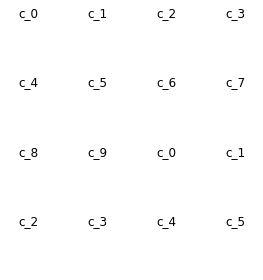

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_81\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_81\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_81\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_81\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_81\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_81\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


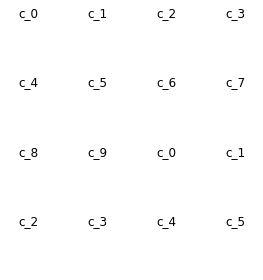

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


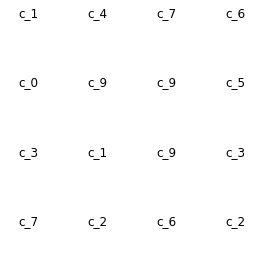

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_81\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_81\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_81\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_81\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


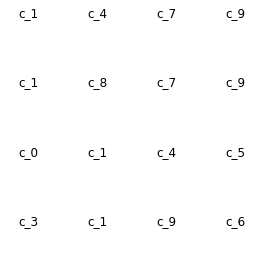

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.5714%
Saved checkpoint: checkpoints\it_81\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_81\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_81\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_81\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 82

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_82\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_82\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_82\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_82\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_82\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


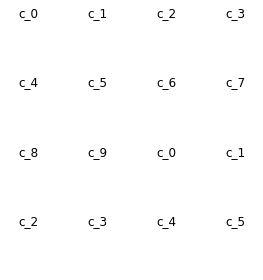

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_82\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_82\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_82\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_82\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_82\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


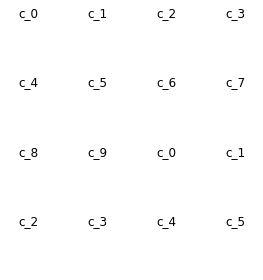

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_82\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_82\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_82\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_82\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_82\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


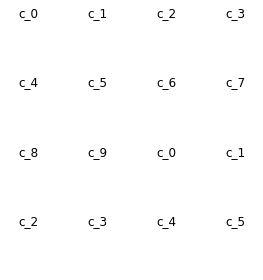

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_82\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_82\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_82\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_82\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_82\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


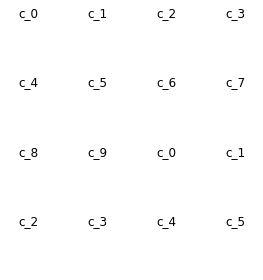

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_82\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_82\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_82\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_82\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_82\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_82\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


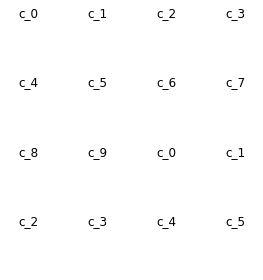

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


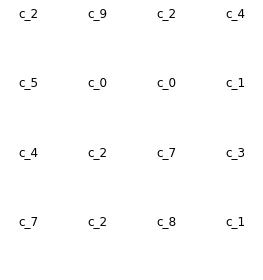

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 7.4000%
Saved checkpoint: checkpoints\it_82\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_82\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_82\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_82\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


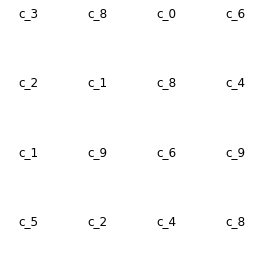

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2424%
Saved checkpoint: checkpoints\it_82\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_82\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_82\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_82\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 83

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_83\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_83\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_83\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_83\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_83\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


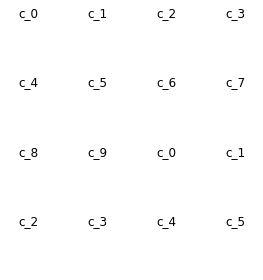

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_83\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_83\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_83\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_83\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_83\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


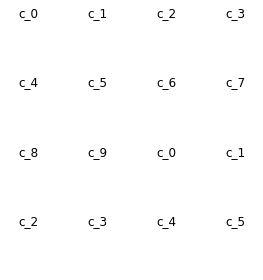

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_83\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_83\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_83\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_83\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_83\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


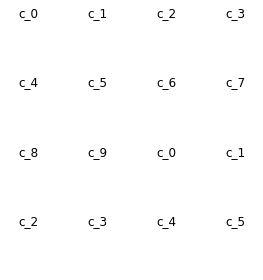

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_83\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_83\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_83\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_83\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_83\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


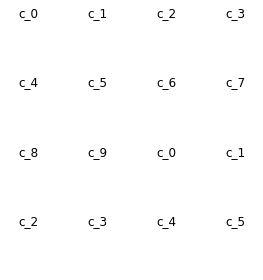

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_83\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_83\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_83\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_83\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_83\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_83\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


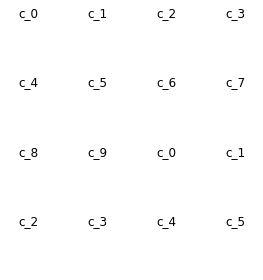

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


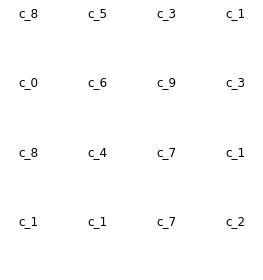

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 12.0000%
Saved checkpoint: checkpoints\it_83\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_83\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_83\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_83\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


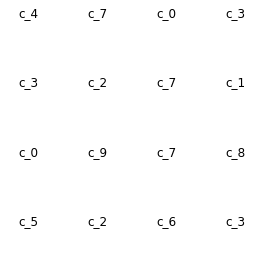

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6053%
Saved checkpoint: checkpoints\it_83\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_83\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_83\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_83\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 84

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_84\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_84\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_84\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_84\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_84\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


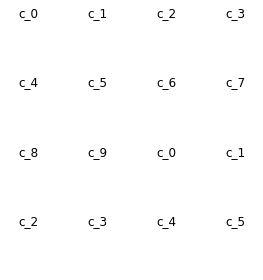

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_84\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_84\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_84\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_84\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_84\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


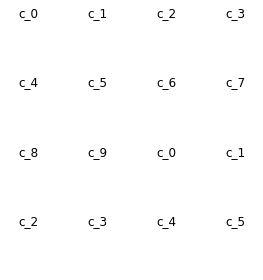

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_84\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_84\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_84\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_84\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_84\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


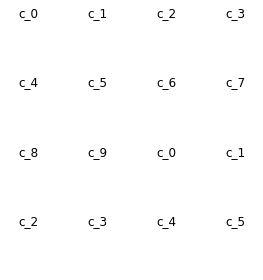

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_84\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_84\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_84\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_84\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_84\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


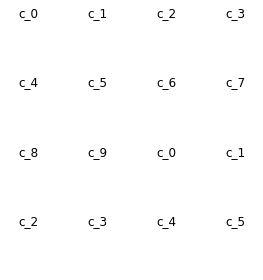

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_84\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_84\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_84\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_84\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_84\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_84\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


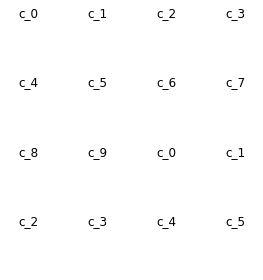

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


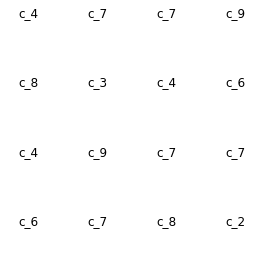

train_acc=10.2183%
accuracy of blackbox on G dataset: 12.8000%
Saved checkpoint: checkpoints\it_84\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_84\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_84\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_84\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


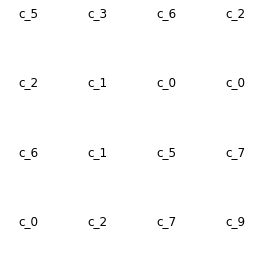

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0000%
Saved checkpoint: checkpoints\it_84\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_84\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_84\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_84\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 85

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_85\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_85\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_85\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


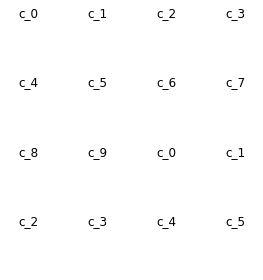

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_85\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_85\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_85\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


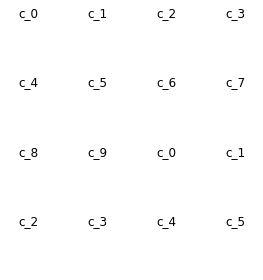

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_85\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_85\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_85\c_generator_checkpoint\ckpt-3


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


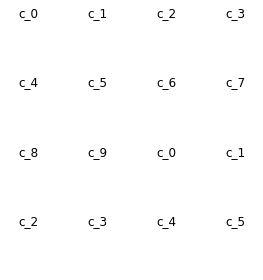

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_85\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_85\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_85\c_generator_checkpoint\ckpt-4
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


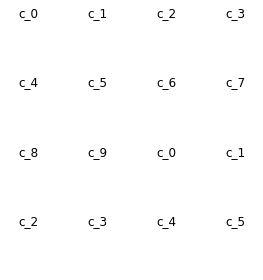

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_85\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_85\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_85\c_generator_checkpoint\ckpt-5
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


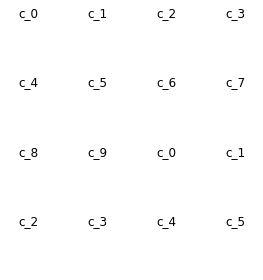

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_85\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_85\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_85\c_generator_checkpoint\ckpt-6
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


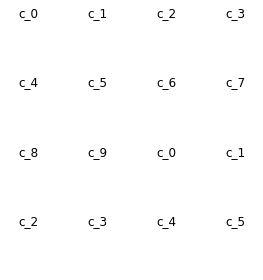

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_85\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_85\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_85\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_85\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_85\c_generator_checkpoint\ckpt-7
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


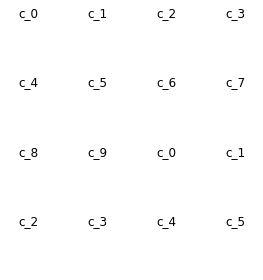

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


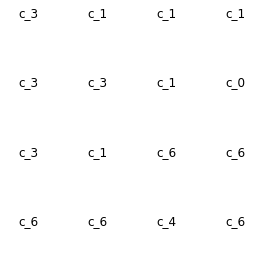

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.8000%
Saved checkpoint: checkpoints\it_85\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_85\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_85\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_85\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


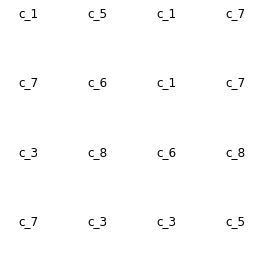

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4615%
Saved checkpoint: checkpoints\it_85\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_85\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_85\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_85\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 86

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_86\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_86\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_86\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_86\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_86\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


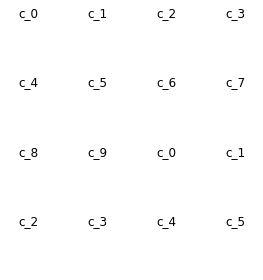

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_86\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_86\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_86\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_86\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_86\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


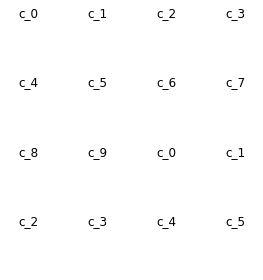

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_86\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_86\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_86\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_86\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_86\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


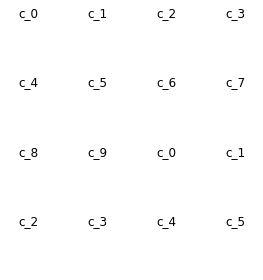

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_86\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_86\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_86\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_86\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_86\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


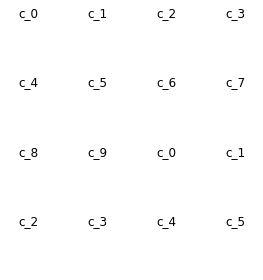

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_86\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_86\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_86\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_86\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_86\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_86\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


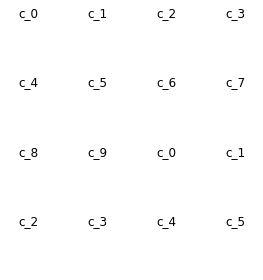

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


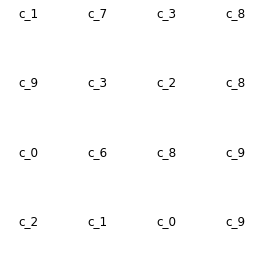

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6000%
Saved checkpoint: checkpoints\it_86\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_86\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_86\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_86\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


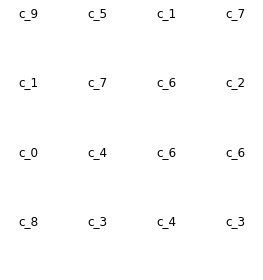

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.5000%
Saved checkpoint: checkpoints\it_86\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_86\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_86\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_86\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 87

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_87\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_87\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_87\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


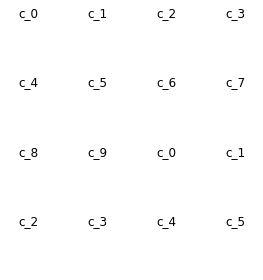

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_87\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_87\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_87\c_generator_checkpoint\ckpt-2


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


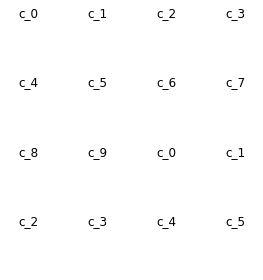

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_87\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_87\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_87\c_generator_checkpoint\ckpt-3
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


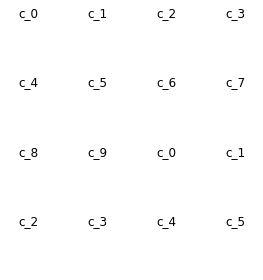

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_87\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_87\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_87\c_generator_checkpoint\ckpt-4
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


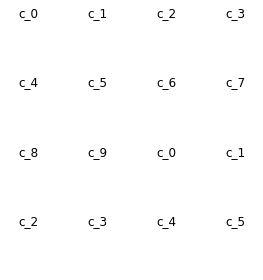

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_87\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_87\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_87\c_generator_checkpoint\ckpt-5
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


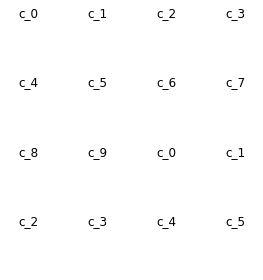

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_87\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_87\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_87\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_87\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_87\c_generator_checkpoint\ckpt-6
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


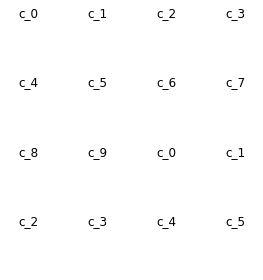

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


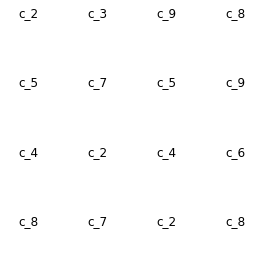

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.2000%
Saved checkpoint: checkpoints\it_87\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_87\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_87\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_87\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


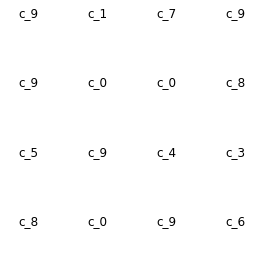

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2174%
Saved checkpoint: checkpoints\it_87\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_87\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_87\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_87\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 88

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_88\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_88\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_88\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


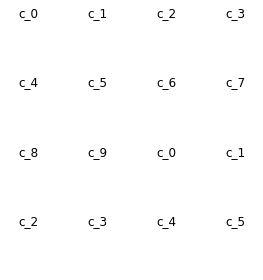

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_88\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_88\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_88\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


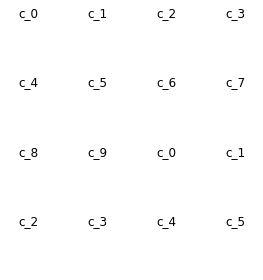

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_88\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_88\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_88\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


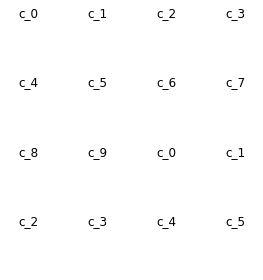

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_88\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_88\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_88\c_generator_checkpoint\ckpt-4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


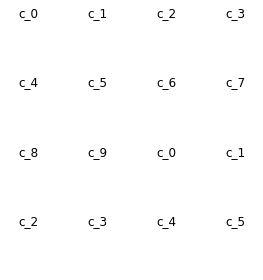

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_88\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_88\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_88\c_generator_checkpoint\ckpt-5
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


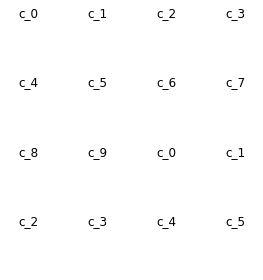

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_88\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_88\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_88\c_generator_checkpoint\ckpt-6
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


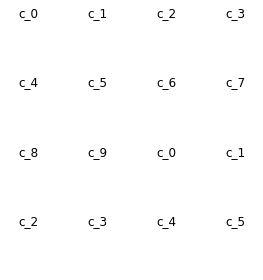

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_88\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_88\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_88\c_generator_checkpoint\ckpt-7
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


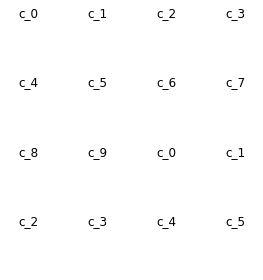

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_88\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_88\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_88\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_88\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_88\c_generator_checkpoint\ckpt-8
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


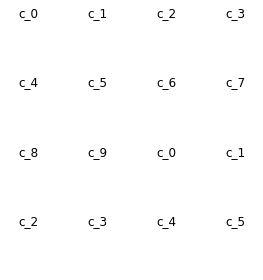

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


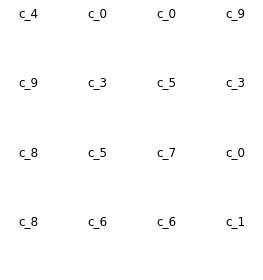

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8000%
Saved checkpoint: checkpoints\it_88\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_88\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_88\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_88\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


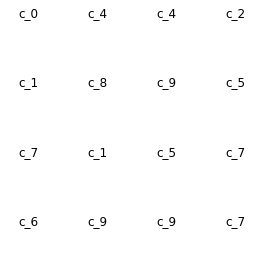

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.1429%
Saved checkpoint: checkpoints\it_88\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_88\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_88\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_88\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 89

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_89\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_89\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_89\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_89\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_89\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


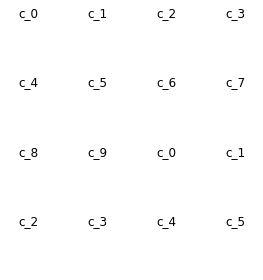

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_89\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_89\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_89\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_89\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_89\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


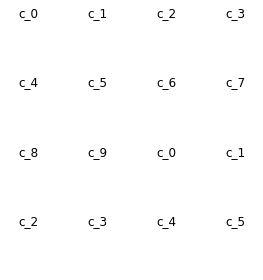

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_89\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_89\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_89\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_89\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_89\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


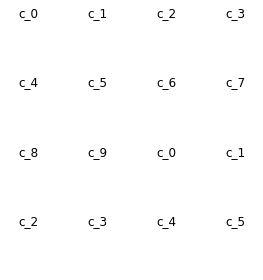

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_89\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_89\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_89\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_89\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_89\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


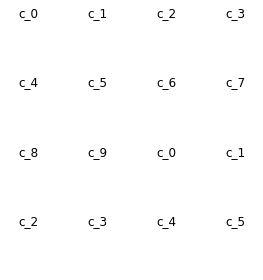

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_89\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_89\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_89\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_89\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_89\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_89\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


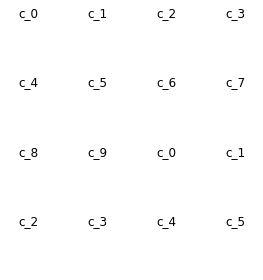

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


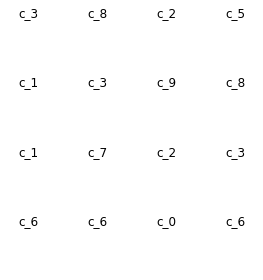

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.0000%
Saved checkpoint: checkpoints\it_89\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_89\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_89\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_89\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


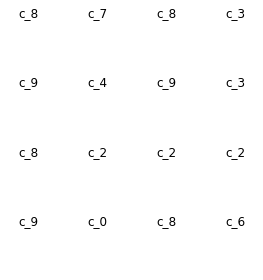

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2727%
Saved checkpoint: checkpoints\it_89\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_89\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_89\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_89\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 90

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_90\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_90\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_90\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_90\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_90\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


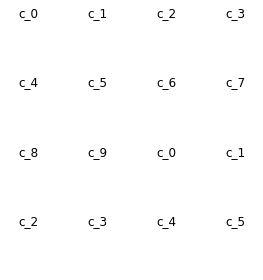

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_90\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_90\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_90\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_90\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_90\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


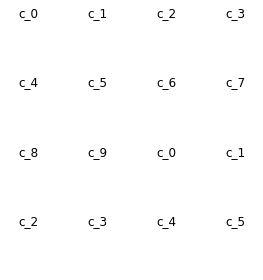

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_90\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_90\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_90\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_90\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_90\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


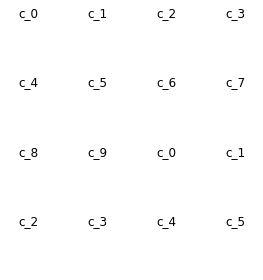

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_90\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_90\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_90\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_90\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_90\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


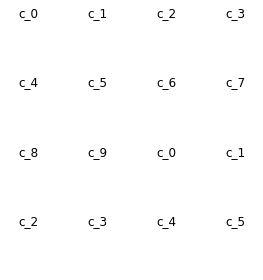

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_90\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_90\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_90\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_90\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_90\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_90\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


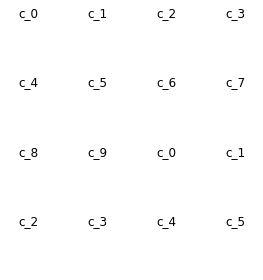

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


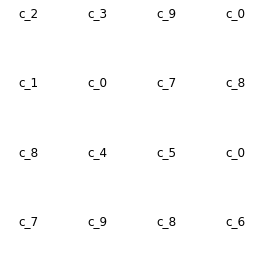

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.2000%
Saved checkpoint: checkpoints\it_90\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_90\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_90\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_90\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


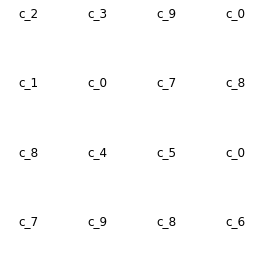

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.3947%
Saved checkpoint: checkpoints\it_90\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_90\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_90\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_90\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 91

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_91\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_91\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_91\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


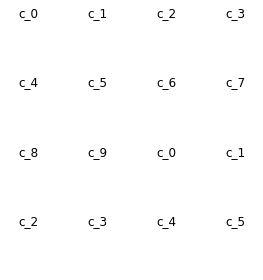

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_91\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_91\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_91\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


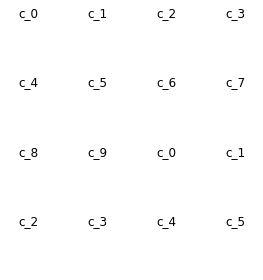

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_91\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_91\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_91\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


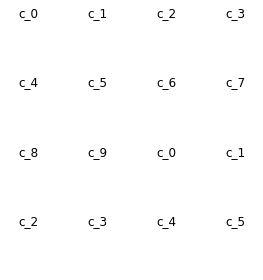

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_91\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_91\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_91\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


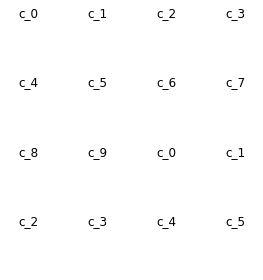

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_91\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_91\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_91\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_91\c_generator_checkpoint\ckpt-5


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


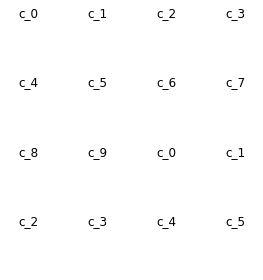

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_91\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_91\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_91\c_generator_checkpoint\ckpt-6
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


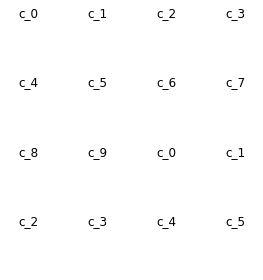

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_91\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_91\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_91\c_generator_checkpoint\ckpt-7
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


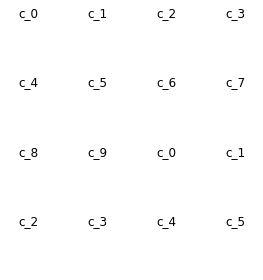

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_91\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_91\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_91\c_generator_checkpoint\ckpt-8
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


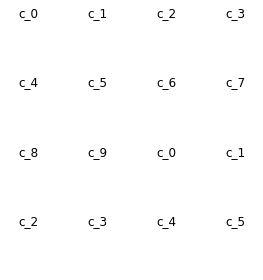

--------------------
Epoch 9/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_91\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_91\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_91\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_91\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_91\c_generator_checkpoint\ckpt-9
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


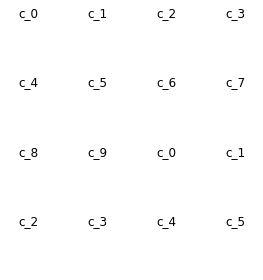

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


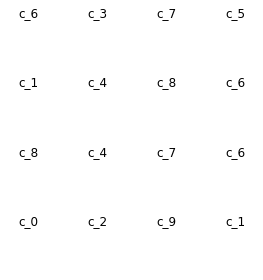

train_acc=10.2183%
accuracy of blackbox on G dataset: 10.6000%
Saved checkpoint: checkpoints\it_91\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_91\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_91\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_91\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


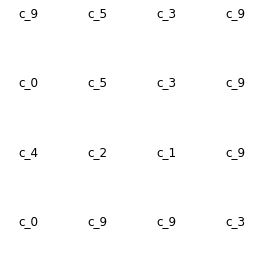

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.6250%
Saved checkpoint: checkpoints\it_91\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_91\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_91\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_91\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 92

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_92\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_92\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_92\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_92\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_92\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


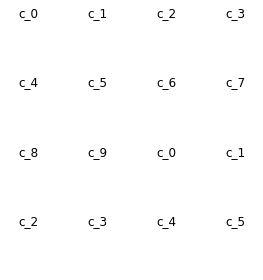

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_92\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_92\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_92\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_92\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_92\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


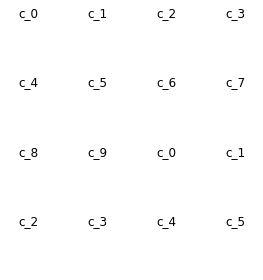

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_92\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_92\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_92\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_92\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_92\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


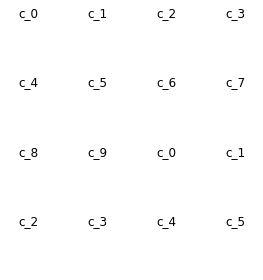

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_92\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_92\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_92\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_92\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_92\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


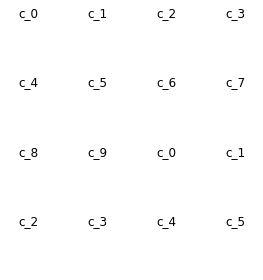

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_92\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_92\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_92\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_92\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_92\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_92\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


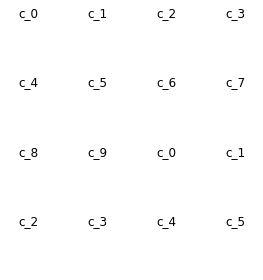

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


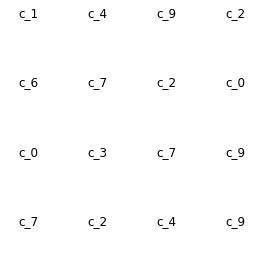

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.4000%
Saved checkpoint: checkpoints\it_92\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_92\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_92\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_92\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


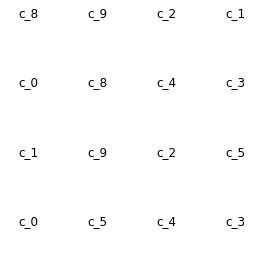

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.3077%
Saved checkpoint: checkpoints\it_92\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_92\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_92\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_92\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 93

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_93\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_93\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_93\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


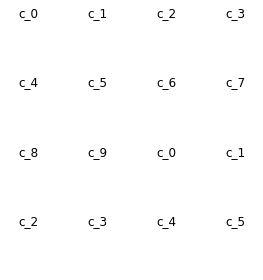

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_93\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_93\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_93\c_generator_checkpoint\ckpt-2


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


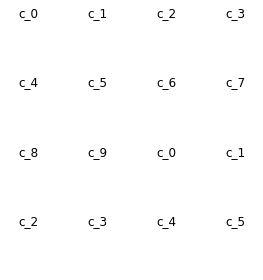

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_93\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_93\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_93\c_generator_checkpoint\ckpt-3


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


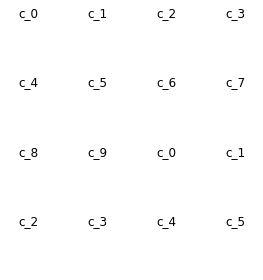

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_93\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_93\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_93\c_generator_checkpoint\ckpt-4
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


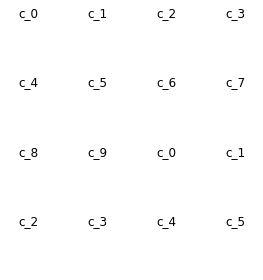

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_93\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_93\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_93\c_generator_checkpoint\ckpt-5
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


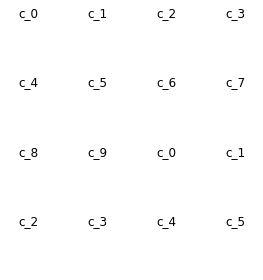

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_93\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_93\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_93\c_generator_checkpoint\ckpt-6
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


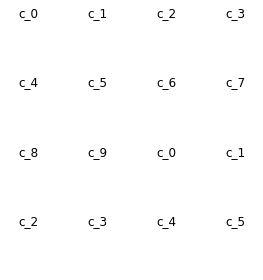

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_93\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_93\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_93\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_93\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_93\c_generator_checkpoint\ckpt-7
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


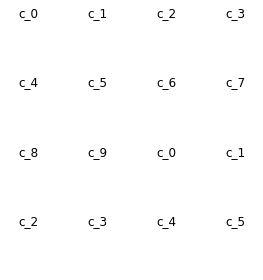

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


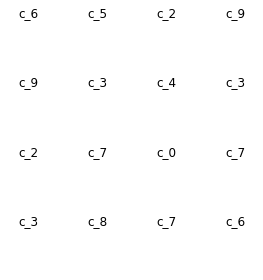

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.2000%
Saved checkpoint: checkpoints\it_93\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_93\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_93\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_93\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


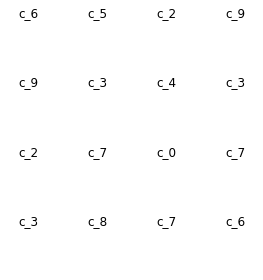

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.3889%
Saved checkpoint: checkpoints\it_93\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_93\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_93\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_93\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 94

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_94\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_94\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_94\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_94\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_94\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


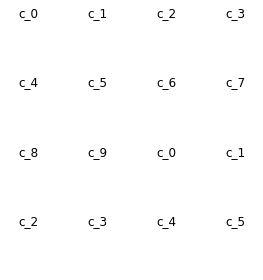

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_94\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_94\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_94\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_94\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_94\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


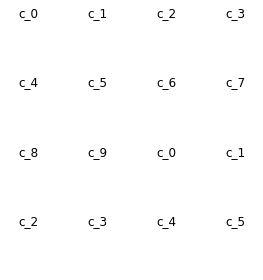

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_94\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_94\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_94\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_94\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_94\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


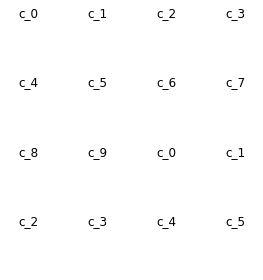

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_94\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_94\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_94\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_94\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_94\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


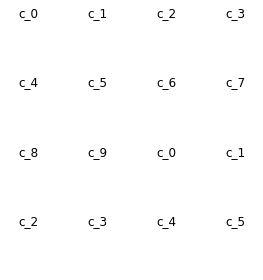

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_94\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_94\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_94\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_94\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_94\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_94\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


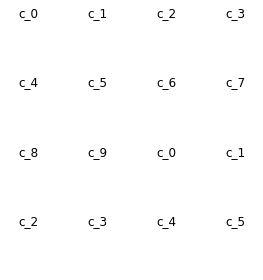

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


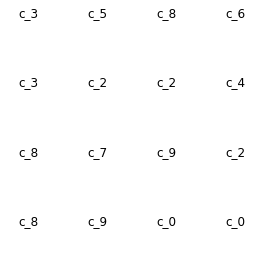

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.2000%
Saved checkpoint: checkpoints\it_94\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_94\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_94\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_94\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


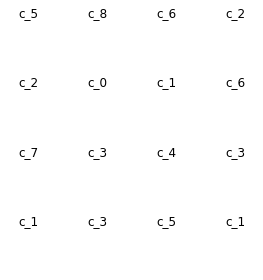

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.3478%
Saved checkpoint: checkpoints\it_94\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_94\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_94\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_94\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 95

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_95\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_95\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_95\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_95\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_95\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


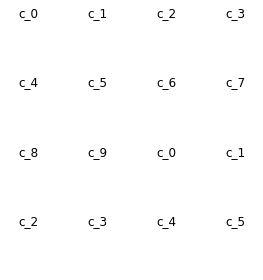

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_95\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_95\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_95\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_95\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_95\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


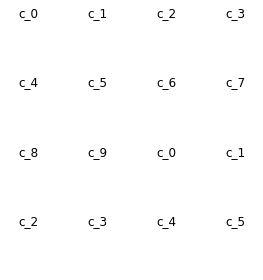

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_95\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_95\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_95\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_95\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_95\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


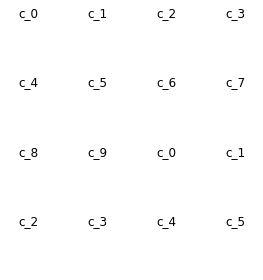

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_95\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_95\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_95\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_95\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_95\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


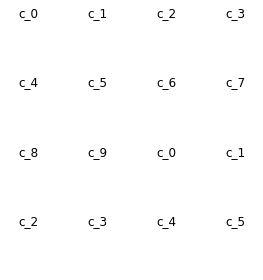

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_95\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_95\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_95\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_95\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_95\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_95\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


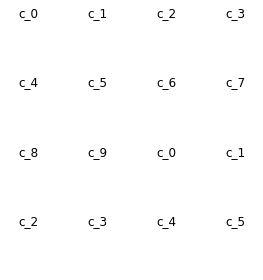

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


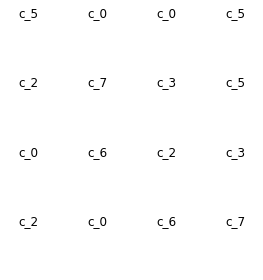

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6000%
Saved checkpoint: checkpoints\it_95\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_95\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_95\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_95\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


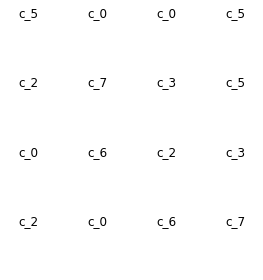

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.3929%
Saved checkpoint: checkpoints\it_95\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_95\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_95\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_95\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 96

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_96\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_96\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_96\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_96\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_96\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


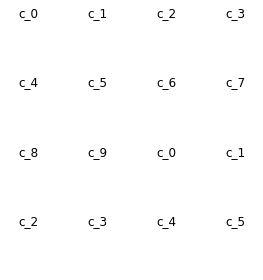

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_96\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_96\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_96\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_96\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_96\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


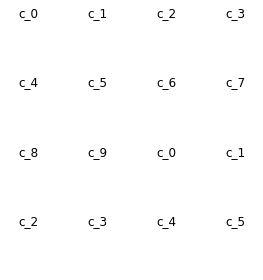

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_96\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_96\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_96\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_96\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_96\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


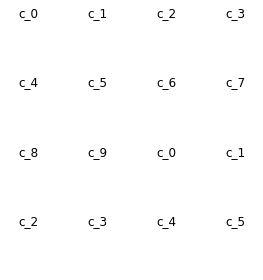

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_96\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_96\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_96\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_96\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_96\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


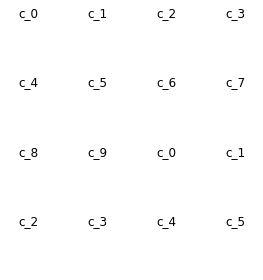

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_96\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_96\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_96\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_96\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_96\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_96\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


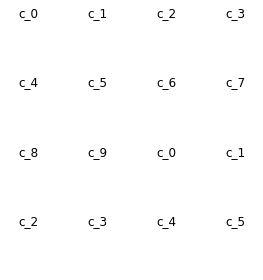

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


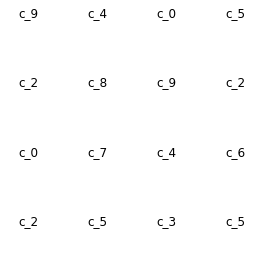

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.6000%
Saved checkpoint: checkpoints\it_96\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_96\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_96\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_96\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


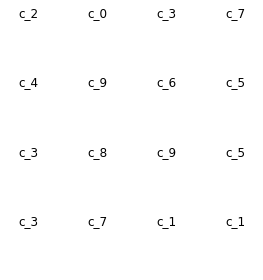

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.7273%
Saved checkpoint: checkpoints\it_96\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_96\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_96\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_96\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 97

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_97\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_97\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_97\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_97\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_97\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


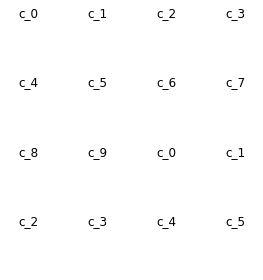

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_97\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_97\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_97\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_97\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_97\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


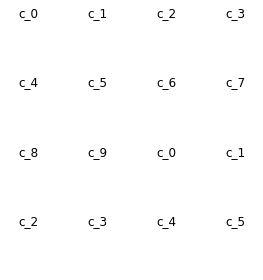

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_97\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_97\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_97\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_97\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_97\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


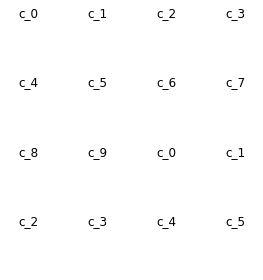

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_97\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_97\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_97\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_97\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_97\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


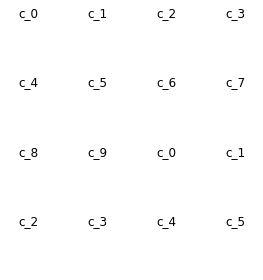

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_97\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_97\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_97\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_97\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_97\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_97\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


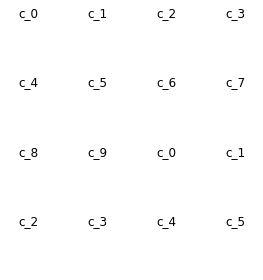

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


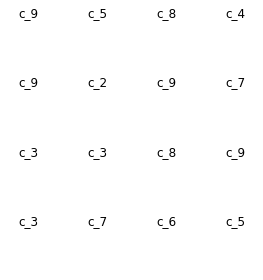

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6000%
Saved checkpoint: checkpoints\it_97\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_97\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_97\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_97\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


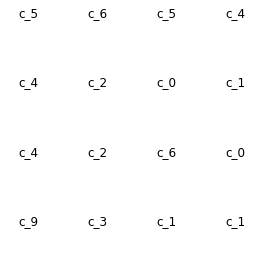

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8421%
Saved checkpoint: checkpoints\it_97\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_97\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_97\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_97\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 98

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_98\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_98\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_98\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_98\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_98\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


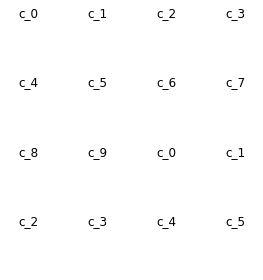

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_98\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_98\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_98\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_98\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_98\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


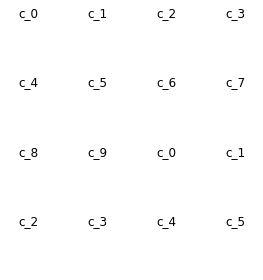

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_98\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_98\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_98\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_98\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_98\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


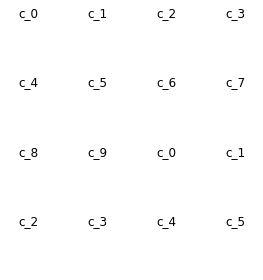

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_98\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_98\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_98\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_98\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_98\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


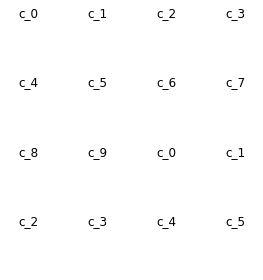

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_98\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_98\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_98\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_98\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_98\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_98\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


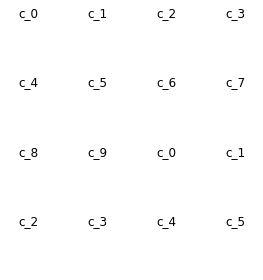

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


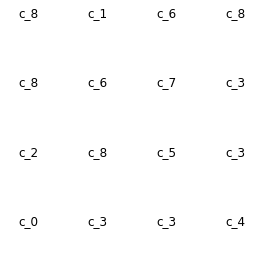

train_acc=10.2183%
accuracy of blackbox on G dataset: 10.8000%
Saved checkpoint: checkpoints\it_98\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_98\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_98\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_98\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


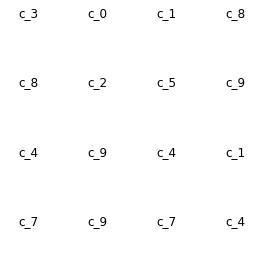

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.7500%
Saved checkpoint: checkpoints\it_98\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_98\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_98\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_98\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 99

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_99\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_99\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_99\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_99\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_99\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


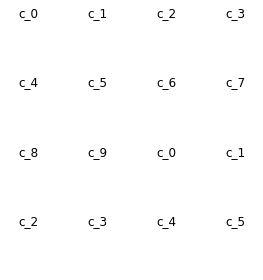

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_99\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_99\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_99\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_99\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_99\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


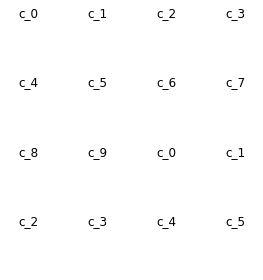

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_99\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_99\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_99\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_99\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_99\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


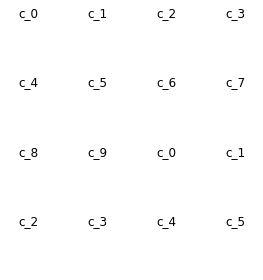

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_99\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_99\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_99\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_99\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_99\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


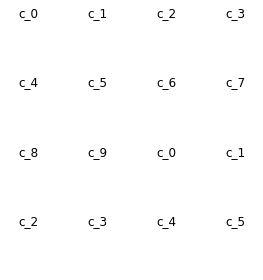

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_99\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_99\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_99\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_99\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_99\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_99\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


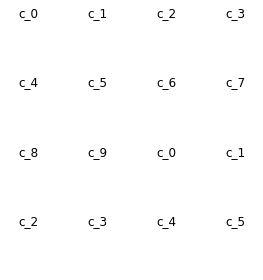

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


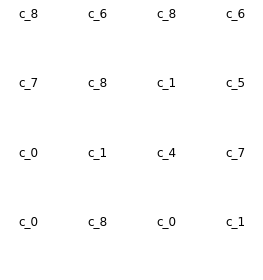

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.2000%
Saved checkpoint: checkpoints\it_99\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_99\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_99\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_99\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


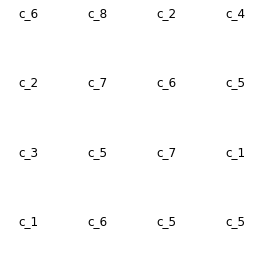

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.3077%
Saved checkpoint: checkpoints\it_99\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_99\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_99\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_99\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 100

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_100\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_100\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_100\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_100\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_100\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


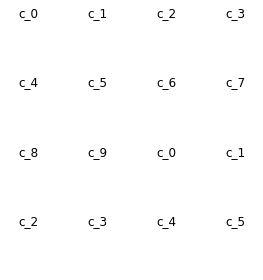

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_100\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_100\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_100\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_100\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_100\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


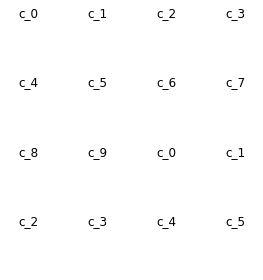

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_100\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_100\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_100\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_100\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_100\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


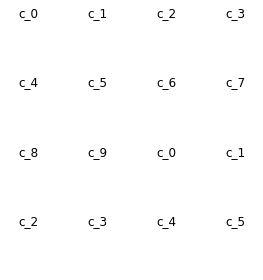

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_100\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_100\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_100\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_100\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_100\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


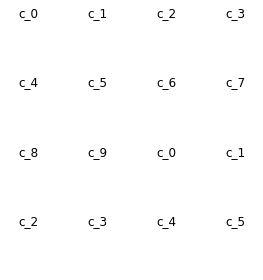

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_100\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_100\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_100\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_100\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_100\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_100\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


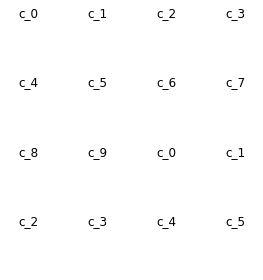

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


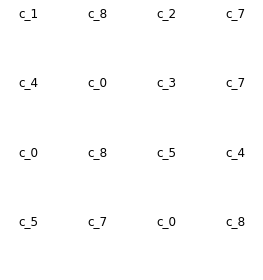

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6000%
Saved checkpoint: checkpoints\it_100\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_100\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_100\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_100\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


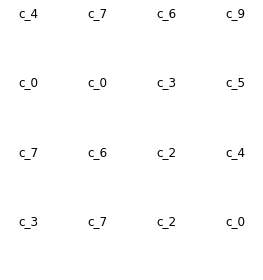

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.9444%
Saved checkpoint: checkpoints\it_100\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_100\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_100\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_100\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 101

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_101\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_101\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_101\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


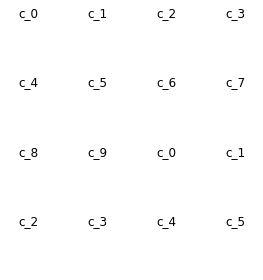

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_101\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_101\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_101\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


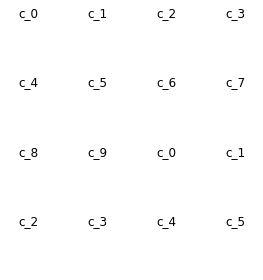

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_101\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_101\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_101\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


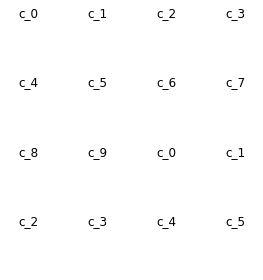

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_101\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_101\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_101\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


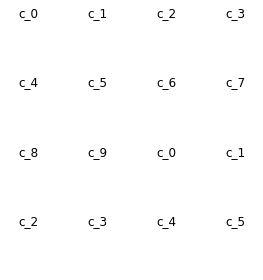

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_101\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_101\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_101\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_101\c_generator_checkpoint\ckpt-5


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


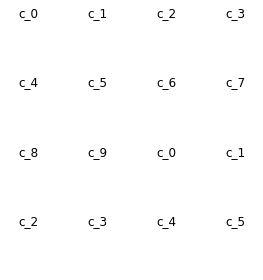

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_101\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_101\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_101\c_generator_checkpoint\ckpt-6
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


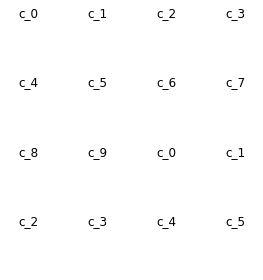

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_101\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_101\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_101\c_generator_checkpoint\ckpt-7
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


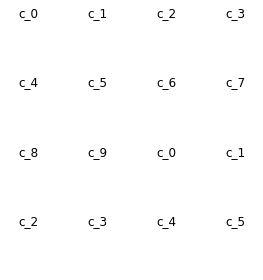

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_101\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_101\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_101\c_generator_checkpoint\ckpt-8
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


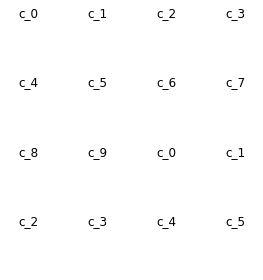

--------------------
Epoch 9/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_101\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_101\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_101\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_101\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_101\c_generator_checkpoint\ckpt-9
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


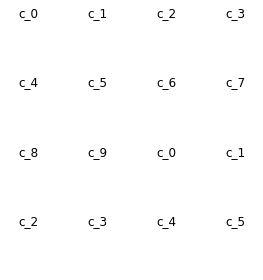

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


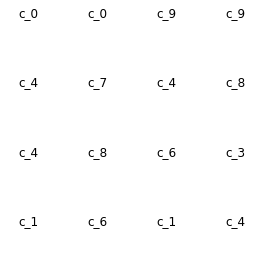

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0000%
Saved checkpoint: checkpoints\it_101\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_101\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_101\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_101\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


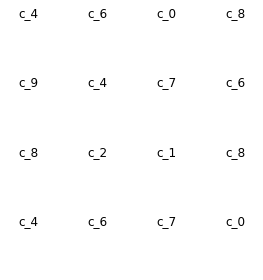

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.9565%
Saved checkpoint: checkpoints\it_101\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_101\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_101\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_101\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 102

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_102\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_102\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_102\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_102\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_102\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


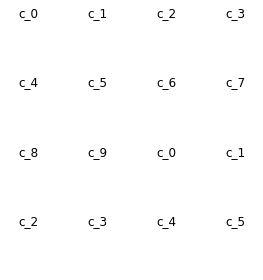

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_102\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_102\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_102\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_102\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_102\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


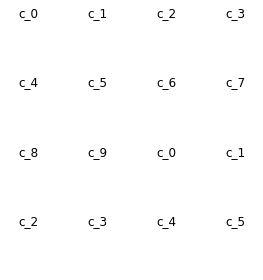

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_102\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_102\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_102\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_102\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_102\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


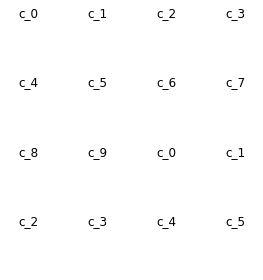

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_102\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_102\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_102\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_102\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_102\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


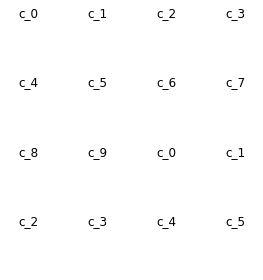

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_102\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_102\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_102\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_102\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_102\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_102\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


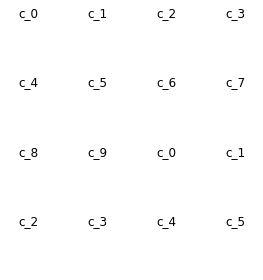

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


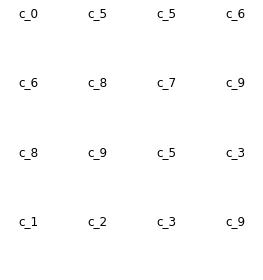

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 12.2000%
Saved checkpoint: checkpoints\it_102\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_102\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_102\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_102\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


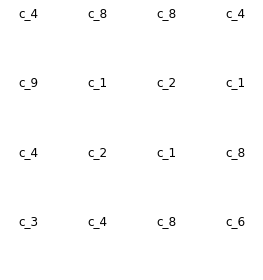

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.7143%
Saved checkpoint: checkpoints\it_102\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_102\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_102\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_102\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 103

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_103\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_103\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_103\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_103\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_103\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


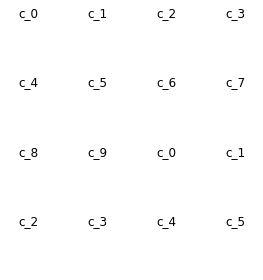

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_103\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_103\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_103\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_103\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_103\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


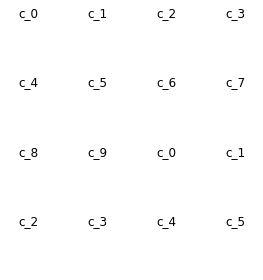

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_103\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_103\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_103\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_103\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_103\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


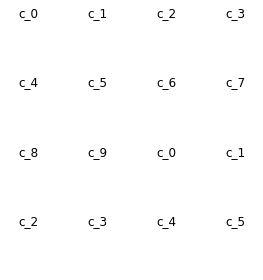

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_103\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_103\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_103\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_103\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_103\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


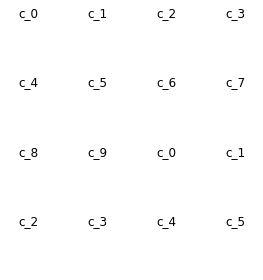

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_103\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_103\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_103\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_103\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_103\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_103\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


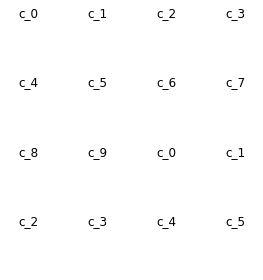

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


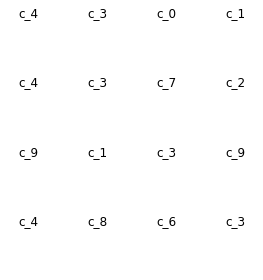

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 12.8000%
Saved checkpoint: checkpoints\it_103\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_103\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_103\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_103\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


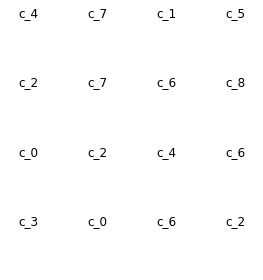

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.3333%
Saved checkpoint: checkpoints\it_103\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_103\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_103\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_103\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 104

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_104\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_104\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_104\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_104\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_104\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


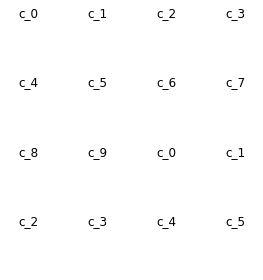

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_104\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_104\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_104\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_104\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_104\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


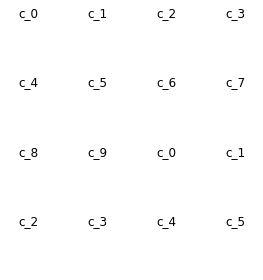

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_104\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_104\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_104\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_104\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_104\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


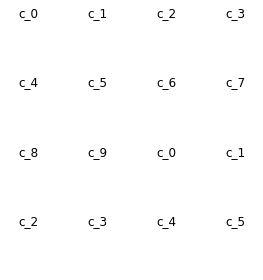

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_104\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_104\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_104\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_104\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_104\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


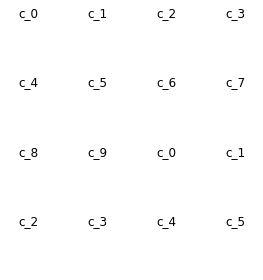

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_104\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_104\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_104\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_104\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_104\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_104\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


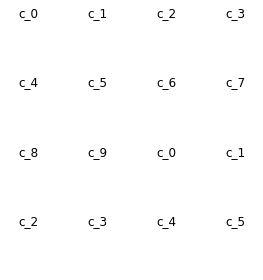

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


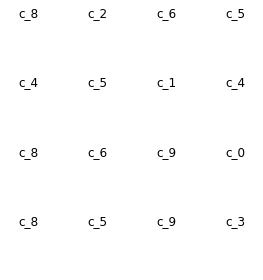

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2000%
Saved checkpoint: checkpoints\it_104\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_104\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_104\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_104\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


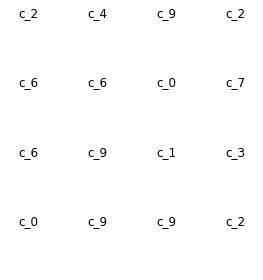

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.3158%
Saved checkpoint: checkpoints\it_104\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_104\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_104\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_104\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 105

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_105\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_105\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_105\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


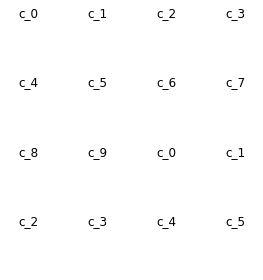

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_105\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_105\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_105\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


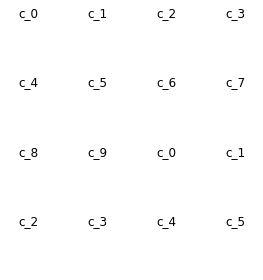

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_105\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_105\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_105\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


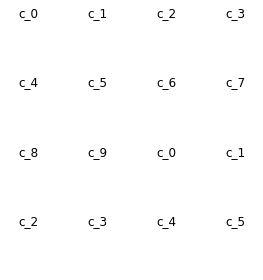

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_105\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_105\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_105\c_generator_checkpoint\ckpt-4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


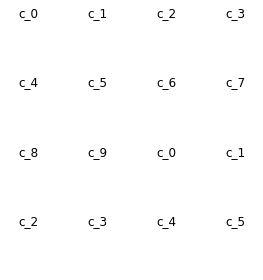

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_105\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_105\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_105\c_generator_checkpoint\ckpt-5
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


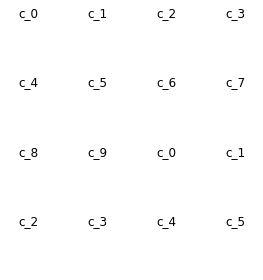

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_105\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_105\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_105\c_generator_checkpoint\ckpt-6
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


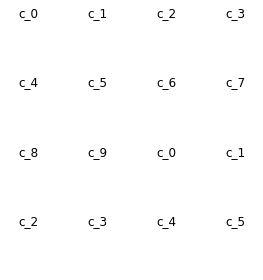

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_105\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_105\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_105\c_generator_checkpoint\ckpt-7
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


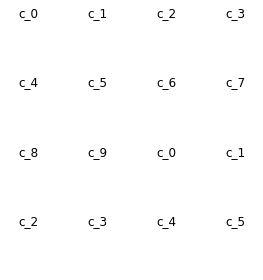

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_105\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_105\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_105\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_105\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_105\c_generator_checkpoint\ckpt-8
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


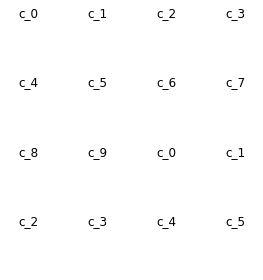

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


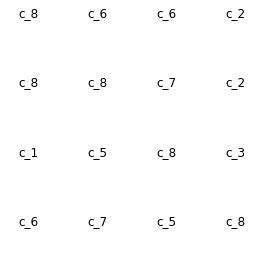

train_acc=10.2183%
accuracy of blackbox on G dataset: 11.8000%
Saved checkpoint: checkpoints\it_105\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_105\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_105\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_105\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


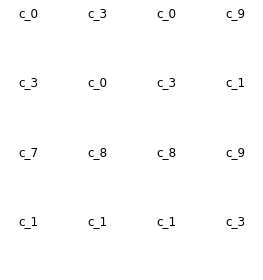

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.3750%
Saved checkpoint: checkpoints\it_105\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_105\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_105\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_105\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 106

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_106\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_106\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_106\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_106\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_106\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


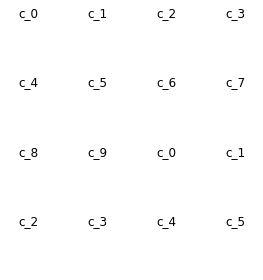

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_106\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_106\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_106\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_106\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_106\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


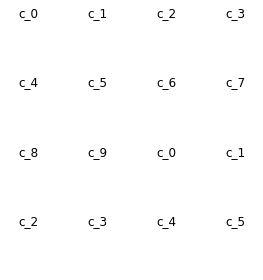

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_106\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_106\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_106\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_106\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_106\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


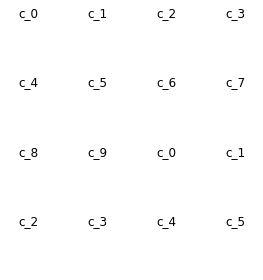

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_106\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_106\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_106\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_106\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_106\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


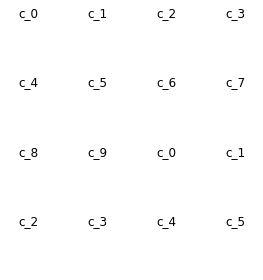

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_106\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_106\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_106\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_106\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_106\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_106\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


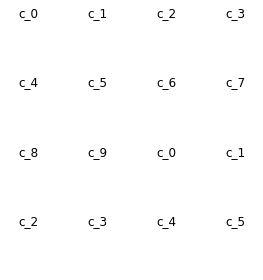

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


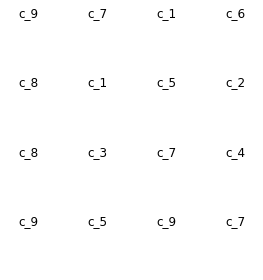

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_106\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_106\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_106\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_106\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


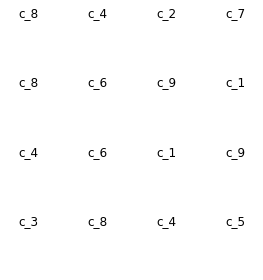

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.1538%
Saved checkpoint: checkpoints\it_106\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_106\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_106\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_106\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 107

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_107\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_107\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_107\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_107\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_107\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


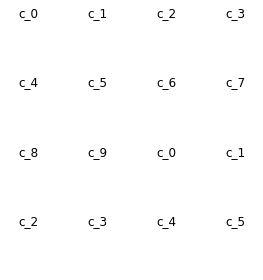

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_107\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_107\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_107\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_107\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_107\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


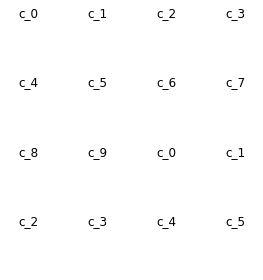

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_107\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_107\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_107\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_107\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_107\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


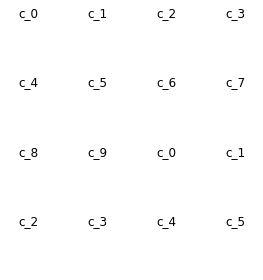

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_107\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_107\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_107\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_107\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_107\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


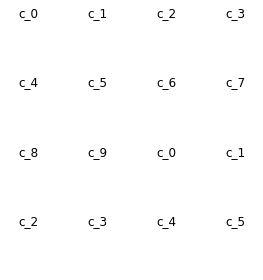

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_107\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_107\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_107\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_107\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_107\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_107\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


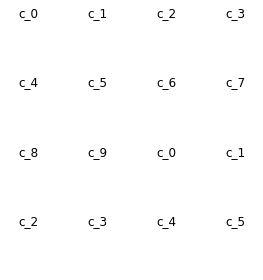

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


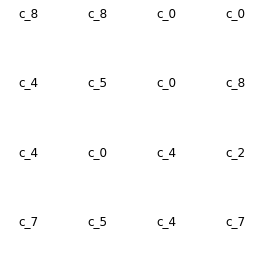

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.8000%
Saved checkpoint: checkpoints\it_107\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_107\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_107\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_107\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


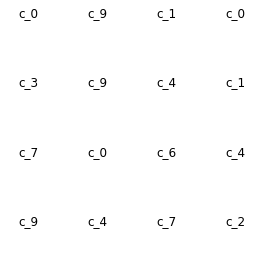

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8889%
Saved checkpoint: checkpoints\it_107\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_107\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_107\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_107\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 108

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_108\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_108\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_108\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_108\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_108\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


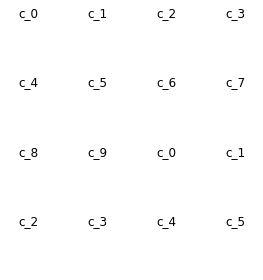

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_108\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_108\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_108\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_108\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_108\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


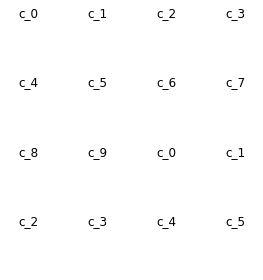

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_108\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_108\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_108\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_108\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_108\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


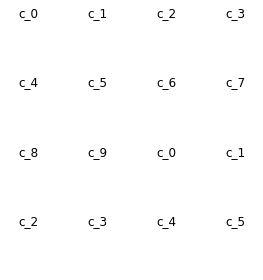

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_108\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_108\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_108\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_108\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_108\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


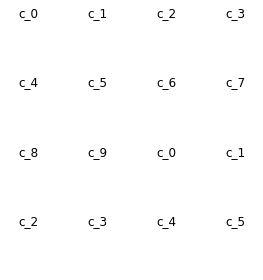

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_108\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_108\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_108\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_108\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_108\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_108\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


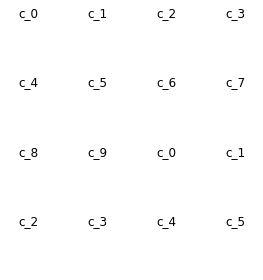

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


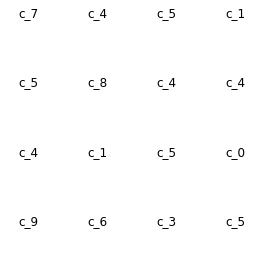

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2000%
Saved checkpoint: checkpoints\it_108\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_108\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_108\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_108\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


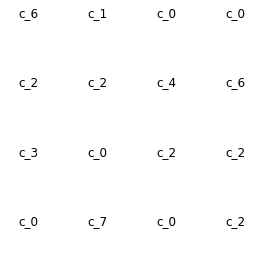

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.9565%
Saved checkpoint: checkpoints\it_108\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_108\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_108\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_108\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 109

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_109\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_109\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_109\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_109\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_109\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


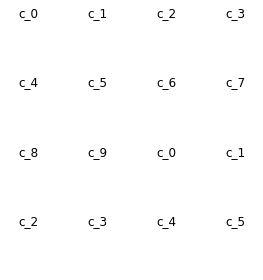

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_109\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_109\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_109\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_109\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_109\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


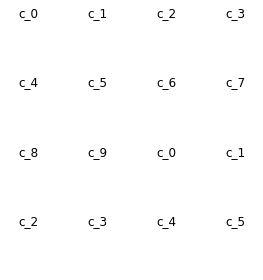

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_109\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_109\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_109\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_109\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_109\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


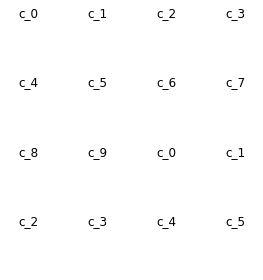

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_109\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_109\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_109\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_109\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_109\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


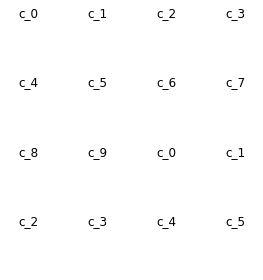

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_109\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_109\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_109\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_109\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_109\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_109\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


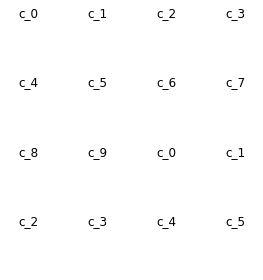

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


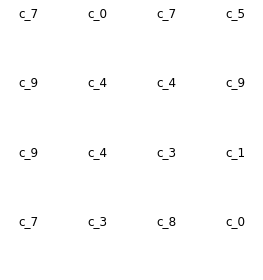

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.8000%
Saved checkpoint: checkpoints\it_109\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_109\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_109\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_109\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


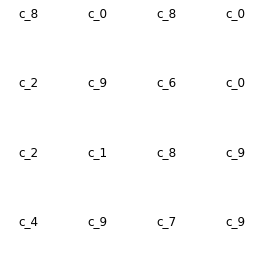

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2857%
Saved checkpoint: checkpoints\it_109\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_109\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_109\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_109\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 110

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_110\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_110\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_110\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_110\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_110\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


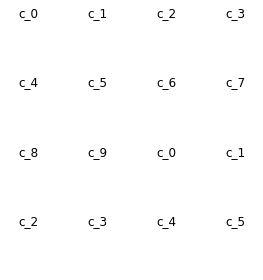

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_110\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_110\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_110\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_110\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_110\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


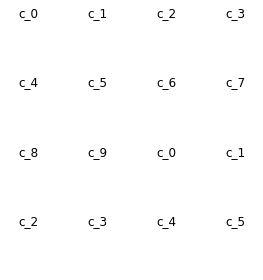

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_110\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_110\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_110\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_110\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_110\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


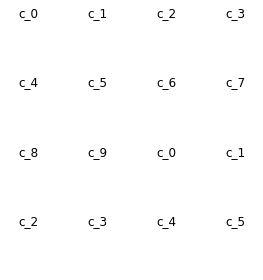

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_110\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_110\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_110\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_110\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_110\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


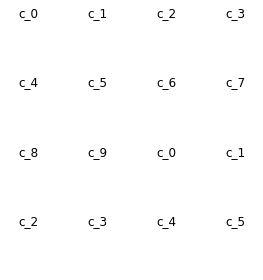

--------------------
Epoch 5/25


g_acc=0.09, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_110\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_110\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_110\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_110\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_110\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_110\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


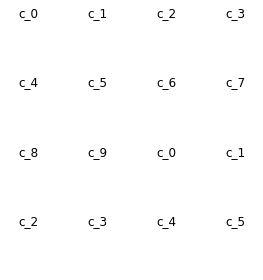

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


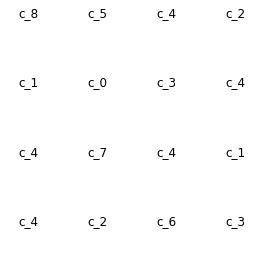

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6000%
Saved checkpoint: checkpoints\it_110\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_110\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_110\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_110\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


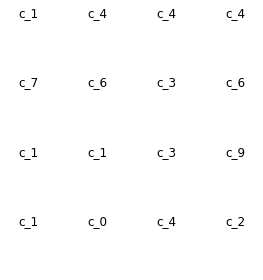

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.1818%
Saved checkpoint: checkpoints\it_110\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_110\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_110\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_110\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 111

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_111\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_111\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_111\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_111\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_111\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


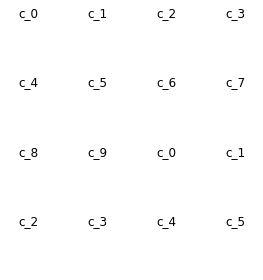

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_111\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_111\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_111\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_111\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_111\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


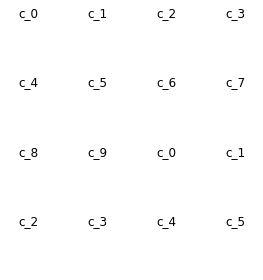

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_111\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_111\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_111\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_111\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_111\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


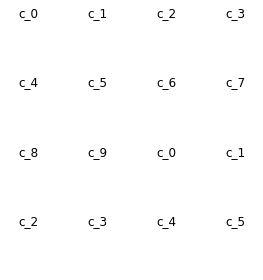

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_111\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_111\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_111\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_111\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_111\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


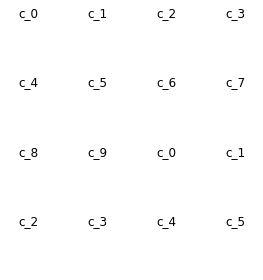

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_111\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_111\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_111\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_111\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_111\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_111\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


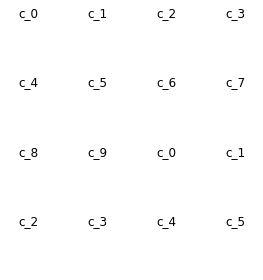

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


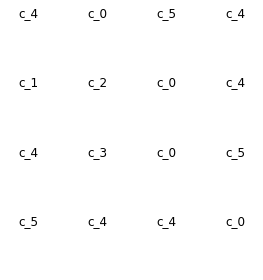

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.8000%
Saved checkpoint: checkpoints\it_111\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_111\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_111\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_111\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


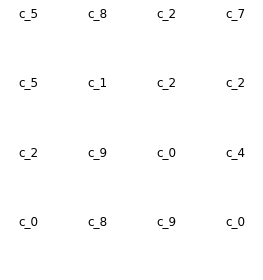

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2632%
Saved checkpoint: checkpoints\it_111\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_111\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_111\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_111\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 112

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_112\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_112\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_112\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_112\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_112\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


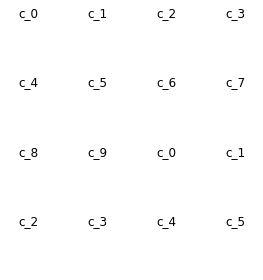

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_112\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_112\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_112\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_112\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_112\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


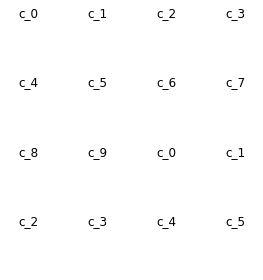

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_112\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_112\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_112\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_112\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_112\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


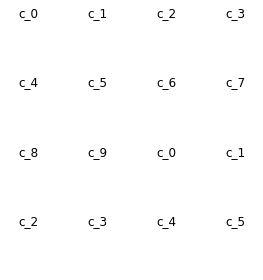

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_112\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_112\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_112\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_112\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_112\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


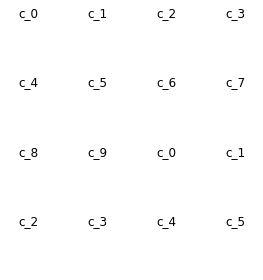

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_112\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_112\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_112\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_112\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_112\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_112\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


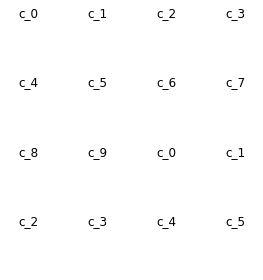

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


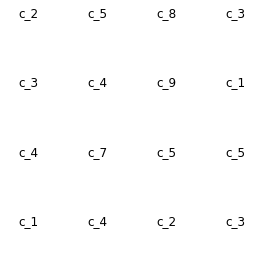

train_acc=10.2183%
accuracy of blackbox on G dataset: 9.8000%
Saved checkpoint: checkpoints\it_112\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_112\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_112\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_112\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


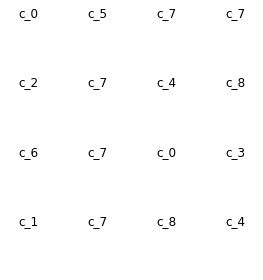

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.1250%
Saved checkpoint: checkpoints\it_112\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_112\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_112\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_112\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 113

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_113\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_113\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_113\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_113\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_113\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


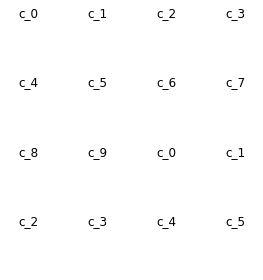

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_113\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_113\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_113\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_113\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_113\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


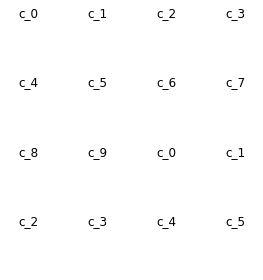

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_113\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_113\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_113\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_113\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_113\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


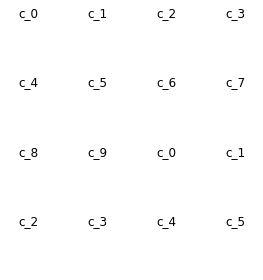

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_113\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_113\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_113\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_113\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_113\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


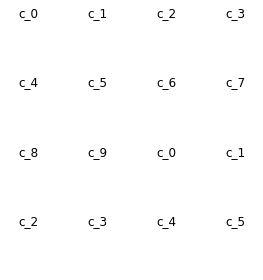

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_113\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_113\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_113\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_113\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_113\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_113\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


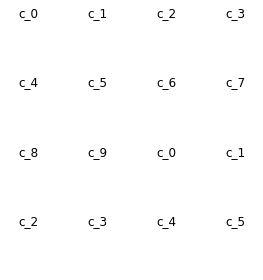

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


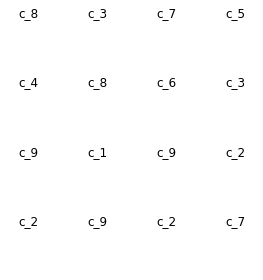

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.2000%
Saved checkpoint: checkpoints\it_113\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_113\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_113\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_113\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


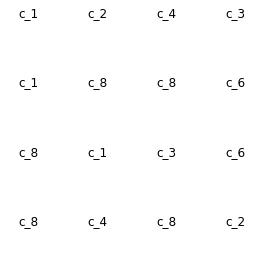

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.9231%
Saved checkpoint: checkpoints\it_113\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_113\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_113\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_113\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 114

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_114\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_114\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_114\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_114\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_114\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


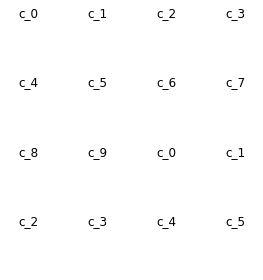

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_114\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_114\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_114\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_114\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_114\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


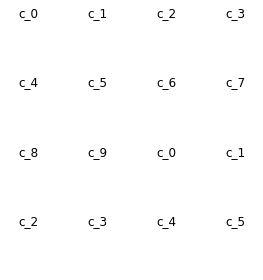

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_114\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_114\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_114\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_114\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_114\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


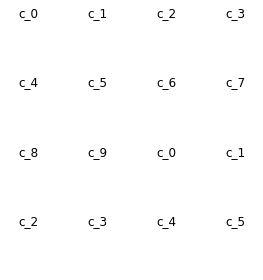

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_114\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_114\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_114\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_114\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_114\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


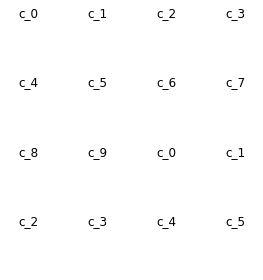

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_114\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_114\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_114\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_114\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_114\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_114\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


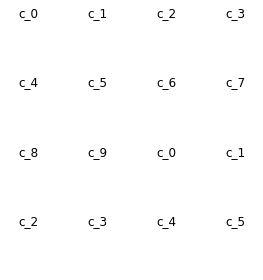

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


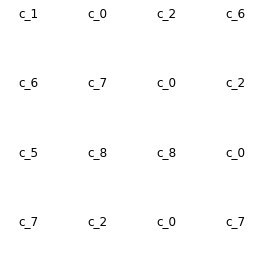

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.4000%
Saved checkpoint: checkpoints\it_114\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_114\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_114\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_114\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


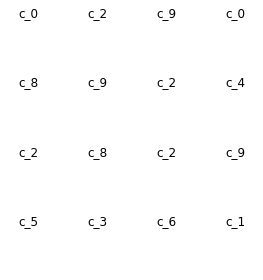

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.3333%
Saved checkpoint: checkpoints\it_114\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_114\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_114\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_114\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 115

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_115\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_115\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_115\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_115\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_115\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


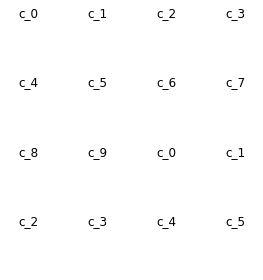

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_115\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_115\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_115\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_115\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_115\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


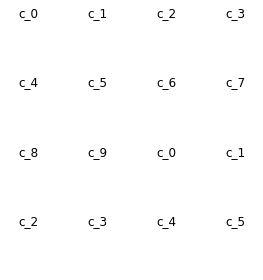

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_115\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_115\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_115\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_115\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_115\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


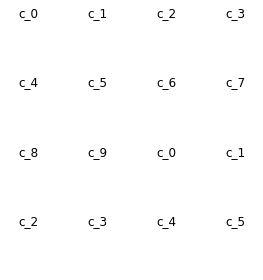

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_115\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_115\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_115\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_115\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_115\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


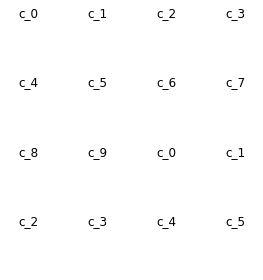

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_115\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_115\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_115\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_115\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_115\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_115\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


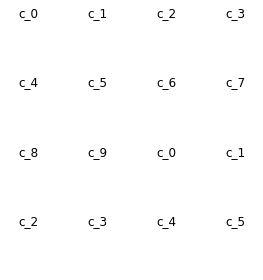

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


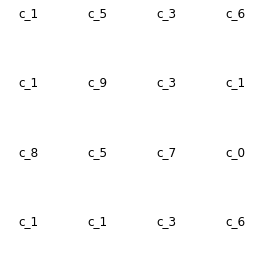

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_115\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_115\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_115\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_115\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


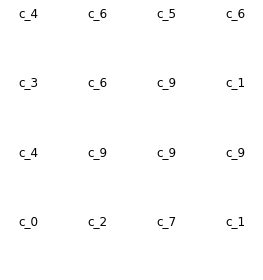

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.7826%
Saved checkpoint: checkpoints\it_115\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_115\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_115\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_115\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 116

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_116\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_116\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_116\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_116\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_116\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


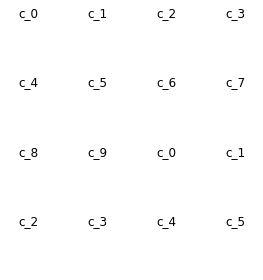

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_116\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_116\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_116\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_116\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_116\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


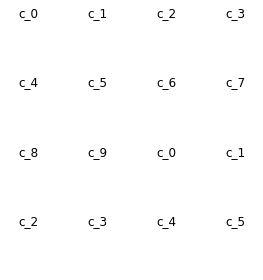

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_116\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_116\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_116\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_116\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_116\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


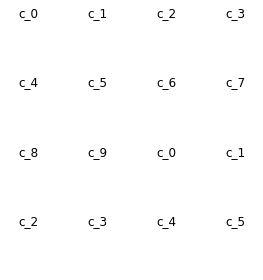

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_116\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_116\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_116\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_116\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_116\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


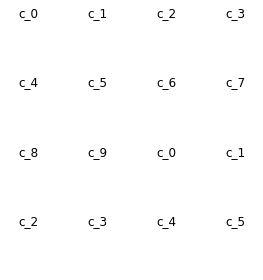

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_116\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_116\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_116\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_116\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_116\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_116\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


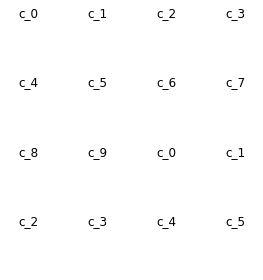

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


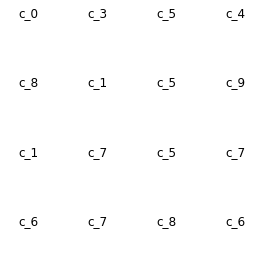

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0000%
Saved checkpoint: checkpoints\it_116\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_116\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_116\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_116\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


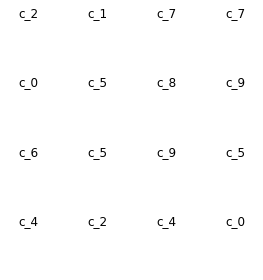

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.8214%
Saved checkpoint: checkpoints\it_116\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_116\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_116\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_116\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 117

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_117\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_117\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_117\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_117\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_117\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


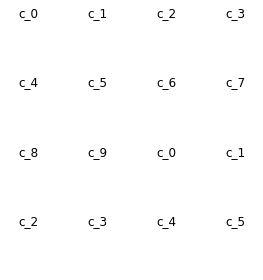

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_117\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_117\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_117\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_117\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_117\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


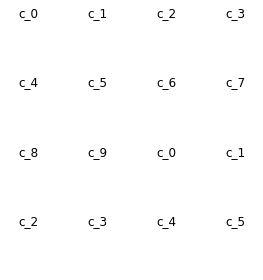

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_117\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_117\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_117\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_117\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_117\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


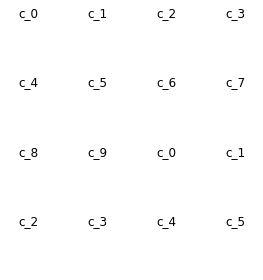

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_117\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_117\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_117\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_117\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_117\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


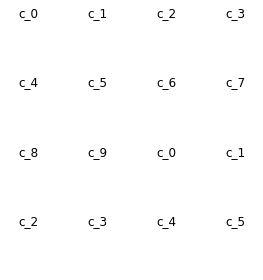

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_117\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_117\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_117\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_117\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_117\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_117\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


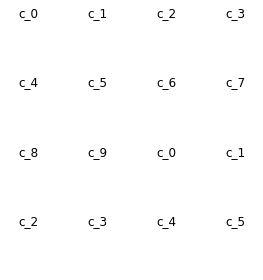

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


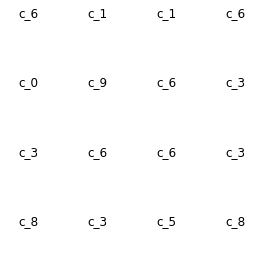

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.4000%
Saved checkpoint: checkpoints\it_117\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_117\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_117\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_117\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


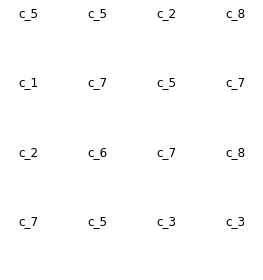

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.3636%
Saved checkpoint: checkpoints\it_117\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_117\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_117\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_117\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 118

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_118\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_118\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_118\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_118\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_118\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


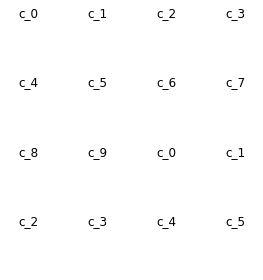

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_118\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_118\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_118\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_118\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_118\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


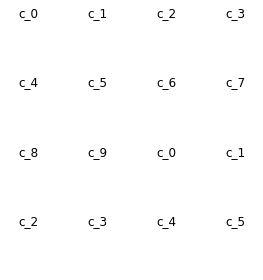

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_118\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_118\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_118\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_118\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_118\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


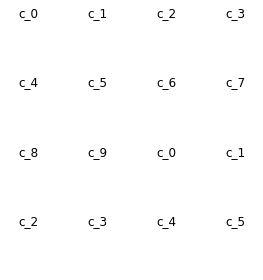

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_118\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_118\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_118\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_118\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_118\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


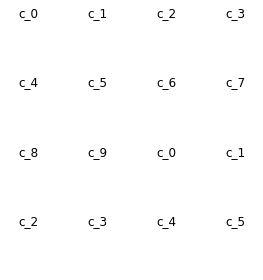

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_118\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_118\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_118\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_118\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_118\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_118\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


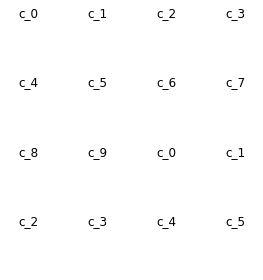

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


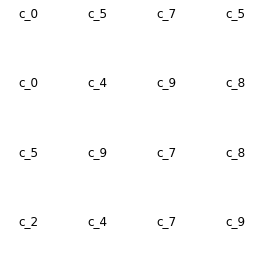

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6000%
Saved checkpoint: checkpoints\it_118\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_118\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_118\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_118\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


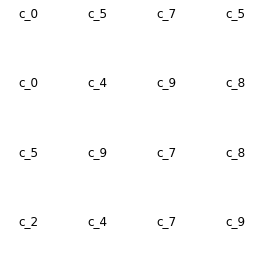

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.3947%
Saved checkpoint: checkpoints\it_118\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_118\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_118\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_118\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 119

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_119\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_119\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_119\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


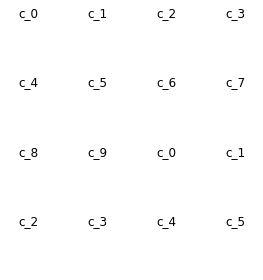

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_119\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_119\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_119\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


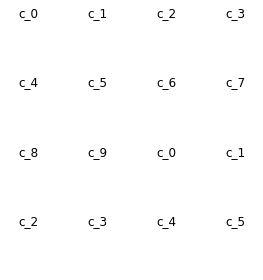

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_119\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_119\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_119\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


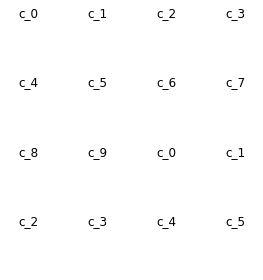

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_119\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_119\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_119\c_generator_checkpoint\ckpt-4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


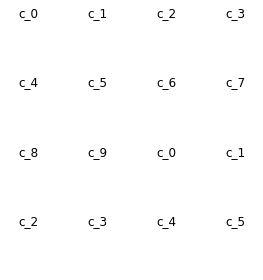

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_119\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_119\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_119\c_generator_checkpoint\ckpt-5
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


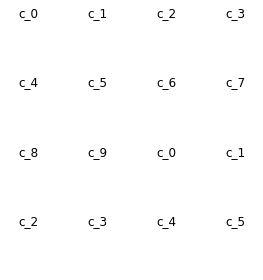

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_119\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_119\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_119\c_generator_checkpoint\ckpt-6
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


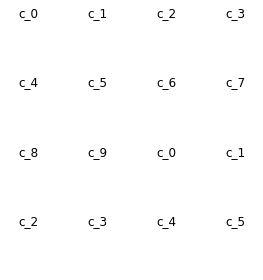

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_119\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_119\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_119\c_generator_checkpoint\ckpt-7
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


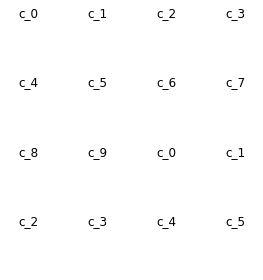

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_119\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_119\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_119\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_119\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_119\c_generator_checkpoint\ckpt-8
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


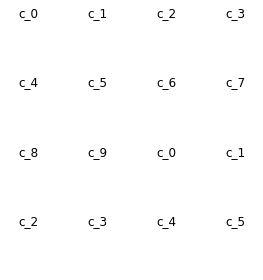

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


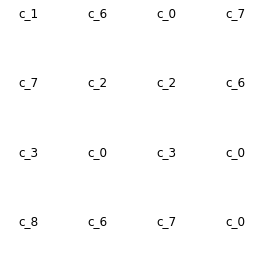

train_acc=10.2183%
accuracy of blackbox on G dataset: 8.4000%
Saved checkpoint: checkpoints\it_119\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_119\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_119\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_119\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


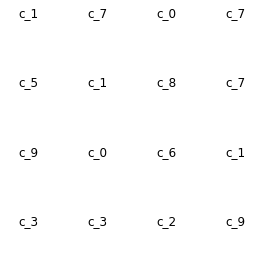

train_acc=0.0000%
accuracy of blackbox on G dataset: 5.2500%
Saved checkpoint: checkpoints\it_119\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_119\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_119\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_119\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 120

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_120\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_120\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_120\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_120\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_120\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


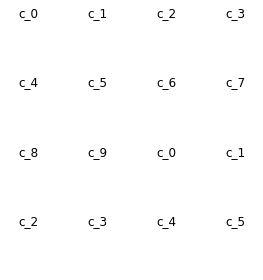

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_120\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_120\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_120\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_120\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_120\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


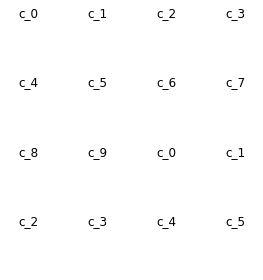

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_120\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_120\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_120\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_120\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_120\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


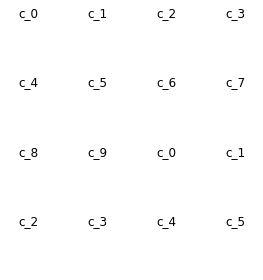

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_120\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_120\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_120\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_120\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_120\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


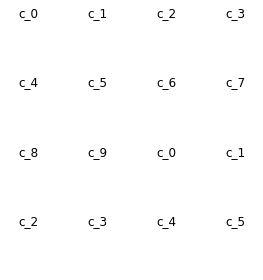

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_120\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_120\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_120\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_120\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_120\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_120\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


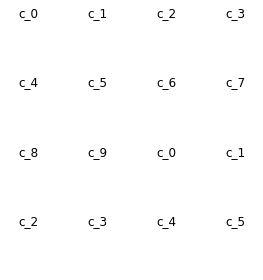

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


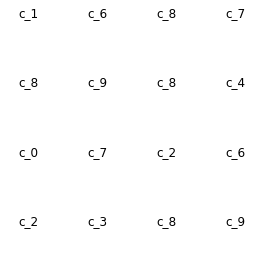

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_120\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_120\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_120\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_120\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


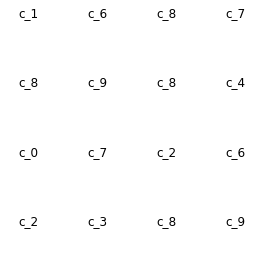

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.8462%
Saved checkpoint: checkpoints\it_120\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_120\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_120\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_120\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 121

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_121\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_121\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_121\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_121\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_121\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


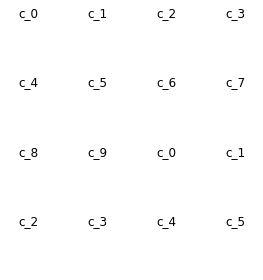

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_121\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_121\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_121\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_121\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_121\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


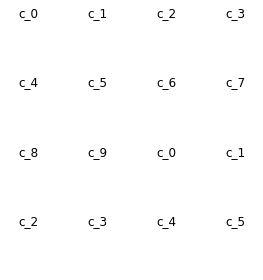

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_121\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_121\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_121\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_121\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_121\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


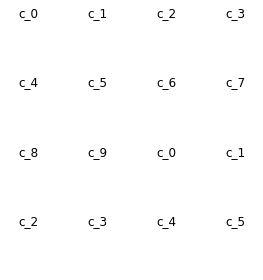

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_121\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_121\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_121\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_121\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_121\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


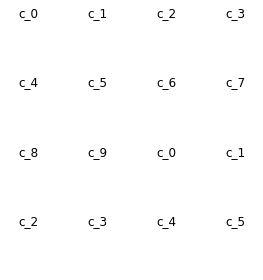

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_121\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_121\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_121\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_121\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_121\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_121\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


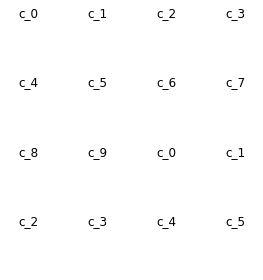

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


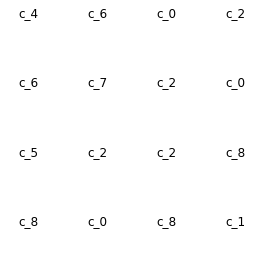

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.0000%
Saved checkpoint: checkpoints\it_121\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_121\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_121\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_121\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


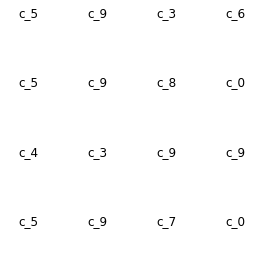

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.7222%
Saved checkpoint: checkpoints\it_121\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_121\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_121\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_121\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 122

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_122\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_122\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_122\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_122\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_122\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


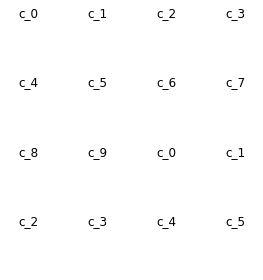

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_122\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_122\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_122\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_122\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_122\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


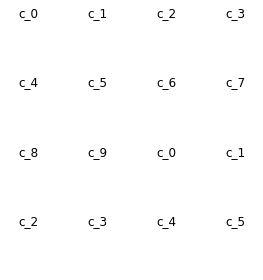

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_122\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_122\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_122\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_122\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_122\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


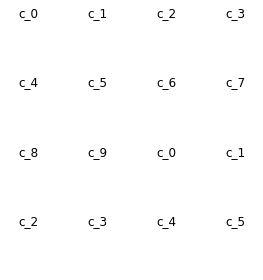

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_122\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_122\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_122\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_122\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_122\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


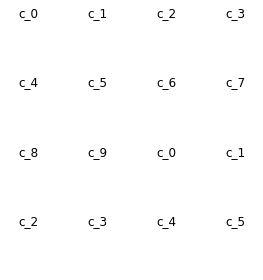

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_122\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_122\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_122\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_122\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_122\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_122\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


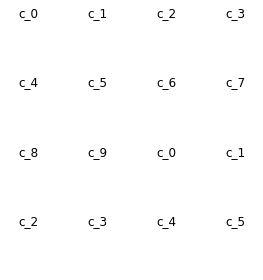

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


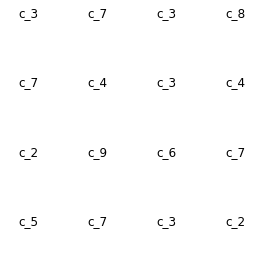

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_122\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_122\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_122\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_122\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


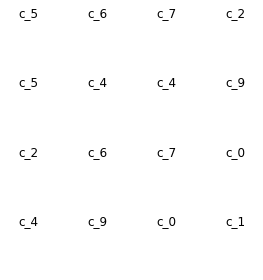

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0870%
Saved checkpoint: checkpoints\it_122\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_122\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_122\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_122\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 123

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_123\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_123\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_123\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_123\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_123\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


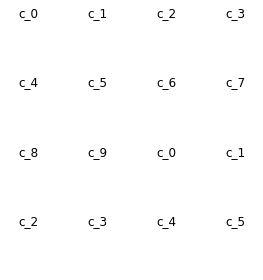

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_123\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_123\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_123\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_123\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_123\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


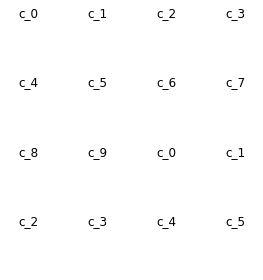

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_123\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_123\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_123\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_123\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_123\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


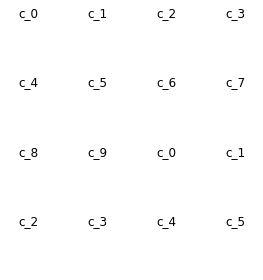

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_123\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_123\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_123\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_123\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_123\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


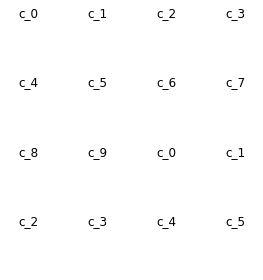

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_123\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_123\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_123\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_123\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_123\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_123\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


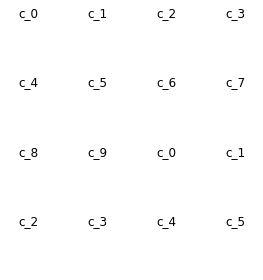

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


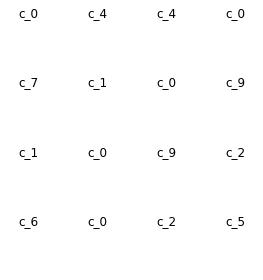

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0000%
Saved checkpoint: checkpoints\it_123\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_123\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_123\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_123\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


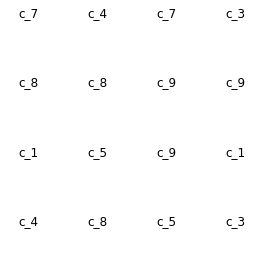

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0714%
Saved checkpoint: checkpoints\it_123\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_123\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_123\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_123\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 124

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_124\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_124\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_124\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_124\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_124\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


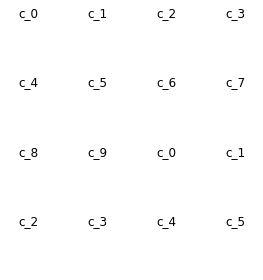

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_124\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_124\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_124\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_124\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_124\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


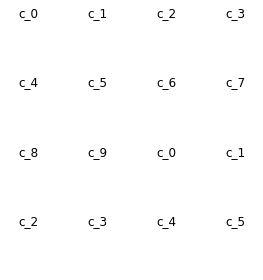

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_124\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_124\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_124\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_124\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_124\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


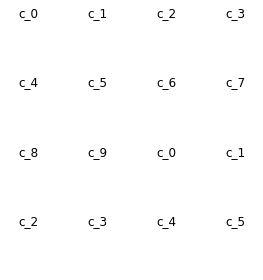

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_124\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_124\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_124\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_124\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_124\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


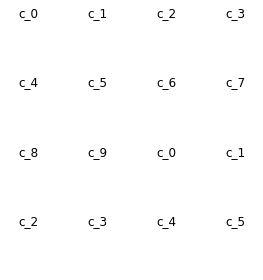

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_124\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_124\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_124\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_124\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_124\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_124\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


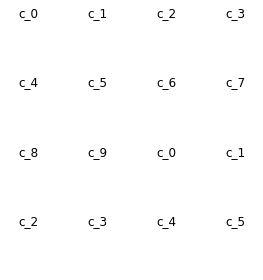

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


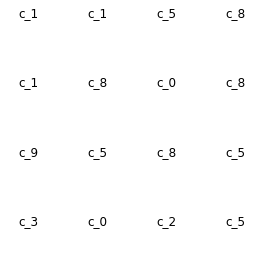

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6000%
Saved checkpoint: checkpoints\it_124\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_124\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_124\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_124\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


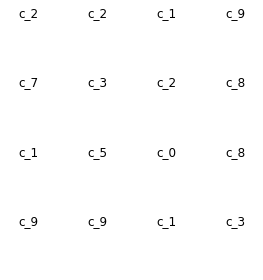

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.3030%
Saved checkpoint: checkpoints\it_124\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_124\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_124\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_124\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 125

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_125\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_125\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_125\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_125\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_125\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


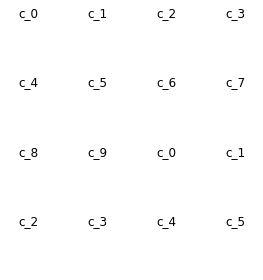

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_125\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_125\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_125\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_125\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_125\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


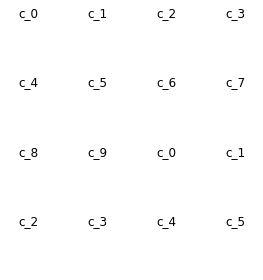

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_125\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_125\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_125\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_125\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_125\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


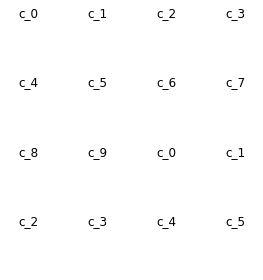

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_125\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_125\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_125\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_125\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_125\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


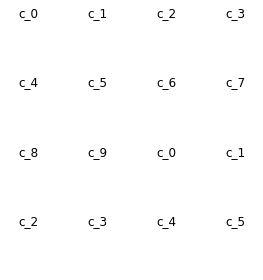

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_125\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_125\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_125\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_125\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_125\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_125\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


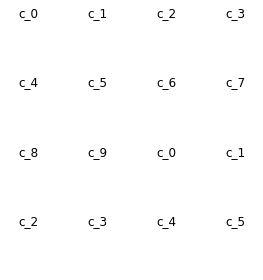

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


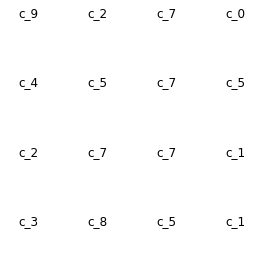

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.2000%
Saved checkpoint: checkpoints\it_125\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_125\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_125\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_125\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


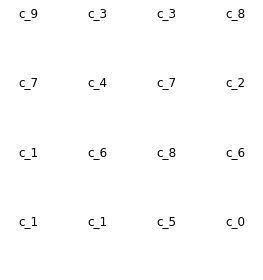

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6842%
Saved checkpoint: checkpoints\it_125\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_125\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_125\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_125\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 126

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_126\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_126\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_126\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_126\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_126\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


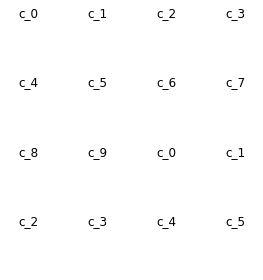

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_126\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_126\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_126\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_126\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_126\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


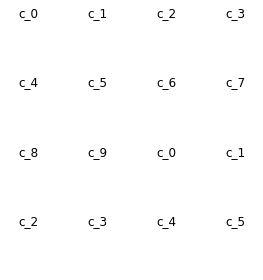

--------------------
Epoch 3/25


g_acc=0.11, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_126\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_126\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_126\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_126\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_126\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


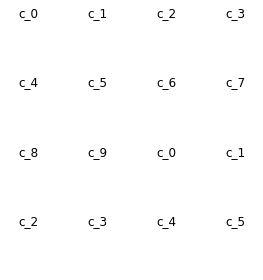

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_126\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_126\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_126\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_126\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_126\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


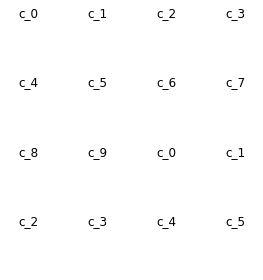

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_126\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_126\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_126\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_126\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_126\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_126\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


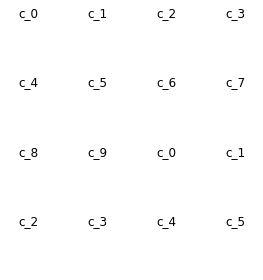

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


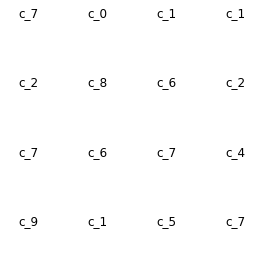

train_acc=10.2183%
accuracy of blackbox on G dataset: 10.4000%
Saved checkpoint: checkpoints\it_126\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_126\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_126\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_126\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


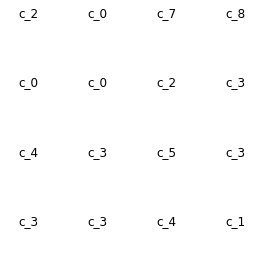

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.5000%
Saved checkpoint: checkpoints\it_126\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_126\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_126\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_126\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 127

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_127\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_127\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_127\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_127\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_127\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


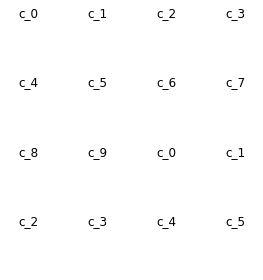

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_127\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_127\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_127\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_127\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_127\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


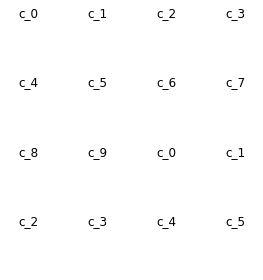

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_127\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_127\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_127\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_127\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_127\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


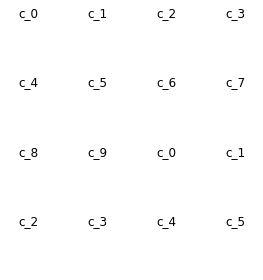

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_127\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_127\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_127\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_127\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_127\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


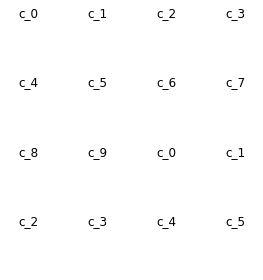

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_127\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_127\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_127\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_127\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_127\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_127\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


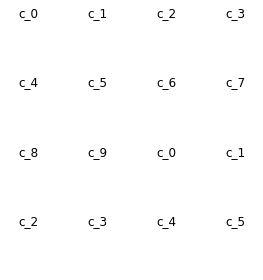

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


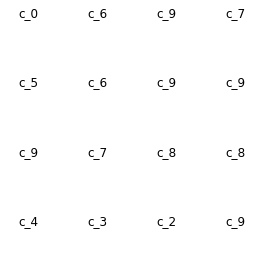

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.0000%
Saved checkpoint: checkpoints\it_127\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_127\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_127\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_127\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


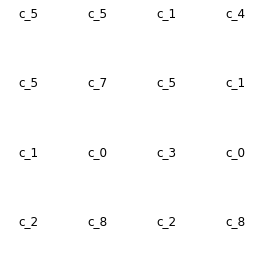

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.2308%
Saved checkpoint: checkpoints\it_127\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_127\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_127\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_127\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 128

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


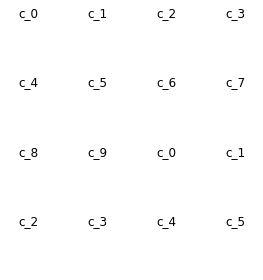

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


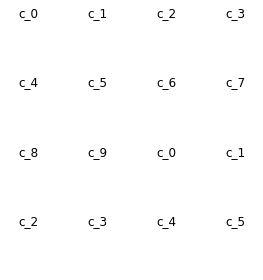

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


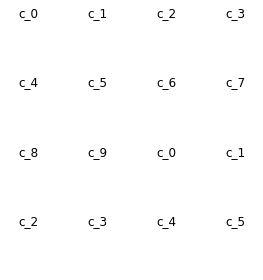

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


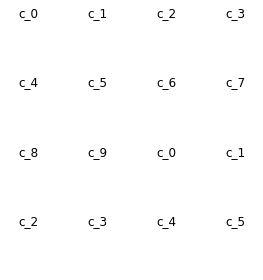

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_128\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-5


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


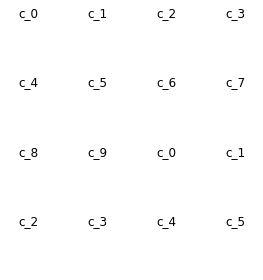

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-6


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


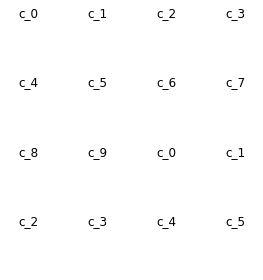

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-7


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


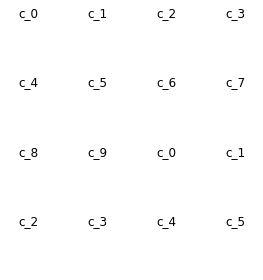

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-8


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


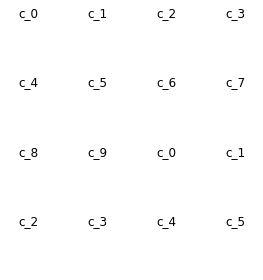

--------------------
Epoch 9/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-9


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


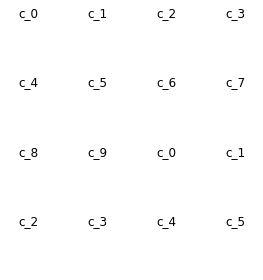

--------------------
Epoch 10/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-10
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-10
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


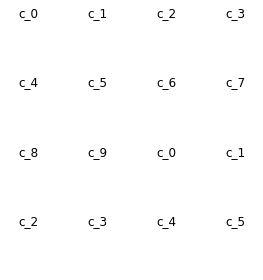

--------------------
Epoch 11/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-11
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-11
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


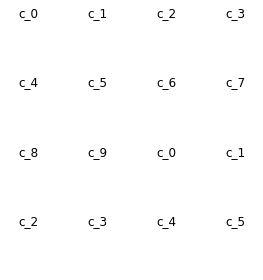

--------------------
Epoch 12/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-12
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-12
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


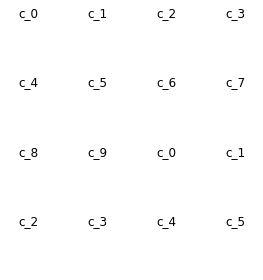

--------------------
Epoch 13/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_128\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_128\discriminator_checkpoint\ckpt-13
Saved D checkpoint: checkpoints\it_128\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_128\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_128\c_generator_checkpoint\ckpt-13
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


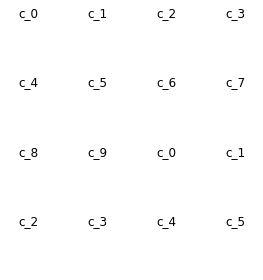

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


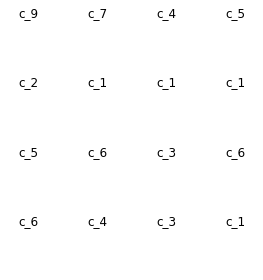

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.8000%
Saved checkpoint: checkpoints\it_128\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_128\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_128\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_128\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


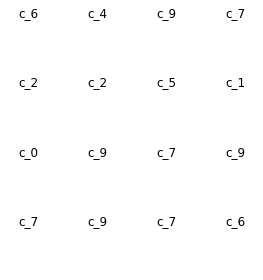

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2222%
Saved checkpoint: checkpoints\it_128\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_128\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_128\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_128\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 129

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_129\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_129\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_129\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_129\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_129\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


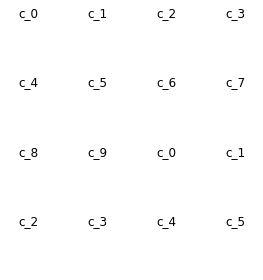

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_129\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_129\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_129\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_129\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_129\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


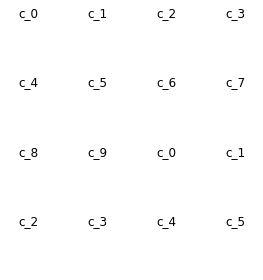

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_129\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_129\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_129\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_129\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_129\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


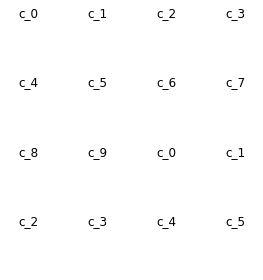

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_129\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_129\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_129\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_129\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_129\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


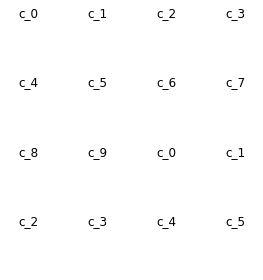

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_129\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_129\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_129\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_129\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_129\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_129\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


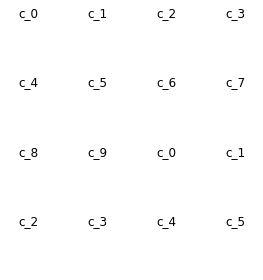

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


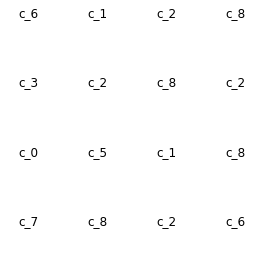

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.0000%
Saved checkpoint: checkpoints\it_129\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_129\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_129\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_129\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


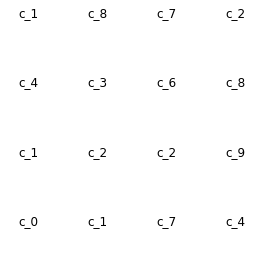

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.1739%
Saved checkpoint: checkpoints\it_129\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_129\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_129\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_129\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 130

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_130\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_130\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_130\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_130\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_130\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


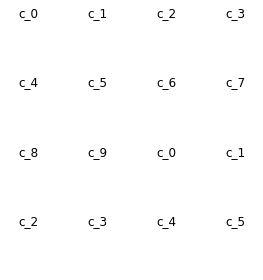

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_130\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_130\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_130\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_130\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_130\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


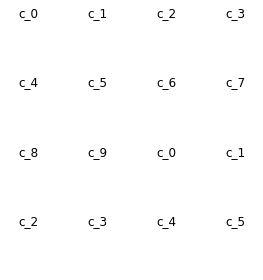

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_130\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_130\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_130\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_130\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_130\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


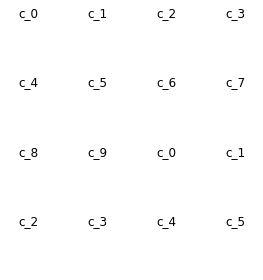

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_130\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_130\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_130\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_130\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_130\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


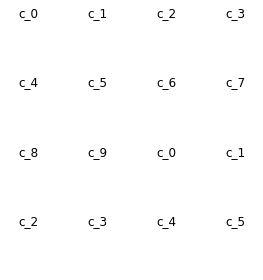

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_130\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_130\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_130\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_130\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_130\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_130\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


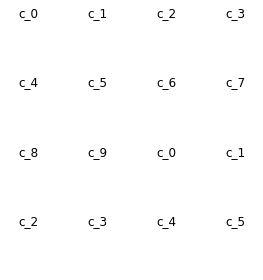

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


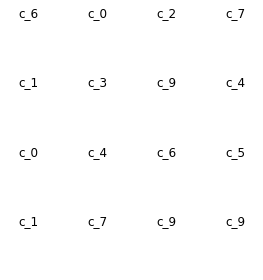

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_130\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_130\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_130\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_130\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


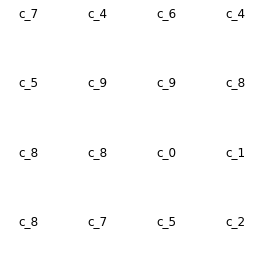

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2143%
Saved checkpoint: checkpoints\it_130\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_130\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_130\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_130\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 131

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_131\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_131\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_131\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_131\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_131\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


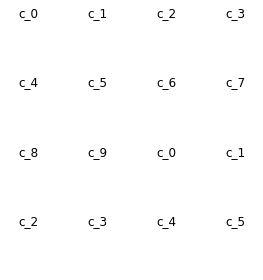

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_131\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_131\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_131\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_131\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_131\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


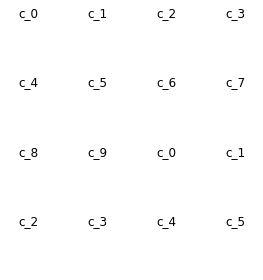

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_131\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_131\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_131\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_131\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_131\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


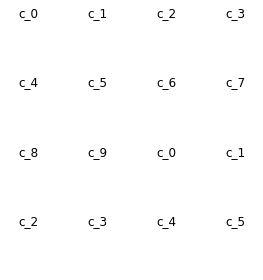

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_131\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_131\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_131\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_131\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_131\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


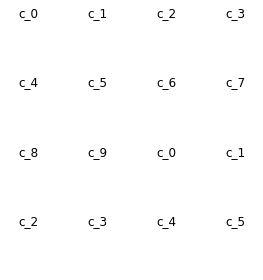

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_131\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_131\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_131\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_131\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_131\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_131\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


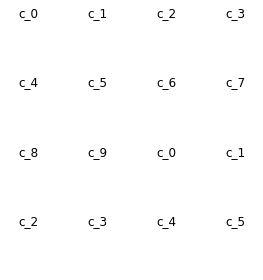

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


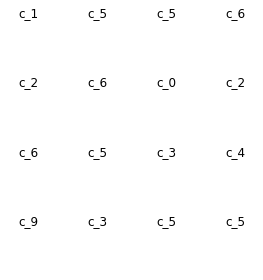

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6000%
Saved checkpoint: checkpoints\it_131\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_131\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_131\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_131\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


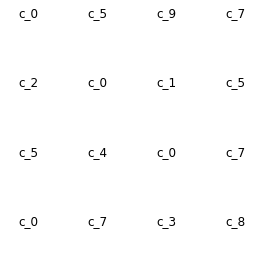

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.1212%
Saved checkpoint: checkpoints\it_131\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_131\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_131\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_131\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 132

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_132\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_132\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_132\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_132\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_132\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


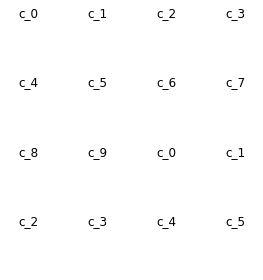

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_132\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_132\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_132\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_132\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_132\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


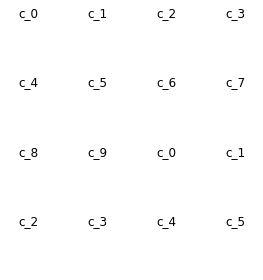

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_132\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_132\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_132\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_132\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_132\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


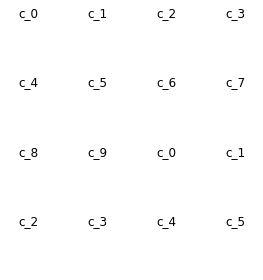

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_132\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_132\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_132\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_132\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_132\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


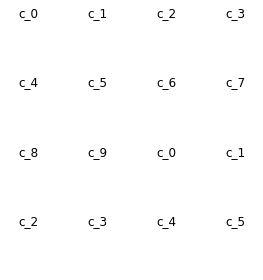

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_132\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_132\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_132\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_132\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_132\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_132\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


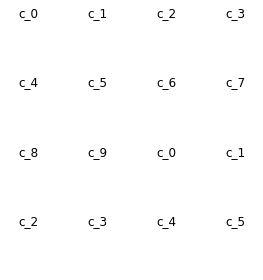

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


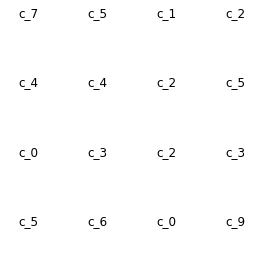

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_132\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_132\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_132\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_132\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


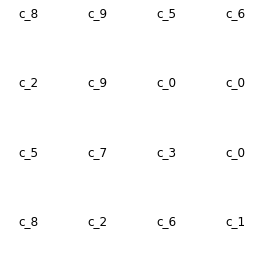

train_acc=0.0000%
accuracy of blackbox on G dataset: 9.1579%
Saved checkpoint: checkpoints\it_132\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_132\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_132\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_132\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 133

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_133\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_133\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_133\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_133\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_133\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


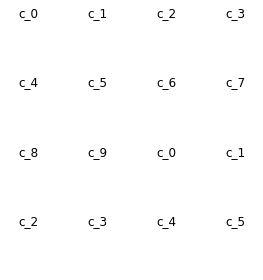

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_133\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_133\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_133\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_133\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_133\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


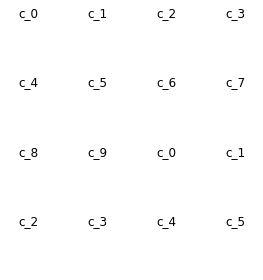

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_133\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_133\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_133\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_133\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_133\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


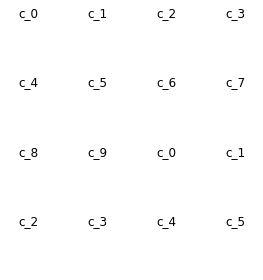

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_133\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_133\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_133\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_133\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_133\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


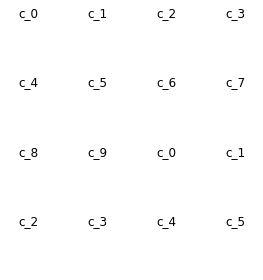

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_133\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_133\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_133\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_133\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_133\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_133\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


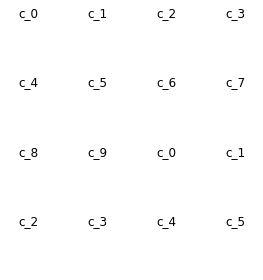

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


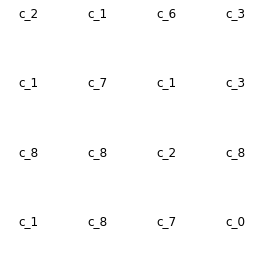

train_acc=10.2183%
accuracy of blackbox on G dataset: 9.2000%
Saved checkpoint: checkpoints\it_133\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_133\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_133\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_133\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


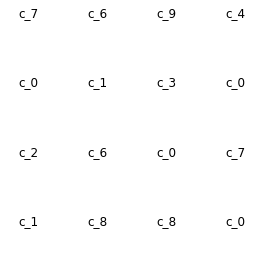

train_acc=0.0000%
accuracy of blackbox on G dataset: 5.7500%
Saved checkpoint: checkpoints\it_133\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_133\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_133\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_133\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 134

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_134\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_134\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_134\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_134\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_134\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


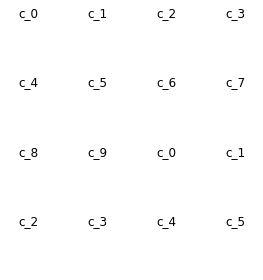

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_134\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_134\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_134\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_134\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_134\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


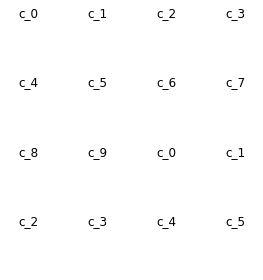

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_134\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_134\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_134\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_134\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_134\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


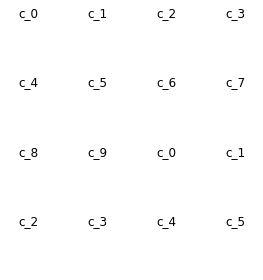

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_134\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_134\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_134\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_134\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_134\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


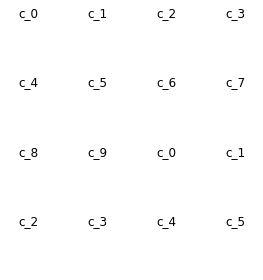

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_134\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_134\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_134\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_134\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_134\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_134\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


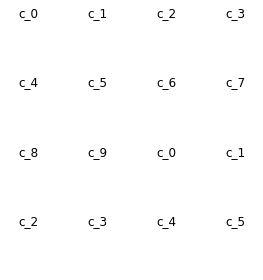

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


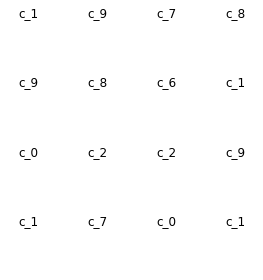

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_134\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_134\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_134\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_134\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


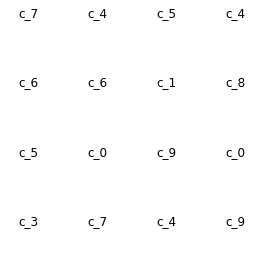

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.1538%
Saved checkpoint: checkpoints\it_134\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_134\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_134\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_134\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 135

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_135\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_135\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_135\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_135\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_135\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


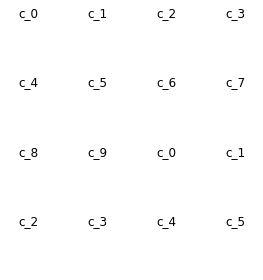

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_135\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_135\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_135\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_135\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_135\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


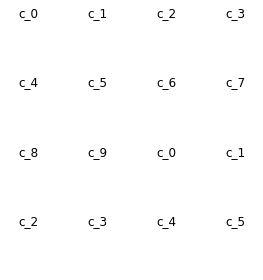

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_135\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_135\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_135\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_135\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_135\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


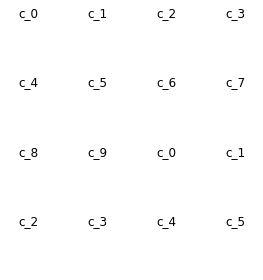

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_135\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_135\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_135\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_135\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_135\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


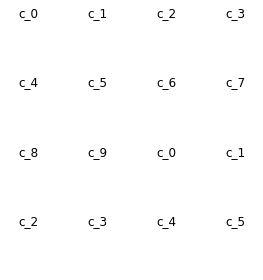

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_135\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_135\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_135\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_135\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_135\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_135\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


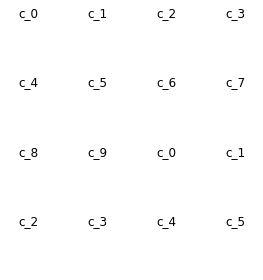

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


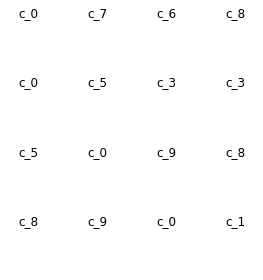

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.8000%
Saved checkpoint: checkpoints\it_135\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_135\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_135\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_135\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


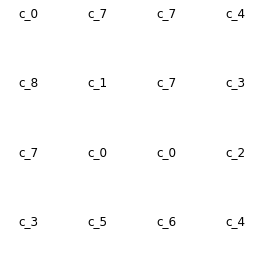

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.8889%
Saved checkpoint: checkpoints\it_135\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_135\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_135\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_135\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 136

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_136\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_136\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_136\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_136\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_136\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


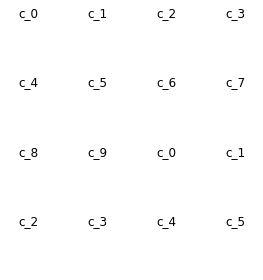

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_136\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_136\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_136\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_136\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_136\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


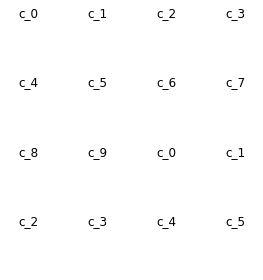

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_136\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_136\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_136\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_136\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_136\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


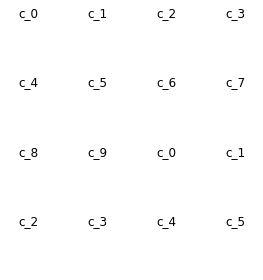

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_136\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_136\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_136\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_136\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_136\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


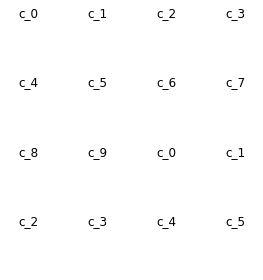

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_136\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_136\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_136\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_136\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_136\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_136\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


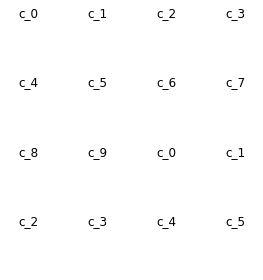

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


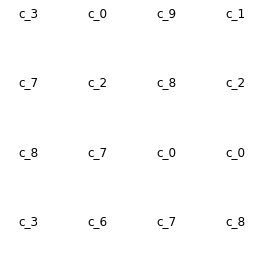

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_136\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_136\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_136\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_136\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


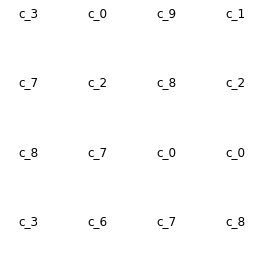

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.2174%
Saved checkpoint: checkpoints\it_136\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_136\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_136\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_136\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 137

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_137\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_137\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_137\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_137\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_137\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


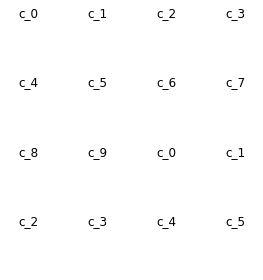

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_137\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_137\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_137\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_137\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_137\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


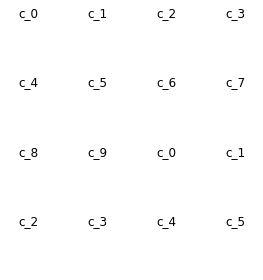

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_137\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_137\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_137\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_137\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_137\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


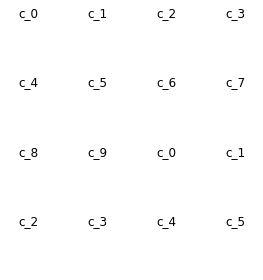

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_137\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_137\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_137\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_137\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_137\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


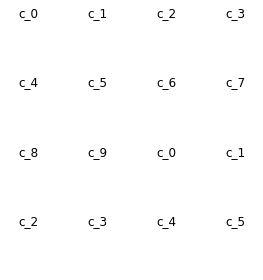

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_137\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_137\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_137\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_137\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_137\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_137\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


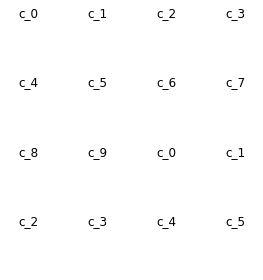

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


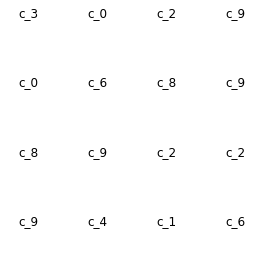

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2000%
Saved checkpoint: checkpoints\it_137\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_137\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_137\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_137\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


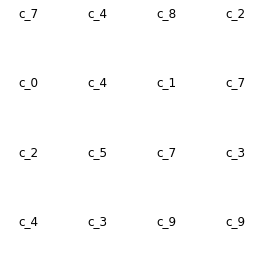

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.3929%
Saved checkpoint: checkpoints\it_137\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_137\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_137\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_137\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 138

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_138\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_138\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_138\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_138\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_138\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


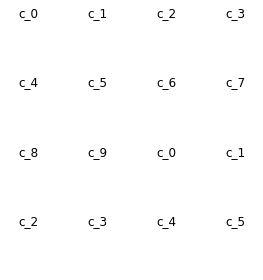

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_138\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_138\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_138\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_138\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_138\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


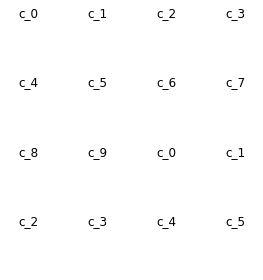

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_138\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_138\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_138\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_138\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_138\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


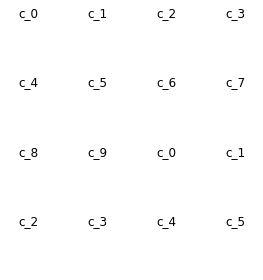

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_138\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_138\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_138\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_138\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_138\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


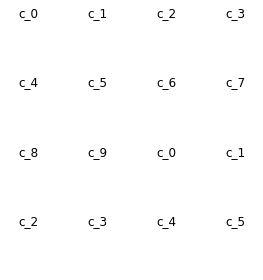

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_138\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_138\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_138\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_138\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_138\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_138\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


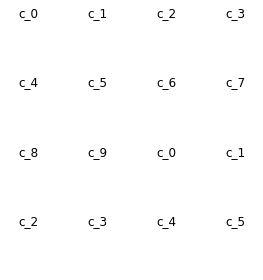

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


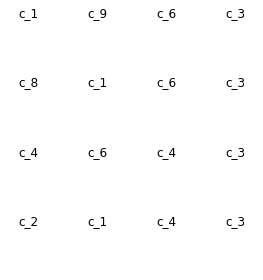

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.2000%
Saved checkpoint: checkpoints\it_138\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_138\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_138\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_138\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


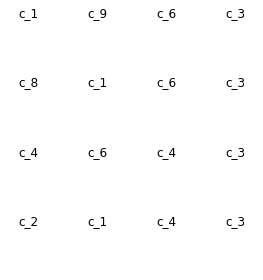

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6667%
Saved checkpoint: checkpoints\it_138\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_138\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_138\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_138\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 139

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_139\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_139\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_139\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


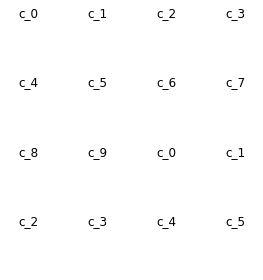

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_139\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_139\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_139\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


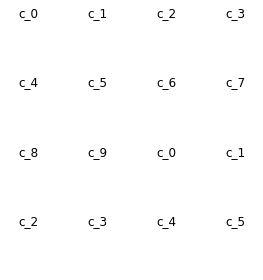

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_139\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_139\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_139\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


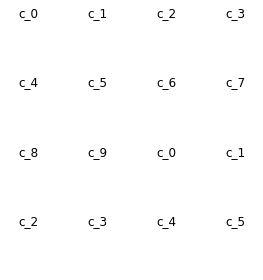

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_139\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_139\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_139\c_generator_checkpoint\ckpt-4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


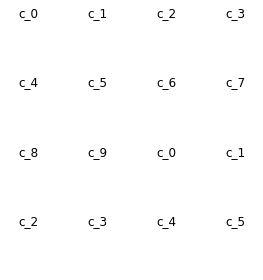

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_139\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_139\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_139\c_generator_checkpoint\ckpt-5
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


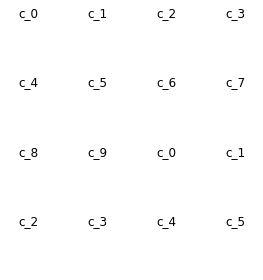

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_139\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_139\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_139\c_generator_checkpoint\ckpt-6
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


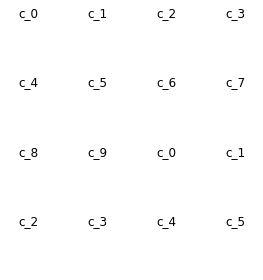

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_139\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_139\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_139\c_generator_checkpoint\ckpt-7
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


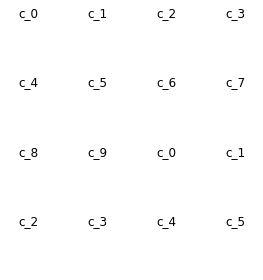

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_139\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_139\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_139\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_139\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_139\c_generator_checkpoint\ckpt-8
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


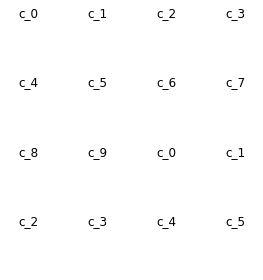

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


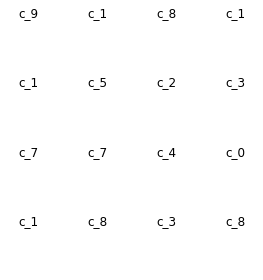

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6000%
Saved checkpoint: checkpoints\it_139\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_139\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_139\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_139\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


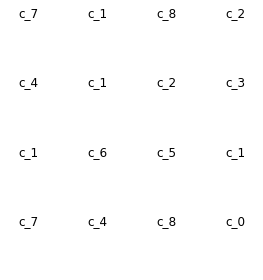

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6579%
Saved checkpoint: checkpoints\it_139\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_139\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_139\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_139\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 140

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_140\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_140\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_140\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_140\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_140\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


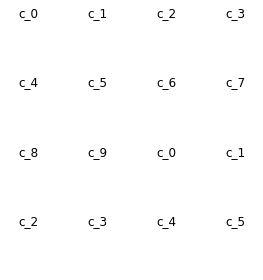

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_140\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_140\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_140\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_140\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_140\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


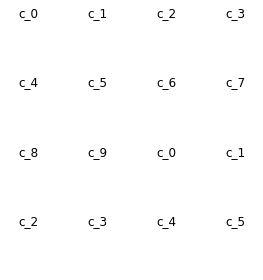

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_140\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_140\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_140\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_140\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_140\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


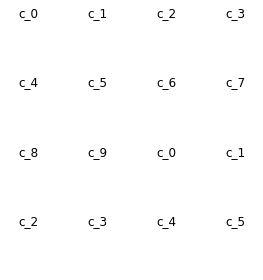

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_140\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_140\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_140\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_140\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_140\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


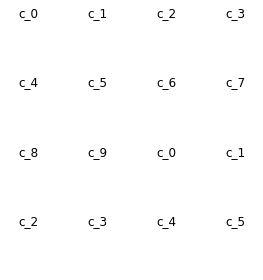

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_140\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_140\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_140\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_140\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_140\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_140\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


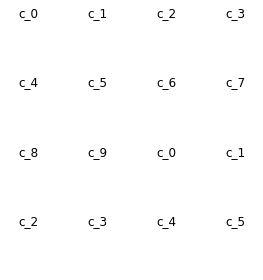

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


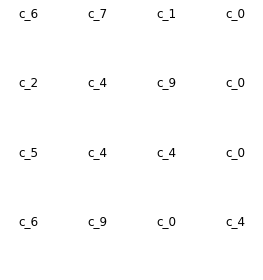

train_acc=10.2183%
accuracy of blackbox on G dataset: 10.2000%
Saved checkpoint: checkpoints\it_140\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_140\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_140\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_140\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


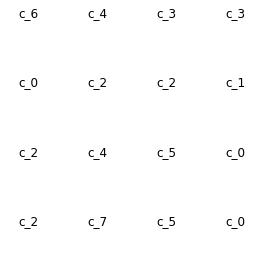

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.3750%
Saved checkpoint: checkpoints\it_140\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_140\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_140\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_140\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 141

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_141\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_141\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_141\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_141\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_141\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


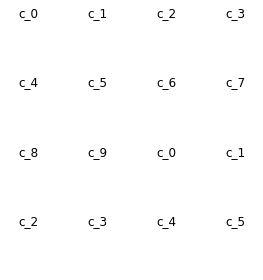

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_141\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_141\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_141\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_141\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_141\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


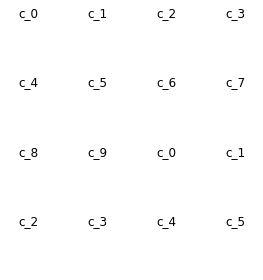

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_141\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_141\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_141\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_141\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_141\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


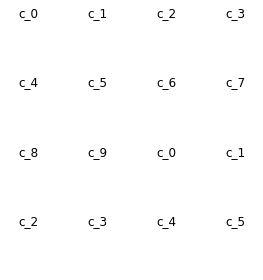

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_141\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_141\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_141\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_141\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_141\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


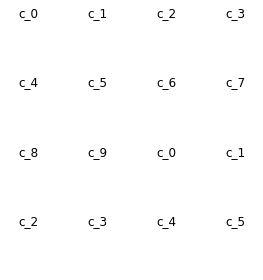

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_141\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_141\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_141\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_141\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_141\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_141\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


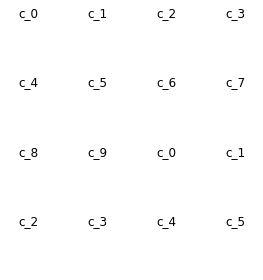

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


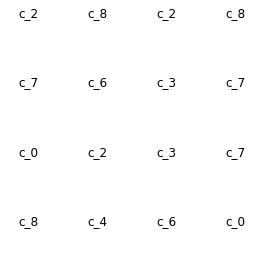

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.4000%
Saved checkpoint: checkpoints\it_141\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_141\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_141\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_141\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


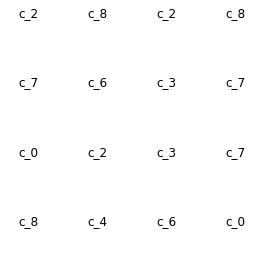

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.5385%
Saved checkpoint: checkpoints\it_141\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_141\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_141\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_141\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 142

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_142\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_142\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_142\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_142\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_142\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


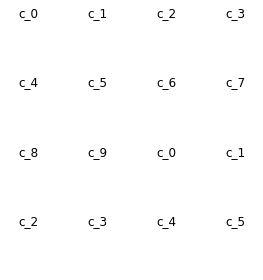

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_142\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_142\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_142\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_142\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_142\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


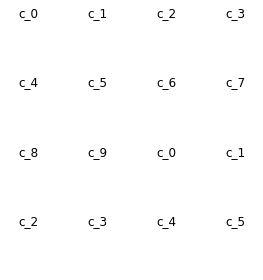

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_142\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_142\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_142\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_142\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_142\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


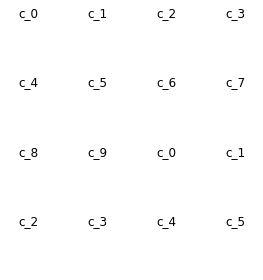

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_142\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_142\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_142\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_142\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_142\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


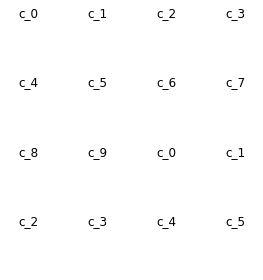

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_142\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_142\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_142\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_142\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_142\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_142\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


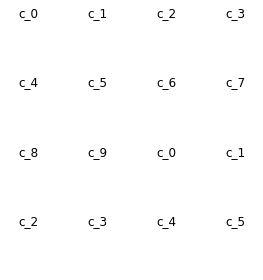

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


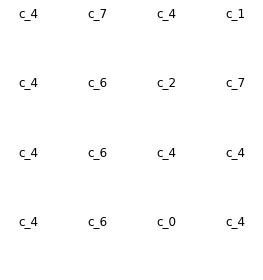

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 7.6000%
Saved checkpoint: checkpoints\it_142\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_142\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_142\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_142\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


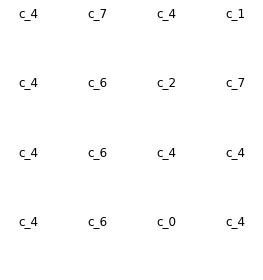

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.5556%
Saved checkpoint: checkpoints\it_142\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_142\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_142\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_142\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 143

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_143\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_143\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_143\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_143\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_143\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


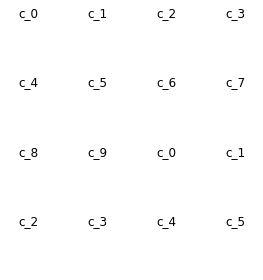

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_143\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_143\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_143\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_143\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_143\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


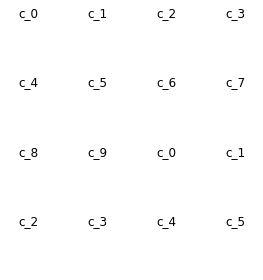

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_143\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_143\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_143\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_143\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_143\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


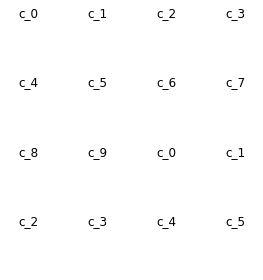

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_143\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_143\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_143\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_143\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_143\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


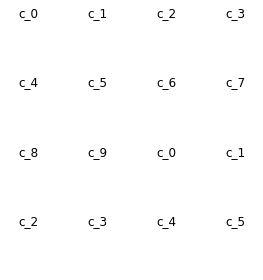

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_143\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_143\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_143\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_143\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_143\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_143\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


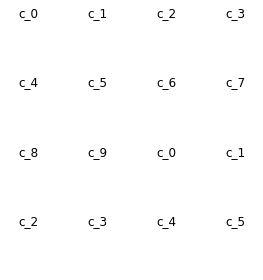

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


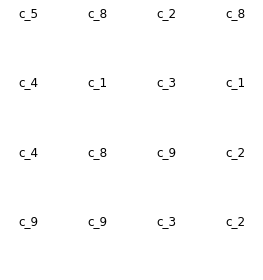

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.6000%
Saved checkpoint: checkpoints\it_143\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_143\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_143\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_143\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


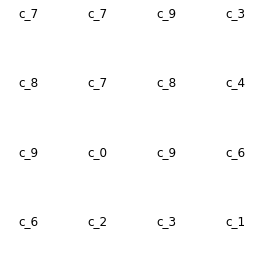

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.4348%
Saved checkpoint: checkpoints\it_143\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_143\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_143\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_143\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 144

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_144\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_144\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_144\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


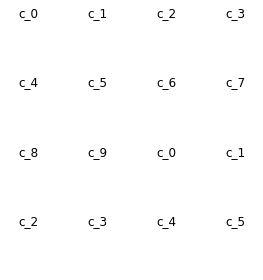

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_144\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_144\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_144\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


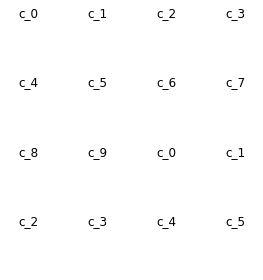

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_144\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_144\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_144\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


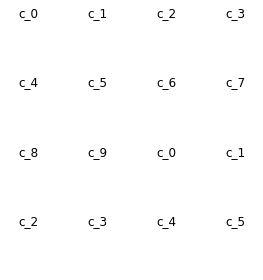

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_144\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_144\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_144\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


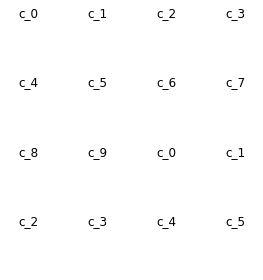

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_144\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_144\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_144\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_144\c_generator_checkpoint\ckpt-5


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


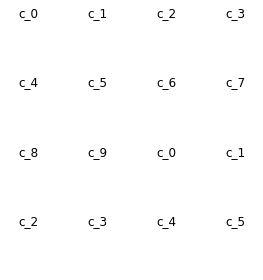

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_144\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_144\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_144\c_generator_checkpoint\ckpt-6
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


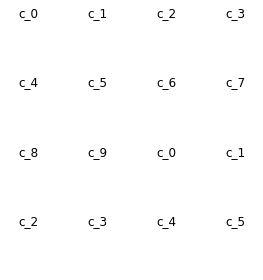

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_144\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_144\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_144\c_generator_checkpoint\ckpt-7
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


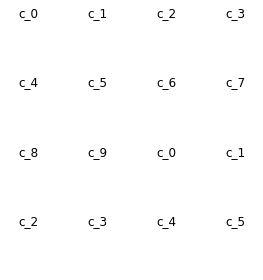

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_144\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_144\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_144\c_generator_checkpoint\ckpt-8
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


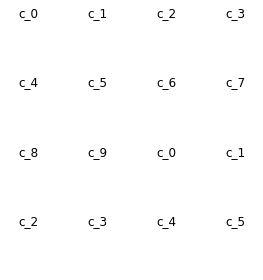

--------------------
Epoch 9/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_144\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_144\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_144\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_144\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_144\c_generator_checkpoint\ckpt-9
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


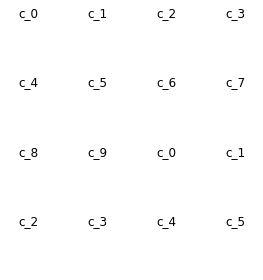

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


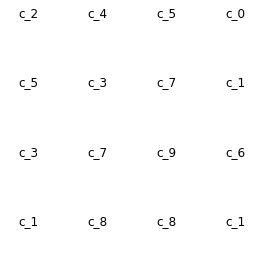

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.2000%
Saved checkpoint: checkpoints\it_144\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_144\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_144\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_144\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


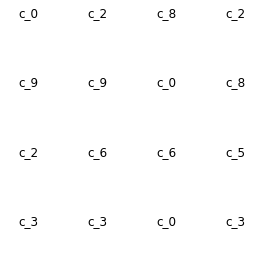

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.3929%
Saved checkpoint: checkpoints\it_144\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_144\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_144\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_144\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 145

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_145\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_145\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_145\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_145\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_145\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


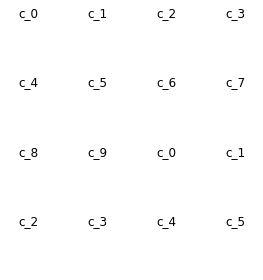

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_145\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_145\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_145\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_145\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_145\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


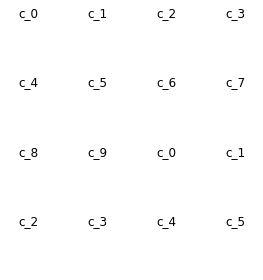

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_145\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_145\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_145\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_145\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_145\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


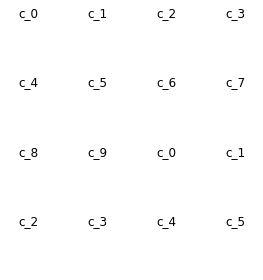

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_145\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_145\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_145\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_145\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_145\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


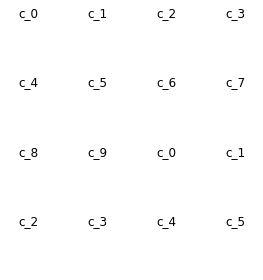

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_145\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_145\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_145\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_145\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_145\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_145\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


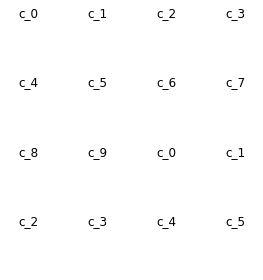

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


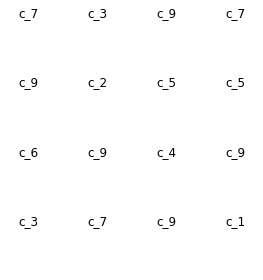

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6000%
Saved checkpoint: checkpoints\it_145\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_145\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_145\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_145\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


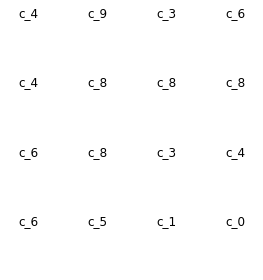

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.4242%
Saved checkpoint: checkpoints\it_145\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_145\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_145\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_145\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 146

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_146\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_146\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_146\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


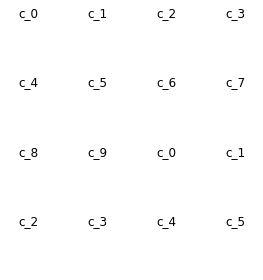

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_146\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_146\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_146\c_generator_checkpoint\ckpt-2


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


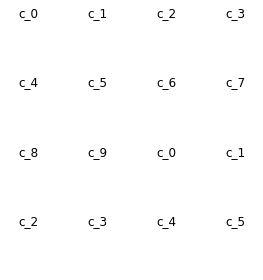

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_146\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_146\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_146\c_generator_checkpoint\ckpt-3
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


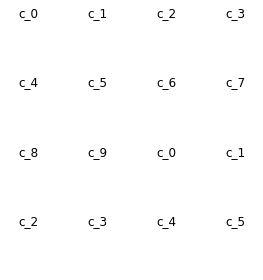

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_146\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_146\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_146\c_generator_checkpoint\ckpt-4
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


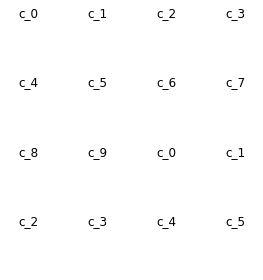

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_146\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_146\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_146\c_generator_checkpoint\ckpt-5
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


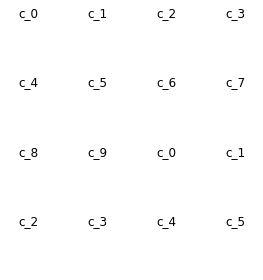

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_146\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_146\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_146\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_146\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_146\c_generator_checkpoint\ckpt-6
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


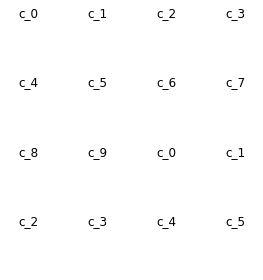

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


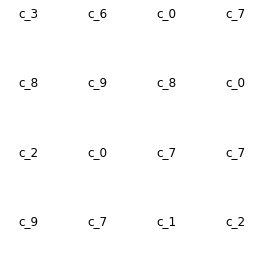

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.2000%
Saved checkpoint: checkpoints\it_146\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_146\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_146\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_146\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


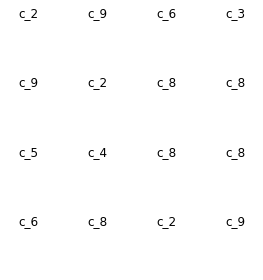

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.6579%
Saved checkpoint: checkpoints\it_146\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_146\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_146\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_146\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 147

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_147\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_147\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_147\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


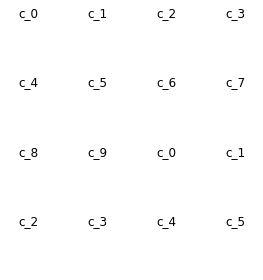

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_147\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_147\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_147\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


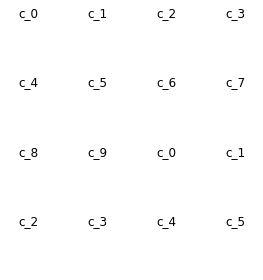

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_147\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_147\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_147\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


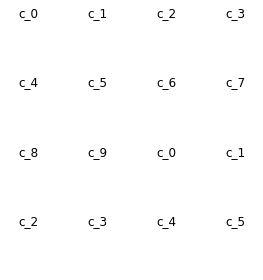

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_147\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_147\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_147\c_generator_checkpoint\ckpt-4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


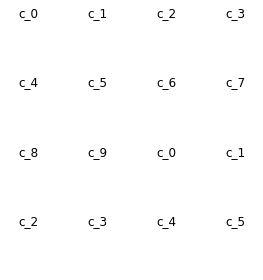

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_147\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_147\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_147\c_generator_checkpoint\ckpt-5
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


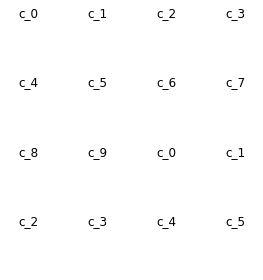

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_147\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_147\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_147\c_generator_checkpoint\ckpt-6
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


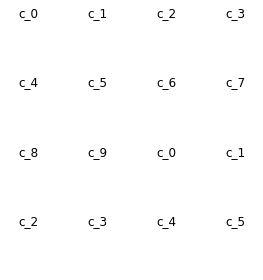

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_147\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_147\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_147\c_generator_checkpoint\ckpt-7
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


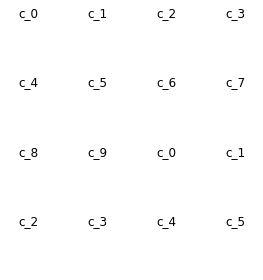

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_147\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_147\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_147\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_147\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_147\c_generator_checkpoint\ckpt-8
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


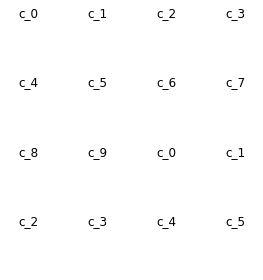

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


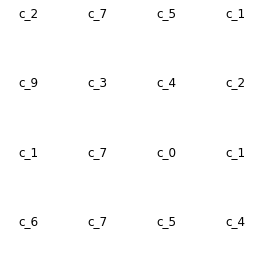

train_acc=10.2183%
accuracy of blackbox on G dataset: 11.0000%
Saved checkpoint: checkpoints\it_147\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_147\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_147\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_147\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


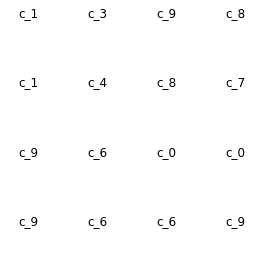

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.8750%
Saved checkpoint: checkpoints\it_147\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_147\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_147\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_147\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 148

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_148\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_148\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_148\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_148\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_148\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


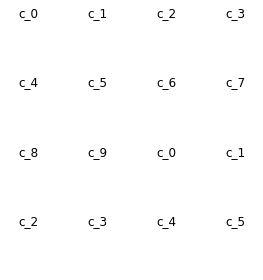

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_148\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_148\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_148\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_148\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_148\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


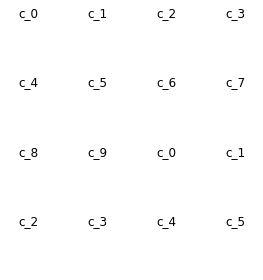

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_148\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_148\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_148\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_148\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_148\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


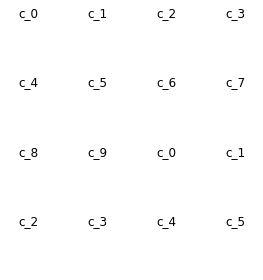

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_148\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_148\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_148\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_148\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_148\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


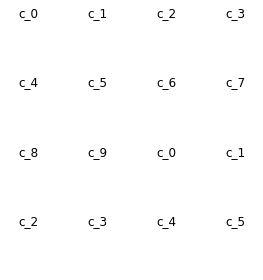

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_148\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_148\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_148\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_148\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_148\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_148\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


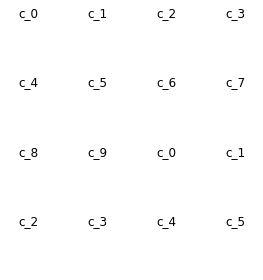

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


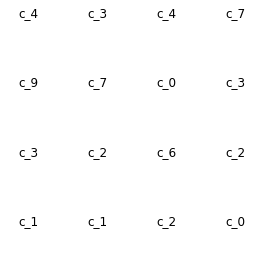

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0000%
Saved checkpoint: checkpoints\it_148\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_148\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_148\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_148\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


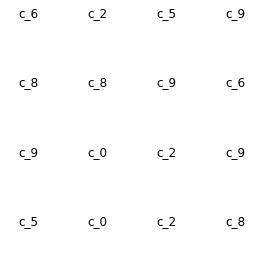

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.3077%
Saved checkpoint: checkpoints\it_148\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_148\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_148\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_148\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 149

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_149\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_149\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_149\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_149\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_149\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


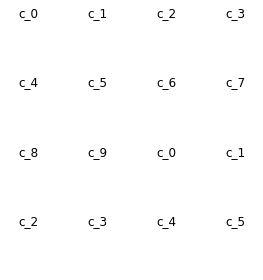

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_149\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_149\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_149\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_149\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_149\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


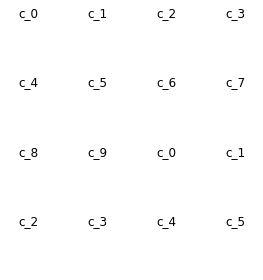

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_149\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_149\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_149\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_149\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_149\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


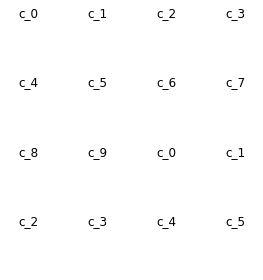

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_149\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_149\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_149\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_149\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_149\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


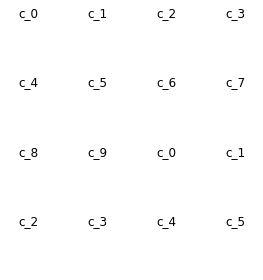

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_149\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_149\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_149\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_149\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_149\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_149\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


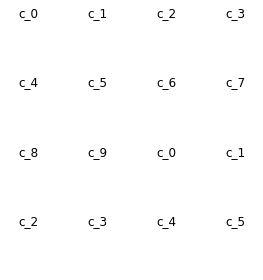

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


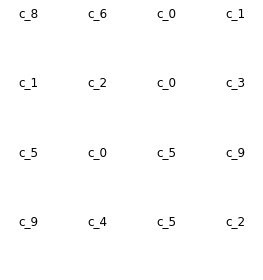

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.6000%
Saved checkpoint: checkpoints\it_149\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_149\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_149\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_149\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


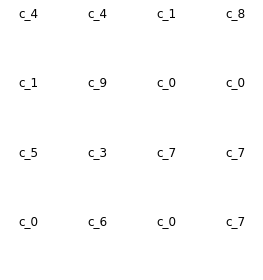

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.9444%
Saved checkpoint: checkpoints\it_149\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_149\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_149\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_149\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 150

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_150\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_150\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_150\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


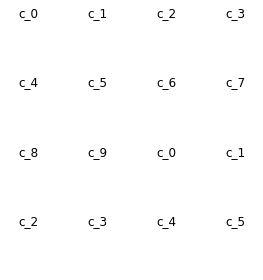

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_150\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_150\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_150\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


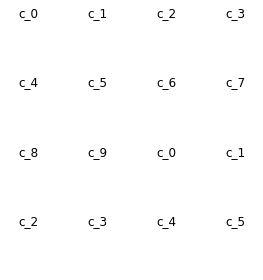

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_150\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_150\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_150\c_generator_checkpoint\ckpt-3


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


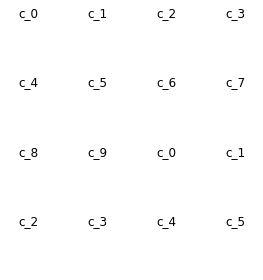

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_150\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_150\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_150\c_generator_checkpoint\ckpt-4
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


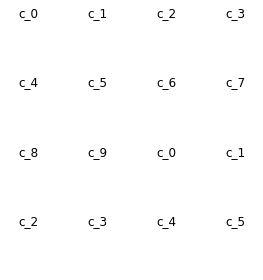

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_150\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_150\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_150\c_generator_checkpoint\ckpt-5
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


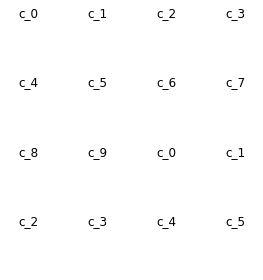

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_150\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_150\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_150\c_generator_checkpoint\ckpt-6
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


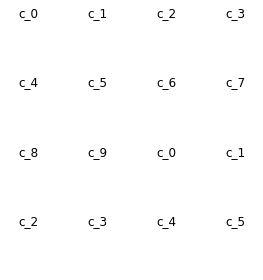

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_150\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_150\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_150\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_150\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_150\c_generator_checkpoint\ckpt-7
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


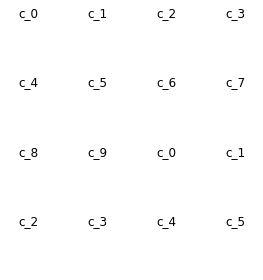

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


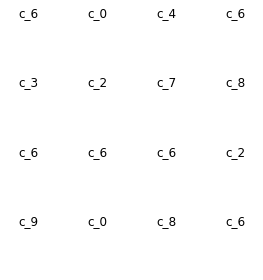

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0000%
Saved checkpoint: checkpoints\it_150\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_150\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_150\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_150\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


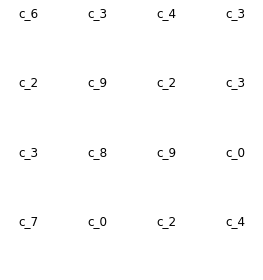

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.9565%
Saved checkpoint: checkpoints\it_150\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_150\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_150\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_150\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 151

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_151\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_151\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_151\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_151\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_151\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


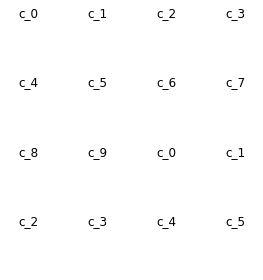

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_151\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_151\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_151\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_151\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_151\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


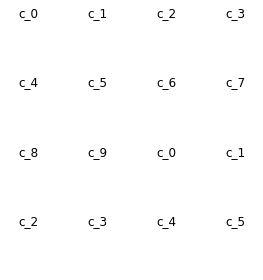

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_151\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_151\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_151\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_151\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_151\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


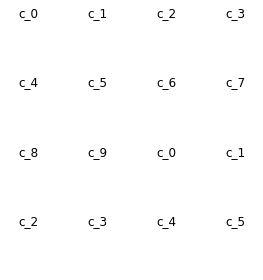

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_151\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_151\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_151\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_151\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_151\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


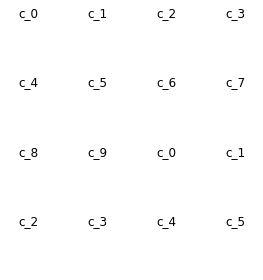

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_151\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_151\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_151\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_151\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_151\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_151\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


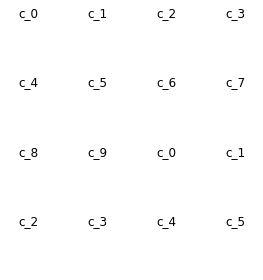

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


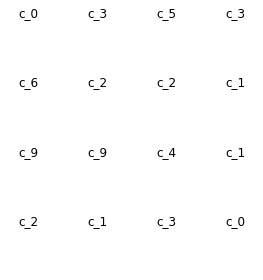

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 9.2000%
Saved checkpoint: checkpoints\it_151\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_151\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_151\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_151\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


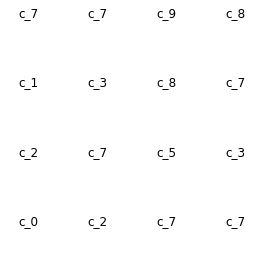

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.1786%
Saved checkpoint: checkpoints\it_151\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_151\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_151\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_151\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 152

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_152\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_152\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_152\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_152\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_152\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


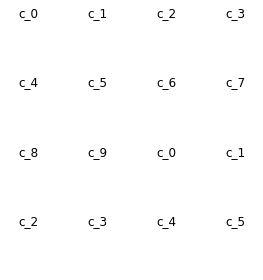

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_152\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_152\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_152\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_152\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_152\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


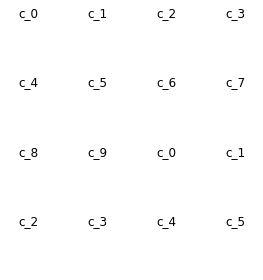

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_152\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_152\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_152\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_152\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_152\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


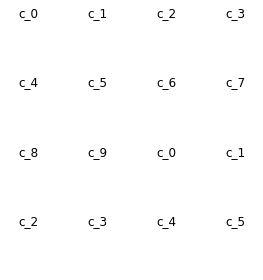

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_152\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_152\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_152\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_152\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_152\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


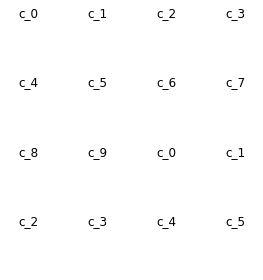

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_152\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_152\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_152\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_152\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_152\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_152\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


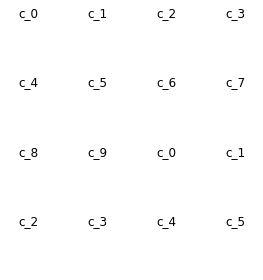

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


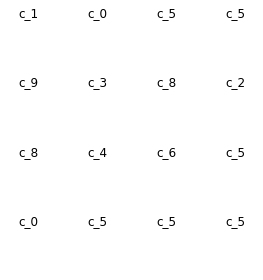

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.4000%
Saved checkpoint: checkpoints\it_152\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_152\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_152\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_152\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


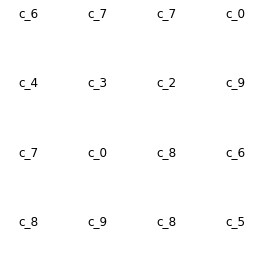

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.5152%
Saved checkpoint: checkpoints\it_152\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_152\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_152\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_152\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 153

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_153\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_153\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_153\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_153\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_153\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


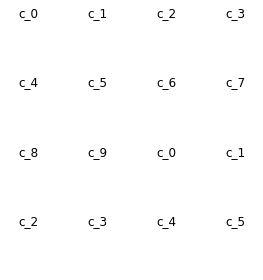

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_153\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_153\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_153\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_153\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_153\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


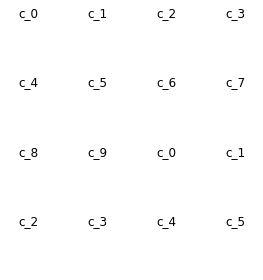

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_153\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_153\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_153\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_153\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_153\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


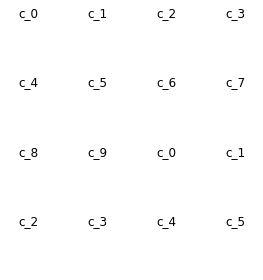

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_153\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_153\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_153\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_153\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_153\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


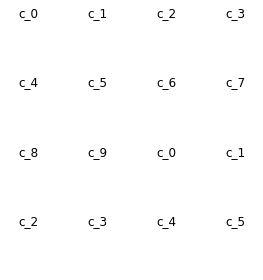

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_153\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_153\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_153\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_153\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_153\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_153\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


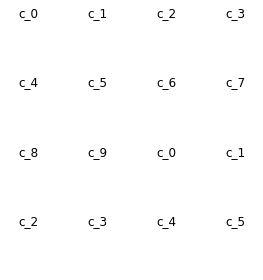

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


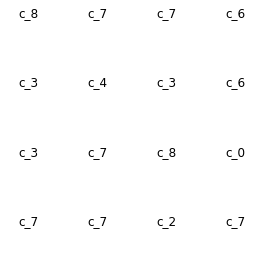

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 11.2000%
Saved checkpoint: checkpoints\it_153\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_153\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_153\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_153\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


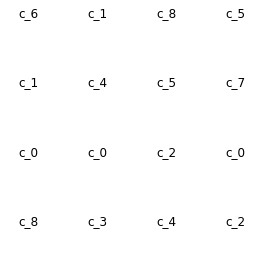

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8684%
Saved checkpoint: checkpoints\it_153\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_153\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_153\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_153\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 154

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_154\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_154\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_154\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_154\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_154\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


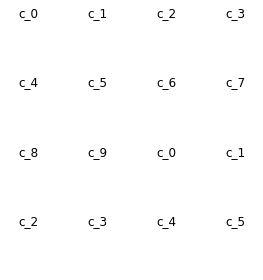

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_154\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_154\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_154\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_154\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_154\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


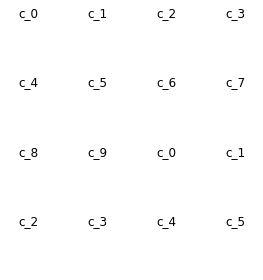

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_154\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_154\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_154\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_154\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_154\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


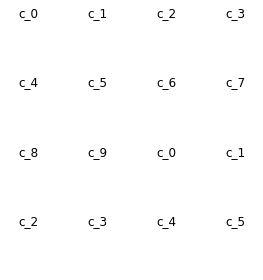

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_154\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_154\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_154\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_154\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_154\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


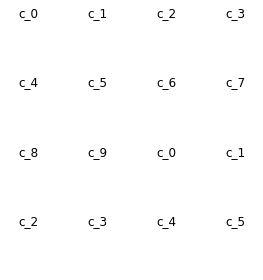

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_154\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_154\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_154\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_154\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_154\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_154\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


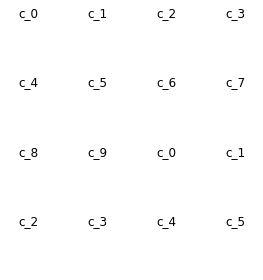

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


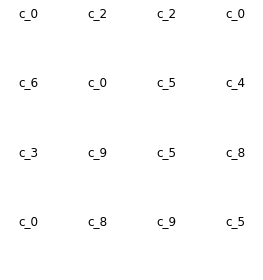

train_acc=10.2183%
accuracy of blackbox on G dataset: 8.6000%
Saved checkpoint: checkpoints\it_154\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_154\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_154\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_154\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


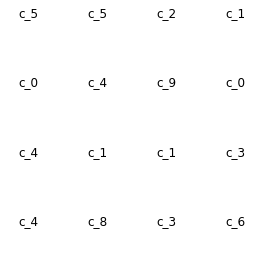

train_acc=0.0000%
accuracy of blackbox on G dataset: 5.3750%
Saved checkpoint: checkpoints\it_154\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_154\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_154\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_154\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 155

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_155\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_155\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_155\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_155\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_155\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


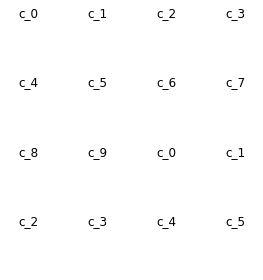

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_155\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_155\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_155\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_155\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_155\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


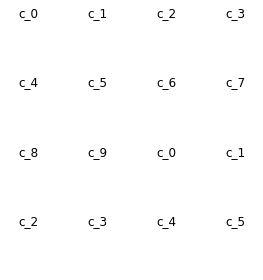

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_155\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_155\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_155\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_155\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_155\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


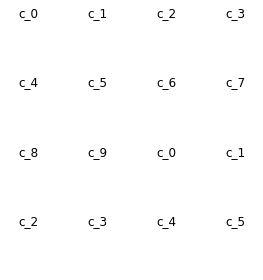

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_155\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_155\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_155\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_155\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_155\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


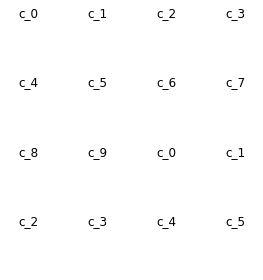

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_155\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_155\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_155\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_155\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_155\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_155\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


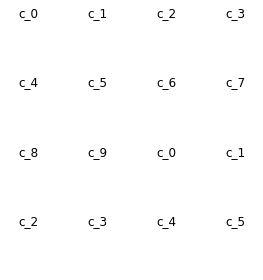

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


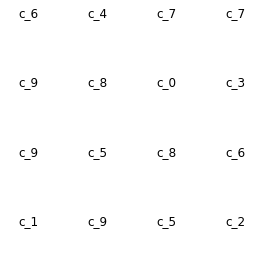

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.2000%
Saved checkpoint: checkpoints\it_155\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_155\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_155\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_155\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


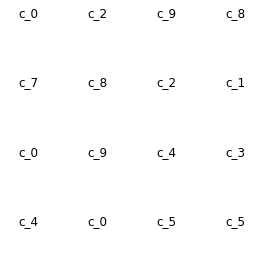

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.4615%
Saved checkpoint: checkpoints\it_155\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_155\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_155\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_155\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 156

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_156\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_156\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_156\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_156\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_156\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


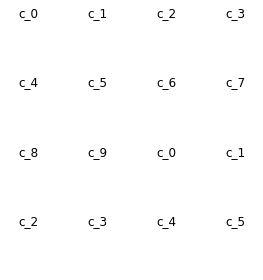

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_156\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_156\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_156\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_156\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_156\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


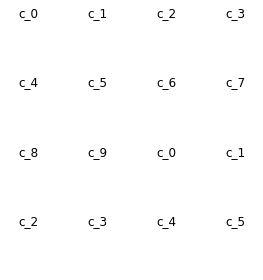

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_156\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_156\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_156\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_156\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_156\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


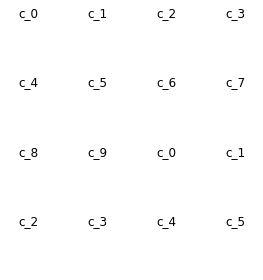

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_156\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_156\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_156\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_156\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_156\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


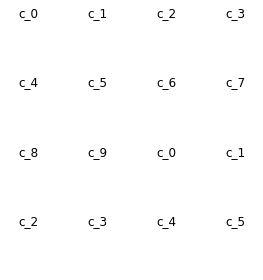

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_156\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_156\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_156\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_156\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_156\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_156\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


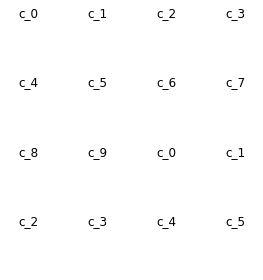

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


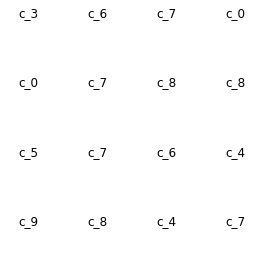

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 7.8000%
Saved checkpoint: checkpoints\it_156\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_156\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_156\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_156\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


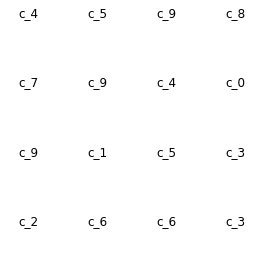

train_acc=0.0000%
accuracy of blackbox on G dataset: 6.8333%
Saved checkpoint: checkpoints\it_156\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_156\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_156\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_156\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 157

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_157\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_157\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_157\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_157\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_157\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


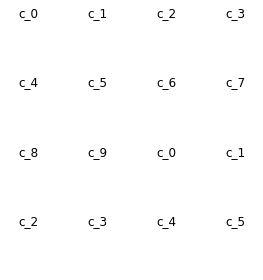

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_157\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_157\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_157\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_157\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_157\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


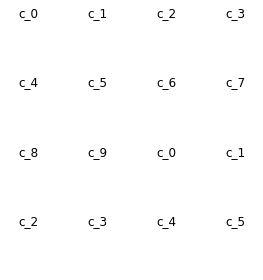

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_157\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_157\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_157\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_157\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_157\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


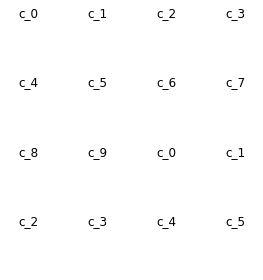

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_157\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_157\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_157\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_157\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_157\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


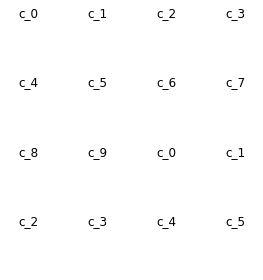

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_157\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_157\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_157\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_157\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_157\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_157\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


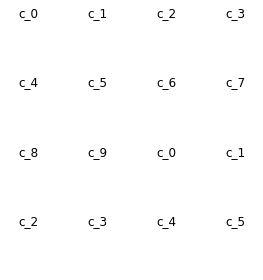

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


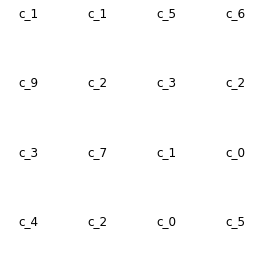

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.6000%
Saved checkpoint: checkpoints\it_157\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_157\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_157\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_157\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


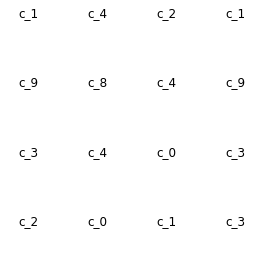

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.6522%
Saved checkpoint: checkpoints\it_157\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_157\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_157\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_157\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 158

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_158\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_158\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_158\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_158\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_158\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


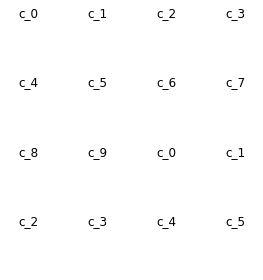

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_158\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_158\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_158\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_158\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_158\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


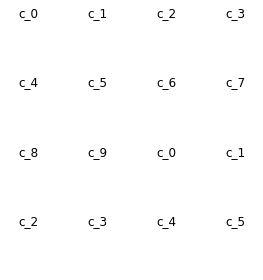

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_158\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_158\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_158\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_158\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_158\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


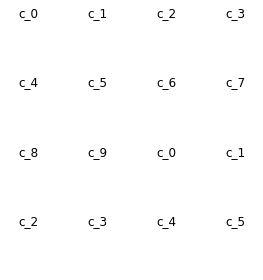

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_158\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_158\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_158\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_158\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_158\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


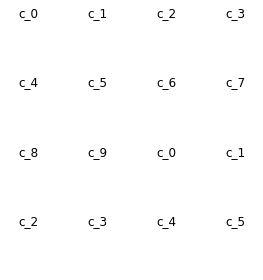

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_158\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_158\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_158\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_158\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_158\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_158\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


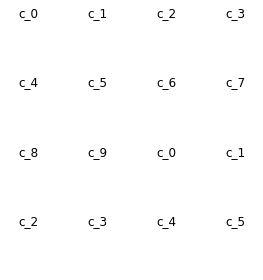

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


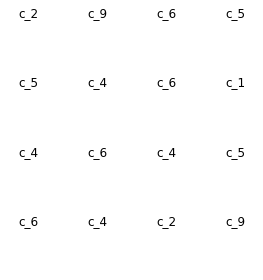

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 10.4000%
Saved checkpoint: checkpoints\it_158\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_158\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_158\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_158\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


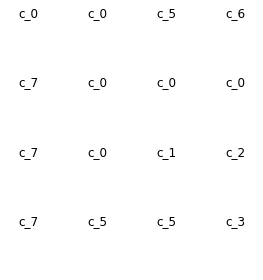

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.1429%
Saved checkpoint: checkpoints\it_158\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_158\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_158\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_158\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 159

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_159\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_159\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_159\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_159\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_159\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


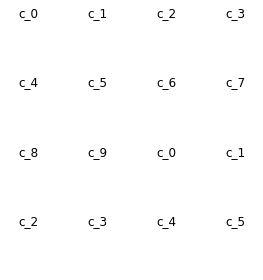

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_159\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_159\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_159\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_159\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_159\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


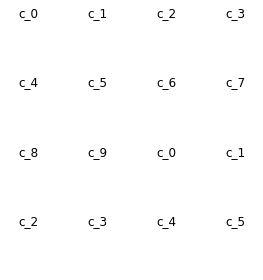

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_159\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_159\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_159\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_159\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_159\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


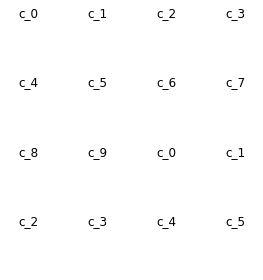

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_159\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_159\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_159\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_159\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_159\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


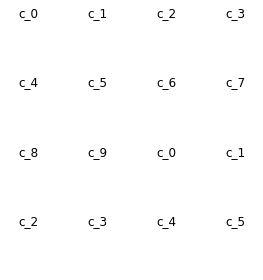

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_159\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_159\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_159\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_159\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_159\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_159\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


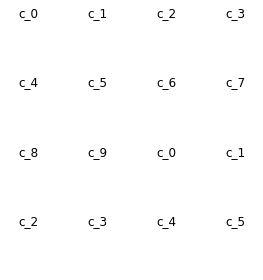

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


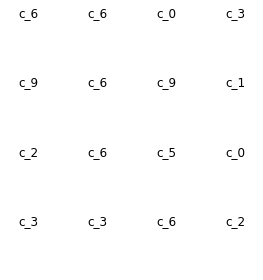

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.4000%
Saved checkpoint: checkpoints\it_159\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_159\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_159\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_159\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


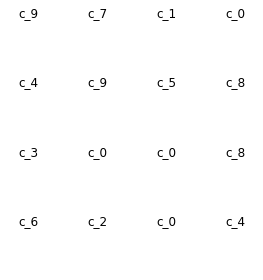

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.1818%
Saved checkpoint: checkpoints\it_159\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_159\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_159\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_159\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 160

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_160\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_160\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_160\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_160\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_160\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


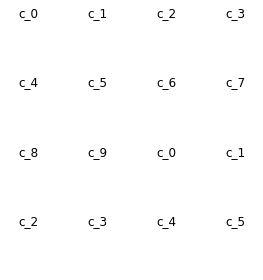

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_160\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_160\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_160\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_160\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_160\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


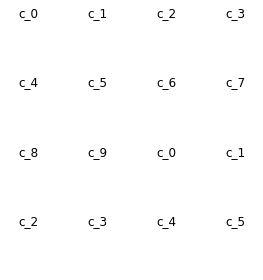

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_160\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_160\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_160\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_160\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_160\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


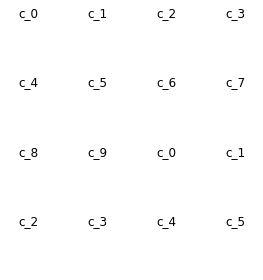

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_160\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_160\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_160\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_160\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_160\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


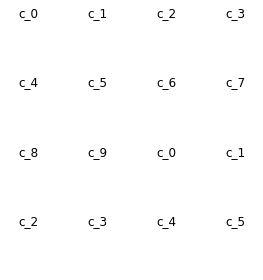

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_160\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_160\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_160\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_160\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_160\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_160\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


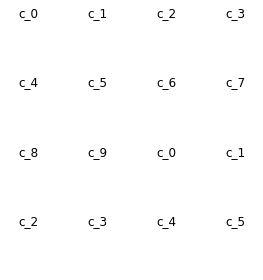

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


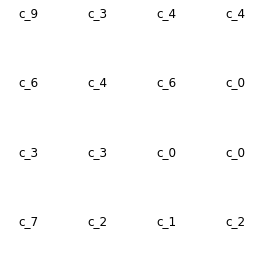

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 12.8000%
Saved checkpoint: checkpoints\it_160\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_160\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_160\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_160\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


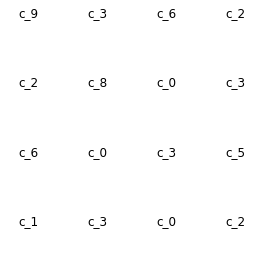

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.7895%
Saved checkpoint: checkpoints\it_160\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_160\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_160\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_160\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 161

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_161\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_161\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_161\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_161\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_161\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


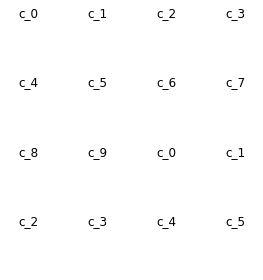

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_161\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_161\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_161\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_161\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_161\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


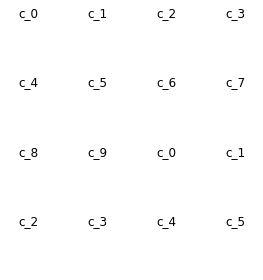

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_161\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_161\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_161\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_161\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_161\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


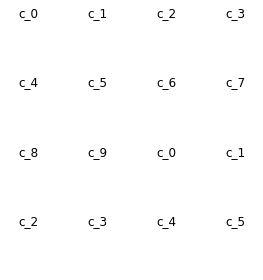

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_161\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_161\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_161\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_161\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_161\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


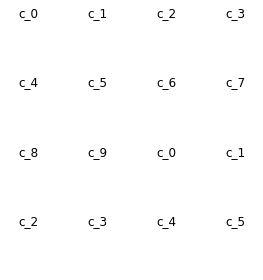

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_161\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_161\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_161\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_161\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_161\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_161\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


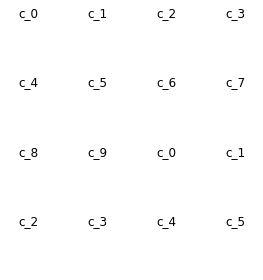

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


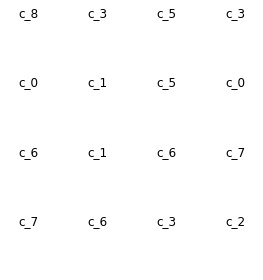

train_acc=10.2183%
accuracy of blackbox on G dataset: 12.2000%
Saved checkpoint: checkpoints\it_161\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_161\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_161\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_161\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


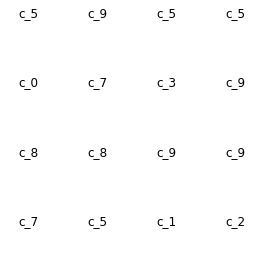

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.6250%
Saved checkpoint: checkpoints\it_161\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_161\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_161\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_161\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 162

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_162\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_162\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_162\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_162\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_162\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


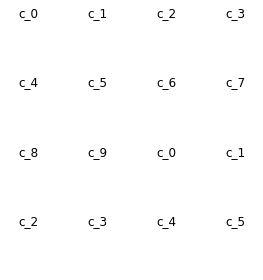

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_162\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_162\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_162\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_162\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_162\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


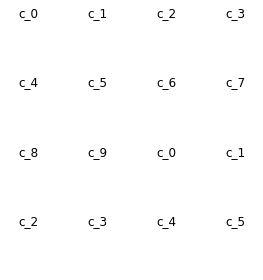

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_162\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_162\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_162\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_162\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_162\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


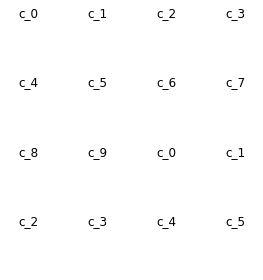

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_162\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_162\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_162\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_162\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_162\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


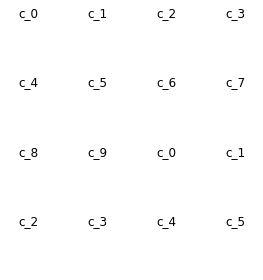

--------------------
Epoch 5/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_162\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_162\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_162\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_162\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_162\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_162\c_generator_checkpoint\ckpt-5
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


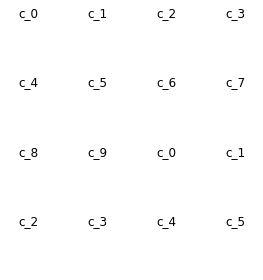

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


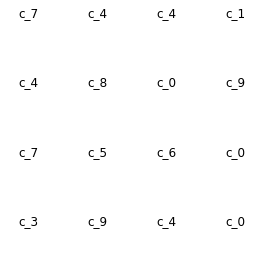

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 8.8000%
Saved checkpoint: checkpoints\it_162\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_162\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_162\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_162\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


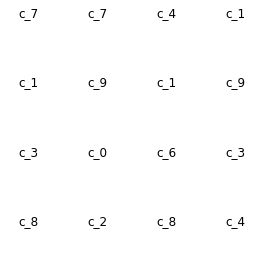

train_acc=0.0000%
accuracy of blackbox on G dataset: 8.0769%
Saved checkpoint: checkpoints\it_162\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_162\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_162\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_162\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 163

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_163\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_163\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_163\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


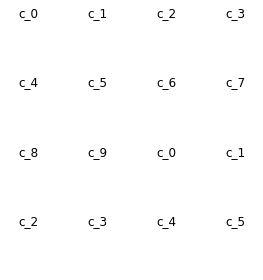

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_163\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_163\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_163\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


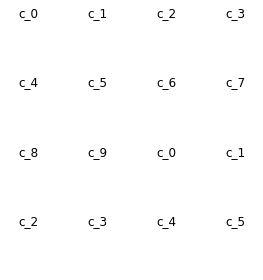

--------------------
Epoch 3/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_163\discriminator_checkpoint\ckpt-3
Saved D checkpoint: checkpoints\it_163\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_163\c_generator_checkpoint\ckpt-3
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


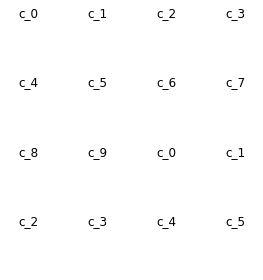

--------------------
Epoch 4/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_163\discriminator_checkpoint\ckpt-4
Saved D checkpoint: checkpoints\it_163\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_163\c_generator_checkpoint\ckpt-4
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


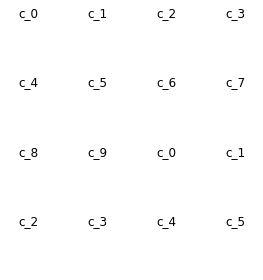

--------------------
Epoch 5/25


g_acc=0.09, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_163\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_163\discriminator_checkpoint\ckpt-5
Saved D checkpoint: checkpoints\it_163\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_163\c_generator_checkpoint\ckpt-5


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


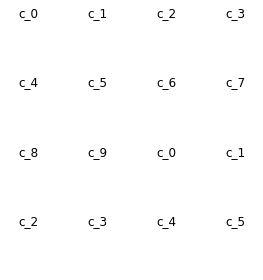

--------------------
Epoch 6/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_163\discriminator_checkpoint\ckpt-6
Saved D checkpoint: checkpoints\it_163\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_163\c_generator_checkpoint\ckpt-6


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


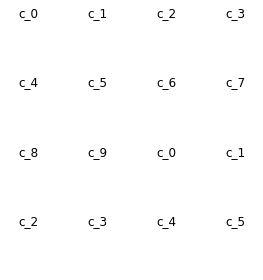

--------------------
Epoch 7/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_163\discriminator_checkpoint\ckpt-7
Saved D checkpoint: checkpoints\it_163\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_163\c_generator_checkpoint\ckpt-7
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


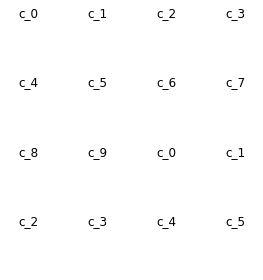

--------------------
Epoch 8/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_163\discriminator_checkpoint\ckpt-8
Saved D checkpoint: checkpoints\it_163\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_163\c_generator_checkpoint\ckpt-8
> no change inc: 2/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


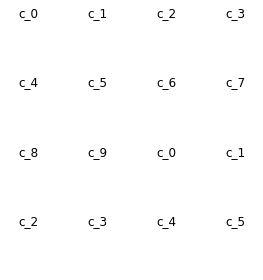

--------------------
Epoch 9/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_163\discriminator_checkpoint\ckpt-9
Saved D checkpoint: checkpoints\it_163\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_163\c_generator_checkpoint\ckpt-9
> no change inc: 3/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


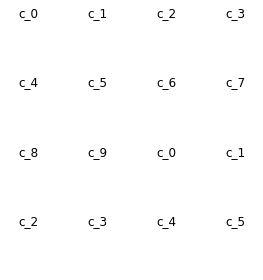

--------------------
Epoch 10/25


g_acc=0.11, g_loss=2.36, d_loss=0.74
Restored D to checkpoint from checkpoints\it_163\discriminator_checkpoint
Saved D checkpoint: checkpoints\it_163\discriminator_checkpoint\ckpt-10
Saved D checkpoint: checkpoints\it_163\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_163\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_163\c_generator_checkpoint\ckpt-10
> no change inc: 4/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


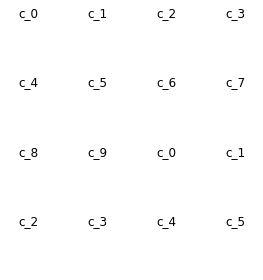

** Early stop! **

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 4: Training Split Learning (and gathering Black-box labels)


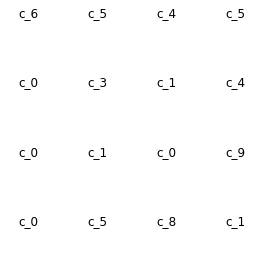

only querying this iteration


train_acc=0.0000%
accuracy of blackbox on G dataset: 7.6000%
Saved checkpoint: checkpoints\it_163\blackbox_checkpoint\ckpt-1
Saved checkpoint: checkpoints\it_163\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_163\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_163\split_end_model_checkpoint\checkpoint
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5: Refining D
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.1: FGSM
Fast Gradient Sign Method based on L1 norm


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 5.2: Gathering Blackbox labels for the augmented images


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


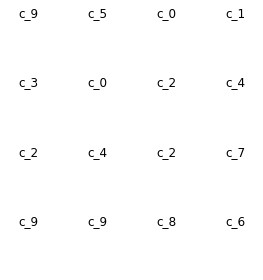

train_acc=0.0000%
accuracy of blackbox on G dataset: 7.9444%
Saved checkpoint: checkpoints\it_163\blackbox_checkpoint\ckpt-2
Saved checkpoint: checkpoints\it_163\split_start_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_163\split_middle_model_checkpoint\checkpoint
Saved checkpoint: checkpoints\it_163\split_end_model_checkpoint\checkpoint


d_refine_acc: 1.000
D Test Accuracy: 0.101 | Loss: 2.303

****************************************
Iteration 164

D Test Accuracy: 0.101 | Loss: 2.303

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
SKIPPED STEPS 1 & 2
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Step 3.2: Training cG
 - performed until cG converges with the current D


--------------------
Epoch 1/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_164\discriminator_checkpoint\ckpt-1
Saved D checkpoint: checkpoints\it_164\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_164\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_164\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_164\c_generator_checkpoint\ckpt-1


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


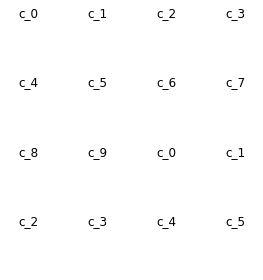

--------------------
Epoch 2/25


g_acc=0.10, g_loss=2.36, d_loss=0.74
Saved D checkpoint: checkpoints\it_164\discriminator_checkpoint\ckpt-2
Saved D checkpoint: checkpoints\it_164\d_start_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_164\d_middle_model_checkpoint\checkpoint
Saved D checkpoint: checkpoints\it_164\d_end_model_checkpoint\checkpoint
Saved c_G checkpoint: checkpoints\it_164\c_generator_checkpoint\ckpt-2
> no change inc: 1/4


C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:397: UserWarning: Warning: converting a masked element to nan.
  dv = (np.float64(self.norm.vmax) -
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:398: UserWarning: Warning: converting a masked element to nan.
  np.float64(self.norm.vmin))
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:405: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\image.py:410: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
C:\Users\zharr\Anaconda3\lib\site-packages\matplotlib\colors.py:885: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
C:\Users\zharr\Anaconda3\lib\site-packages\numpy\ma\core.py:713: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


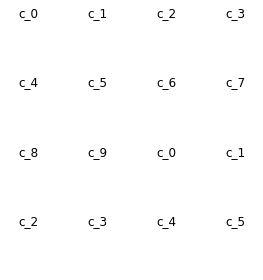

--------------------
Epoch 3/25


SystemError: PyEval_EvalFrameEx returned a result with an error set

In [23]:
slg = SystemTrainer(split_training_params, cgan_training_params, fgsm_training_params, attack_params)
slg.train_system()